In [1]:
!pip cache purge

Files removed: 94 (96.1 MB)


In [2]:
import os
from pathlib import Path
PROJECT_ROOT = Path(r"C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine")
os.chdir(PROJECT_ROOT)
print(f"Current working directory: {Path.cwd()}")

Current working directory: C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine


In [3]:
%pip install numpy pandas matplotlib scikit-learn
%pip install lightgbm xgboost
%pip install torch --index-url https://download.pytorch.org/whl/cu121  
%pip install cvxpy
%pip install stable-baselines3[extra]  
%pip install tqdm

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://download.pytorch.org/whl/cu121Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [4]:
import random
import math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
import xgboost as xgb
import torch
import torch.nn as nn
import cvxpy as cp
try:
    from cvxpylayers.torch import CvxpyLayer
    HAS_CVXPYLAYERS = True
except Exception as e:
    HAS_CVXPYLAYERS = False
    print("cvxpylayers not available, using non-differentiable / closed-form SPO fallback.")
    print(f"Reason: {e}")
try:
    from stable_baselines3 import PPO
    HAS_SB3 = True
except ImportError:
    HAS_SB3 = False
    print("stable-baselines3 not installed; RL will be added later.")
plt.style.use("ggplot")

cvxpylayers not available, using non-differentiable / closed-form SPO fallback.
Reason: No module named 'cvxpylayers'


In [5]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")
RANDOM_SEED = 42
TRAIN_START = "2015-01-01"
VAL_START   = "2020-01-01"
TEST_START  = "2022-01-01"
TEST_END    = "2024-12-31"
UNIVERSE_TICKERS = [
    "AAPL", "MSFT", "GOOG", "AMZN", "META",
    "NVDA", "TSLA", "JPM", "XOM", "UNH"
]
print(f"Universe size: {len(UNIVERSE_TICKERS)} assets")

Using device: cuda
Universe size: 10 assets


In [6]:
def set_seed(seed: int = 42):
    """Set RNG seeds for reproducibility."""
    global RANDOM_SEED
    RANDOM_SEED = seed
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    print(f"Seeds set to {seed}")
def rolling_sharpe(returns: pd.Series, window: int = 252, risk_free: float = 0.0):
    """
    Compute rolling Sharpe ratio for a daily returns series.
    returns: pd.Series of daily returns
    window: rolling window size in days
    risk_free: daily risk free rate (approx, leave 0.0 for now)
    """
    excess = returns - risk_free
    roll_mean = excess.rolling(window).mean()
    roll_std = excess.rolling(window).std(ddof=0)
    sharpe = roll_mean / (roll_std + 1e-8)
    return sharpe
def plot_equity_curve(
    equity_curve: pd.Series,
    benchmark_curve: pd.Series | None = None,
    title: str = "Equity Curve"
):
    """
    Plot equity curve with optional benchmark.
    equity_curve: cumulative portfolio value over time
    benchmark_curve: optional benchmark cumulative value
    """
    fig, ax = plt.subplots(figsize=(10, 5))
    equity_curve.plot(ax=ax, label="Strategy")
    if benchmark_curve is not None:
        benchmark_curve.plot(ax=ax, label="Benchmark", alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel("Date")
    ax.set_ylabel("Cumulative Value")
    ax.legend()
    plt.tight_layout()
    plt.show()
def describe_split_dates():
    """Print the configured train/val/test split dates."""
    print("Data split configuration:")
    print(f"  Train start: {TRAIN_START}")
    print(f"  Val start:   {VAL_START}")
    print(f"  Test start:  {TEST_START}")
    print(f"  Test end:    {TEST_END}")

In [7]:
set_seed(42)
describe_split_dates()
print(f"cvxpylayers available: {HAS_CVXPYLAYERS}")
print(f"stable-baselines3 available: {HAS_SB3}")
print(f"Tickers: {UNIVERSE_TICKERS}")

Seeds set to 42
Data split configuration:
  Train start: 2015-01-01
  Val start:   2020-01-01
  Test start:  2022-01-01
  Test end:    2024-12-31
cvxpylayers available: False
stable-baselines3 available: True
Tickers: ['AAPL', 'MSFT', 'GOOG', 'AMZN', 'META', 'NVDA', 'TSLA', 'JPM', 'XOM', 'UNH']


In [8]:
def compute_drawdown(equity_curve: pd.Series) -> pd.Series:
    """
    Compute drawdown series from an equity curve.
    equity_curve: pd.Series of cumulative portfolio value over time.
    Returns a pd.Series of drawdowns (0 = no drawdown, negative = drawdown).
    """
    running_max = equity_curve.cummax()
    drawdown = (equity_curve / running_max) - 1.0
    return drawdown
def max_drawdown(equity_curve: pd.Series) -> float:
    """
    Compute max drawdown (as a negative number).
    """
    dd = compute_drawdown(equity_curve)
    return float(dd.min())
def annualized_sharpe(
    returns: pd.Series, 
    periods_per_year: int = 252, 
    risk_free: float = 0.0
) -> float:
    """
    Compute annualized Sharpe ratio from a returns series.
    returns: pd.Series of per-period returns
    periods_per_year: trading periods per year (252 for daily)
    risk_free: per-period risk free rate (leave 0 for now)
    """
    excess = returns - risk_free
    mu = excess.mean()
    sigma = excess.std(ddof=0) + 1e-8
    sharpe = (mu / sigma) * np.sqrt(periods_per_year)
    return float(sharpe)
def summarize_backtest(
    equity_curve: pd.Series,
    freq: str = "D",
    label: str = "Strategy"
) -> dict:
    """
    Compute basic performance stats for a backtest.
    Returns a dict so you can easily log/print/store later.
    """
    returns = equity_curve.pct_change().dropna()
    stats = {
        "label": label,
        "start": equity_curve.index[0],
        "end": equity_curve.index[-1],
        "n_periods": len(returns),
        "cumulative_return": float(equity_curve.iloc[-1] / equity_curve.iloc[0] - 1.0),
        "annualized_sharpe": annualized_sharpe(returns),
        "max_drawdown": max_drawdown(equity_curve),
    }
    print(f"[{label}] {stats}")
    return stats

In [9]:
from dataclasses import dataclass, asdict
@dataclass
class TimeConfig:
    train_start: str = TRAIN_START
    val_start: str = VAL_START
    test_start: str = TEST_START
    test_end: str = TEST_END
@dataclass
class UniverseConfig:
    tickers: list[str] = tuple(UNIVERSE_TICKERS)
    base_currency: str = "USD"
    periods_per_year: int = 252
@dataclass
class EnvConfig:
    project_root: Path = PROJECT_ROOT
    device: torch.device = DEVICE
    random_seed: int = RANDOM_SEED
    has_cvxpylayers: bool = HAS_CVXPYLAYERS
    has_sb3: bool = HAS_SB3
@dataclass
class SPOConfig:
    base_lambda: float = 5.0          
    base_uncertainty_radius: float = 0.05
    max_weight: float = 0.2
    turnover_penalty: float = 0.001
TIME_CFG = TimeConfig()
UNIVERSE_CFG = UniverseConfig()
ENV_CFG = EnvConfig()
SPO_CFG = SPOConfig()
def print_config_summary():
    print("=== TimeConfig ===")
    print(asdict(TIME_CFG))
    print("\n=== UniverseConfig ===")
    print(asdict(UNIVERSE_CFG))
    print("\n=== EnvConfig ===")
    print({
        "project_root": str(ENV_CFG.project_root),
        "device": str(ENV_CFG.device),
        "random_seed": ENV_CFG.random_seed,
        "has_cvxpylayers": ENV_CFG.has_cvxpylayers,
        "has_sb3": ENV_CFG.has_sb3,
    })
    print("\n=== SPOConfig (defaults) ===")
    print(asdict(SPO_CFG))
print_config_summary()

=== TimeConfig ===
{'train_start': '2015-01-01', 'val_start': '2020-01-01', 'test_start': '2022-01-01', 'test_end': '2024-12-31'}

=== UniverseConfig ===
{'tickers': ('AAPL', 'MSFT', 'GOOG', 'AMZN', 'META', 'NVDA', 'TSLA', 'JPM', 'XOM', 'UNH'), 'base_currency': 'USD', 'periods_per_year': 252}

=== EnvConfig ===
{'project_root': 'C:\\Users\\aniru\\OneDrive\\Desktop\\ML tutorial\\Targeted SPO Optimization Engine', 'device': 'cuda', 'random_seed': 42, 'has_cvxpylayers': False, 'has_sb3': True}

=== SPOConfig (defaults) ===
{'base_lambda': 5.0, 'base_uncertainty_radius': 0.05, 'max_weight': 0.2, 'turnover_penalty': 0.001}


In [13]:
%pip install yfinance
from pathlib import Path
import numpy as np
import pandas as pd
import yfinance as yf
DATA_DIR = PROJECT_ROOT / "data"
DATA_DIR.mkdir(parents=True, exist_ok=True)
PRICE_CSV_PATH = DATA_DIR / "prices.csv"
def download_price_data_yf(
    tickers: list[str] = list(UNIVERSE_CFG.tickers),
    start: str = "2010-01-01",
    end: str | None = None,
) -> pd.DataFrame:
    """
    Download adjusted close prices from Yahoo Finance for the given tickers.
    Saves to PRICE_CSV_PATH and returns a wide price panel:
        index: Date (DatetimeIndex)
        columns: tickers
    """
    print(f"Downloading Yahoo Finance data for: {tickers}")
    df = yf.download(
        tickers=tickers,
        start=start,
        end=end,
        auto_adjust=False,
        progress=True,
    )
    if isinstance(df.columns, pd.MultiIndex):
        if "Adj Close" not in df.columns.levels[0]:
            raise ValueError(
                f"Expected 'Adj Close' level in yfinance columns, got levels: {df.columns.levels[0]}"
            )
        df = df["Adj Close"]
    df = df.dropna(how="all")
    df.index.name = "Date"
    df.to_csv(PRICE_CSV_PATH)
    print(f"Saved downloaded prices to {PRICE_CSV_PATH}")
    return df
def load_price_data(
    path: Path = PRICE_CSV_PATH,
    universe: list[str] = list(UNIVERSE_CFG.tickers),
    date_col: str = "Date",
    min_history_days: int = 252,
) -> pd.DataFrame:
    """
    Load price data into a wide price panel:
        index: DatetimeIndex
        columns: tickers
    If the CSV does not exist, auto-downloads from Yahoo Finance.
    """
    if not path.exists():
        print(f"Price file not found at {path}. Auto-downloading with yfinance.")
        df = download_price_data_yf(
            tickers=universe,
            start="2010-01-01",
            end=TIME_CFG.test_end,
        )
    else:
        print(f"Loading price data from: {path}")
        df = pd.read_csv(path)
        if date_col not in df.columns:
            raise ValueError(
                f"Expected a date column named '{date_col}' in {path}, "
                f"found columns: {df.columns.tolist()}"
            )
        df[date_col] = pd.to_datetime(df[date_col])
        df = df.set_index(date_col).sort_index()
    available_tickers = [t for t in universe if t in df.columns]
    missing_tickers = [t for t in universe if t not in df.columns]
    if missing_tickers:
        print(
            f"Warning: these tickers are not in the price data and will be skipped: {missing_tickers}"
        )
    if not available_tickers:
        raise ValueError("None of the universe tickers are present in the price data.")
    df = df[available_tickers]
    df = df[~df.index.duplicated(keep="first")]
    df = df.sort_index()
    df = df.ffill().dropna(how="all")
    valid_counts = df.notna().sum()
    long_enough = valid_counts[valid_counts >= min_history_days].index.tolist()
    if len(long_enough) < len(available_tickers):
        dropped = sorted(set(available_tickers) - set(long_enough))
        print(
            f"Dropping tickers with less than {min_history_days} observations: {dropped}"
        )
    df = df[long_enough]
    print(f"Loaded raw price panel with shape {df.shape} (dates x assets)")
    print(f"Initial tickers after history filter: {df.columns.tolist()}")
    return df
def align_to_trading_calendar(
    prices_df: pd.DataFrame,
    freq: str = "B",
) -> pd.DataFrame:
    """
    Align price panel to a regular trading calendar and enforce a full panel.
    Steps:
    - Reindex to full business-day calendar between min/max dates.
    - Forward-fill prices.
    - Drop any remaining rows that contain NaNs in any asset:
        -> final panel: every date has prices for all assets.
    """
    prices_df = prices_df.sort_index()
    idx_full = pd.date_range(
        start=prices_df.index.min(),
        end=prices_df.index.max(),
        freq= freq,
    )
    prices_aligned = prices_df.reindex(idx_full)
    prices_aligned = prices_aligned.ffill()
    n_before = len(prices_aligned)
    prices_aligned = prices_aligned.dropna(axis=0, how="any")
    n_after = len(prices_aligned)
    prices_aligned.index.name = prices_df.index.name
    print(f"Aligned prices to calendar with {n_after} rows (dropped {n_before - n_after} rows with NaNs).")
    return prices_aligned
def compute_basic_features(
    prices_df: pd.DataFrame,
    periods_per_year: int = UNIVERSE_CFG.periods_per_year,
    vol_windows: tuple[int, ...] = (21, 63),
) -> dict:
    """
    Compute basic features from price data.
    Returns a dict of DataFrames:
        'prices'        : price panel
        'returns'       : simple returns
        'log_returns'   : log returns
        'rolling_vol_X' : annualized rolling vol for window X
    """
    prices_df = prices_df.sort_index()
    returns_df = prices_df.pct_change().fillna(0.0)
    log_returns_df = np.log(prices_df / prices_df.shift(1))
    log_returns_df = log_returns_df.replace([np.inf, -np.inf], np.nan).fillna(0.0)
    features = {
        "prices": prices_df,
        "returns": returns_df,
        "log_returns": log_returns_df,
    }
    for window in vol_windows:
        rolling_std = returns_df.rolling(window).std(ddof=0)
        rolling_vol = rolling_std * np.sqrt(periods_per_year)
        features[f"rolling_vol_{window}"] = rolling_vol
    return features
prices_raw = load_price_data()
prices_df = align_to_trading_calendar(prices_raw)
basic_features = compute_basic_features(prices_df)
prices_df = basic_features["prices"]
returns_df = basic_features["returns"]
print("Segment 1 core pipeline complete.")
print(f"prices_df shape:  {prices_df.shape}")
print(f"returns_df shape: {returns_df.shape}")
UNIVERSE_CFG = UniverseConfig(
    tickers=list(prices_df.columns),
    base_currency=UNIVERSE_CFG.base_currency,
    periods_per_year=UNIVERSE_CFG.periods_per_year,
)
print("\nUpdated UniverseConfig tickers to match loaded data:")
print(UNIVERSE_CFG.tickers)
def assert_basic_data_quality(
    prices_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    min_std_threshold: float = 1e-6,
):
    """
    Run basic sanity checks on prices and returns.
    - No NaNs in prices or returns (after cleaning).
    - Warn on constant / near-constant assets.
    """
    print("\nRunning basic data quality checks...")
    if prices_df.isna().any().any():
        n_nan = prices_df.isna().sum().sum()
        raise ValueError(f"Found {n_nan} NaNs in prices_df after preprocessing.")
    if returns_df.isna().any().any():
        n_nan = returns_df.isna().sum().sum()
        raise ValueError(f"Found {n_nan} NaNs in returns_df after preprocessing.")
    std_per_asset = returns_df.std()
    low_var_assets = std_per_asset[std_per_asset < min_std_threshold].index.tolist()
    if low_var_assets:
        print(
            f"Warning: assets with near-zero return std detected "
            f"(might be stale or illiquid): {low_var_assets}"
        )
    else:
        print("No near-zero variance assets detected.")
    print("Data quality checks passed.")
def inspect_basic_stats(
    prices_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    n_head: int = 5,
):
    """
    Print simple descriptive info for sanity.
    """
    print("\n=== Prices head ===")
    print(prices_df.head(n_head))
    print("\n=== Returns head ===")
    print(returns_df.head(n_head))
    print("\n=== Returns summary stats ===")
    print(returns_df.describe().T[["mean", "std", "min", "max"]])
def get_time_split_masks(
    index: pd.DatetimeIndex,
    time_cfg: TimeConfig = TIME_CFG,
) -> dict:
    """
    Build boolean masks for train, validation, and test splits
    based on the global TimeConfig.
    Returns a dict of boolean arrays with keys:
        'train', 'val', 'test'
    """
    idx = pd.to_datetime(index)
    train_mask = (idx >= pd.to_datetime(time_cfg.train_start)) & (
        idx < pd.to_datetime(time_cfg.val_start)
    )
    val_mask = (idx >= pd.to_datetime(time_cfg.val_start)) & (
        idx < pd.to_datetime(time_cfg.test_start)
    )
    test_mask = (idx >= pd.to_datetime(time_cfg.test_start)) & (
        idx <= pd.to_datetime(time_cfg.test_end)
    )
    print("\nTime split masks summary:")
    print(f"  Train: {train_mask.sum()} points")
    print(f"  Val:   {val_mask.sum()} points")
    print(f"  Test:  {test_mask.sum()} points")
    return {
        "train": train_mask,
        "val": val_mask,
        "test": test_mask,
    }
assert_basic_data_quality(prices_df, returns_df)
inspect_basic_stats(prices_df, returns_df)
split_masks = get_time_split_masks(prices_df.index, TIME_CFG)
print("\nSegment 1 fully complete: prices_df, returns_df, and split masks are ready.")

Note: you may need to restart the kernel to use updated packages.
Loading price data from: C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\data\prices.csv
Loaded raw price panel with shape (3773, 10) (dates x assets)
Initial tickers after history filter: ['AAPL', 'MSFT', 'GOOG', 'AMZN', 'META', 'NVDA', 'TSLA', 'JPM', 'XOM', 'UNH']
Aligned prices to calendar with 3292 rows (dropped 619 rows with NaNs).
Segment 1 core pipeline complete.
prices_df shape:  (3292, 10)
returns_df shape: (3292, 10)

Updated UniverseConfig tickers to match loaded data:
['AAPL', 'MSFT', 'GOOG', 'AMZN', 'META', 'NVDA', 'TSLA', 'JPM', 'XOM', 'UNH']

Running basic data quality checks...
No near-zero variance assets detected.
Data quality checks passed.

=== Prices head ===
                 AAPL       MSFT       GOOG     AMZN       META      NVDA  \
Date                                                                        
2012-05-18  15.906651  23.269142  14.852310  10.6925  37.99577

In [14]:
from dataclasses import dataclass
import numpy as np
import pandas as pd
TEXT_FEATURE_COLUMNS = ["global_sentiment", "macro_tone", "liquidity_risk"]
@dataclass
class TextFeatureConfig:
    """
    Configuration for MVP text / RAG stub features.
    These are synthetic features that approximate what a real
    RAG + LLM pipeline might generate numerically.
    """
    random_seed: int = RANDOM_SEED
    mean_reversion: float = 0.9      
    shock_scale: float = 0.15       
    clip_min: float = -1.0          
    clip_max: float = 1.0           
    base_macro_bias: float = 0.1     
    base_liquidity_bias: float = -0.1  
TEXT_FEAT_CFG = TextFeatureConfig()
def _simulate_smooth_series(
    index: pd.DatetimeIndex,
    cfg: TextFeatureConfig,
    base_bias: float = 0.0,
) -> pd.Series:
    """
    Internal helper to simulate a smooth, bounded AR(1)-style series.
    This approximates something like:
      - global sentiment
      - macro tone
      - liquidity stress
    """
    rng = np.random.default_rng(cfg.random_seed + hash(base_bias) % 10000)
    values = []
    x = 0.0
    for _ in range(len(index)):
        shock = rng.normal(loc=0.0, scale=cfg.shock_scale)
        x = cfg.mean_reversion * x + shock + base_bias
        x = np.clip(x, cfg.clip_min, cfg.clip_max)
        values.append(x)
    return pd.Series(values, index=index)
def build_mvp_text_feature_panel(
    index: pd.DatetimeIndex,
    cfg: TextFeatureConfig = TEXT_FEAT_CFG,
) -> pd.DataFrame:
    """
    Build a simple panel of daily text-derived features for the whole market.
    For MVP, these are synthetic but stable time series:
      - global_sentiment: generic market sentiment ([-1, 1])
      - macro_tone: macro / policy tone ([-1, 1])
      - liquidity_risk: liquidity stress ([-1, 1], higher = more risk)
    Later this can be replaced with real RAG + LLM derived features.
    """
    index = pd.to_datetime(index)
    index = index.sort_values()
    global_sentiment = _simulate_smooth_series(
        index=index,
        cfg=cfg,
        base_bias=0.0,
    )
    macro_tone = _simulate_smooth_series(
        index=index,
        cfg=cfg,
        base_bias=cfg.base_macro_bias,
    )
    liquidity_risk = _simulate_smooth_series(
        index=index,
        cfg=cfg,
        base_bias=cfg.base_liquidity_bias,
    )
    df = pd.DataFrame(
        {
            "global_sentiment": global_sentiment,
            "macro_tone": macro_tone,
            "liquidity_risk": liquidity_risk,
        },
        index=index,
    )
    df.index.name = prices_df.index.name or "Date"
    print(f"Built MVP text feature panel with shape {df.shape}")
    return df
def get_text_features_for_date(
    date: pd.Timestamp | str,
    text_features_df: pd.DataFrame,
) -> dict:
    """
    MVP stub:
    Given a date, return a dict of numeric text features.
    Later this will call:
      - retrieve_docs(date, asset)
      - LLM to numeric features
    For now, it just looks up the precomputed synthetic series.
    If the exact date is missing, it uses the last available date before it.
    """
    if not isinstance(date, pd.Timestamp):
        date = pd.to_datetime(date)
    idx = text_features_df.index
    if date in idx:
        row = text_features_df.loc[date]
    else:
        prev_dates = idx[idx <= date]
        if prev_dates.empty:
            raise ValueError(f"No text features available on or before {date}.")
        row = text_features_df.loc[prev_dates.max()]
    return {
        "global_sentiment": float(row["global_sentiment"]),
        "macro_tone": float(row["macro_tone"]),
        "liquidity_risk": float(row["liquidity_risk"]),
    }
def build_vector_store_stub(*args, **kwargs):
    """
    Placeholder for future RAG vector store construction.
    In the real system this will:
      - ingest docs
      - chunk and embed text
      - build a vector index (FAISS, Chroma, etc)
    """
    print("build_vector_store_stub called. Real RAG infra not implemented yet.")
def retrieve_docs_stub(date, asset=None, top_k: int = 5):
    """
    Placeholder for RAG retrieval.
    In the real system this will:
      - query the vector store for docs relevant to (date, asset)
    """
    print(f"retrieve_docs_stub(date={date}, asset={asset}, top_k={top_k}) called.")
    return []
def llm_to_numeric_features_stub(docs) -> dict:
    """
    Placeholder for mapping raw text docs to numeric factors.
    Real version will call an LLM and parse structured outputs.
    """
    print("llm_to_numeric_features_stub called. Returning zeros as placeholder.")
    return {
        "global_sentiment": 0.0,
        "macro_tone": 0.0,
        "liquidity_risk": 0.0,
    }
text_features_df = build_mvp_text_feature_panel(prices_df.index, TEXT_FEAT_CFG)
print("\nHead of text_features_df:")
print(text_features_df.head())
some_date = prices_df.index[len(prices_df) // 2]
print(f"\nExample text features for {some_date.date()}:")
print(get_text_features_for_date(some_date, text_features_df))
print("\nSegment 2 fully complete: synthetic text feature panel and per-date accessor ready.")

Built MVP text feature panel with shape (3292, 3)

Head of text_features_df:
            global_sentiment  macro_tone  liquidity_risk
Date                                                    
2012-05-18          0.045708   -0.138052       -0.197952
2012-05-21         -0.114861    0.018378       -0.182811
2012-05-22          0.009193    0.308068       -0.425361
2012-05-23          0.149358    0.247902       -0.493286
2012-05-24         -0.158233    0.330009       -0.262901

Example text features for 2018-09-10:
{'global_sentiment': -0.3935782617362562, 'macro_tone': 1.0, 'liquidity_risk': -0.9200099247022038}

Segment 2 fully complete: synthetic text feature panel and per-date accessor ready.


In [15]:
from dataclasses import dataclass
from pathlib import Path
@dataclass
class RAGConfig:
    """
    Placeholder config for future real RAG pipeline.
    For now this is mostly documentation, but later it will
    control:
      - where vector stores live
      - which embedding model to use
      - top_k retrieval etc.
    """
    enabled: bool = False
    vector_store_dir: Path = PROJECT_ROOT / "rag_store"
    embedding_model_name: str = "sentence-transformers/all-MiniLM-L6-v2"
    top_k: int = 8
RAG_CFG = RAGConfig()
print("\nRAG config stub:")
print(RAG_CFG)
def get_asset_text_features_for_date(
    date: pd.Timestamp | str,
    asset: str,
    text_features_df: pd.DataFrame = text_features_df,
    use_global_only: bool = True,
) -> dict:
    """
    Asset-level wrapper around get_text_features_for_date.
    MVP behavior:
      - Ignores `asset` and just returns global series
      - This lets downstream code already depend on a
        (date, asset) -> dict interface.
    Future behavior (when RAG is real):
      - Use (date, asset) to retrieve docs from vector store
      - Call LLM to turn docs into numeric factors
      - Possibly combine global + asset-specific features
    """
    base_feats = get_text_features_for_date(date, text_features_df)
    base_feats_with_asset = {
        **base_feats,
        "asset": asset,
    }
    return base_feats_with_asset
def build_text_feature_panel_for_assets(
    text_features_df: pd.DataFrame,
    universe: list[str] | None = None,
) -> pd.DataFrame:
    """
    Broadcast the global text feature series across all assets in the universe.
    Returns:
        DataFrame with:
            index: Date
            columns: MultiIndex [asset, feature_name]
    This is a convenient structure for later ML feature assembly:
      - You can stack it with numeric features that are also (Date x asset)
      - Or reshape to (T * N, F) for model training.
    """
    if universe is None:
        universe = list(UNIVERSE_CFG.tickers)
    text_features_df = text_features_df.sort_index()
    frames = []
    for asset in universe:
        df_asset = text_features_df.copy()
        df_asset.columns = pd.MultiIndex.from_product(
            [ [asset], df_asset.columns ],
            names=["asset", "feature"]
        )
        frames.append(df_asset)
    panel = pd.concat(frames, axis=1).sort_index(axis=1)
    print(
        f"Built asset-level text feature panel with shape {panel.shape} "
        f"(dates x (assets * features))"
    )
    return panel
text_features_asset_panel = build_text_feature_panel_for_assets(
    text_features_df,
    universe=list(UNIVERSE_CFG.tickers),
)
print("\nHead of text_features_asset_panel (first 3 dates):")
print(text_features_asset_panel.head(3))
print("\nSegment 2: RAG stubs + text feature panel (global + per-asset) fully ready.")


RAG config stub:
RAGConfig(enabled=False, vector_store_dir=WindowsPath('C:/Users/aniru/OneDrive/Desktop/ML tutorial/Targeted SPO Optimization Engine/rag_store'), embedding_model_name='sentence-transformers/all-MiniLM-L6-v2', top_k=8)
Built asset-level text feature panel with shape (3292, 30) (dates x (assets * features))

Head of text_features_asset_panel (first 3 dates):
asset                  AAPL                                       AMZN  \
feature    global_sentiment liquidity_risk macro_tone global_sentiment   
Date                                                                     
2012-05-18         0.045708      -0.197952  -0.138052         0.045708   
2012-05-21        -0.114861      -0.182811   0.018378        -0.114861   
2012-05-22         0.009193      -0.425361   0.308068         0.009193   

asset                                            GOOG                 \
feature    liquidity_risk macro_tone global_sentiment liquidity_risk   
Date                               

In [23]:
from dataclasses import dataclass
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
@dataclass
class FeatureEngineeringConfig:
    """
    Configuration for ML/DL feature engineering.
    """
    lookback_windows: tuple[int, ...] = (5, 10, 20)   
    label_horizon: int = 5                           
    use_log_returns: bool = True                     
    include_text_features: bool = True                
    min_obs_per_feature: int = 20                     
FEAT_CFG = FeatureEngineeringConfig()
@dataclass
class ScalingConfig:
    """
    Configuration for feature scaling.
    """
    apply_scaling: bool = True
    with_mean: bool = True
    with_std: bool = True
SCALING_CFG = ScalingConfig()
def _cross_sectional_zscore(df: pd.DataFrame) -> pd.DataFrame:
    """
    Compute cross-sectional z-score per date across assets.
    """
    mean = df.mean(axis=1)
    std = df.std(axis=1, ddof=0) + 1e-8
    z = (df.sub(mean, axis=0)).div(std, axis=0)
    return z
def _cross_sectional_rank(df: pd.DataFrame) -> pd.DataFrame:
    """
    Cross-sectional percentile rank (0..1) per date across assets.
    """
    return df.rank(axis=1, pct=True)
def build_feature_matrix(
    prices_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    basic_features: dict,
    text_features_asset_panel: pd.DataFrame,
    split_masks: dict,  
    feature_cfg: FeatureEngineeringConfig = FEAT_CFG,
) -> dict:
    """
    Build feature matrix X and label vector y for ML/DL alpha model.
    Returns a dict with:
        X: np.ndarray [N_samples, n_features]
        y: np.ndarray [N_samples]
        dates: pd.Index (len N_samples)     # label anchor dates t
        assets: pd.Index (len N_samples)
        feature_names: list[str]
        idx_train, idx_val, idx_test (sample indices, NON-LEAKY: split on label end date)
        X_train, y_train, X_val, y_val, X_test, y_test
        label_end_dates: pd.DatetimeIndex for each sample (for debugging)
    """
    prices_df = prices_df.sort_index()
    returns_df = returns_df.sort_index()
    log_returns_df = basic_features.get(
        "log_returns",
        np.log(prices_df / prices_df.shift(1))
    )
    log_returns_df = log_returns_df.replace([np.inf, -np.inf], np.nan).fillna(0.0)
    vol_frames = {
        key: df for key, df in basic_features.items()
        if key.startswith("rolling_vol_")
    }
    feat_wide = {}
    feat_wide["ret_1d"] = returns_df
    for w in feature_cfg.lookback_windows:
        if feature_cfg.use_log_returns:
            roll = log_returns_df.rolling(w).sum().fillna(0.0)
            feat_wide[f"logret_{w}d"] = roll
        else:
            roll = returns_df.rolling(w).sum().fillna(0.0)
            feat_wide[f"ret_{w}d"] = roll
    for w in feature_cfg.lookback_windows:
        ma = prices_df.rolling(w).mean()
        ma_ratio = (prices_df / (ma + 1e-8)) - 1.0
        feat_wide[f"ma_ratio_{w}d"] = ma_ratio
    for name, df_vol in vol_frames.items():
        feat_wide[name] = df_vol
    ret_zscore_xs = _cross_sectional_zscore(returns_df)
    ret_rank_xs   = _cross_sectional_rank(returns_df)
    feat_wide["ret_zscore_xs"] = ret_zscore_xs
    feat_wide["ret_rank_xs"]   = ret_rank_xs
    stacked_series = {}
    for name, df in feat_wide.items():
        stacked_series[name] = df.stack()
    features_df = pd.concat(stacked_series, axis=1)
    features_df.index = features_df.index.set_names(["Date", "Asset"])
    if feature_cfg.include_text_features:
        text_stacked = text_features_asset_panel.stack(level="asset")
        text_stacked.index = text_stacked.index.set_names(["Date", "Asset"])
        features_df = features_df.join(text_stacked, how="inner")
    H = feature_cfg.label_horizon
    future_prices = prices_df.shift(-H)
    future_ret = (future_prices / prices_df) - 1.0
    y_series = future_ret.stack().rename("label")
    y_series.index = y_series.index.set_names(["Date", "Asset"])
    dataset = features_df.join(y_series, how="inner")
    dataset = dataset.dropna(axis=0, how="any")
    if feature_cfg.min_obs_per_feature is not None and feature_cfg.min_obs_per_feature > 0:
        full_dates = prices_df.index.sort_values()
        if len(full_dates) >= feature_cfg.min_obs_per_feature:
            cutoff_date = full_dates[feature_cfg.min_obs_per_feature - 1]
            before = len(dataset)
            date_index_for_cutoff = dataset.index.get_level_values("Date")
            mask_cutoff = date_index_for_cutoff >= cutoff_date
            dataset = dataset[mask_cutoff]
            dropped = before - len(dataset)
            if dropped > 0:
                print(
                    f"Applied min_obs_per_feature={feature_cfg.min_obs_per_feature}, "
                    f"dropped {dropped} early (date, asset) samples."
                )
    y = dataset["label"].to_numpy(dtype=float)
    X = dataset.drop(columns=["label"])
    feature_names = list(X.columns)
    dates_idx  = dataset.index.get_level_values("Date")   
    assets_idx = dataset.index.get_level_values("Asset")
    calendar = prices_df.index
    label_dates = pd.to_datetime(dates_idx)
    label_end_dates = []
    for d in label_dates:
        pos = calendar.get_loc(d)
        end_pos = pos + feature_cfg.label_horizon
        if end_pos >= len(calendar):
            label_end_dates.append(pd.NaT)
        else:
            label_end_dates.append(calendar[end_pos])
    label_end_dates = pd.DatetimeIndex(label_end_dates)
    valid_mask = ~label_end_dates.isna()
    if not valid_mask.all():
        before = len(X)
        X = X[valid_mask]
        y = y[valid_mask]
        dates_idx = dates_idx[valid_mask]
        assets_idx = assets_idx[valid_mask]
        label_end_dates = label_end_dates[valid_mask]
        print(f"Dropped {before - len(X)} samples with invalid label end dates.")
    train_start = pd.to_datetime(TIME_CFG.train_start)
    val_start   = pd.to_datetime(TIME_CFG.val_start)
    test_start  = pd.to_datetime(TIME_CFG.test_start)
    test_end    = pd.to_datetime(TIME_CFG.test_end)
    is_train = (label_end_dates >= train_start) & (label_end_dates <  val_start)
    is_val   = (label_end_dates >= val_start)   & (label_end_dates <  test_start)
    is_test  = (label_end_dates >= test_start)  & (label_end_dates <= test_end)
    idx_all   = np.arange(len(X))
    idx_train = idx_all[is_train]
    idx_val   = idx_all[is_val]
    idx_test  = idx_all[is_test]
    X_np = X.to_numpy(dtype=float)
    X_train, y_train = X_np[idx_train], y[idx_train]
    X_val,   y_val   = X_np[idx_val],   y[idx_val]
    X_test,  y_test  = X_np[idx_test],  y[idx_test]
    print("\nFeature engineering summary (horizon-safe splits):")
    print(f"  Total samples: {len(X_np)}")
    print(f"  n_features:    {X_np.shape[1]}")
    print(f"  Train samples: {len(X_train)}")
    print(f"  Val samples:   {len(X_val)}")
    print(f"  Test samples:  {len(X_test)}")
    return {
        "X": X_np,
        "y": y,
        "dates": dates_idx,
        "assets": assets_idx,
        "feature_names": feature_names,
        "idx_train": idx_train,
        "idx_val": idx_val,
        "idx_test": idx_test,
        "X_train": X_train,
        "y_train": y_train,
        "X_val": X_val,
        "y_val": y_val,
        "X_test": X_test,
        "y_test": y_test,
        "label_end_dates": label_end_dates,
    }

In [24]:
feature_data = build_feature_matrix(
    prices_df=prices_df,
    returns_df=returns_df,
    basic_features=basic_features,
    text_features_asset_panel=text_features_asset_panel,
    split_masks=split_masks,
    feature_cfg=FEAT_CFG,
)
X_train = feature_data["X_train"]
y_train = feature_data["y_train"]
X_val   = feature_data["X_val"]
y_val   = feature_data["y_val"]
X_test  = feature_data["X_test"]
y_test  = feature_data["y_test"]
feature_names = feature_data["feature_names"]
print("\nSegment 3 core complete: X_train, y_train, X_val, y_val, X_test, y_test ready.")
print(f"Example feature names ({len(feature_names)} total):")
print(feature_names[:15])
def scale_feature_splits(
    feature_data: dict,
    scaling_cfg: ScalingConfig = SCALING_CFG,
) -> dict:
    """
    Fit a scaler on X_train and transform train/val/test.
    Adds:
        X_train_scaled, X_val_scaled, X_test_scaled, scaler
    to the returned dict.
    If apply_scaling=False, just returns original dict.
    """
    if not scaling_cfg.apply_scaling:
        print("Scaling disabled; returning original feature_data.")
        return feature_data
    X_train = feature_data["X_train"]
    X_val   = feature_data["X_val"]
    X_test  = feature_data["X_test"]
    scaler = StandardScaler(with_mean=scaling_cfg.with_mean,
                            with_std=scaling_cfg.with_std)
    scaler.fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled   = scaler.transform(X_val)
    X_test_scaled  = scaler.transform(X_test)
    feature_data_scaled = dict(feature_data)  
    feature_data_scaled["X_train_scaled"] = X_train_scaled
    feature_data_scaled["X_val_scaled"]   = X_val_scaled
    feature_data_scaled["X_test_scaled"]  = X_test_scaled
    feature_data_scaled["scaler"]         = scaler
    print("\nScaling summary:")
    print(f"  X_train_scaled shape: {X_train_scaled.shape}")
    print(f"  X_val_scaled shape:   {X_val_scaled.shape}")
    print(f"  X_test_scaled shape:  {X_test_scaled.shape}")
    return feature_data_scaled
feature_data = scale_feature_splits(feature_data, SCALING_CFG)
X_train_scaled = feature_data["X_train_scaled"]
X_val_scaled   = feature_data["X_val_scaled"]
X_test_scaled  = feature_data["X_test_scaled"]
print("\nSegment 3 (scaling) complete.")
def build_time_asset_tensor_view(
    feature_data: dict,
    universe_cfg: UniverseConfig = UNIVERSE_CFG,
) -> dict:
    """
    Build a [T, A, F] tensor view of X and a [T, A] view of y.
    Assumes:
        - Dense (Date x Asset) grid for the dataset
        - dataset index is implicitly encoded by (dates, assets)
    Returns:
        {
            "X_tensor": np.ndarray [T, A, F],
            "y_tensor": np.ndarray [T, A],
            "date_index": pd.DatetimeIndex (len T),
            "asset_index": pd.Index (len A),
        }
    """
    dates = feature_data["dates"]
    assets = feature_data["assets"]
    X_all = feature_data["X"]
    y_all = feature_data["y"]
    unique_dates = pd.Index(sorted(dates.unique()))
    unique_assets = pd.Index(sorted(assets.unique()))
    T = len(unique_dates)
    A = len(unique_assets)
    F = X_all.shape[1]
    mi = pd.MultiIndex.from_arrays([dates, assets], names=["Date", "Asset"])
    row_lookup = pd.Series(np.arange(len(mi)), index=mi)
    X_tensor = np.full((T, A, F), np.nan, dtype=float)
    y_tensor = np.full((T, A), np.nan, dtype=float)
    for ti, d in enumerate(unique_dates):
        for ai, a in enumerate(unique_assets):
            key = (d, a)
            if key in row_lookup.index:
                idx = row_lookup.loc[key]
                X_tensor[ti, ai, :] = X_all[idx]
                y_tensor[ti, ai] = y_all[idx]
    n_missing_X = np.isnan(X_tensor).sum()
    n_missing_y = np.isnan(y_tensor).sum()
    if n_missing_X > 0 or n_missing_y > 0:
        print(
            f"Warning: initial tensor view has missing entries "
            f"(n_missing_X={n_missing_X}, n_missing_y={n_missing_y}). "
            "Filtering out time steps with any NaNs."
        )
        valid_time_mask = (
            ~np.isnan(X_tensor).any(axis=(1, 2))
            & ~np.isnan(y_tensor).any(axis=1)
        )
        T_before = X_tensor.shape[0]
        X_tensor = X_tensor[valid_time_mask]
        y_tensor = y_tensor[valid_time_mask]
        unique_dates = unique_dates[valid_time_mask]
        print(
            f"  Filtered out {T_before - X_tensor.shape[0]} time steps "
            f"with NaNs in tensor view."
        )
    print("\nTime-asset tensor view summary:")
    print(f"  X_tensor shape: {X_tensor.shape}  [T, A, F]")
    print(f"  y_tensor shape: {y_tensor.shape}  [T, A]")
    return {
        "X_tensor": X_tensor,
        "y_tensor": y_tensor,
        "date_index": unique_dates,
        "asset_index": unique_assets,
    }
tensor_view = build_time_asset_tensor_view(feature_data, UNIVERSE_CFG)
X_tensor = tensor_view["X_tensor"]
y_tensor = tensor_view["y_tensor"]
print("\nSegment 3 fully wrapped up:")
print("  - Flat ML splits (train/val/test) ready (horizon-safe)")
print("  - Scaled features ready")
print("  - [T, A, F] tensor view ready for DL")

C:\Users\aniru\AppData\Local\Temp\ipykernel_7824\1747339234.py:94: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  text_stacked = text_features_asset_panel.stack(level="asset")



Feature engineering summary (horizon-safe splits):
  Total samples: 32250
  n_features:    14
  Train samples: 13040
  Val samples:   5230
  Test samples:  7810

Segment 3 core complete: X_train, y_train, X_val, y_val, X_test, y_test ready.
Example feature names (14 total):
['ret_1d', 'logret_5d', 'logret_10d', 'logret_20d', 'ma_ratio_5d', 'ma_ratio_10d', 'ma_ratio_20d', 'rolling_vol_21', 'rolling_vol_63', 'ret_zscore_xs', 'ret_rank_xs', 'global_sentiment', 'liquidity_risk', 'macro_tone']

Scaling summary:
  X_train_scaled shape: (13040, 14)
  X_val_scaled shape:   (5230, 14)
  X_test_scaled shape:  (7810, 14)

Segment 3 (scaling) complete.

Time-asset tensor view summary:
  X_tensor shape: (3225, 10, 14)  [T, A, F]
  y_tensor shape: (3225, 10)  [T, A]

Segment 3 fully wrapped up:
  - Flat ML splits (train/val/test) ready (horizon-safe)
  - Scaled features ready
  - [T, A, F] tensor view ready for DL


Checking split overlaps...
  train ∩ val  size: 0
  train ∩ test size: 0
  val   ∩ test size: 0
Splits are clean. No sample index overlap detected.

[Train]
  n_samples:      13040
  y mean:         0.005064
  y std:          0.040014
  y min / max:    -0.284994  /  0.363287
  first date:     2014-12-25 00:00:00
  last date:      2019-12-24 00:00:00
  n unique dates: 1304
  n unique assets:10

[Val]
  n_samples:      5230
  y mean:         0.009799
  y std:          0.057203
  y min / max:    -0.430459  /  0.564756
  first date:     2019-12-25 00:00:00
  last date:      2021-12-24 00:00:00
  n unique dates: 523
  n unique assets:10

[Test]
  n_samples:      7810
  y mean:         0.004472
  y std:          0.053444
  y min / max:    -0.309781  /  0.441278
  first date:     2021-12-27 00:00:00
  last date:      2024-12-23 00:00:00
  n unique dates: 781
  n unique assets:10


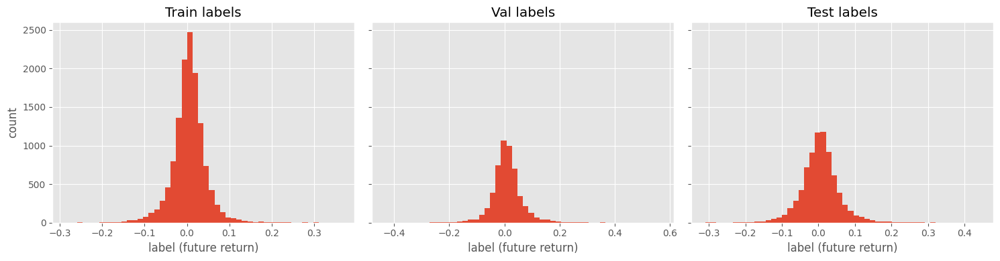


Checking label horizon consistency on 5 random samples:
  META @ 2021-02-11 -> 2021-02-18 stored=-0.003698, recomputed=-0.003698
  AAPL @ 2021-12-02 -> 2021-12-09 stored=0.065950, recomputed=0.065950
  META @ 2023-10-27 -> 2023-11-03 stored=0.060223, recomputed=0.060223
  AAPL @ 2019-06-20 -> 2019-06-27 stored=0.001404, recomputed=0.001404
  XOM @ 2013-09-16 -> 2013-09-23 stored=-0.010376, recomputed=-0.010376

Segment 3 diagnostics complete.


In [25]:
def summarize_splits(feature_data: dict):
    """
    Print high level stats on y for each split
    and check for index overlap between train / val / test.
    """
    idx_train = feature_data["idx_train"]
    idx_val   = feature_data["idx_val"]
    idx_test  = feature_data["idx_test"]
    y         = feature_data["y"]
    dates     = feature_data["dates"]
    assets    = feature_data["assets"]
    def _summ(label, idx):
        if len(idx) == 0:
            print(f"\n[{label}] No samples.")
            return
        y_slice = y[idx]
        print(f"\n[{label}]")
        print(f"  n_samples:      {len(idx)}")
        print(f"  y mean:         {y_slice.mean():.6f}")
        print(f"  y std:          {y_slice.std():.6f}")
        print(f"  y min / max:    {y_slice.min():.6f}  /  {y_slice.max():.6f}")
        print(f"  first date:     {dates[idx].min()}")
        print(f"  last date:      {dates[idx].max()}")
        print(f"  n unique dates: {len(pd.Index(dates[idx]).unique())}")
        print(f"  n unique assets:{len(pd.Index(assets[idx]).unique())}")
    print("Checking split overlaps...")
    inter_train_val  = set(idx_train) & set(idx_val)
    inter_train_test = set(idx_train) & set(idx_test)
    inter_val_test   = set(idx_val) & set(idx_test)
    print(f"  train ∩ val  size: {len(inter_train_val)}")
    print(f"  train ∩ test size: {len(inter_train_test)}")
    print(f"  val   ∩ test size: {len(inter_val_test)}")
    if any([inter_train_val, inter_train_test, inter_val_test]):
        print("Warning: split indices are overlapping. This should not happen.")
    else:
        print("Splits are clean. No sample index overlap detected.")
    _summ("Train", idx_train)
    _summ("Val",   idx_val)
    _summ("Test",  idx_test)
def quick_label_histogram(feature_data: dict, bins: int = 50):
    """
    Quick histogram of label distribution for train / val / test.
    Uses matplotlib inline.
    """
    import matplotlib.pyplot as plt
    y       = feature_data["y"]
    idx_tr  = feature_data["idx_train"]
    idx_val = feature_data["idx_val"]
    idx_te  = feature_data["idx_test"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
    for ax, idx, title in zip(
        axes,
        [idx_tr, idx_val, idx_te],
        ["Train", "Val", "Test"],
    ):
        if len(idx) == 0:
            ax.set_title(f"{title} (empty)")
            ax.axis("off")
            continue
        ax.hist(y[idx], bins=bins)
        ax.set_title(f"{title} labels")
        ax.set_xlabel("label (future return)")
    axes[0].set_ylabel("count")
    plt.tight_layout()
    plt.show()
def check_label_horizon_consistency(
    feature_data: dict,
    label_horizon: int,
    prices_df: pd.DataFrame,
):
    """
    Sanity check that labels are indeed future returns over the given horizon.
    Randomly samples a few (date, asset) points and recomputes the label
    from prices_df to verify the wiring.
    """
    from random import sample
    dates = feature_data["dates"]
    assets = feature_data["assets"]
    y_all = feature_data["y"]
    mi = pd.MultiIndex.from_arrays([dates, assets], names=["Date", "Asset"])
    dataset = pd.DataFrame({"label": y_all}, index=mi)
    all_keys = list(dataset.index)
    if len(all_keys) == 0:
        print("No samples in dataset; cannot run label horizon consistency check.")
        return
    n_samples = min(5, len(all_keys))
    test_keys = sample(all_keys, n_samples)
    print(f"\nChecking label horizon consistency on {n_samples} random samples:")
    for key in test_keys:
        d, a = key
        try:
            p_t = prices_df.loc[d, a]
            d_future = prices_df.index[prices_df.index.get_loc(d) + label_horizon]
            p_future = prices_df.loc[d_future, a]
        except Exception as e:
            print(f"  Skipping {key} due to index error: {e}")
            continue
        recomputed = p_future / p_t - 1.0
        stored = float(dataset.loc[key, "label"])
        print(
            f"  {a} @ {d.date()} -> {d_future.date()} "
            f"stored={stored:.6f}, recomputed={recomputed:.6f}"
        )
summarize_splits(feature_data)
quick_label_histogram(feature_data, bins=50)
check_label_horizon_consistency(feature_data, FEAT_CFG.label_horizon, prices_df)
print("\nSegment 3 diagnostics complete.")

In [26]:
from xgboost import XGBRegressor
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
print("\n=== 4.1 ML model (XGBoost) for alpha ===")
X_train_scaled = feature_data["X_train_scaled"]
X_val_scaled   = feature_data["X_val_scaled"]
X_test_scaled  = feature_data["X_test_scaled"]
y_train        = feature_data["y_train"]
y_val          = feature_data["y_val"]
y_test         = feature_data["y_test"]
ml_alpha_model = XGBRegressor(
    n_estimators=300,
    max_depth=5,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=RANDOM_SEED,
    n_jobs=-1,
)
ml_alpha_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_val_scaled, y_val)],
    verbose=False,
)
scaler = feature_data["scaler"]
X_all = feature_data["X"]                                
X_all_scaled = scaler.transform(X_all)                   
alpha_ml_all = ml_alpha_model.predict(X_all_scaled)
print("XGBoost alpha model fitted.")
print(f"  alpha_ml_all shape: {alpha_ml_all.shape}")
print("\n=== 4.2 DL model (MLP) for alpha ===")
input_dim = X_train_scaled.shape[1]
hidden_dim1 = 128
hidden_dim2 = 64
class MLPAlpha(nn.Module):
    def __init__(self, in_dim, h1, h2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, h1),
            nn.ReLU(),
            nn.Linear(h1, h2),
            nn.ReLU(),
            nn.Linear(h2, 1),
        )
    def forward(self, x):
        return self.net(x)
mlp_alpha_model = MLPAlpha(input_dim, hidden_dim1, hidden_dim2).to(DEVICE)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(mlp_alpha_model.parameters(), lr=1e-3)
n_epochs = 25
batch_size = 512
def _to_tensor(x, y=None, device=DEVICE):
    x_t = torch.from_numpy(x.astype(np.float32)).to(device)
    if y is None:
        return x_t
    y_t = torch.from_numpy(y.astype(np.float32)).view(-1, 1).to(device)
    return x_t, y_t
X_tr_t, y_tr_t = _to_tensor(X_train_scaled, y_train)
X_val_t, y_val_t = _to_tensor(X_val_scaled, y_val)
n_train = X_tr_t.shape[0]
indices = np.arange(n_train)
for epoch in range(1, n_epochs + 1):
    np.random.shuffle(indices)
    mlp_alpha_model.train()
    epoch_loss = 0.0
    for start in range(0, n_train, batch_size):
        end = start + batch_size
        batch_idx = indices[start:end]
        xb = X_tr_t[batch_idx]
        yb = y_tr_t[batch_idx]
        optimizer.zero_grad()
        preds = mlp_alpha_model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * len(batch_idx)
    epoch_loss /= n_train
    mlp_alpha_model.eval()
    with torch.no_grad():
        val_preds = mlp_alpha_model(X_val_t)
        val_loss = criterion(val_preds, y_val_t).item()
    if epoch % 5 == 0 or epoch == 1 or epoch == n_epochs:
        print(f"Epoch {epoch:02d}: train_loss={epoch_loss:.6f}, val_loss={val_loss:.6f}")
X_all_t = _to_tensor(X_all_scaled)
mlp_alpha_model.eval()
with torch.no_grad():
    alpha_dl_all = mlp_alpha_model(X_all_t).cpu().numpy().reshape(-1)
print("MLP alpha model fitted.")
print(f"  alpha_dl_all shape: {alpha_dl_all.shape}")
print("\n=== 4.3 Alpha ensemble (ML + DL) ===")
w_ml = 0.6
w_dl = 0.4
alpha_ensemble_all = w_ml * alpha_ml_all + w_dl * alpha_dl_all
dates_idx  = feature_data["dates"]
assets_idx = feature_data["assets"]
alpha_ml_series = pd.Series(alpha_ml_all, index=pd.MultiIndex.from_arrays(
    [dates_idx, assets_idx], names=["Date", "Asset"]
))
alpha_dl_series = pd.Series(alpha_dl_all, index=alpha_ml_series.index)
alpha_ens_series = pd.Series(alpha_ensemble_all, index=alpha_ml_series.index)
alpha_ml_df  = alpha_ml_series.unstack("Asset").sort_index()
alpha_dl_df  = alpha_dl_series.unstack("Asset").sort_index()
alpha_pred_df = alpha_ens_series.unstack("Asset").sort_index()
print("Alpha predictions mapped back to (date, asset).")
print(f"  alpha_ml_df shape:   {alpha_ml_df.shape}")
print(f"  alpha_dl_df shape:   {alpha_dl_df.shape}")
print(f"  alpha_pred_df shape: {alpha_pred_df.shape}")
print("\nHead of alpha_pred_df:")
print(alpha_pred_df.head())
print("\n=== 4.4 Optional risk model (|future return| proxy) ===")
y_all = feature_data["y"]
risk_labels = np.abs(y_all)   
X_train_risk = X_train_scaled
X_val_risk   = X_val_scaled
X_test_risk  = X_test_scaled
idx_train = feature_data["idx_train"]
idx_val   = feature_data["idx_val"]
idx_test  = feature_data["idx_test"]
risk_labels_train = risk_labels[idx_train]
risk_labels_val   = risk_labels[idx_val]
risk_labels_test  = risk_labels[idx_test]
risk_ml_model = XGBRegressor(
    n_estimators=200,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=RANDOM_SEED,
    n_jobs=-1,
)
risk_ml_model.fit(
    X_train_risk,
    risk_labels_train,
    eval_set=[(X_val_risk, risk_labels_val)],
    verbose=False,
)
risk_pred_all = risk_ml_model.predict(X_all_scaled)
risk_series = pd.Series(risk_pred_all, index=alpha_ml_series.index)
risk_pred_df = risk_series.unstack("Asset").sort_index()
print("Risk predictions (proxy) mapped back to (date, asset).")
print(f"  risk_pred_df shape: {risk_pred_df.shape}")
print("\nHead of risk_pred_df:")
print(risk_pred_df.head())
print("\nSegment 4 complete:")
print("  - ML alpha model (XGBoost)")
print("  - DL alpha model (MLP)")
print("  - Ensemble alpha_pred_df[date, asset]")
print("  - Optional risk_pred_df[date, asset] using |future return| proxy")


=== 4.1 ML model (XGBoost) for alpha ===
XGBoost alpha model fitted.
  alpha_ml_all shape: (32250,)

=== 4.2 DL model (MLP) for alpha ===
Epoch 01: train_loss=0.003325, val_loss=0.003950
Epoch 05: train_loss=0.001586, val_loss=0.003512
Epoch 10: train_loss=0.001457, val_loss=0.003675
Epoch 15: train_loss=0.001388, val_loss=0.003762
Epoch 20: train_loss=0.001334, val_loss=0.003728
Epoch 25: train_loss=0.001273, val_loss=0.004007
MLP alpha model fitted.
  alpha_dl_all shape: (32250,)

=== 4.3 Alpha ensemble (ML + DL) ===
Alpha predictions mapped back to (date, asset).
  alpha_ml_df shape:   (3225, 10)
  alpha_dl_df shape:   (3225, 10)
  alpha_pred_df shape: (3225, 10)

Head of alpha_pred_df:
Asset           AAPL      AMZN      GOOG       JPM      META      MSFT  \
Date                                                                     
2012-08-14 -0.004034  0.009246 -0.001147  0.009858 -0.011119 -0.002561   
2012-08-15  0.003343  0.008656  0.012669  0.017030 -0.032042 -0.000571   
2012

In [27]:
print("\n=== 4.5 Alpha model diagnostics (ML, DL, Ensemble) ===")
from sklearn.metrics import mean_squared_error, r2_score
labels_all = feature_data["y"]
labels_series = pd.Series(
    labels_all,
    index=alpha_ml_series.index,
    name="label"
)
def eval_split_basic(split_name, idx_split, y_all, alpha_dict):
    """
    Print basic metrics (MSE, R^2, sign hit-rate) for each alpha variant
    on a given split (train/val/test).
    alpha_dict: {name: np.ndarray predictions over all samples}
    """
    if len(idx_split) == 0:
        print(f"\n[{split_name}] No samples.")
        return
    print(f"\n[{split_name}] basic metrics:")
    y_true = y_all[idx_split]
    for name, preds_all in alpha_dict.items():
        y_pred = preds_all[idx_split]
        mse = mean_squared_error(y_true, y_pred)
        r2  = r2_score(y_true, y_pred)
        sign_true = np.sign(y_true)
        sign_pred = np.sign(y_pred)
        hit_rate = (sign_true == sign_pred).mean()
        print(f"  - {name:10s}: MSE={mse:.6e}, R^2={r2:.4f}, sign_hit={hit_rate:.3f}")
def compute_cross_sectional_ic(label_series, alpha_series, idx_split):
    """
    Compute daily cross-sectional IC for a given subset of rows.
    idx_split: np.ndarray of integer positions (same order as label_series).
    Returns:
        ic_series: pd.Series indexed by Date
    """
    mask = np.zeros(len(label_series), dtype=bool)
    mask[idx_split] = True
    y_split = label_series[mask]
    a_split = alpha_series[mask]
    ics = []
    ic_dates = []
    for date in sorted(y_split.index.get_level_values("Date").unique()):
        y_d = y_split.xs(date, level="Date")
        a_d = a_split.xs(date, level="Date")
        df = pd.concat([y_d, a_d], axis=1, join="inner")
        if df.shape[0] < 2:
            continue
        if df.iloc[:, 0].std() < 1e-8 or df.iloc[:, 1].std() < 1e-8:
            continue
        ic = np.corrcoef(df.iloc[:, 0].values, df.iloc[:, 1].values)[0, 1]
        ics.append(ic)
        ic_dates.append(date)
    if len(ics) == 0:
        return pd.Series([], dtype=float)
    return pd.Series(ics, index=ic_dates, name="IC")
def eval_split_ic(split_name, idx_split, label_series, alpha_series_dict):
    """
    Print mean IC and a few quantiles for each alpha variant on a split.
    """
    if len(idx_split) == 0:
        print(f"\n[{split_name}] No samples for IC calc.")
        return
    print(f"\n[{split_name}] cross-sectional IC:")
    for name, a_series in alpha_series_dict.items():
        ic_series = compute_cross_sectional_ic(label_series, a_series, idx_split)
        if len(ic_series) == 0:
            print(f"  - {name:10s}: no valid IC points")
            continue
        mean_ic = ic_series.mean()
        p10 = ic_series.quantile(0.10)
        p50 = ic_series.quantile(0.50)
        p90 = ic_series.quantile(0.90)
        print(
            f"  - {name:10s}: mean_IC={mean_ic:.4f}, "
            f"p10={p10:.4f}, median={p50:.4f}, p90={p90:.4f}, "
            f"n_days={len(ic_series)}"
        )
alpha_all_dict_np = {
    "xgb_ml": alpha_ml_all,
    "mlp_dl": alpha_dl_all,
    "ensemble": alpha_ensemble_all,
}
alpha_all_dict_series = {
    "xgb_ml": alpha_ml_series,
    "mlp_dl": alpha_dl_series,
    "ensemble": alpha_ens_series,
}
idx_train = feature_data["idx_train"]
idx_val   = feature_data["idx_val"]
idx_test  = feature_data["idx_test"]
eval_split_basic("Train", idx_train, labels_all, alpha_all_dict_np)
eval_split_basic("Val",   idx_val,   labels_all, alpha_all_dict_np)
eval_split_basic("Test",  idx_test,  labels_all, alpha_all_dict_np)
eval_split_ic("Train", idx_train, labels_series, alpha_all_dict_series)
eval_split_ic("Val",   idx_val,   labels_series, alpha_all_dict_series)
eval_split_ic("Test",  idx_test,  labels_series, alpha_all_dict_series)


=== 4.5 Alpha model diagnostics (ML, DL, Ensemble) ===

[Train] basic metrics:
  - xgb_ml    : MSE=8.978925e-04, R^2=0.4392, sign_hit=0.729
  - mlp_dl    : MSE=1.240815e-03, R^2=0.2250, sign_hit=0.637
  - ensemble  : MSE=9.888230e-04, R^2=0.3824, sign_hit=0.713

[Val] basic metrics:
  - xgb_ml    : MSE=3.568829e-03, R^2=-0.0907, sign_hit=0.519
  - mlp_dl    : MSE=4.006586e-03, R^2=-0.2244, sign_hit=0.513
  - ensemble  : MSE=3.584530e-03, R^2=-0.0955, sign_hit=0.514

[Test] basic metrics:
  - xgb_ml    : MSE=3.146777e-03, R^2=-0.1017, sign_hit=0.520
  - mlp_dl    : MSE=3.300715e-03, R^2=-0.1556, sign_hit=0.510
  - ensemble  : MSE=3.106243e-03, R^2=-0.0875, sign_hit=0.513

[Train] cross-sectional IC:
  - xgb_ml    : mean_IC=0.5700, p10=0.1431, median=0.6477, p90=0.8918, n_days=1304
  - mlp_dl    : mean_IC=0.3047, p10=-0.2057, median=0.3506, p90=0.7372, n_days=1304
  - ensemble  : mean_IC=0.5162, p10=0.0840, median=0.5873, p90=0.8698, n_days=1304

[Val] cross-sectional IC:
  - xgb_ml    


=== 4.6 Quick visual checks for ensemble alpha ===
Plotting alpha vs label for asset: AAPL


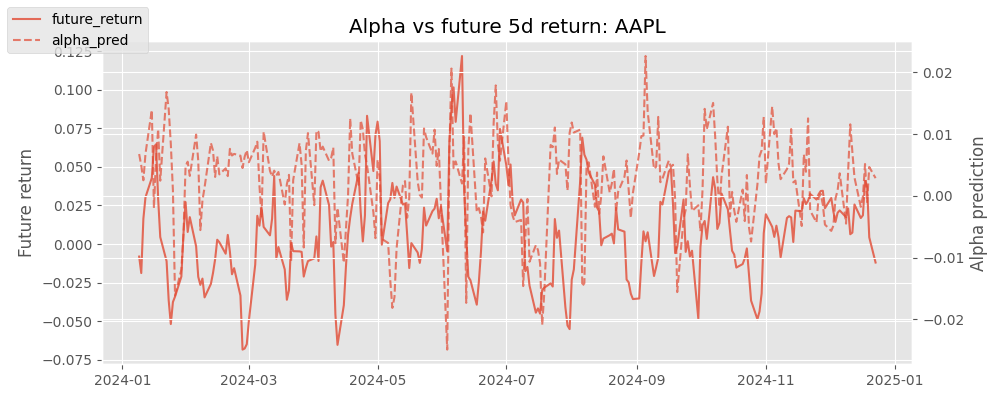

In [28]:
print("\n=== 4.6 Quick visual checks for ensemble alpha ===")
import matplotlib.pyplot as plt
def plot_alpha_vs_label_for_asset(
    asset: str,
    alpha_series: pd.Series,
    label_series: pd.Series,
    n_points: int = 250,
):
    """
    Plot ensemble alpha vs future returns for a given asset over time.
    """
    alpha_a = alpha_series.xs(asset, level="Asset")
    label_a = label_series.xs(asset, level="Asset")
    df = pd.concat([alpha_a.rename("alpha"), label_a], axis=1).dropna()
    df = df.sort_index()
    if len(df) > n_points:
        df = df.iloc[-n_points:]
    fig, ax1 = plt.subplots(figsize=(10, 4))
    ax1.plot(df.index, df["label"], label="future_return", alpha=0.8)
    ax1.set_ylabel("Future return")
    ax2 = ax1.twinx()
    ax2.plot(df.index, df["alpha"], label="alpha_pred", alpha=0.7, linestyle="--")
    ax2.set_ylabel("Alpha prediction")
    ax1.set_title(f"Alpha vs future {FEAT_CFG.label_horizon}d return: {asset}")
    fig.legend(loc="upper left")
    plt.tight_layout()
    plt.show()
some_asset = alpha_pred_df.columns[0]
print(f"Plotting alpha vs label for asset: {some_asset}")
plot_alpha_vs_label_for_asset(
    asset=some_asset,
    alpha_series=alpha_ens_series,
    label_series=labels_series,
)

In [29]:
print("\n=== 4.7 Bundling model outputs for downstream use ===")
model_outputs = {
    "alpha_ml_df": alpha_ml_df,
    "alpha_dl_df": alpha_dl_df,
    "alpha_pred_df": alpha_pred_df,
    "risk_pred_df": risk_pred_df,
    "alpha_ml_all": alpha_ml_all,
    "alpha_dl_all": alpha_dl_all,
    "alpha_ensemble_all": alpha_ensemble_all,
}
print("Model outputs dict ready with keys:")
for k in model_outputs.keys():
    print("  -", k)
print("\nSegment 4 fully wrapped:")
print("  - Models trained (XGBoost, MLP)")
print("  - Ensemble predictions mapped to (date, asset)")
print("  - Risk predictions ready")
print("  - Diagnostics + IC + plots done")


=== 4.7 Bundling model outputs for downstream use ===
Model outputs dict ready with keys:
  - alpha_ml_df
  - alpha_dl_df
  - alpha_pred_df
  - risk_pred_df
  - alpha_ml_all
  - alpha_dl_all
  - alpha_ensemble_all

Segment 4 fully wrapped:
  - Models trained (XGBoost, MLP)
  - Ensemble predictions mapped to (date, asset)
  - Risk predictions ready
  - Diagnostics + IC + plots done


In [30]:
import os
from pathlib import Path
import joblib
import json
MODELS_DIR = PROJECT_ROOT / "models"
MODELS_DIR.mkdir(parents=True, exist_ok=True)
def save_alpha_risk_artifacts(
    models_dir: Path = MODELS_DIR,
    model_outputs: dict = model_outputs,
    feature_data: dict = feature_data,
):
    """
    Persist:
      - XGBoost alpha model
      - MLP alpha model (state_dict)
      - XGBoost risk model
      - Scaler
      - Alpha / risk prediction panels (as CSV)
      - Minimal metadata (features, dates, assets, label horizon)
    """
    print(f"\nSaving models and artifacts to {models_dir} ...")
    joblib.dump(ml_alpha_model, models_dir / "alpha_xgb_model.pkl")
    joblib.dump(risk_ml_model, models_dir / "risk_xgb_model.pkl")
    joblib.dump(feature_data["scaler"], models_dir / "feature_scaler.pkl")
    torch.save(
        mlp_alpha_model.state_dict(),
        models_dir / "alpha_mlp_state_dict.pt"
    )
    model_outputs["alpha_ml_df"].to_csv(models_dir / "alpha_ml_df.csv")
    model_outputs["alpha_dl_df"].to_csv(models_dir / "alpha_dl_df.csv")
    model_outputs["alpha_pred_df"].to_csv(models_dir / "alpha_ensemble_df.csv")
    model_outputs["risk_pred_df"].to_csv(models_dir / "risk_pred_df.csv")
    meta = {
        "feature_names": feature_data["feature_names"],
        "label_horizon": int(FEAT_CFG.label_horizon),
        "train_start": TIME_CFG.train_start,
        "val_start": TIME_CFG.val_start,
        "test_start": TIME_CFG.test_start,
        "test_end": TIME_CFG.test_end,
        "tickers": list(UNIVERSE_CFG.tickers),
    }
    with open(models_dir / "meta.json", "w") as f:
        json.dump(meta, f, indent=2, default=str)
    print("  - alpha_xgb_model.pkl")
    print("  - risk_xgb_model.pkl")
    print("  - alpha_mlp_state_dict.pt")
    print("  - feature_scaler.pkl")
    print("  - alpha_ml_df.csv")
    print("  - alpha_dl_df.csv")
    print("  - alpha_ensemble_df.csv")
    print("  - risk_pred_df.csv")
    print("  - meta.json")
    print("Artifacts saved.")
save_alpha_risk_artifacts()


Saving models and artifacts to C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\models ...
  - alpha_xgb_model.pkl
  - risk_xgb_model.pkl
  - alpha_mlp_state_dict.pt
  - feature_scaler.pkl
  - alpha_ml_df.csv
  - alpha_dl_df.csv
  - alpha_ensemble_df.csv
  - risk_pred_df.csv
  - meta.json
Artifacts saved.


In [31]:
def get_alpha_risk_for_date(
    date: pd.Timestamp | str,
    alpha_df: pd.DataFrame = alpha_pred_df,
    risk_df: pd.DataFrame = risk_pred_df,
) -> dict:
    """
    Return ensemble alpha and risk predictions for all assets on a given date.
    If the exact date is missing, use the last available date before it.
    """
    if not isinstance(date, pd.Timestamp):
        date = pd.to_datetime(date)

    idx = alpha_df.index
    if date in idx:
        d_use = date
    else:
        prev = idx[idx <= date]
        if prev.empty:
            raise ValueError(f"No alpha predictions available on or before {date}.")
        d_use = prev.max()
    alpha_row = alpha_df.loc[d_use]
    risk_row  = risk_df.loc[d_use]
    return {
        "date": d_use,
        "alpha": alpha_row,   
        "risk": risk_row,     
    }
def get_split_alpha_risk_panels(
    split: str,
    feature_data: dict = feature_data,
    alpha_df: pd.DataFrame = alpha_pred_df,
    risk_df: pd.DataFrame = risk_pred_df,
) -> dict:
    """
    Return alpha/risk panels restricted to a given split: 'train', 'val', or 'test'.
    Uses label_end_dates to avoid any horizon leakage.
    """
    split = split.lower()
    if split not in {"train", "val", "test"}:
        raise ValueError("split must be one of {'train', 'val', 'test'}")
    idx_split = feature_data[f"idx_{split}"]
    label_end_dates = feature_data["label_end_dates"]
    dates_split = pd.Index(sorted(set(label_end_dates[idx_split])))
    alpha_split = alpha_df.loc[alpha_df.index.isin(dates_split)]
    risk_split  = risk_df.loc[risk_df.index.isin(dates_split)]
    print(
        f"\nSplit '{split}': "
        f"{len(dates_split)} unique label-end dates, "
        f"alpha_split shape={alpha_split.shape}, "
        f"risk_split shape={risk_split.shape}"
    )
    return {
        "dates": dates_split,
        "alpha_df": alpha_split,
        "risk_df": risk_split,
    }
train_panels = get_split_alpha_risk_panels("train", feature_data, alpha_pred_df, risk_pred_df)
val_panels   = get_split_alpha_risk_panels("val",   feature_data, alpha_pred_df, risk_pred_df)
test_panels  = get_split_alpha_risk_panels("test",  feature_data, alpha_pred_df, risk_pred_df)
print("\nSegment 4 extended:")
print("  - Artifacts saved to /models")
print("  - Helper accessors for alpha/risk per-date and per-split ready")


Split 'train': 1304 unique label-end dates, alpha_split shape=(1304, 10), risk_split shape=(1304, 10)

Split 'val': 523 unique label-end dates, alpha_split shape=(523, 10), risk_split shape=(523, 10)

Split 'test': 781 unique label-end dates, alpha_split shape=(776, 10), risk_split shape=(776, 10)

Segment 4 extended:
  - Artifacts saved to /models
  - Helper accessors for alpha/risk per-date and per-split ready


In [32]:
import cvxpy as cp
import numpy as np
import pandas as pd
print("\n=== 5.1 Plain robust Markowitz optimizer ===")
@dataclass
class RobustSPOConfig:
    """
    Config for the robust Markowitz-style optimizer.
    This is the *non-differentiable* MVP version using CVXPY.
    """
    lambda_risk: float = SPO_CFG.base_lambda              
    delta_uncertainty: float = SPO_CFG.base_uncertainty_radius  
    max_weight: float = SPO_CFG.max_weight                
    turnover_penalty: float = SPO_CFG.turnover_penalty   
    cov_lookback: int = 63                               
    min_cov_obs: int = 40                                 
    cov_shrinkage: float = 1e-4                           
    rebalance_every: int = 5                              
    start_date: str = TIME_CFG.train_start                
    end_date: str = TIME_CFG.test_end                     
ROBUST_SPO_CFG = RobustSPOConfig()
def solve_robust_markowitz(
    mu: np.ndarray,
    Sigma: np.ndarray,
    lambda_risk: float,
    delta_uncertainty: float,
    max_weight: float,
    turnover_penalty: float | None = None,
    w_prev: np.ndarray | None = None,
) -> np.ndarray:
    """
    Solve a robust Markowitz QP:
        minimize   -mu^T w + λ * w^T Σ w + δ * ||w||_2^2 + τ * ||w - w_prev||_1
        subject to sum(w) = 1, 0 <= w <= max_weight
    Args:
        mu: (N,) expected returns vector
        Sigma: (N, N) covariance matrix (assumed PSD-ish, we add ridge)
        lambda_risk: risk aversion coefficient
        delta_uncertainty: strength of L2 penalty on weights (robustness / shrinkage)
        max_weight: per-asset weight cap
        turnover_penalty: optional τ coefficient for L1 turnover penalty
        w_prev: previous weights, if turnover penalty is used
    Returns:
        w_opt: (N,) numpy array of optimal weights
    """
    N = len(mu)
    mu = mu.reshape(-1)
    assert Sigma.shape == (N, N), "Sigma shape mismatch"
    w = cp.Variable(N)
    risk_term = cp.quad_form(w, Sigma)
    mean_term = -mu @ w
    l2_term = cp.sum_squares(w)  
    objective_expr = mean_term + lambda_risk * risk_term + delta_uncertainty * l2_term
    if turnover_penalty is not None and w_prev is not None:
        w_prev = w_prev.reshape(-1)
        turnover_term = cp.norm1(w - w_prev)
        objective_expr += turnover_penalty * turnover_term
    objective = cp.Minimize(objective_expr)
    constraints = [
        cp.sum(w) == 1.0,
        w >= 0.0,
        w <= max_weight,
    ]
    prob = cp.Problem(objective, constraints)
    try:
        prob.solve(solver=cp.SCS, verbose=False)
    except Exception as e:
        print(f"Warning: solver failed with SCS: {e}, retrying with ECOS.")
        prob.solve(solver=cp.ECOS, verbose=False)
    if w.value is None:
        raise RuntimeError("Robust Markowitz optimization failed, w.value is None.")
    w_opt = np.array(w.value).reshape(-1)
    w_opt = np.clip(w_opt, 0.0, max_weight)
    total = w_opt.sum()
    if total <= 0:
        w_opt = np.ones(N) / N
    else:
        w_opt = w_opt / total
    return w_opt
def estimate_covariance(
    returns_df: pd.DataFrame,
    end_date: pd.Timestamp,
    lookback: int,
    shrinkage: float,
) -> np.ndarray:
    """
    Estimate covariance matrix Σ from trailing returns up to end_date.
    Applies simple ridge shrinkage on the diagonal.
    """
    if not isinstance(end_date, pd.Timestamp):
        end_date = pd.to_datetime(end_date)
    window = returns_df.loc[:end_date].iloc[-lookback:]
    if window.shape[0] < 2:
        raise ValueError("Not enough observations for covariance estimation.")
    Sigma = window.cov().to_numpy()
    N = Sigma.shape[0]
    Sigma = Sigma + shrinkage * np.eye(N)
    return Sigma
some_date = alpha_pred_df.index[len(alpha_pred_df) // 2]
print(f"\nTesting robust Markowitz on single date: {some_date.date()}")
mu_test = alpha_pred_df.loc[some_date, prices_df.columns].to_numpy(dtype=float)
Sigma_test = estimate_covariance(
    returns_df[prices_df.columns],
    end_date=some_date,
    lookback=ROBUST_SPO_CFG.cov_lookback,
    shrinkage=ROBUST_SPO_CFG.cov_shrinkage,
)
w_test = solve_robust_markowitz(
    mu=mu_test,
    Sigma=Sigma_test,
    lambda_risk=ROBUST_SPO_CFG.lambda_risk,
    delta_uncertainty=ROBUST_SPO_CFG.delta_uncertainty,
    max_weight=ROBUST_SPO_CFG.max_weight,
    turnover_penalty=None,
    w_prev=None,
)
print("Single-date optimization complete.")
print("  Sum of weights:", w_test.sum())
print("  Min/Max weight:", w_test.min(), w_test.max())
print("  First few weights:", w_test[:5])


=== 5.1 Plain robust Markowitz optimizer ===

Testing robust Markowitz on single date: 2018-10-18
Single-date optimization complete.
  Sum of weights: 1.0
  Min/Max weight: 1.8055364954021363e-08 0.200000018475027
  First few weights: [0.15581865 0.10277105 0.09657707 0.13391448 0.20000002]



=== 5.2 Non-differentiable robust SPO backtester ===
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 66.30092453088938, 'annualized_sharpe': 1.6426053373116838, 'max_drawdown': -0.37852293359905753}


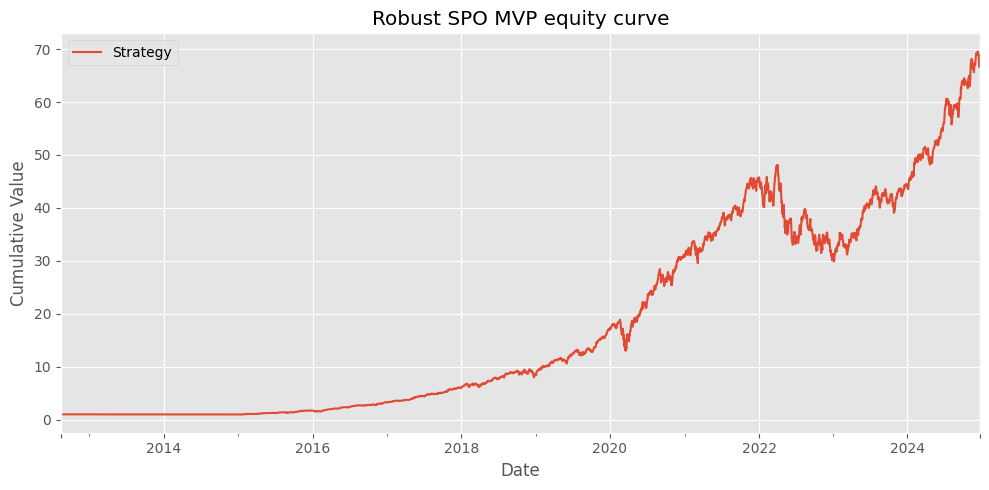


Segment 5 core complete:
  weights_df shape:   (522, 10)
  equity_curve length:3225
Head of weights_df:
                AAPL      MSFT      GOOG      AMZN      META      NVDA  \
2015-01-01  0.102184  0.112437  0.066332  0.119841  0.200000  0.121855   
2015-01-08  0.111321  0.093344  0.094609  0.119841  0.128657  0.137263   
2015-01-15  0.111321  0.095341  0.019433  0.127925  0.128657  0.078833   
2015-01-22  0.169988  0.040239  0.061389  0.144029  0.108915  0.083513   
2015-01-29  0.009322  0.200000  0.075880  0.139819  0.034357  0.154130   

                TSLA       JPM       XOM       UNH  
2015-01-01  0.026284  0.058845  0.021766  0.170456  
2015-01-08  0.000002  0.087746  0.071649  0.155567  
2015-01-15  0.199999  0.177795  0.060695  0.000002  
2015-01-22  0.133987  0.165993  0.010450  0.081496  
2015-01-29  0.007953  0.118349  0.110449  0.149741  


In [33]:
print("\n=== 5.2 Non-differentiable robust SPO backtester ===")
def build_rebalance_schedule(
    dates: pd.DatetimeIndex,
    cfg: RobustSPOConfig = ROBUST_SPO_CFG,
) -> pd.DatetimeIndex:
    """
    Build a list of rebalance dates given:
      - overall calendar
      - start_date / end_date
      - rebalance_every (in trading days)
    """
    dates = pd.to_datetime(dates).sort_values()
    start = pd.to_datetime(cfg.start_date)
    end   = pd.to_datetime(cfg.end_date)
    mask = (dates >= start) & (dates <= end)
    dates = dates[mask]
    if len(dates) == 0:
        raise ValueError("No dates available within the specified backtest window.")
    rebalance_dates = dates[:: cfg.rebalance_every]
    if dates[-1] not in rebalance_dates:
        rebalance_dates = rebalance_dates.append(pd.DatetimeIndex([dates[-1]]))
    print(f"Rebalance schedule has {len(rebalance_dates)} dates "
          f"from {rebalance_dates[0].date()} to {rebalance_dates[-1].date()}.")
    return rebalance_dates
def run_robust_spo_backtest(
    alpha_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    cfg: RobustSPOConfig = ROBUST_SPO_CFG,
    universe: list[str] | None = None,
) -> dict:
    """
    Run a simple non-differentiable robust SPO backtest:
    - Rebalance on a fixed schedule.
    - At each rebalance date t:
        * mu_t from alpha_df.loc[t, :]
        * Sigma_t from trailing returns up to t
        * solve robust Markowitz for w_t
    - Hold w_t until next rebalance date.
    Returns:
        {
            "weights_df": DataFrame [rebalance_date x asset],
            "equity_curve": Series [date],
            "portfolio_returns": Series [date],
        }
    """
    if universe is None:
        universe = list(UNIVERSE_CFG.tickers)
    alpha_df = alpha_df[universe].sort_index()
    returns_df = returns_df[universe].sort_index()
    common_index = returns_df.index.intersection(alpha_df.index)
    alpha_df = alpha_df.loc[common_index]
    returns_df = returns_df.loc[common_index]
    rebalance_dates = build_rebalance_schedule(common_index, cfg)
    weights_records = []
    last_w = None
    for d in rebalance_dates:
        try:
            Sigma_t = estimate_covariance(
                returns_df=returns_df,
                end_date=d,
                lookback=cfg.cov_lookback,
                shrinkage=cfg.cov_shrinkage,
            )
        except Exception as e:
            print(f"Skipping {d.date()} due to cov estimation error: {e}")
            continue
        if returns_df.loc[:d].shape[0] < cfg.min_cov_obs:
            print(f"Skipping {d.date()} (not enough history for covariance).")
            continue
        mu_t = alpha_df.loc[d].to_numpy(dtype=float)
        w_t = solve_robust_markowitz(
            mu=mu_t,
            Sigma=Sigma_t,
            lambda_risk=cfg.lambda_risk,
            delta_uncertainty=cfg.delta_uncertainty,
            max_weight=cfg.max_weight,
            turnover_penalty=cfg.turnover_penalty if last_w is not None else None,
            w_prev=last_w,
        )
        weights_records.append(pd.Series(w_t, index=universe, name=d))
        last_w = w_t
    if not weights_records:
        raise RuntimeError("No valid rebalance points found; check configuration.")
    weights_df = pd.DataFrame(weights_records).sort_index()
    portfolio_returns = pd.Series(index=returns_df.index, dtype=float)
    portfolio_returns[:] = 0.0
    rebalance_dates_list = list(weights_df.index)
    for i, d_start in enumerate(rebalance_dates_list):
        if i < len(rebalance_dates_list) - 1:
            d_end = rebalance_dates_list[i + 1]
            period_mask = (returns_df.index >= d_start) & (returns_df.index < d_end)
        else:
            d_end = returns_df.index[-1]
            period_mask = (returns_df.index >= d_start) & (returns_df.index <= d_end)
        if period_mask.sum() == 0:
            continue
        w_hold = weights_df.loc[d_start].to_numpy(dtype=float)
        r_period = returns_df.loc[period_mask]
        port_ret = (r_period.to_numpy() @ w_hold)
        portfolio_returns.loc[period_mask] = port_ret
    equity_curve = (1.0 + portfolio_returns.fillna(0.0)).cumprod()
    equity_curve.name = "Equity"
    print("\nRobust SPO backtest complete.")
    summarize_backtest(equity_curve, label="Robust_SPO_MVP")
    plot_equity_curve(equity_curve, title="Robust SPO MVP equity curve")
    return {
        "weights_df": weights_df,
        "equity_curve": equity_curve,
        "portfolio_returns": portfolio_returns,
    }
spo_results = run_robust_spo_backtest(
    alpha_df=alpha_pred_df,
    returns_df=returns_df,
    cfg=ROBUST_SPO_CFG,
    universe=list(UNIVERSE_CFG.tickers),
)
weights_df = spo_results["weights_df"]
equity_curve = spo_results["equity_curve"]
portfolio_returns = spo_results["portfolio_returns"]
print("\nSegment 5 core complete:")
print(f"  weights_df shape:   {weights_df.shape}")
print(f"  equity_curve length:{len(equity_curve)}")
print("Head of weights_df:")
print(weights_df.head())

In [34]:
print("\n=== 5.3 Optional: Differentiable SPO layer with cvxpylayers ===")
if not HAS_CVXPYLAYERS:
    print("cvxpylayers not available; skipping differentiable SPO layer. "
          "You can install it later and rerun this cell.")
else:
    import cvxpy as cp
    from cvxpylayers.torch import CvxpyLayer
    def build_markowitz_cvxpy_layer(
        n_assets: int,
        lambda_risk: float,
        delta_uncertainty: float,
        max_weight: float,
    ) -> CvxpyLayer:
        """
        Build a cvxpylayers-compatible Markowitz QP layer:
            minimize   -mu^T w + λ * w^T Σ w + δ * ||w||_2^2
            subject to sum(w) = 1, 0 <= w <= max_weight
        Turnover penalty is omitted here to keep the layer simple and
        differentiable. You can handle turnover in an outer loop or 
        separate loss term if needed.
        """
        mu_param = cp.Parameter(n_assets)        
        Sigma_param = cp.Parameter((n_assets, n_assets))  
        w = cp.Variable(n_assets)
        mean_term = -mu_param @ w
        risk_term = cp.quad_form(w, Sigma_param)
        l2_term   = cp.sum_squares(w)
        objective_expr = mean_term \
                         + lambda_risk * risk_term \
                         + delta_uncertainty * l2_term
        constraints = [
            cp.sum(w) == 1.0,
            w >= 0.0,
            w <= max_weight,
        ]
        prob = cp.Problem(cp.Minimize(objective_expr), constraints)
        if prob.is_dcp() is False:
            raise ValueError("Problem is not DCP; cvxpylayers requires DCP-compliant problems.")
        layer = CvxpyLayer(
            prob,
            parameters=[mu_param, Sigma_param],
            variables=[w],
        )
        print(f"Built Markowitz CvxpyLayer for {n_assets} assets.")
        return layer
    N_ASSETS = len(UNIVERSE_CFG.tickers)
    spo_layer = build_markowitz_cvxpy_layer(
        n_assets=N_ASSETS,
        lambda_risk=ROBUST_SPO_CFG.lambda_risk,
        delta_uncertainty=ROBUST_SPO_CFG.delta_uncertainty,
        max_weight=ROBUST_SPO_CFG.max_weight,
    )
    def differentiable_markowitz_torch(
        mu_torch: torch.Tensor,
        Sigma_torch: torch.Tensor,
        spo_layer: CvxpyLayer = spo_layer,
        project_simplex: bool = True,
    ) -> torch.Tensor:
        """
        Differentiable Markowitz optimizer using cvxpylayers.
        Args:
            mu_torch:     [batch, N] or [N] torch tensor of expected returns
            Sigma_torch:  [batch, N, N] or [N, N] torch tensor of covariances
            spo_layer:    prebuilt CvxpyLayer
            project_simplex: if True, post-normalize weights to sum to 1
                             to avoid small numerical drift.
        Returns:
            w_torch: [batch, N] tensor of weights with gradient support.
        """
        if mu_torch.dim() == 1:
            mu_torch = mu_torch.unsqueeze(0)          
        if Sigma_torch.dim() == 2:
            Sigma_torch = Sigma_torch.unsqueeze(0)    
        batch_size, n_assets = mu_torch.shape
        assert n_assets == N_ASSETS, (
            f"mu_torch assets={n_assets}, but layer built for {N_ASSETS}."
        )
        w_list = []
        for b in range(batch_size):
            mu_b = mu_torch[b]
            Sigma_b = Sigma_torch[b]
            w_b, = spo_layer(mu_b, Sigma_b)
            if project_simplex:
                w_b = torch.clamp(w_b, min=0.0)
                s = w_b.sum()
                w_b = w_b / (s + 1e-8)
            w_list.append(w_b)
        w_out = torch.stack(w_list, dim=0) 
        return w_out
    some_date_torch = alpha_pred_df.index[len(alpha_pred_df) // 3]
    print(f"\nTesting differentiable SPO on single date: {some_date_torch.date()}")
    assets_order = list(UNIVERSE_CFG.tickers)
    mu_np = alpha_pred_df.loc[some_date_torch, assets_order].to_numpy(dtype=float)
    Sigma_np = estimate_covariance(
        returns_df[assets_order],
        end_date=some_date_torch,
        lookback=ROBUST_SPO_CFG.cov_lookback,
        shrinkage=ROBUST_SPO_CFG.cov_shrinkage,
    )
    mu_t = torch.from_numpy(mu_np.astype(np.float32)).to(DEVICE)
    Sigma_t = torch.from_numpy(Sigma_np.astype(np.float32)).to(DEVICE)
    w_differentiable = differentiable_markowitz_torch(
        mu_torch=mu_t,
        Sigma_torch=Sigma_t,
        spo_layer=spo_layer,
    )
    print("Differentiable SPO single-date test:")
    print("  Sum of weights:", float(w_differentiable.sum().cpu().detach().numpy()))
    print("  Min/Max weight:",
          float(w_differentiable.min().cpu().detach().numpy()),
          float(w_differentiable.max().cpu().detach().numpy()))
    print("  First few weights:",
          w_differentiable[0, :5].detach().cpu().numpy())


=== 5.3 Optional: Differentiable SPO layer with cvxpylayers ===
cvxpylayers not available; skipping differentiable SPO layer. You can install it later and rerun this cell.


In [35]:
import numpy as np
import pandas as pd
print("\n=== 6. Backtest engine (evaluate SPO) ===")
def _standardize_weights_input(
    weights_by_date,
    universe: list[str] | None = None,
) -> pd.DataFrame:
    """
    Convert weights_by_date (dict or DataFrame) into a clean DataFrame:
        index: Date (DatetimeIndex of rebalance dates)
        columns: assets
    Ensures weights are non-negative and sum to 1 on each rebalance date.
    """
    if isinstance(weights_by_date, dict):
        records = []
        index = []
        for d, w in weights_by_date.items():
            index.append(pd.to_datetime(d))
            if isinstance(w, pd.Series):
                records.append(w.astype(float))
            else:
                w = np.asarray(w, dtype=float)
                if universe is None:
                    raise ValueError(
                        "universe must be provided when weights_by_date is a dict "
                        "with raw arrays."
                    )
                records.append(pd.Series(w, index=universe))
        weights_df = pd.DataFrame(records, index=pd.DatetimeIndex(index))
    elif isinstance(weights_by_date, pd.DataFrame):
        weights_df = weights_by_date.copy()
        weights_df.index = pd.to_datetime(weights_df.index)
    else:
        raise TypeError("weights_by_date must be dict or DataFrame")
    weights_df = weights_df.sort_index()
    if universe is not None:
        weights_df = weights_df.reindex(columns=universe)
    weights_df = weights_df.fillna(0.0)
    weights_df = weights_df.clip(lower=0.0)
    row_sums = weights_df.sum(axis=1).replace(0.0, np.nan)
    weights_df = weights_df.div(row_sums, axis=0)
    if weights_df.isna().any(axis=1).any():
        n_bad = weights_df.isna().any(axis=1).sum()
        print(f"Warning: {n_bad} rebalance rows had zero total weight; dropping them.")
        weights_df = weights_df.dropna(axis=0, how="any")
    return weights_df
def _expand_weights_to_daily(
    weights_df: pd.DataFrame,
    returns_index: pd.DatetimeIndex,
) -> pd.DataFrame:
    """
    Expand rebalance weights to a daily panel:
        - Between each rebalance date, hold last known weights.
        - Weights are piecewise constant over trading days.
    Returns:
        daily_weights_df: DataFrame indexed by returns_index, columns=assets
    """
    weights_df = weights_df.sort_index()
    returns_index = pd.to_datetime(returns_index).sort_values()
    daily_weights = pd.DataFrame(
        index=returns_index,
        columns=weights_df.columns,
        dtype=float,
    )
    common_reb_dates = returns_index.intersection(weights_df.index)
    if len(common_reb_dates) == 0:
        raise ValueError("No overlap between rebalance dates and returns index.")
    daily_weights.loc[common_reb_dates] = weights_df.loc[common_reb_dates]
    daily_weights = daily_weights.ffill()
    first_reb = common_reb_dates.min()
    daily_weights = daily_weights.loc[daily_weights.index >= first_reb]
    return daily_weights
def _compute_turnover(
    weights_df: pd.DataFrame,
) -> pd.Series:
    """
    Compute turnover per rebalance step:
        turnover_t = 0.5 * sum_i |w_t(i) - w_{t-1}(i)|
    Returns:
        turnover_series indexed by rebalance dates (excluding the first one).
    """
    weights_df = weights_df.sort_index()
    turnover_vals = []
    dates = []
    prev_w = None
    for d, row in weights_df.iterrows():
        w = row.to_numpy(dtype=float)
        if prev_w is not None:
            turnover = 0.5 * np.abs(w - prev_w).sum()
            turnover_vals.append(turnover)
            dates.append(d)
        prev_w = w
    if not turnover_vals:
        return pd.Series([], dtype=float)
    return pd.Series(turnover_vals, index=pd.DatetimeIndex(dates), name="turnover")
def run_backtest(
    weights_by_date,
    returns_df: pd.DataFrame,
    universe: list[str] | None = None,
) -> dict:
    """
    Generic backtest given:
        - weights_by_date: dict[date -> weights] or DataFrame [rebalance_date x asset]
        - returns_df: daily returns [date x asset]
    Logic:
        - Standardize weights and align to universe
        - Expand to daily weights (piecewise constant between rebalances)
        - Compute portfolio_returns_t = (w_t * returns_t).sum(axis=1)
        - Build equity curve
        - Compute Sharpe, max drawdown, turnover
    Returns:
        {
            "weights_df": rebalance_weights_df,
            "weights_daily_df": daily_weights_df,
            "portfolio_returns": portfolio_returns,
            "equity_curve": equity_curve,
            "sharpe": annualized_sharpe_value,
            "max_dd": max_drawdown_value,
            "turnover_series": turnover_series,
            "avg_turnover": avg_turnover,
        }
    """
    if universe is None:
        universe = list(UNIVERSE_CFG.tickers)
    returns_df = returns_df[universe].sort_index()
    rebalance_weights_df = _standardize_weights_input(
        weights_by_date,
        universe=universe,
    )
    daily_weights_df = _expand_weights_to_daily(
        rebalance_weights_df,
        returns_index=returns_df.index,
    )
    common_index = returns_df.index.intersection(daily_weights_df.index)
    returns_use = returns_df.loc[common_index]
    weights_use = daily_weights_df.loc[common_index]
    port_ret = (returns_use * weights_use).sum(axis=1)
    port_ret.name = "portfolio_return"
    equity_curve = (1.0 + port_ret.fillna(0.0)).cumprod()
    equity_curve.name = "Equity"
    sharpe = annualized_sharpe(port_ret)
    max_dd = max_drawdown(equity_curve)
    turnover_series = _compute_turnover(rebalance_weights_df)
    avg_turnover = float(turnover_series.mean()) if len(turnover_series) > 0 else 0.0
    print("\nBacktest summary (generic engine):")
    print(f"  Period:         {equity_curve.index[0].date()} -> {equity_curve.index[-1].date()}")
    print(f"  n_days:         {len(equity_curve)}")
    print(f"  Sharpe:         {sharpe:.3f}")
    print(f"  Max drawdown:   {max_dd:.3%}")
    print(f"  Avg turnover:   {avg_turnover:.3%}")
    summarize_backtest(equity_curve, label="Generic_Backtest")
    return {
        "weights_df": rebalance_weights_df,
        "weights_daily_df": daily_weights_df,
        "portfolio_returns": port_ret,
        "equity_curve": equity_curve,
        "sharpe": sharpe,
        "max_dd": max_dd,
        "turnover_series": turnover_series,
        "avg_turnover": avg_turnover,
    }
generic_bt_results = run_backtest(
    weights_by_date=weights_df,     
    returns_df=returns_df,
    universe=list(UNIVERSE_CFG.tickers),
)
print("\nSegment 6 complete:")
print("  - Generic backtest engine ready for GA / RL fitness")
print("  - Returns Sharpe, max drawdown, turnover, and equity curve")


=== 6. Backtest engine (evaluate SPO) ===

Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.823
  Max drawdown:   -37.852%
  Avg turnover:   27.444%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 65.48669034899795, 'annualized_sharpe': 1.8229514746512403, 'max_drawdown': -0.3785229335990584}

Segment 6 complete:
  - Generic backtest engine ready for GA / RL fitness
  - Returns Sharpe, max drawdown, turnover, and equity curve



=== 7. Genetic Algorithm for SPO templates ===

Starting GA for SPO templates with pop=16, gens=12, elite=4

--- GA Generation 1/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 35.34311596004664, 'annualized_sharpe': 1.43546188929989, 'max_drawdown': -0.3411301501055445}


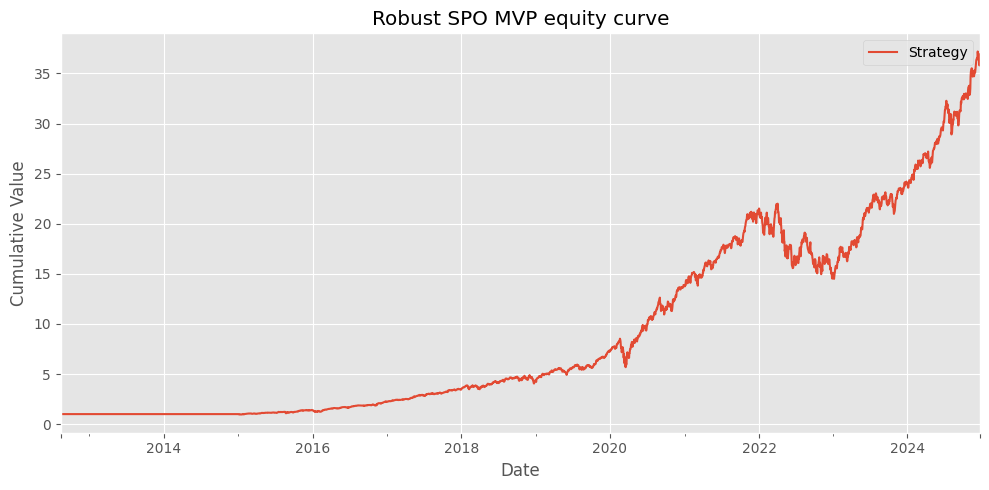


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.591
  Max drawdown:   -34.113%
  Avg turnover:   6.460%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 34.867400224909716, 'annualized_sharpe': 1.5915499406288365, 'max_drawdown': -0.3411301501055437}
    fitness=1.2178, Sharpe=1.591, max_dd=-34.113%, avg_turn=6.460%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 26.494071320529557, 'annualized_sharpe': 1.377986880240366, 'max_drawdown': -0.342242726381477}


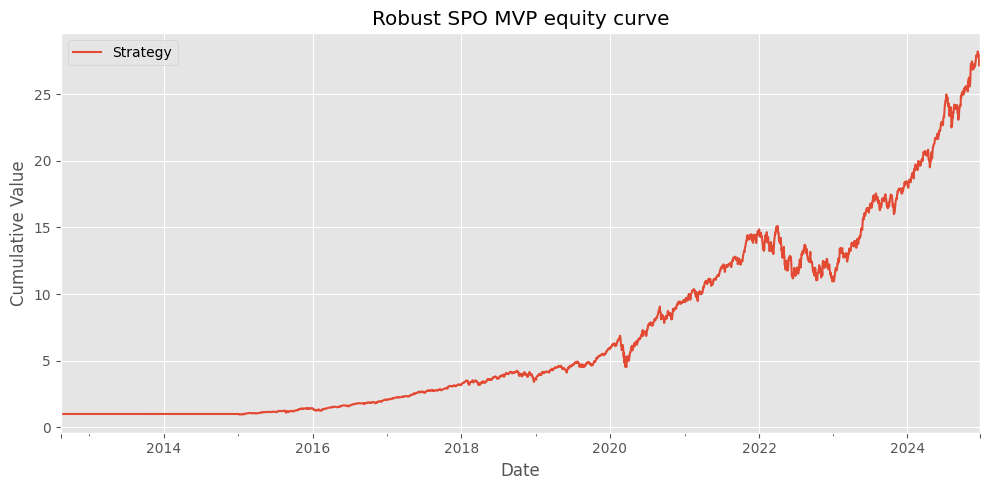


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.527
  Max drawdown:   -34.224%
  Avg turnover:   4.164%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 26.153640919292332, 'annualized_sharpe': 1.5275926615275384, 'max_drawdown': -0.34224272638147657}
    fitness=1.1642, Sharpe=1.527, max_dd=-34.224%, avg_turn=4.164%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 18.664903414493565, 'annualized_sharpe': 1.2413626477154018, 'max_drawdown': -0.34293369744314817}


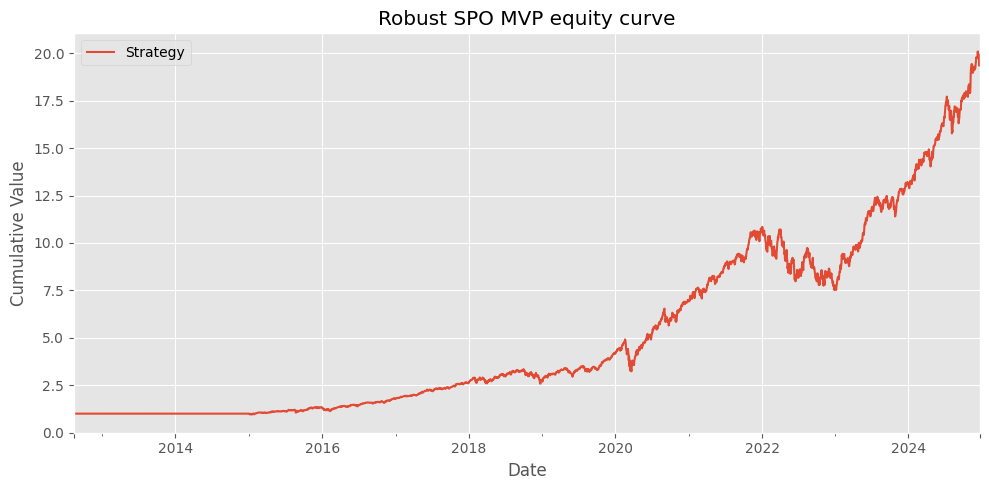


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.375
  Max drawdown:   -34.293%
  Avg turnover:   1.341%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 18.42052488440459, 'annualized_sharpe': 1.3754679039605704, 'max_drawdown': -0.34293369744314794}
    fitness=1.0256, Sharpe=1.375, max_dd=-34.293%, avg_turn=1.341%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 40.11111405874614, 'annualized_sharpe': 1.5299051854895045, 'max_drawdown': -0.33747185046348316}


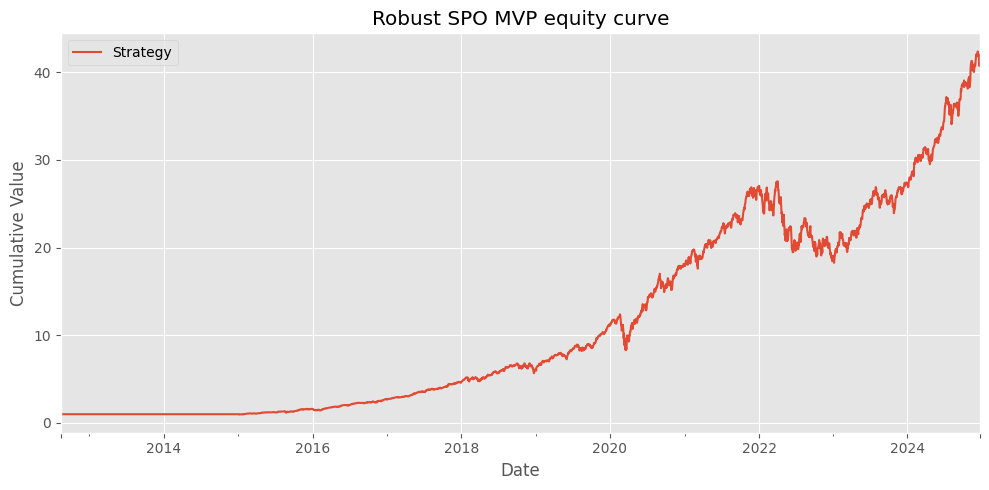


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.696
  Max drawdown:   -33.747%
  Avg turnover:   18.750%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 39.58129475464735, 'annualized_sharpe': 1.6965532409581752, 'max_drawdown': -0.33747185046348294}
    fitness=1.2650, Sharpe=1.696, max_dd=-33.747%, avg_turn=18.750%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 49.145126879747785, 'annualized_sharpe': 1.538723534782151, 'max_drawdown': -0.3531901647728709}


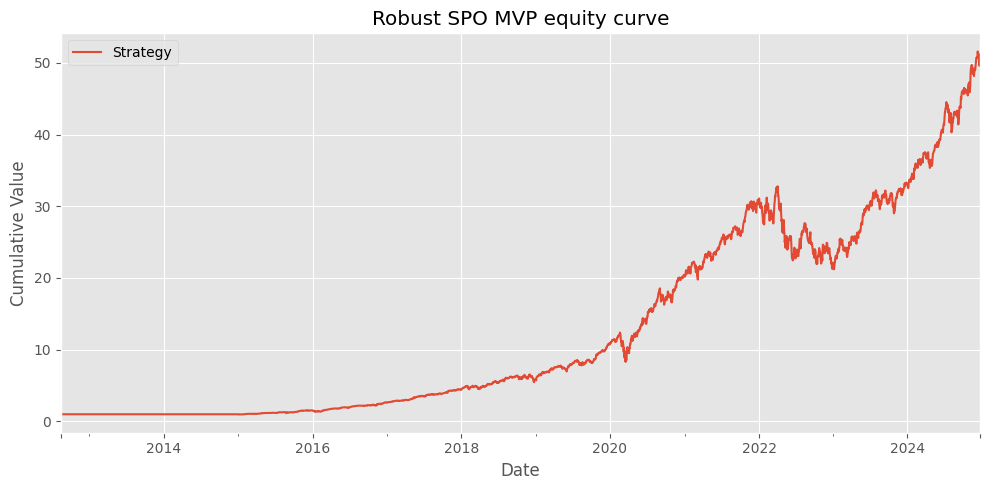


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.706
  Max drawdown:   -35.319%
  Avg turnover:   14.233%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 48.4941661419882, 'annualized_sharpe': 1.7067271218676534, 'max_drawdown': -0.3531901647728716}
    fitness=1.2820, Sharpe=1.706, max_dd=-35.319%, avg_turn=14.233%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 57.86883695500511, 'annualized_sharpe': 1.6174421433864083, 'max_drawdown': -0.36832800655502773}


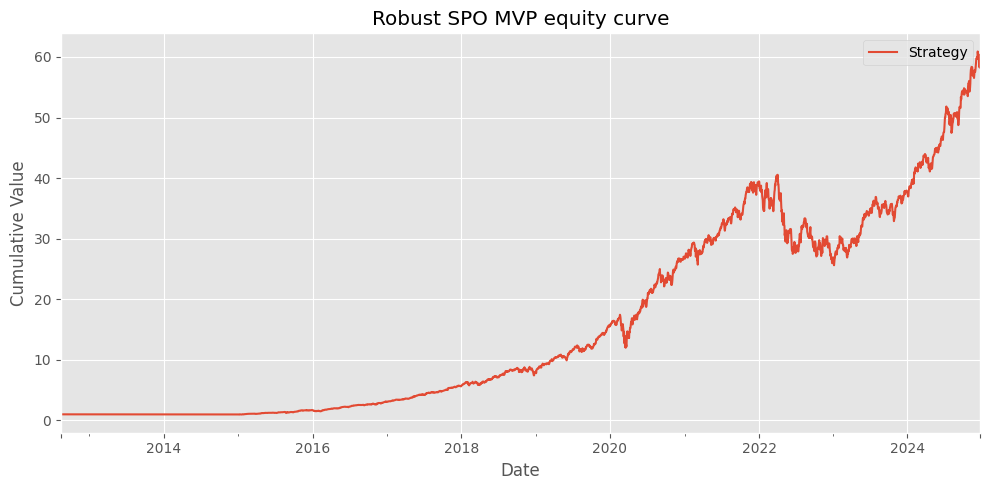


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.793
  Max drawdown:   -36.833%
  Avg turnover:   20.311%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 57.03220084252141, 'annualized_sharpe': 1.7937202715690836, 'max_drawdown': -0.36832800655502784}
    fitness=1.3235, Sharpe=1.793, max_dd=-36.833%, avg_turn=20.311%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 31.855781577104167, 'annualized_sharpe': 1.4241236214394992, 'max_drawdown': -0.33397763153148385}


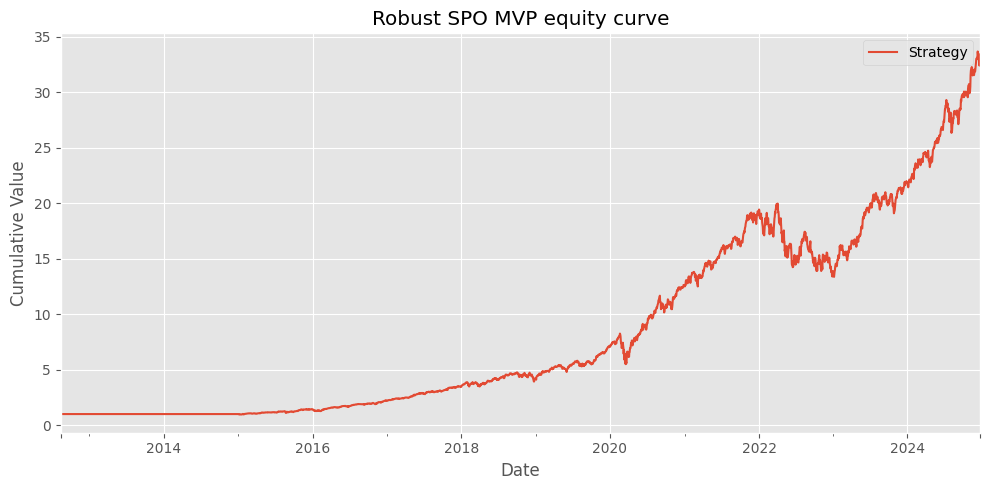


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.578
  Max drawdown:   -33.398%
  Avg turnover:   7.074%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 31.424756930824444, 'annualized_sharpe': 1.5787226538320596, 'max_drawdown': -0.33397763153148363}
    fitness=1.2091, Sharpe=1.578, max_dd=-33.398%, avg_turn=7.074%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 123.47154734119664, 'annualized_sharpe': 1.7590386538249754, 'max_drawdown': -0.4352320169001668}


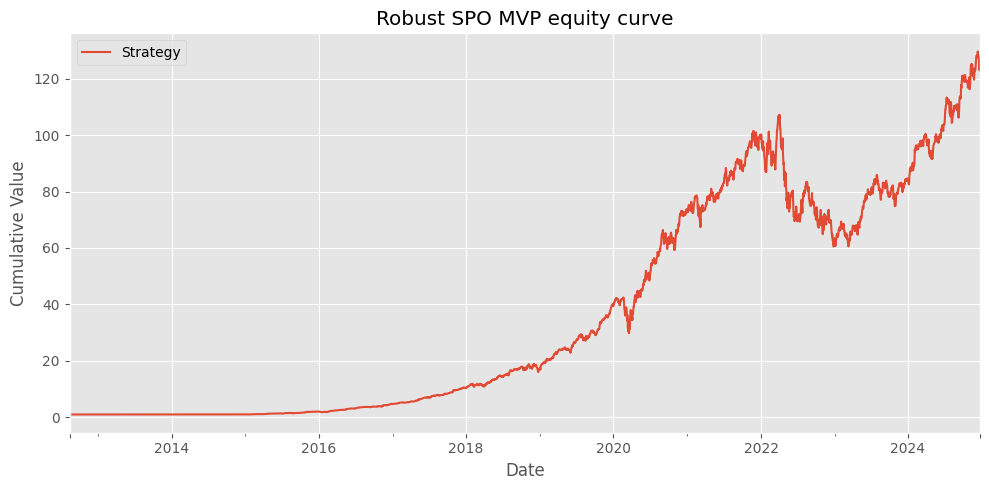


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.951
  Max drawdown:   -43.523%
  Avg turnover:   41.822%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 121.63941438986313, 'annualized_sharpe': 1.9517130419606303, 'max_drawdown': -0.4352320169001668}
    fitness=1.3070, Sharpe=1.951, max_dd=-43.523%, avg_turn=41.822%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 33.52537267563238, 'annualized_sharpe': 1.4154425063123424, 'max_drawdown': -0.34176267139717353}


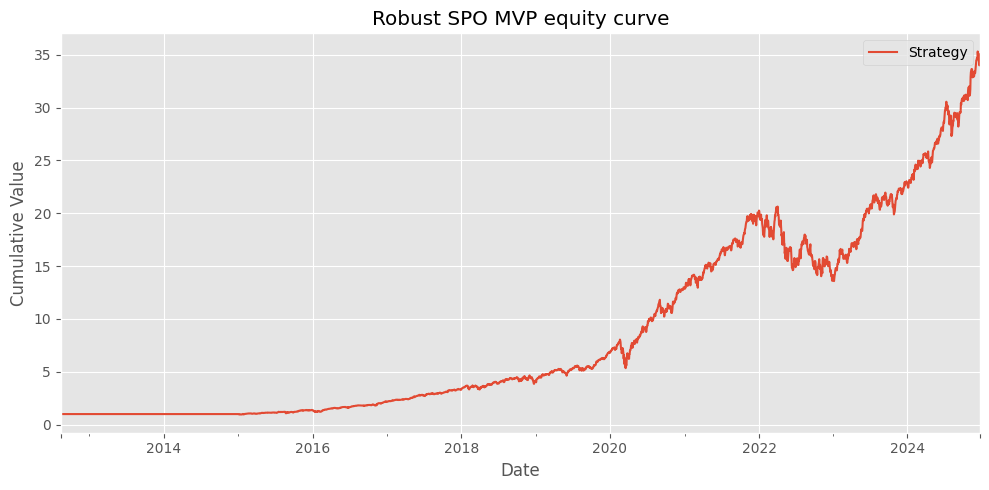


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.569
  Max drawdown:   -34.176%
  Avg turnover:   5.156%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 33.07151936566443, 'annualized_sharpe': 1.569217663410676, 'max_drawdown': -0.34176267139717365}
    fitness=1.2014, Sharpe=1.569, max_dd=-34.176%, avg_turn=5.156%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 136.03793881232008, 'annualized_sharpe': 1.7668585801018948, 'max_drawdown': -0.43069839471300575}


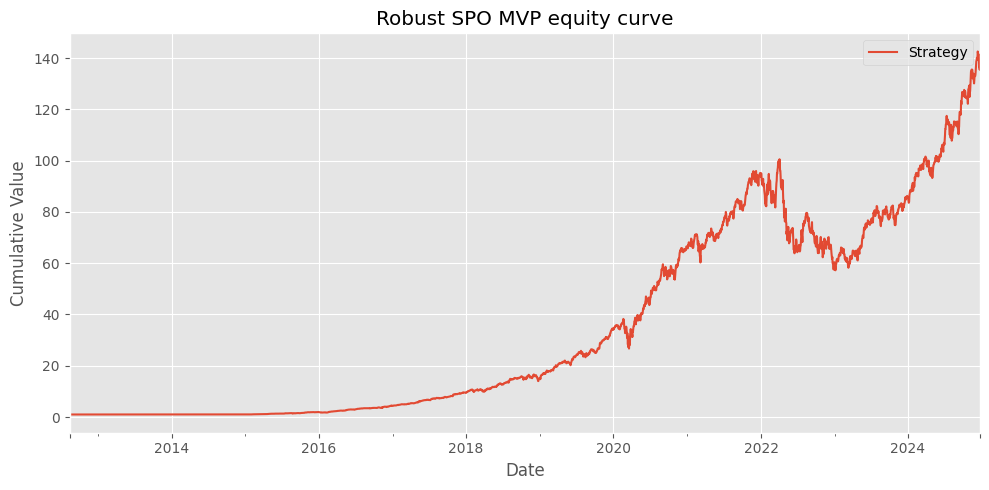


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.960
  Max drawdown:   -43.070%
  Avg turnover:   27.079%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 133.89050165578467, 'annualized_sharpe': 1.9600479213358966, 'max_drawdown': -0.43069839471300597}
    fitness=1.3936, Sharpe=1.960, max_dd=-43.070%, avg_turn=27.079%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 21.332439423796178, 'annualized_sharpe': 1.293506894732866, 'max_drawdown': -0.33980529632591805}


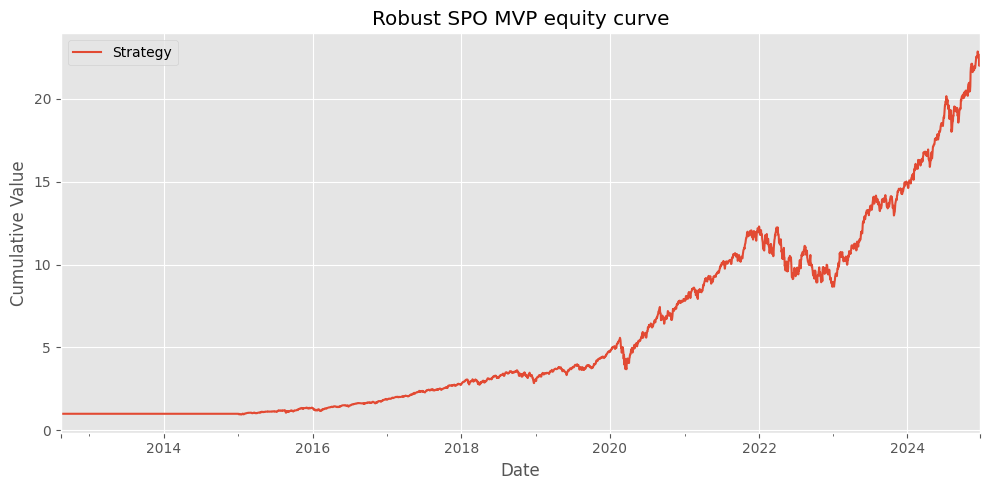


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.433
  Max drawdown:   -33.981%
  Avg turnover:   2.319%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 21.05259420439276, 'annualized_sharpe': 1.4334617196088417, 'max_drawdown': -0.33980529632591827}
    fitness=1.0818, Sharpe=1.433, max_dd=-33.981%, avg_turn=2.319%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 37.646825493899634, 'annualized_sharpe': 1.466279335058623, 'max_drawdown': -0.33968432632659007}


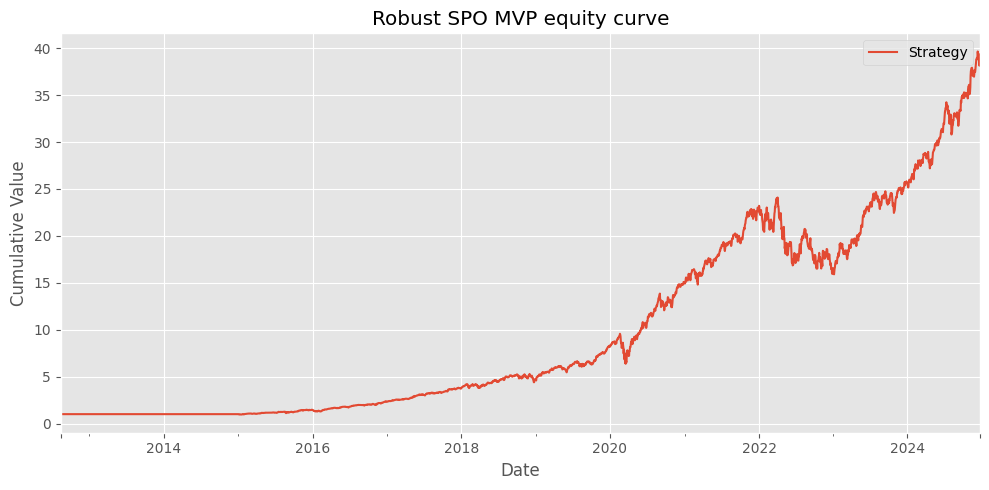


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.625
  Max drawdown:   -33.968%
  Avg turnover:   8.639%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 37.13328986469809, 'annualized_sharpe': 1.6256975049843607, 'max_drawdown': -0.3396843263265903}
    fitness=1.2425, Sharpe=1.625, max_dd=-33.968%, avg_turn=8.639%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 107.14248748631735, 'annualized_sharpe': 1.6957189287549796, 'max_drawdown': -0.3875070957447567}


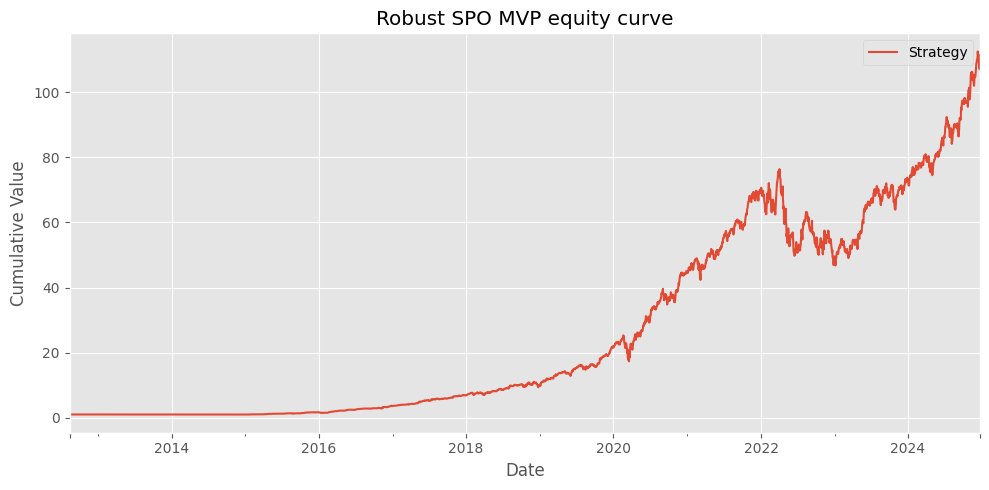


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.881
  Max drawdown:   -38.751%
  Avg turnover:   15.552%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 105.50175031974632, 'annualized_sharpe': 1.8812151729200226, 'max_drawdown': -0.3875070957447563}
    fitness=1.4156, Sharpe=1.881, max_dd=-38.751%, avg_turn=15.552%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 29.76573054026337, 'annualized_sharpe': 1.4044439680033047, 'max_drawdown': -0.3297027269575469}


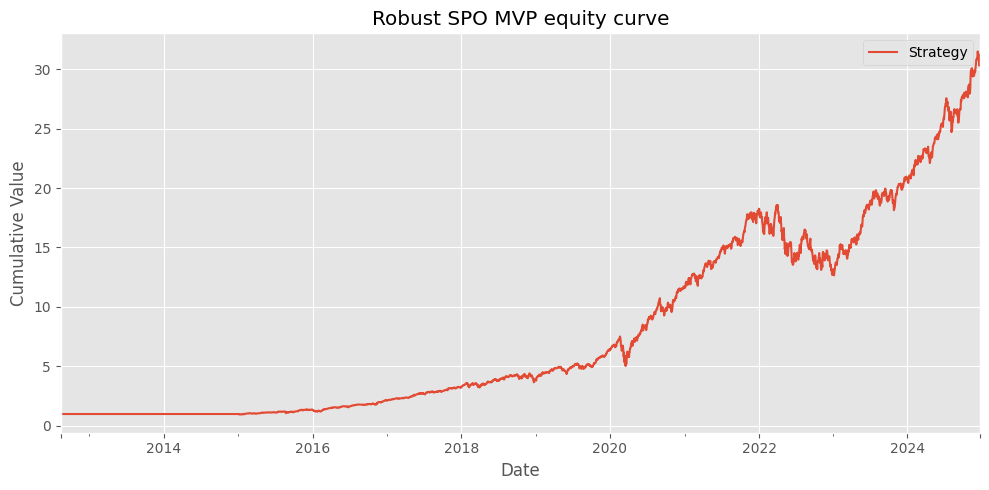


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.557
  Max drawdown:   -32.970%
  Avg turnover:   4.493%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 29.37183235556858, 'annualized_sharpe': 1.5569992225611493, 'max_drawdown': -0.32970272695754665}
    fitness=1.2045, Sharpe=1.557, max_dd=-32.970%, avg_turn=4.493%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 26.901014130034575, 'annualized_sharpe': 1.3829610136608372, 'max_drawdown': -0.339697579768778}


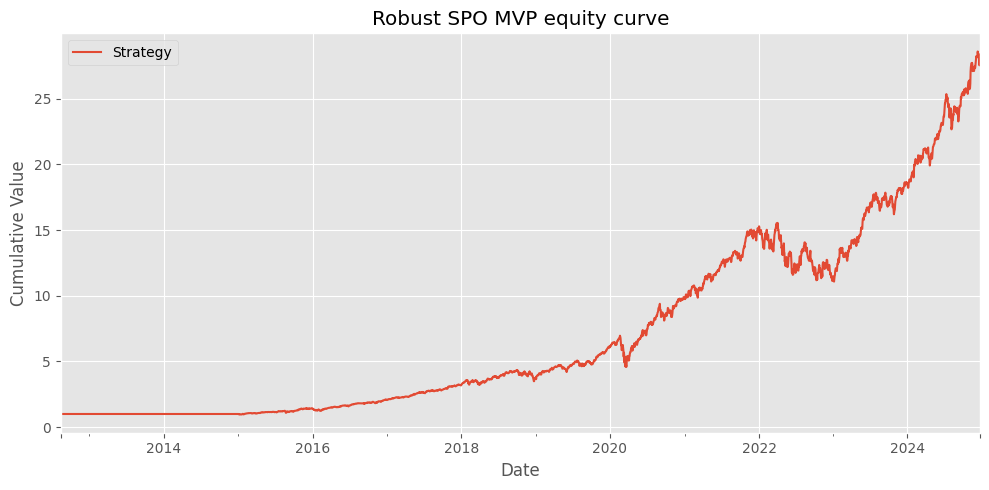


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.533
  Max drawdown:   -33.970%
  Avg turnover:   6.768%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 26.559812576032723, 'annualized_sharpe': 1.5332147934331044, 'max_drawdown': -0.33969757976877835}
    fitness=1.1594, Sharpe=1.533, max_dd=-33.970%, avg_turn=6.768%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 96.62210839698851, 'annualized_sharpe': 1.6871826620704615, 'max_drawdown': -0.38682014999041714}


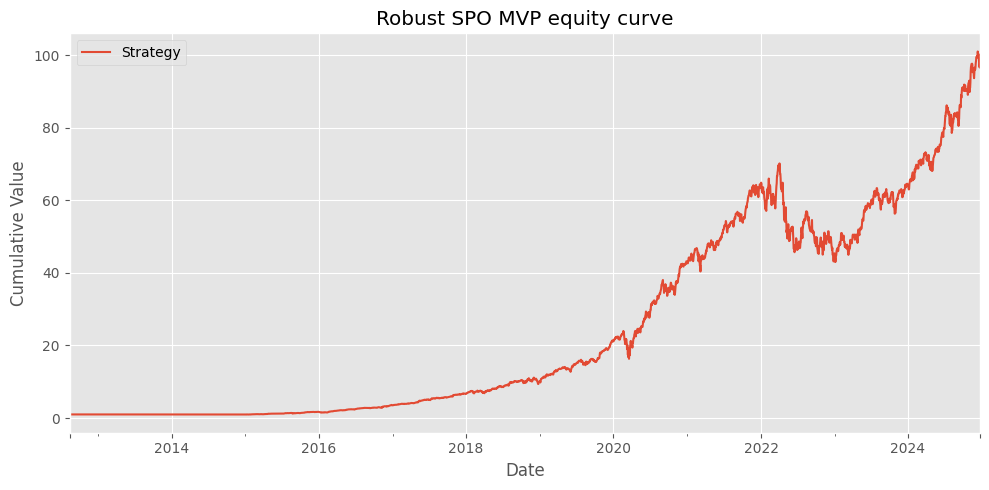


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.872
  Max drawdown:   -38.682%
  Avg turnover:   21.793%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 95.2816572427363, 'annualized_sharpe': 1.8722749279566049, 'max_drawdown': -0.3868201499904166}
    fitness=1.3761, Sharpe=1.872, max_dd=-38.682%, avg_turn=21.793%

Generation 1 best: fitness=1.4156, Sharpe=1.881, max_dd=-38.751%, avg_turn=15.552%

--- GA Generation 2/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 107.14248748631735, 'annualized_sharpe': 1.6957189287549796, 'max_drawdown'

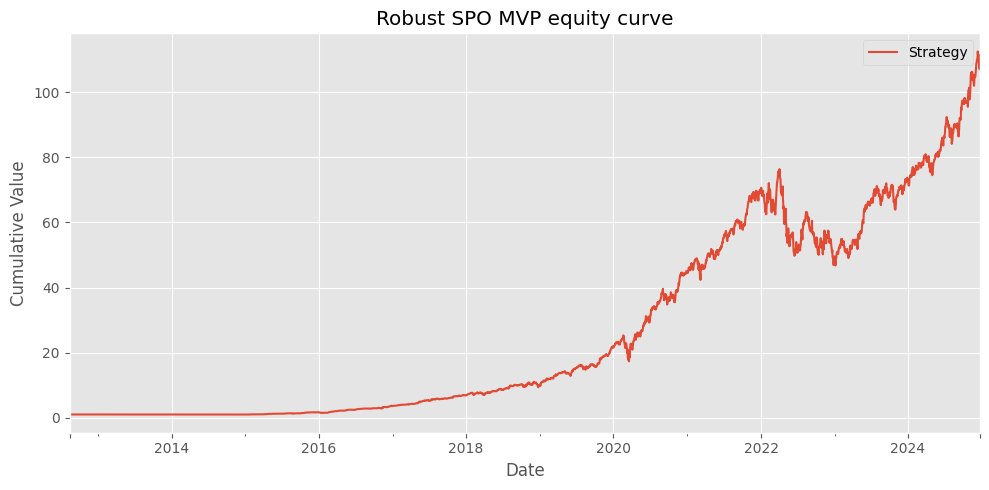


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.881
  Max drawdown:   -38.751%
  Avg turnover:   15.552%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 105.50175031974632, 'annualized_sharpe': 1.8812151729200226, 'max_drawdown': -0.3875070957447563}
    fitness=1.4156, Sharpe=1.881, max_dd=-38.751%, avg_turn=15.552%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 136.03793881232008, 'annualized_sharpe': 1.7668585801018948, 'max_drawdown': -0.43069839471300575}


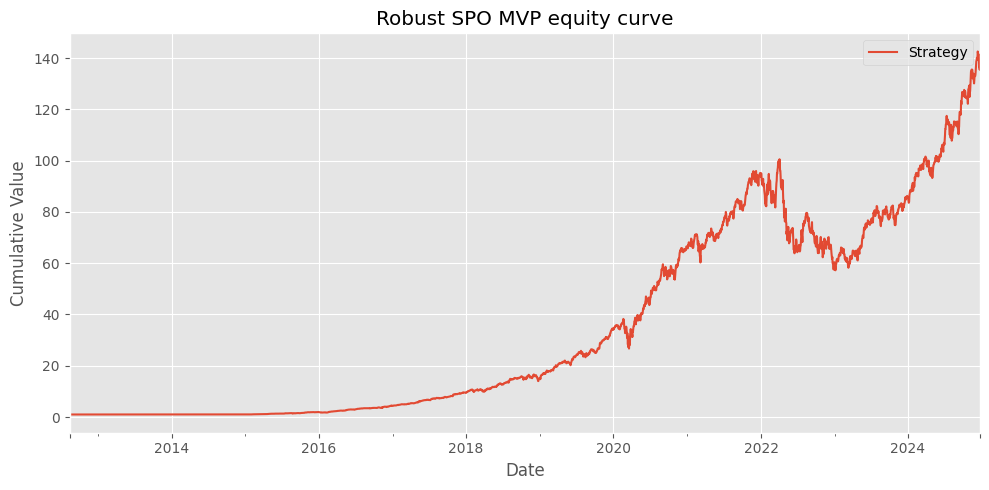


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.960
  Max drawdown:   -43.070%
  Avg turnover:   27.079%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 133.89050165578467, 'annualized_sharpe': 1.9600479213358966, 'max_drawdown': -0.43069839471300597}
    fitness=1.3936, Sharpe=1.960, max_dd=-43.070%, avg_turn=27.079%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 96.62210839698851, 'annualized_sharpe': 1.6871826620704615, 'max_drawdown': -0.38682014999041714}


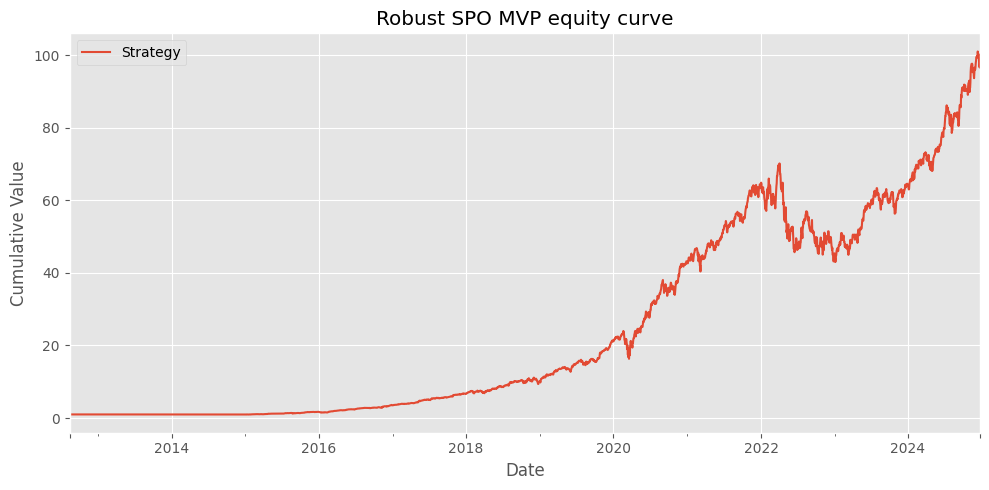


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.872
  Max drawdown:   -38.682%
  Avg turnover:   21.793%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 95.2816572427363, 'annualized_sharpe': 1.8722749279566049, 'max_drawdown': -0.3868201499904166}
    fitness=1.3761, Sharpe=1.872, max_dd=-38.682%, avg_turn=21.793%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 57.86883695500511, 'annualized_sharpe': 1.6174421433864083, 'max_drawdown': -0.36832800655502773}


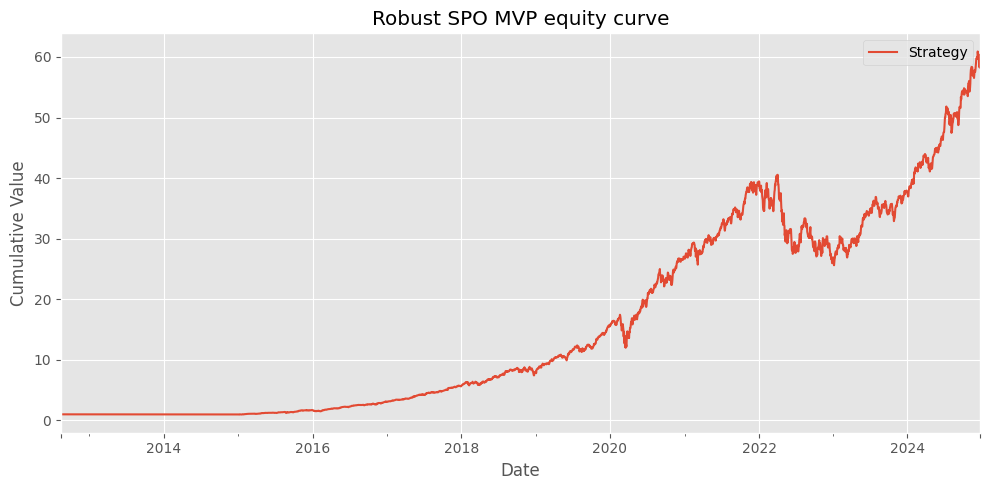


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.793
  Max drawdown:   -36.833%
  Avg turnover:   20.311%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 57.03220084252141, 'annualized_sharpe': 1.7937202715690836, 'max_drawdown': -0.36832800655502784}
    fitness=1.3235, Sharpe=1.793, max_dd=-36.833%, avg_turn=20.311%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 77.9188826796358, 'annualized_sharpe': 1.6697676760569151, 'max_drawdown': -0.3986575264569392}


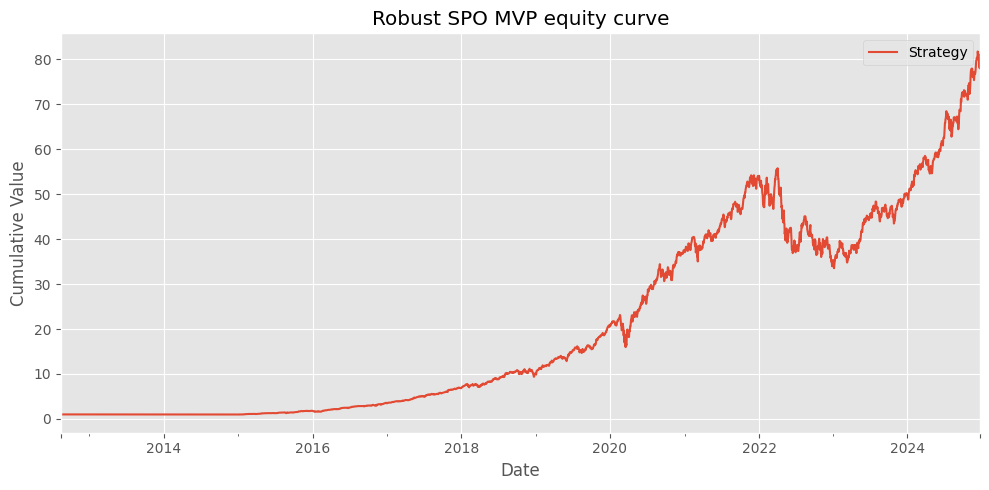


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.852
  Max drawdown:   -39.866%
  Avg turnover:   22.889%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 76.74261538293344, 'annualized_sharpe': 1.8519433458189944, 'max_drawdown': -0.39865752645693875}
    fitness=1.3385, Sharpe=1.852, max_dd=-39.866%, avg_turn=22.889%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 85.49909862687211, 'annualized_sharpe': 1.647323773289099, 'max_drawdown': -0.37887088605278574}


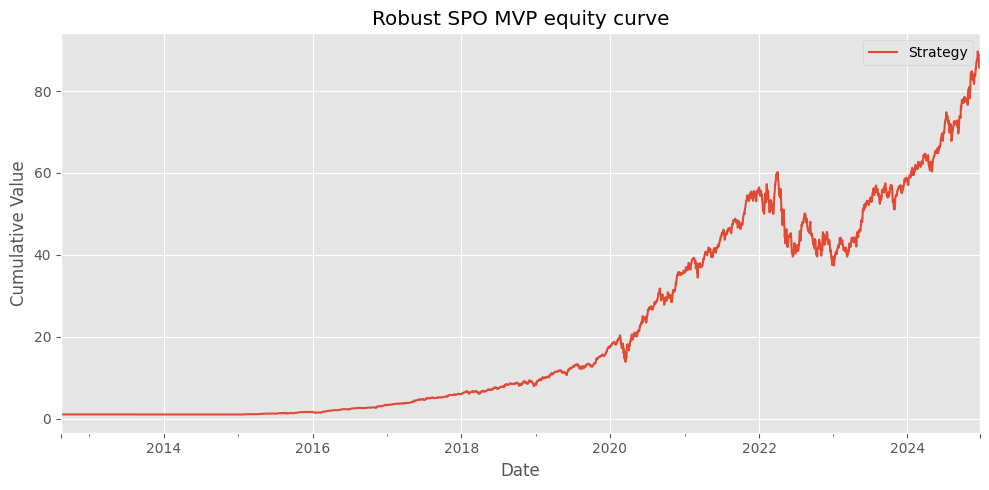


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.827
  Max drawdown:   -37.887%
  Avg turnover:   13.896%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 84.24139702391602, 'annualized_sharpe': 1.8274313882356223, 'max_drawdown': -0.37887088605278585}
    fitness=1.3787, Sharpe=1.827, max_dd=-37.887%, avg_turn=13.896%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 106.37735870885963, 'annualized_sharpe': 1.69107047403134, 'max_drawdown': -0.4283015562843957}


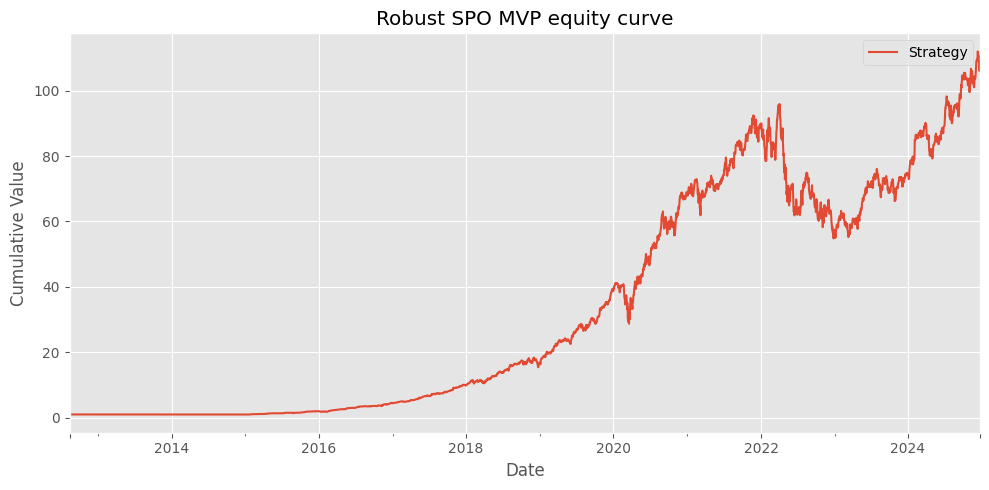


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.876
  Max drawdown:   -42.830%
  Avg turnover:   41.762%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 104.79655810100454, 'annualized_sharpe': 1.875995083586671, 'max_drawdown': -0.4283015562843957}
    fitness=1.2385, Sharpe=1.876, max_dd=-42.830%, avg_turn=41.762%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 43.38176149206855, 'annualized_sharpe': 1.500280538213557, 'max_drawdown': -0.34731792661972616}


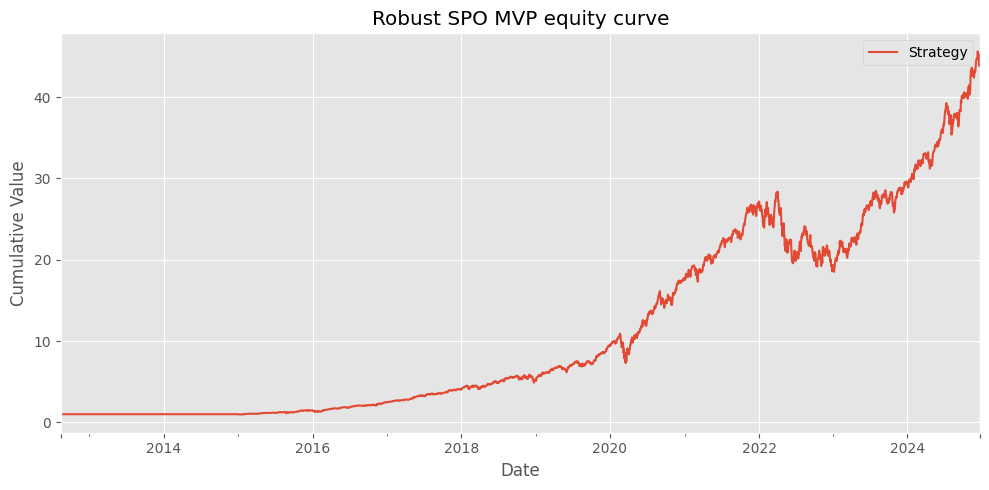


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.663
  Max drawdown:   -34.732%
  Avg turnover:   10.338%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 42.7899041185251, 'annualized_sharpe': 1.6636543582858927, 'max_drawdown': -0.3473179266197264}
    fitness=1.2643, Sharpe=1.663, max_dd=-34.732%, avg_turn=10.338%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 73.70606503788692, 'annualized_sharpe': 1.6318311682717719, 'max_drawdown': -0.3653958021576429}


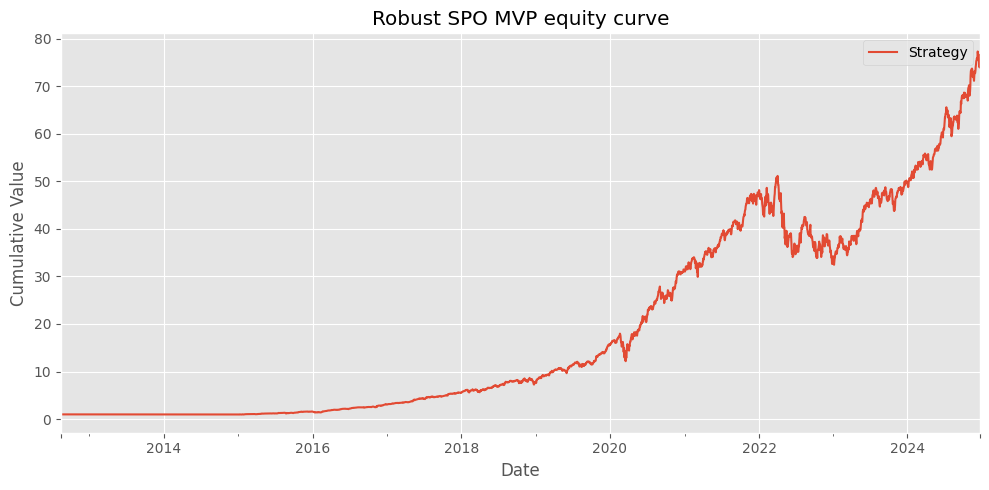


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.810
  Max drawdown:   -36.540%
  Avg turnover:   14.589%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 72.64672660756469, 'annualized_sharpe': 1.8101361665352689, 'max_drawdown': -0.3653958021576438}
    fitness=1.3714, Sharpe=1.810, max_dd=-36.540%, avg_turn=14.589%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 40.74476533409173, 'annualized_sharpe': 1.49089496002524, 'max_drawdown': -0.3434639225313765}


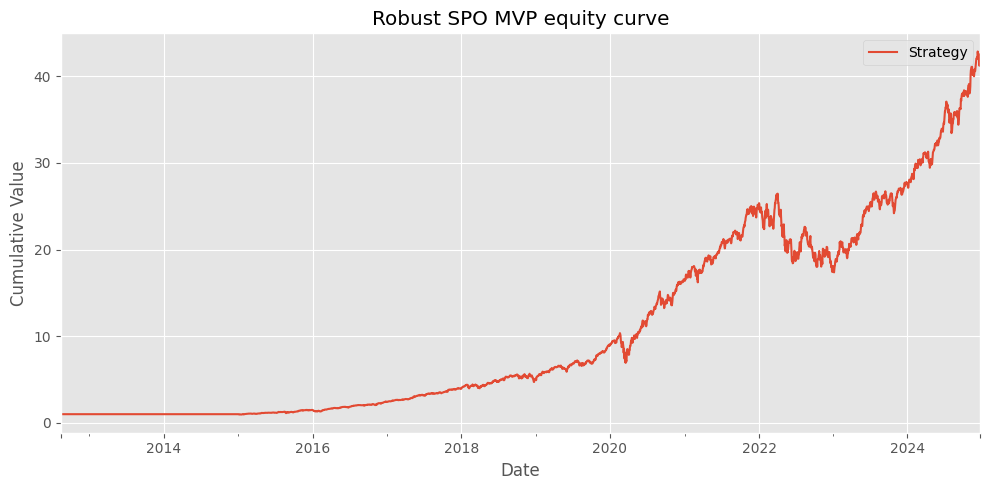


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.653
  Max drawdown:   -34.346%
  Avg turnover:   10.767%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 40.199356530775106, 'annualized_sharpe': 1.6532812459947643, 'max_drawdown': -0.3434639225313756}
    fitness=1.2557, Sharpe=1.653, max_dd=-34.346%, avg_turn=10.767%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 45.43571820605905, 'annualized_sharpe': 1.563553744358503, 'max_drawdown': -0.34782411946721103}


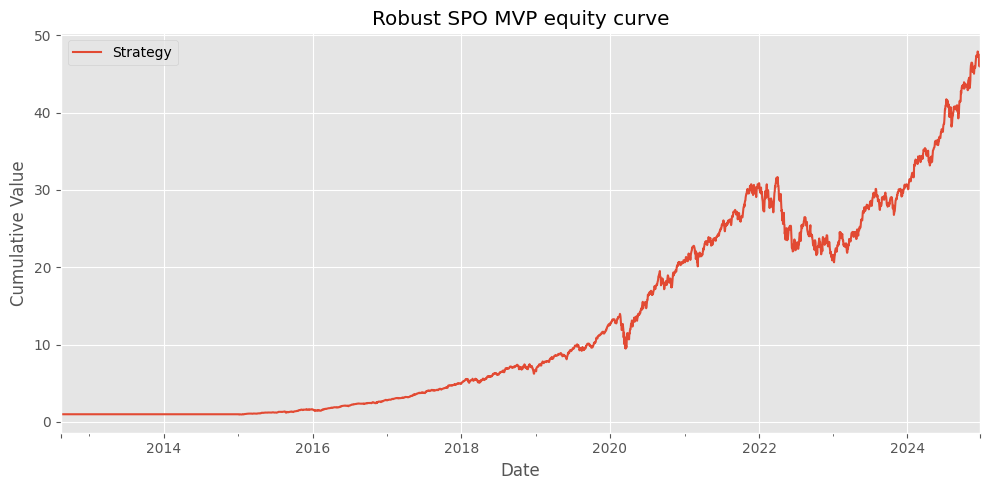


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.734
  Max drawdown:   -34.782%
  Avg turnover:   19.639%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 44.81866802976317, 'annualized_sharpe': 1.7339171932223891, 'max_drawdown': -0.34782411946721103}
    fitness=1.2876, Sharpe=1.734, max_dd=-34.782%, avg_turn=19.639%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 164.1958282758545, 'annualized_sharpe': 1.7943505931722636, 'max_drawdown': -0.43263161143534656}


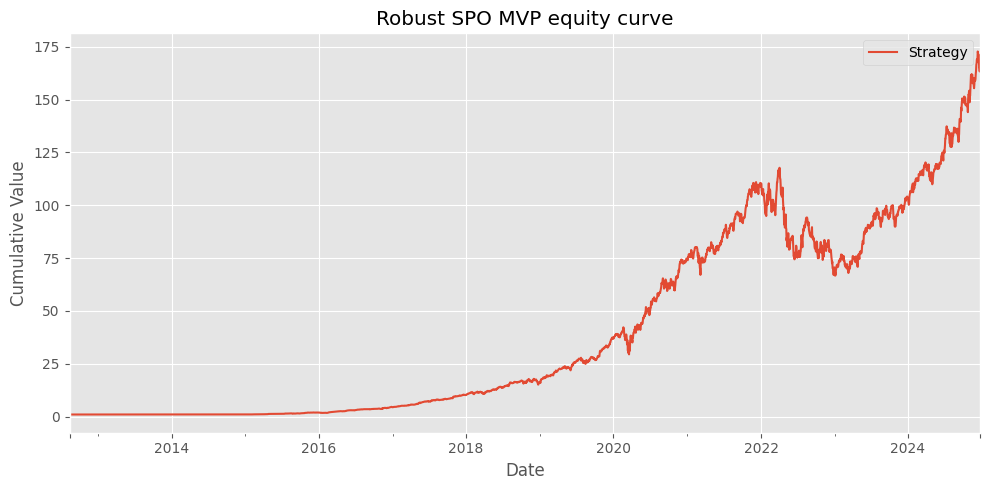


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.990
  Max drawdown:   -43.263%
  Avg turnover:   24.108%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 161.4969352239096, 'annualized_sharpe': 1.9904675329702224, 'max_drawdown': -0.4326316114353467}
    fitness=1.4369, Sharpe=1.990, max_dd=-43.263%, avg_turn=24.108%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 96.38557137839412, 'annualized_sharpe': 1.7107984891153765, 'max_drawdown': -0.390796742937757}


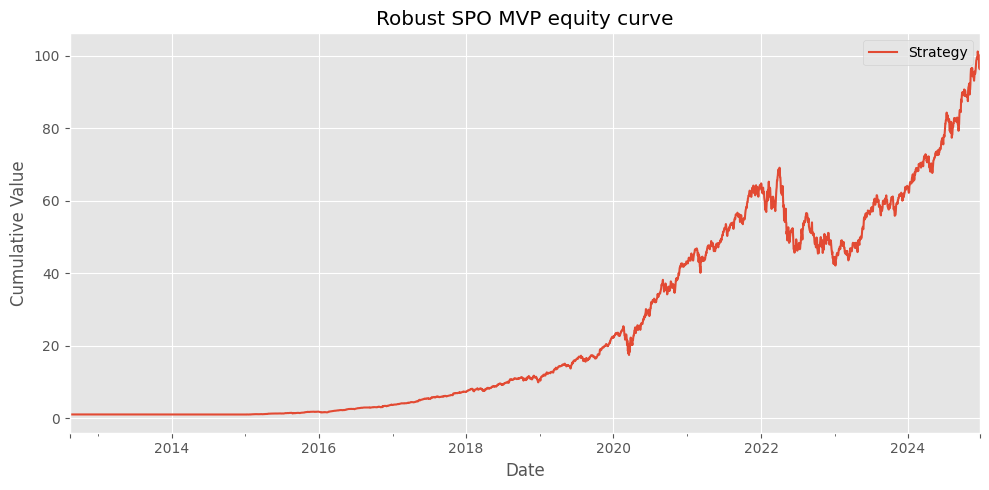


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.897
  Max drawdown:   -39.080%
  Avg turnover:   19.267%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 94.88144491194059, 'annualized_sharpe': 1.8975277758672637, 'max_drawdown': -0.3907967429377569}
    fitness=1.4100, Sharpe=1.897, max_dd=-39.080%, avg_turn=19.267%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 52.345138958960476, 'annualized_sharpe': 1.5745221301871484, 'max_drawdown': -0.3515547313663685}


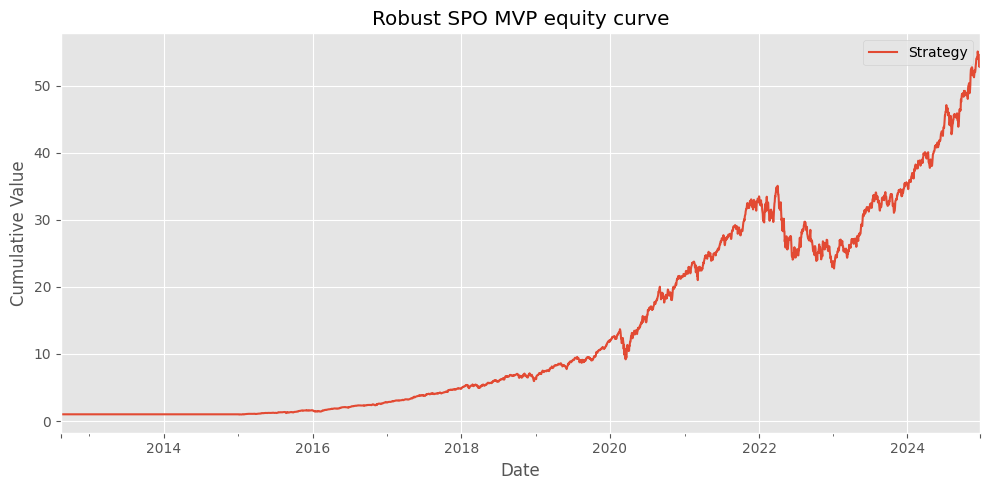


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.745
  Max drawdown:   -35.155%
  Avg turnover:   12.494%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 51.58421161043056, 'annualized_sharpe': 1.7457802985638888, 'max_drawdown': -0.3515547313663687}
    fitness=1.3314, Sharpe=1.745, max_dd=-35.155%, avg_turn=12.494%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 38.10203556010478, 'annualized_sharpe': 1.5095434229980158, 'max_drawdown': -0.3289848951094514}


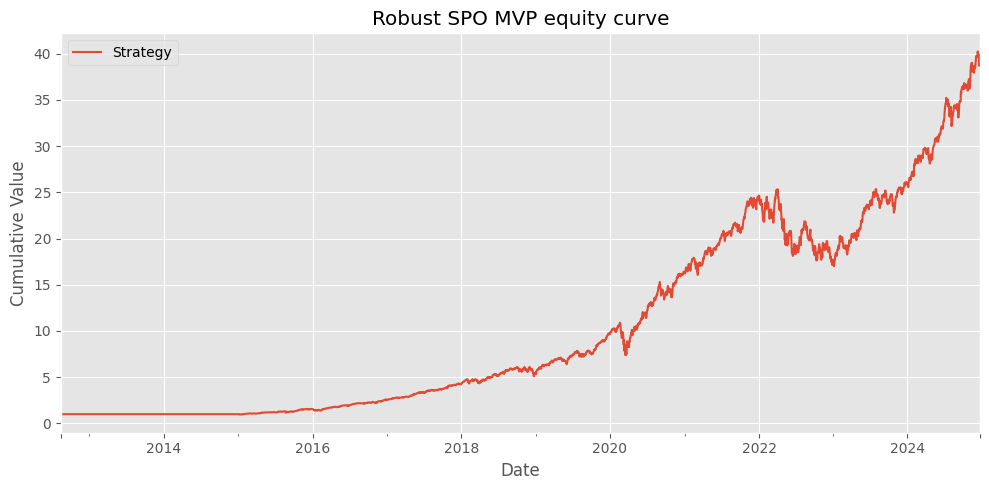


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.674
  Max drawdown:   -32.898%
  Avg turnover:   15.601%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 37.61062733973424, 'annualized_sharpe': 1.6740752992213932, 'max_drawdown': -0.3289848951094516}
    fitness=1.2668, Sharpe=1.674, max_dd=-32.898%, avg_turn=15.601%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 57.63301067970924, 'annualized_sharpe': 1.61618104416297, 'max_drawdown': -0.36823422688583674}


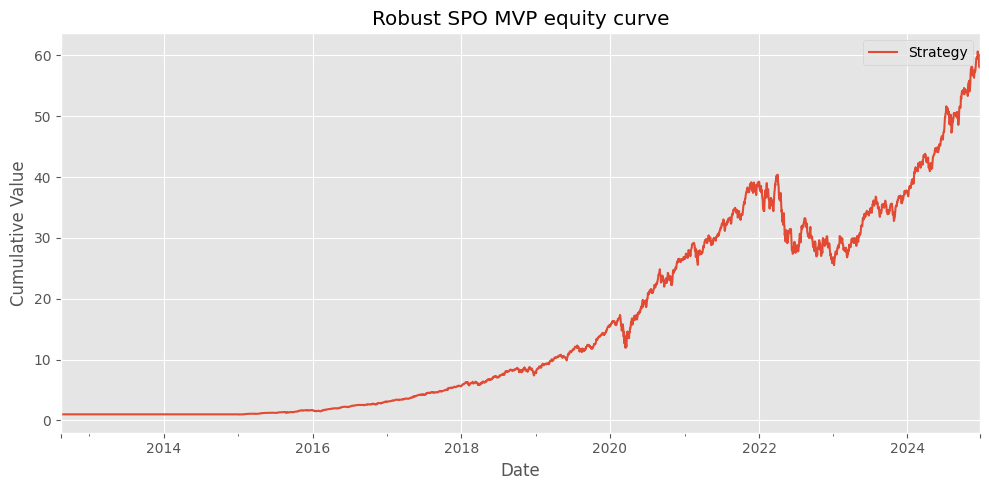


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.792
  Max drawdown:   -36.823%
  Avg turnover:   20.190%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 56.80176975855813, 'annualized_sharpe': 1.7923272152866558, 'max_drawdown': -0.3682342268858366}
    fitness=1.3228, Sharpe=1.792, max_dd=-36.823%, avg_turn=20.190%

Generation 2 best: fitness=1.4369, Sharpe=1.990, max_dd=-43.263%, avg_turn=24.108%

--- GA Generation 3/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 164.1958282758545, 'annualized_sharpe': 1.7943505931722636, 'max_drawdown'

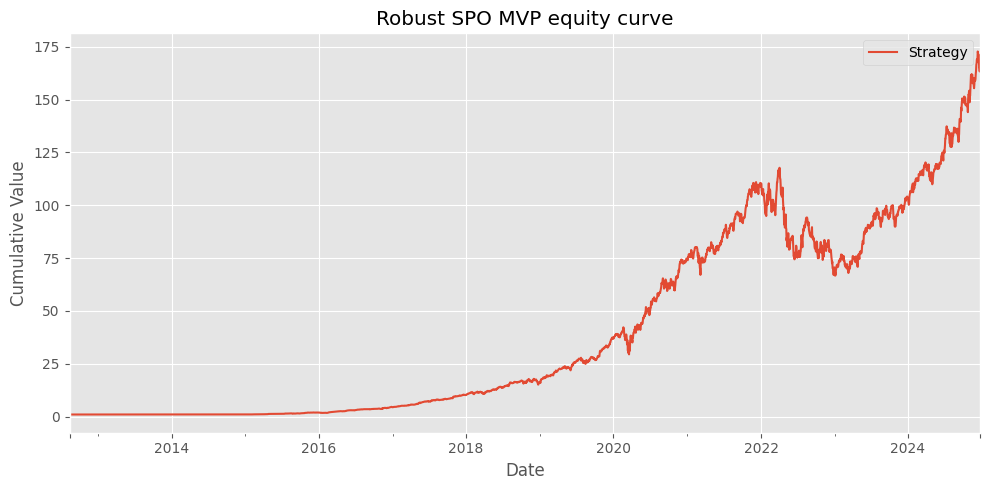


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.990
  Max drawdown:   -43.263%
  Avg turnover:   24.108%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 161.4969352239096, 'annualized_sharpe': 1.9904675329702224, 'max_drawdown': -0.4326316114353467}
    fitness=1.4369, Sharpe=1.990, max_dd=-43.263%, avg_turn=24.108%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 107.14248748631735, 'annualized_sharpe': 1.6957189287549796, 'max_drawdown': -0.3875070957447567}


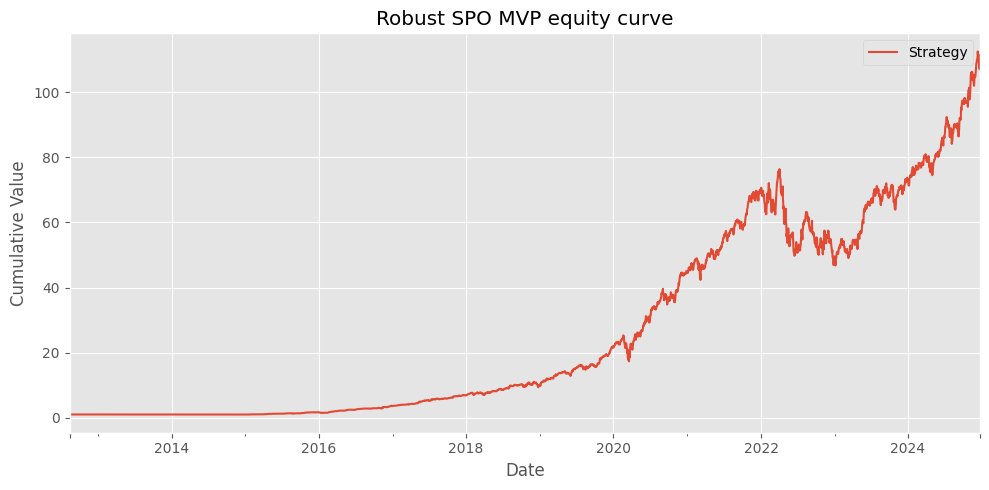


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.881
  Max drawdown:   -38.751%
  Avg turnover:   15.552%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 105.50175031974632, 'annualized_sharpe': 1.8812151729200226, 'max_drawdown': -0.3875070957447563}
    fitness=1.4156, Sharpe=1.881, max_dd=-38.751%, avg_turn=15.552%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 96.38557137839412, 'annualized_sharpe': 1.7107984891153765, 'max_drawdown': -0.390796742937757}


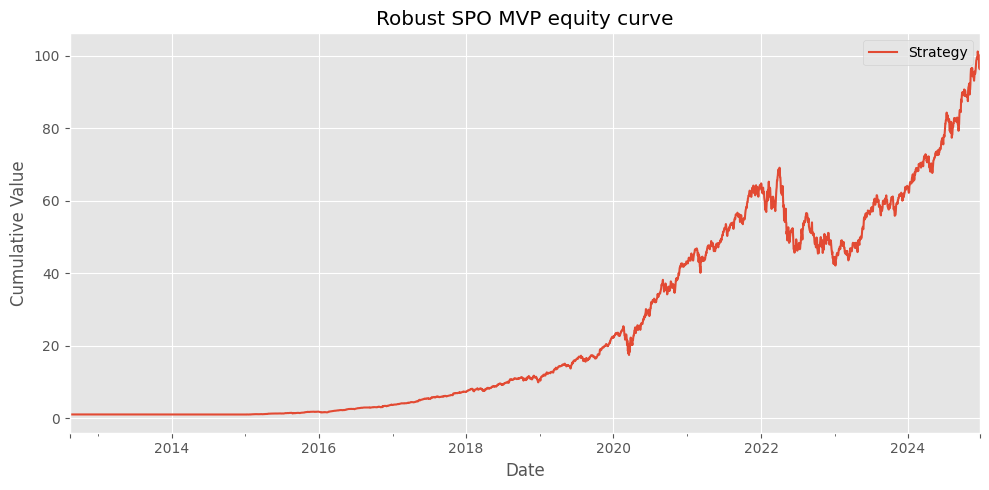


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.897
  Max drawdown:   -39.080%
  Avg turnover:   19.267%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 94.88144491194059, 'annualized_sharpe': 1.8975277758672637, 'max_drawdown': -0.3907967429377569}
    fitness=1.4100, Sharpe=1.897, max_dd=-39.080%, avg_turn=19.267%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 136.03793881232008, 'annualized_sharpe': 1.7668585801018948, 'max_drawdown': -0.43069839471300575}


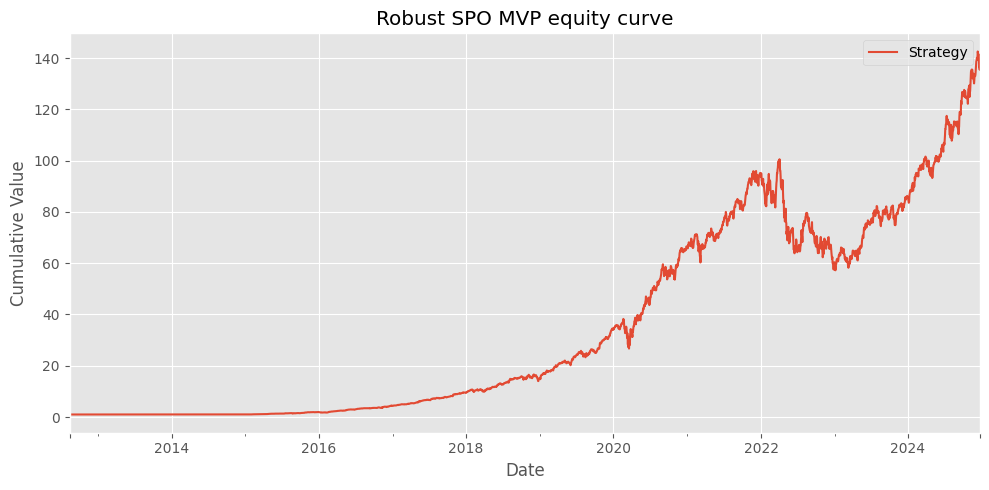


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.960
  Max drawdown:   -43.070%
  Avg turnover:   27.079%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 133.89050165578467, 'annualized_sharpe': 1.9600479213358966, 'max_drawdown': -0.43069839471300597}
    fitness=1.3936, Sharpe=1.960, max_dd=-43.070%, avg_turn=27.079%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.50977506893076, 'annualized_sharpe': 1.7378641430167703, 'max_drawdown': -0.3950147961554715}


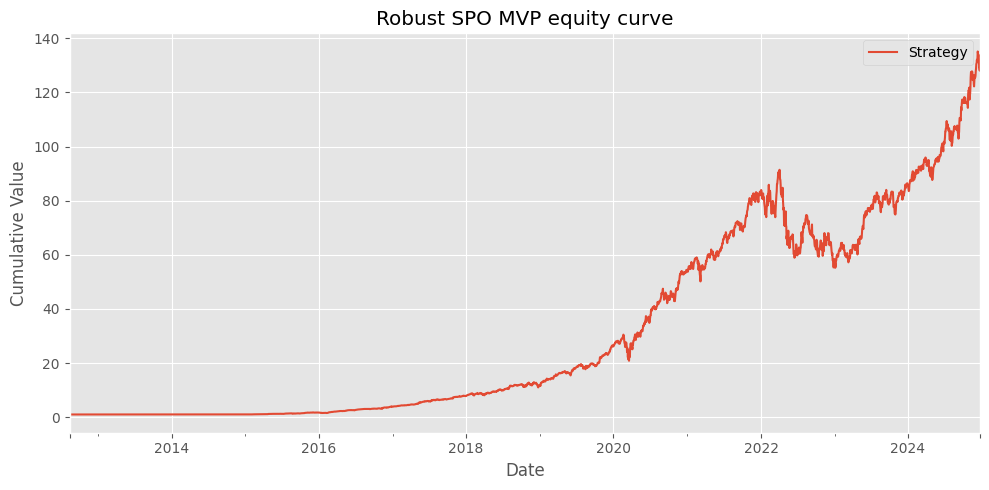


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.928
  Max drawdown:   -39.501%
  Avg turnover:   18.000%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.44849285727035, 'annualized_sharpe': 1.927888507195293, 'max_drawdown': -0.3950147961554702}
    fitness=1.4425, Sharpe=1.928, max_dd=-39.501%, avg_turn=18.000%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 131.17708390564798, 'annualized_sharpe': 1.760130213152694, 'max_drawdown': -0.42522148820362937}


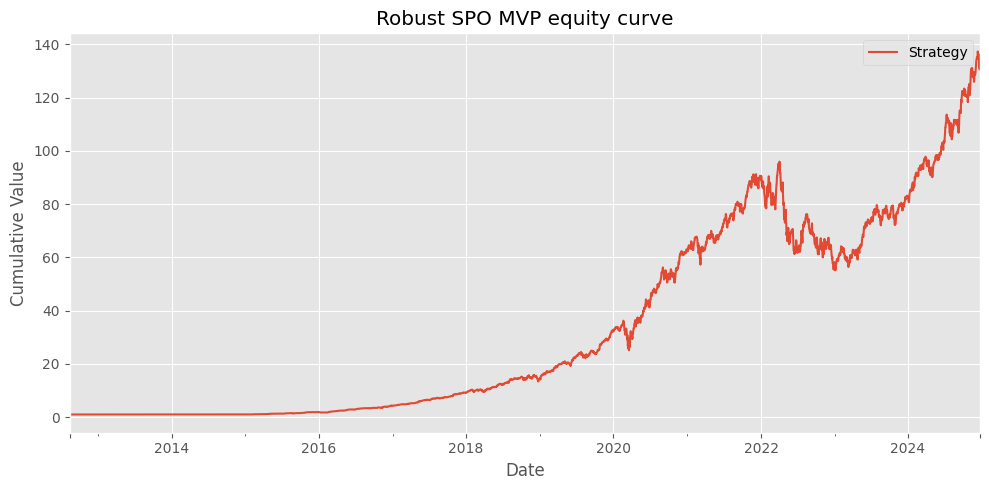


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.952
  Max drawdown:   -42.522%
  Avg turnover:   26.243%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 129.08507511908874, 'annualized_sharpe': 1.9524523718690108, 'max_drawdown': -0.4252214882036298}
    fitness=1.3956, Sharpe=1.952, max_dd=-42.522%, avg_turn=26.243%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 66.79569059239476, 'annualized_sharpe': 1.5822188089093134, 'max_drawdown': -0.3935224766900415}


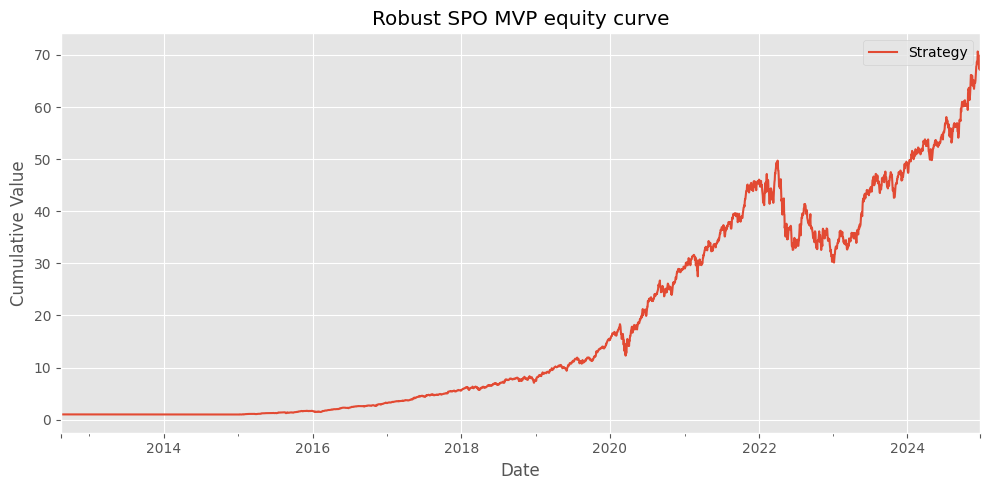


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.753
  Max drawdown:   -39.352%
  Avg turnover:   10.883%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 65.68148736191861, 'annualized_sharpe': 1.7535384451385168, 'max_drawdown': -0.3935224766900416}
    fitness=1.3053, Sharpe=1.753, max_dd=-39.352%, avg_turn=10.883%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 82.62494797242566, 'annualized_sharpe': 1.6536527032523802, 'max_drawdown': -0.3732026282123184}


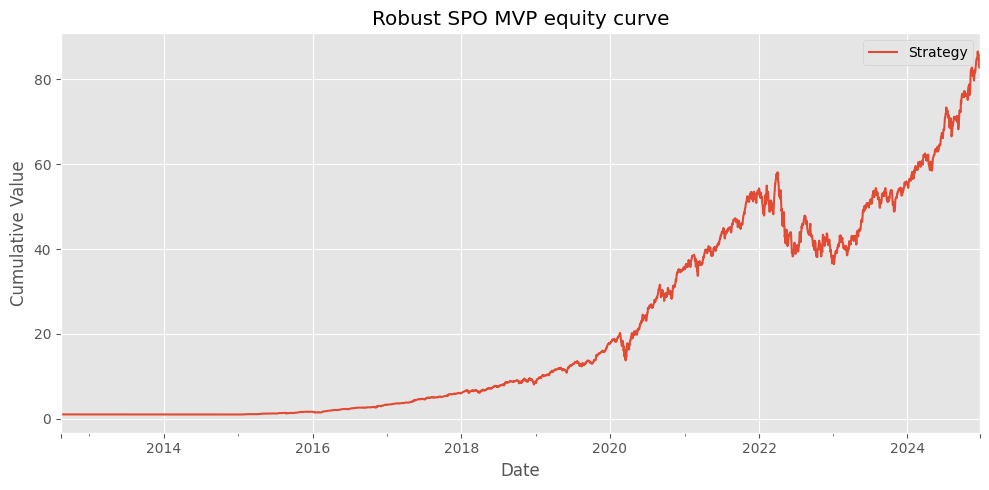


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.834
  Max drawdown:   -37.320%
  Avg turnover:   16.577%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 81.42278335781006, 'annualized_sharpe': 1.8344435648620163, 'max_drawdown': -0.3732026282123193}
    fitness=1.3780, Sharpe=1.834, max_dd=-37.320%, avg_turn=16.577%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 69.32723079549196, 'annualized_sharpe': 1.583658521313433, 'max_drawdown': -0.388708732633111}


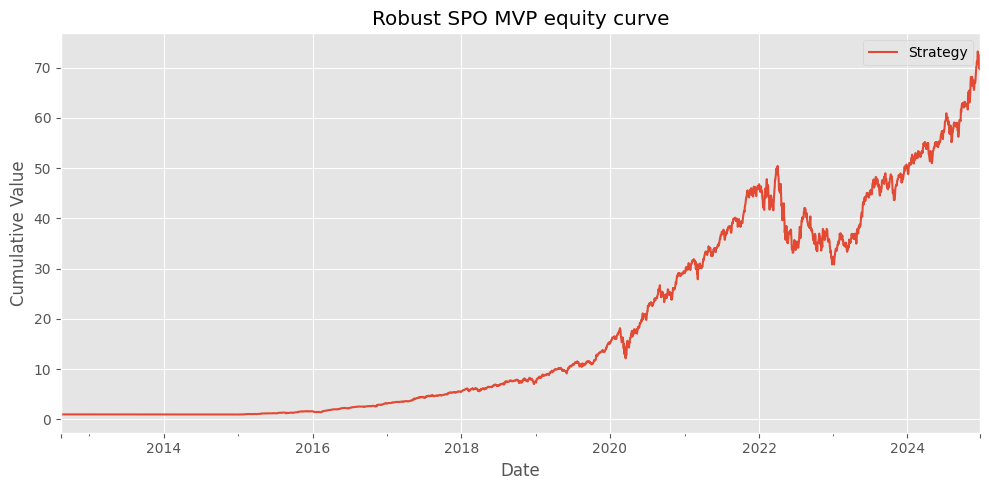


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.756
  Max drawdown:   -38.871%
  Avg turnover:   11.047%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 68.25957528910696, 'annualized_sharpe': 1.756017540468674, 'max_drawdown': -0.38870873263311156}
    fitness=1.3117, Sharpe=1.756, max_dd=-38.871%, avg_turn=11.047%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 124.64455675794004, 'annualized_sharpe': 1.7425682733151628, 'max_drawdown': -0.40300035814803437}


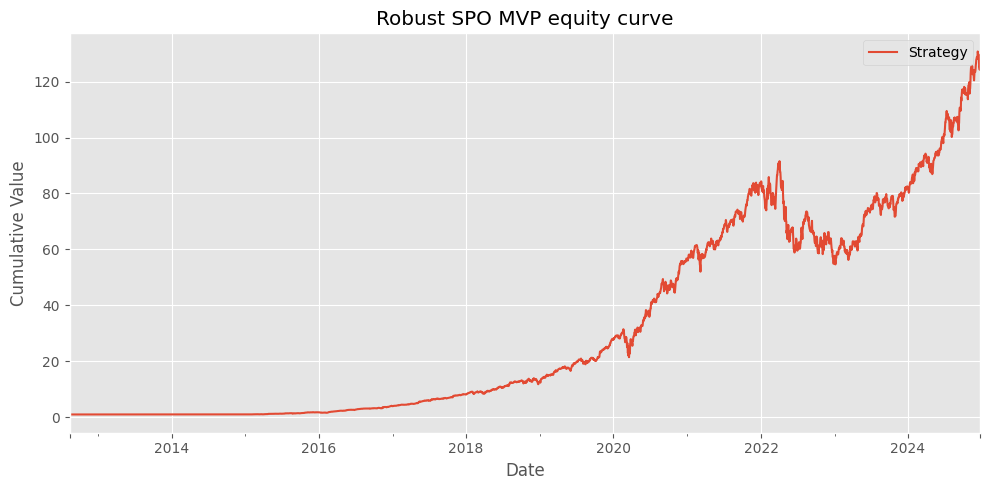


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.933
  Max drawdown:   -40.300%
  Avg turnover:   23.014%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 122.74368543282657, 'annualized_sharpe': 1.933429770398055, 'max_drawdown': -0.40300035814803414}
    fitness=1.4150, Sharpe=1.933, max_dd=-40.300%, avg_turn=23.014%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 148.5458208515282, 'annualized_sharpe': 1.778267844247098, 'max_drawdown': -0.4364175056607579}


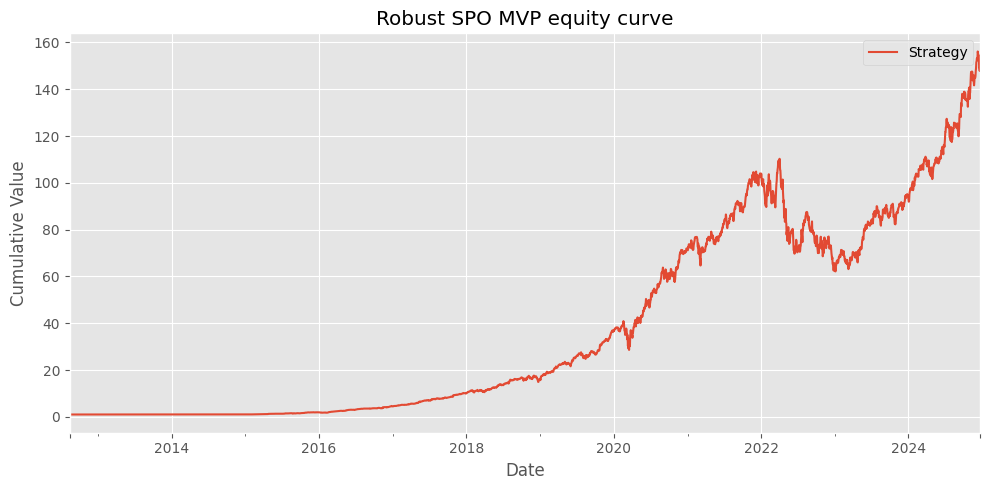


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.972
  Max drawdown:   -43.642%
  Avg turnover:   26.313%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 146.17085355811204, 'annualized_sharpe': 1.9726898122097443, 'max_drawdown': -0.4364175056607579}
    fitness=1.4043, Sharpe=1.972, max_dd=-43.642%, avg_turn=26.313%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 121.18176670410988, 'annualized_sharpe': 1.7537212190925584, 'max_drawdown': -0.4139432048994903}


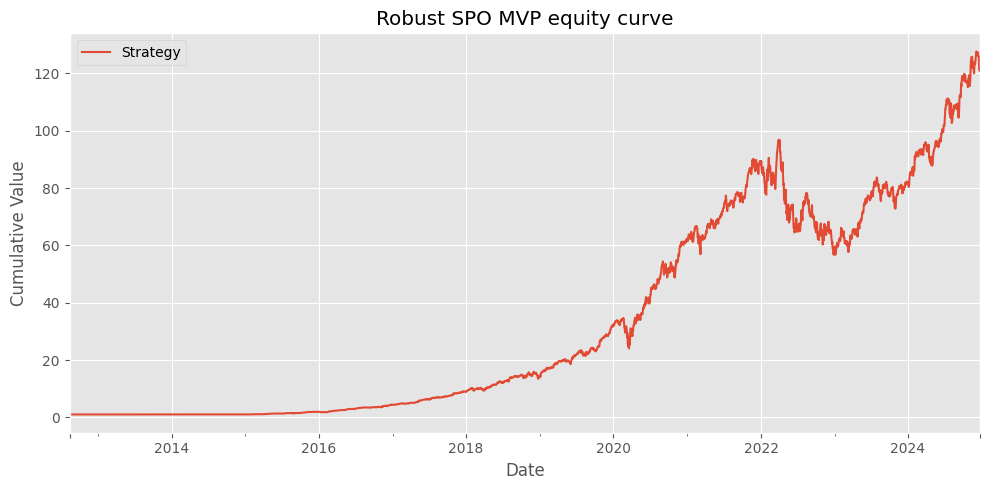


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.947
  Max drawdown:   -41.394%
  Avg turnover:   42.525%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 119.83347086962922, 'annualized_sharpe': 1.947815522418894, 'max_drawdown': -0.41394320489949044}
    fitness=1.3209, Sharpe=1.947, max_dd=-41.394%, avg_turn=42.525%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 134.81253952845157, 'annualized_sharpe': 1.755338371527167, 'max_drawdown': -0.40018892295619923}


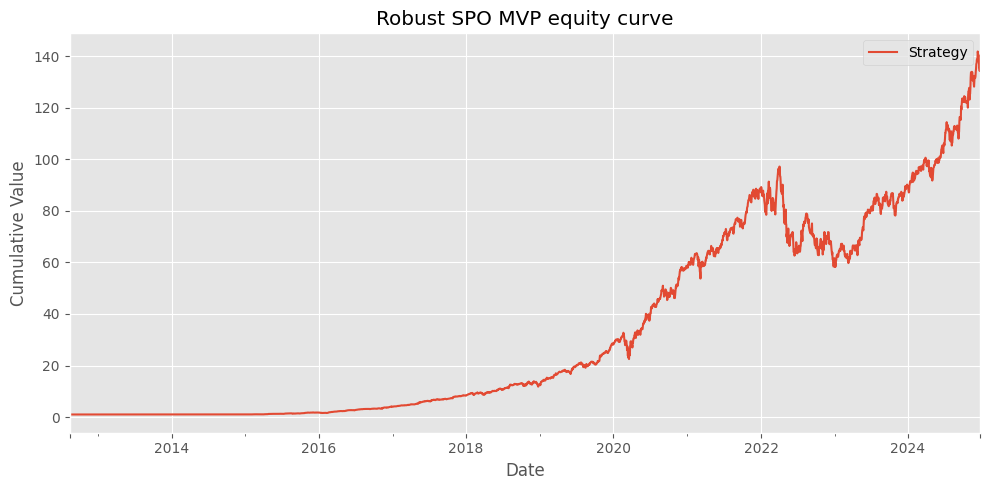


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.947
  Max drawdown:   -40.019%
  Avg turnover:   19.200%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 132.6384414012997, 'annualized_sharpe': 1.9473104008088233, 'max_drawdown': -0.4001889229561991}
    fitness=1.4507, Sharpe=1.947, max_dd=-40.019%, avg_turn=19.200%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 99.32479503124085, 'annualized_sharpe': 1.6369580506308052, 'max_drawdown': -0.4189107433075385}


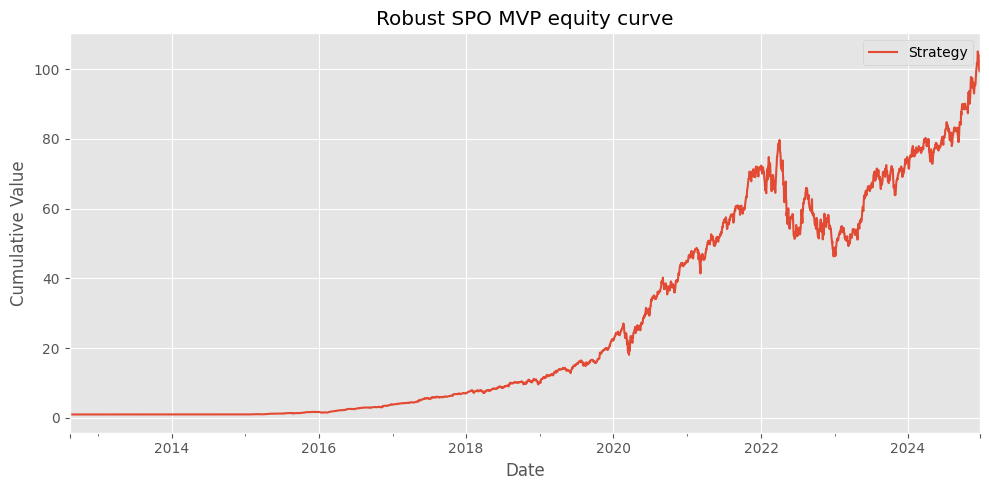


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.814
  Max drawdown:   -41.891%
  Avg turnover:   13.409%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 97.61203040398198, 'annualized_sharpe': 1.8147108183282663, 'max_drawdown': -0.4189107433075385}
    fitness=1.3284, Sharpe=1.814, max_dd=-41.891%, avg_turn=13.409%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 129.28022693342226, 'annualized_sharpe': 1.750097935079946, 'max_drawdown': -0.4060204767278125}


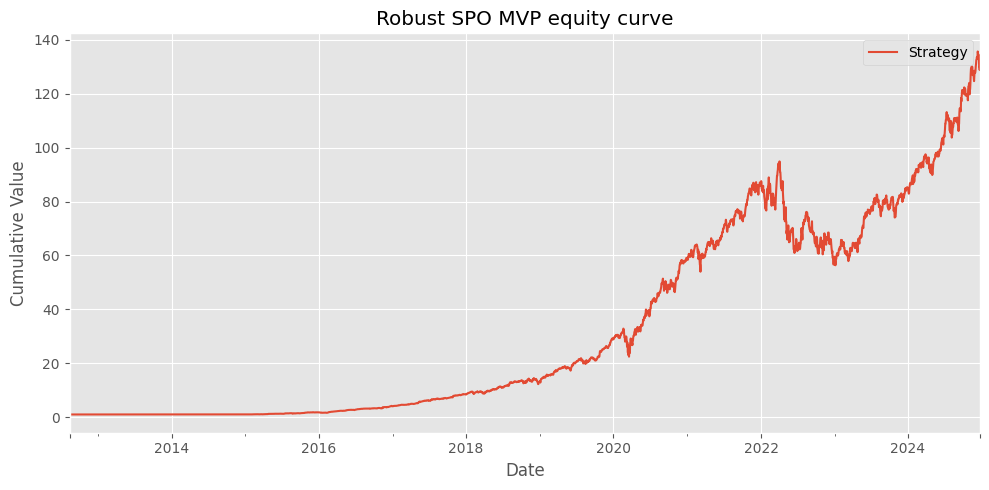


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.941
  Max drawdown:   -40.602%
  Avg turnover:   23.193%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 127.27154459033756, 'annualized_sharpe': 1.9416845138939203, 'max_drawdown': -0.4060204767278135}
    fitness=1.4193, Sharpe=1.941, max_dd=-40.602%, avg_turn=23.193%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 68.00011627509413, 'annualized_sharpe': 1.6247960282606415, 'max_drawdown': -0.361857481100742}


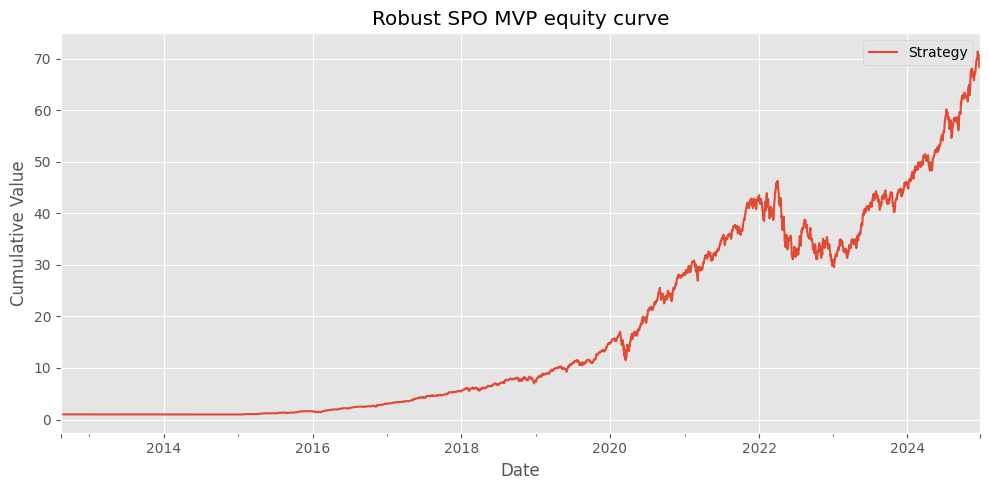


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.802
  Max drawdown:   -36.186%
  Avg turnover:   13.849%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 66.99992850013695, 'annualized_sharpe': 1.8019674766238916, 'max_drawdown': -0.36185748110074234}
    fitness=1.3705, Sharpe=1.802, max_dd=-36.186%, avg_turn=13.849%

Generation 3 best: fitness=1.4507, Sharpe=1.947, max_dd=-40.019%, avg_turn=19.200%

--- GA Generation 4/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 134.81253952845157, 'annualized_sharpe': 1.755338371527167, 'max_drawdown

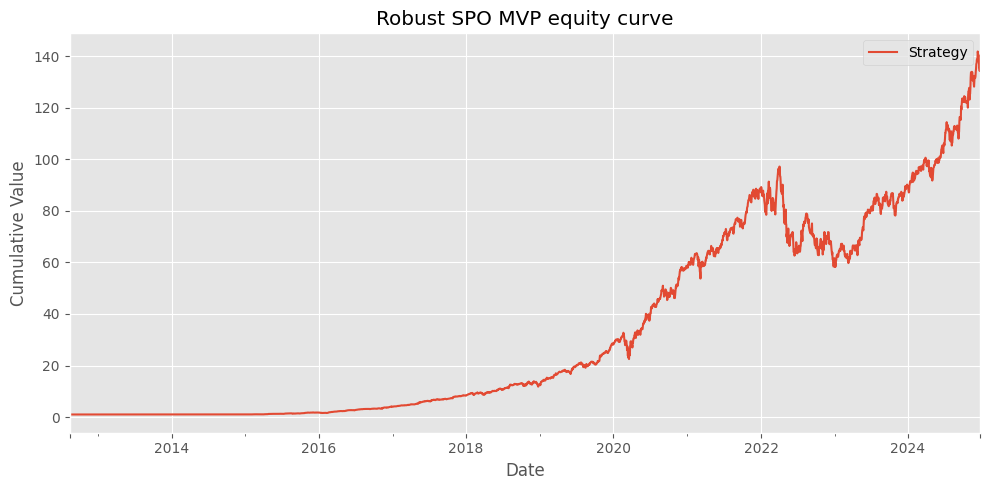


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.947
  Max drawdown:   -40.019%
  Avg turnover:   19.200%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 132.6384414012997, 'annualized_sharpe': 1.9473104008088233, 'max_drawdown': -0.4001889229561991}
    fitness=1.4507, Sharpe=1.947, max_dd=-40.019%, avg_turn=19.200%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.50977506893076, 'annualized_sharpe': 1.7378641430167703, 'max_drawdown': -0.3950147961554715}


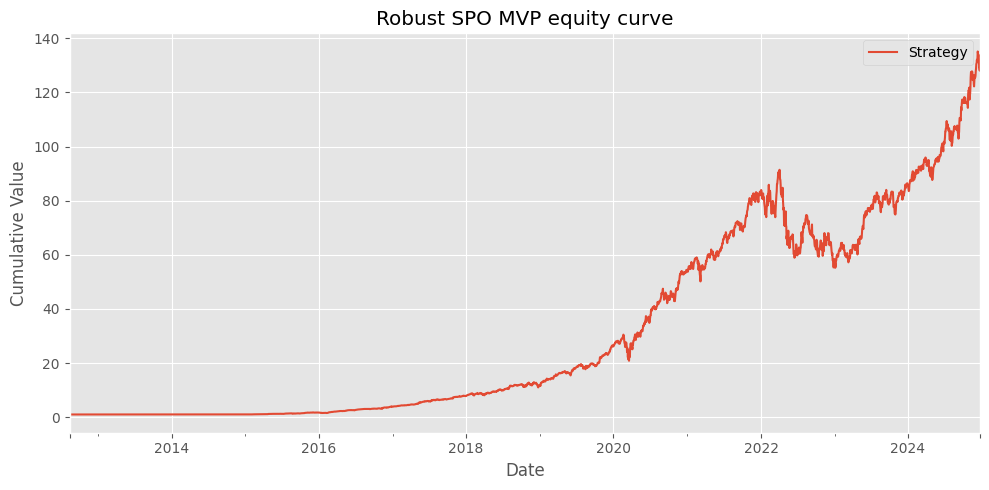


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.928
  Max drawdown:   -39.501%
  Avg turnover:   18.000%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.44849285727035, 'annualized_sharpe': 1.927888507195293, 'max_drawdown': -0.3950147961554702}
    fitness=1.4425, Sharpe=1.928, max_dd=-39.501%, avg_turn=18.000%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 164.1958282758545, 'annualized_sharpe': 1.7943505931722636, 'max_drawdown': -0.43263161143534656}


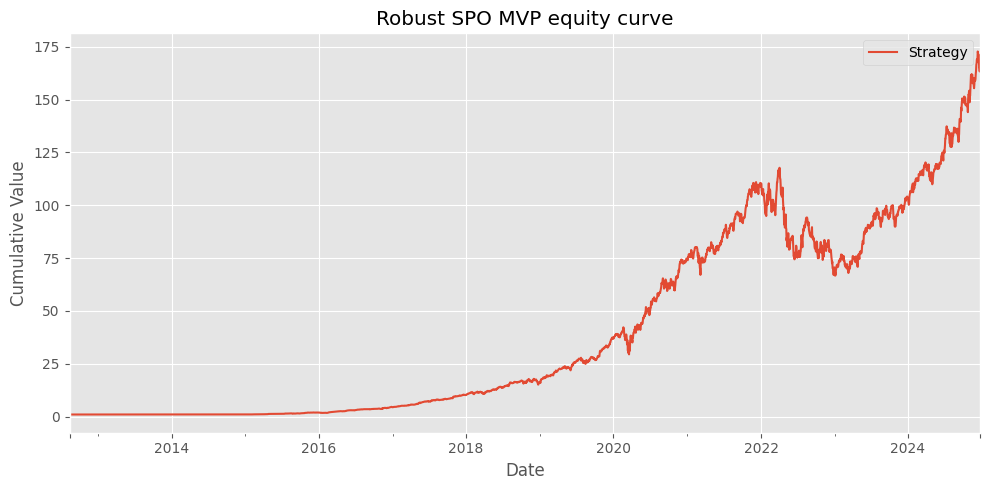


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.990
  Max drawdown:   -43.263%
  Avg turnover:   24.108%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 161.4969352239096, 'annualized_sharpe': 1.9904675329702224, 'max_drawdown': -0.4326316114353467}
    fitness=1.4369, Sharpe=1.990, max_dd=-43.263%, avg_turn=24.108%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 129.28022693342226, 'annualized_sharpe': 1.750097935079946, 'max_drawdown': -0.4060204767278125}


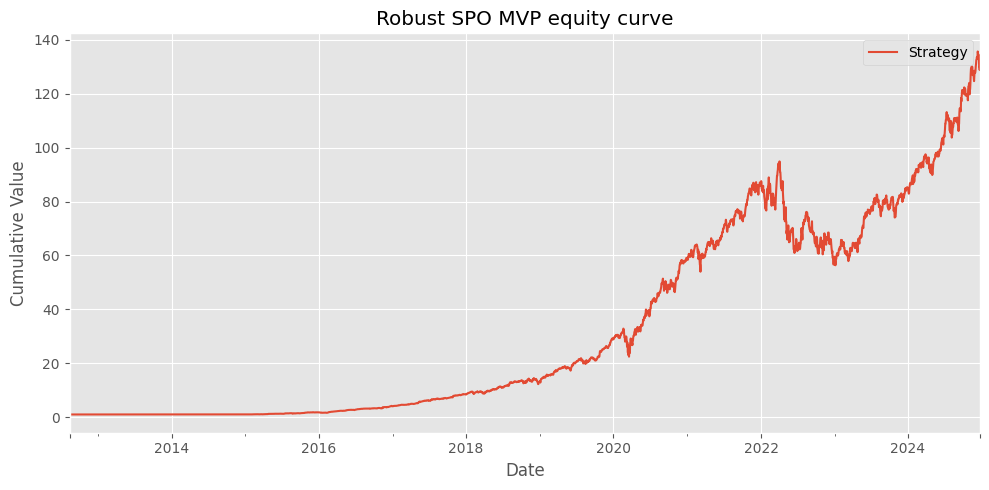


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.941
  Max drawdown:   -40.602%
  Avg turnover:   23.193%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 127.27154459033756, 'annualized_sharpe': 1.9416845138939203, 'max_drawdown': -0.4060204767278135}
    fitness=1.4193, Sharpe=1.941, max_dd=-40.602%, avg_turn=23.193%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 108.91364363129668, 'annualized_sharpe': 1.6977214503290152, 'max_drawdown': -0.3888818876765672}


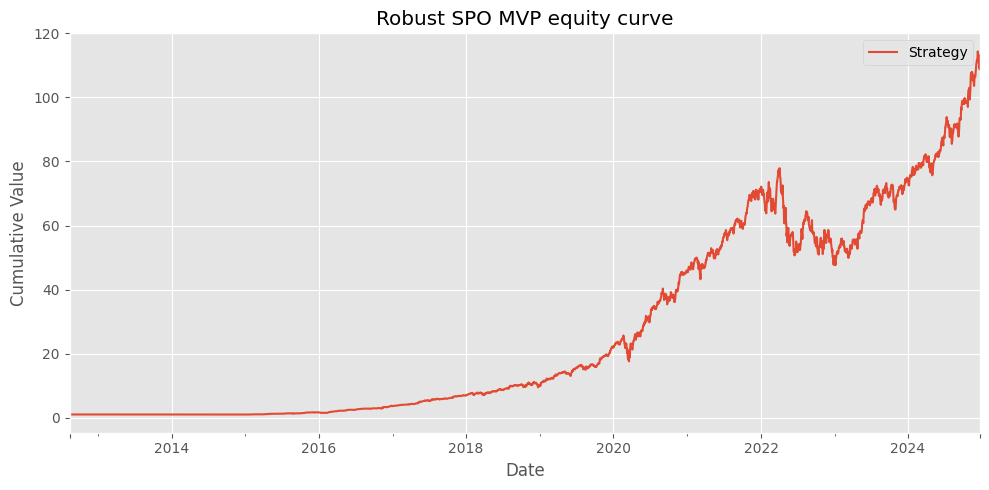


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.883
  Max drawdown:   -38.888%
  Avg turnover:   15.653%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 107.24598599018134, 'annualized_sharpe': 1.883470521648472, 'max_drawdown': -0.38888188767656673}
    fitness=1.4160, Sharpe=1.883, max_dd=-38.888%, avg_turn=15.653%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 123.88059831257041, 'annualized_sharpe': 1.737483369976298, 'max_drawdown': -0.3916740522070664}


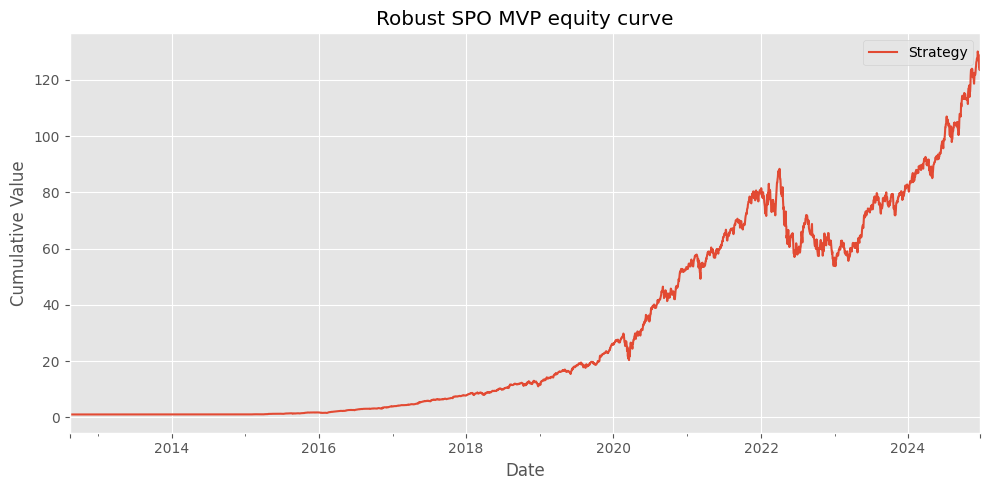


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.927
  Max drawdown:   -39.167%
  Avg turnover:   19.372%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 121.9233331823479, 'annualized_sharpe': 1.92750310348932, 'max_drawdown': -0.3916740522070664}
    fitness=1.4386, Sharpe=1.927, max_dd=-39.167%, avg_turn=19.372%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 91.75873069456726, 'annualized_sharpe': 1.6331927008862286, 'max_drawdown': -0.40831662685631553}


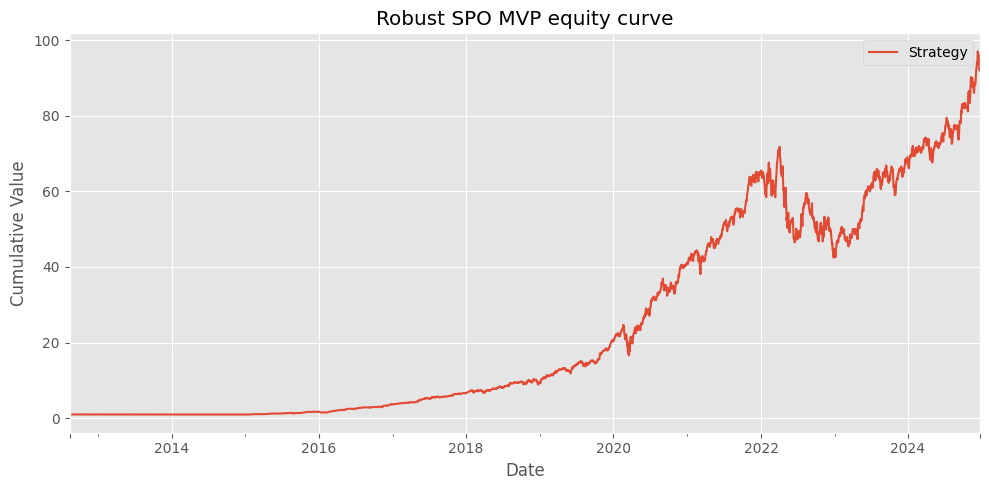


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.811
  Max drawdown:   -40.832%
  Avg turnover:   12.848%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 90.25766152451477, 'annualized_sharpe': 1.8109225001896638, 'max_drawdown': -0.4083166268563154}
    fitness=1.3380, Sharpe=1.811, max_dd=-40.832%, avg_turn=12.848%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 114.70267134273006, 'annualized_sharpe': 1.7410771630598736, 'max_drawdown': -0.4053701221343995}


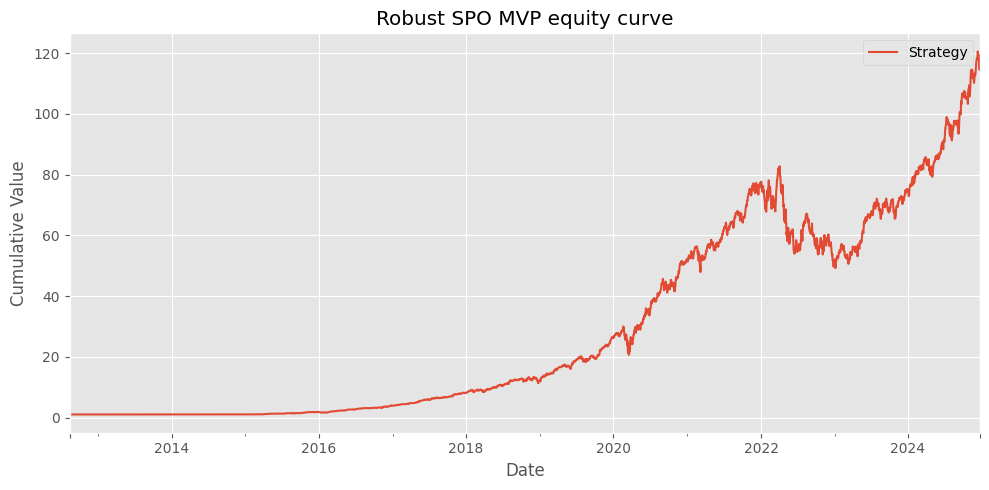


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.931
  Max drawdown:   -40.537%
  Avg turnover:   20.795%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 112.87556698773604, 'annualized_sharpe': 1.9311803095786617, 'max_drawdown': -0.4053701221343997}
    fitness=1.4215, Sharpe=1.931, max_dd=-40.537%, avg_turn=20.795%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 136.08213700998766, 'annualized_sharpe': 1.764719739261678, 'max_drawdown': -0.4186246421398293}


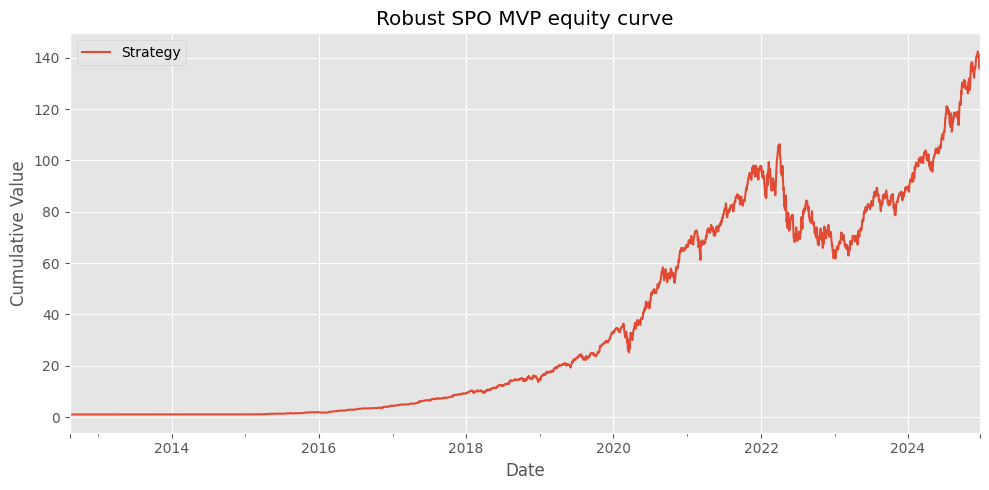


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.958
  Max drawdown:   -41.862%
  Avg turnover:   30.170%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 134.17896299908608, 'annualized_sharpe': 1.9588018115166033, 'max_drawdown': -0.4186246421398294}
    fitness=1.3889, Sharpe=1.958, max_dd=-41.862%, avg_turn=30.170%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 148.82926143653373, 'annualized_sharpe': 1.777953992980918, 'max_drawdown': -0.4152775662925561}


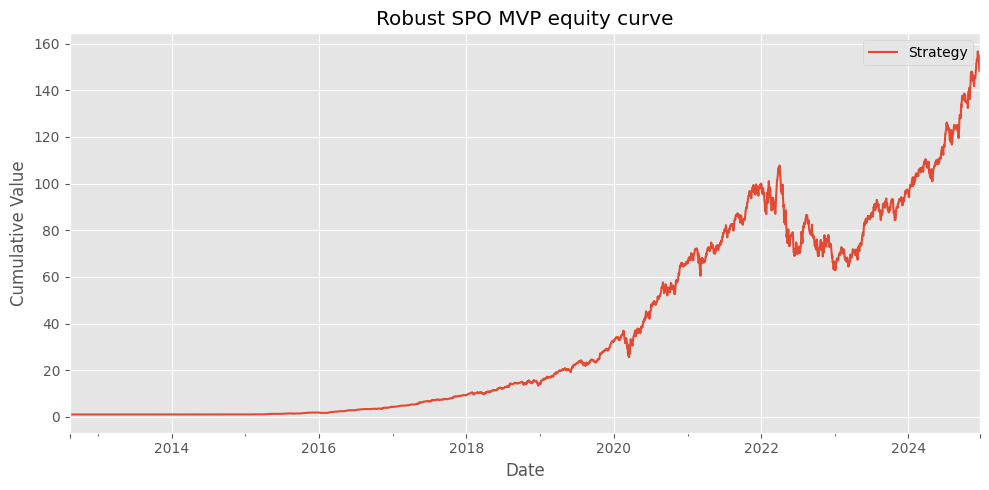


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.972
  Max drawdown:   -41.528%
  Avg turnover:   21.860%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 146.38189852269366, 'annualized_sharpe': 1.972228808019512, 'max_drawdown': -0.41527756629255586}
    fitness=1.4473, Sharpe=1.972, max_dd=-41.528%, avg_turn=21.860%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 106.65779998932224, 'annualized_sharpe': 1.7118089099481955, 'max_drawdown': -0.38757209256484615}


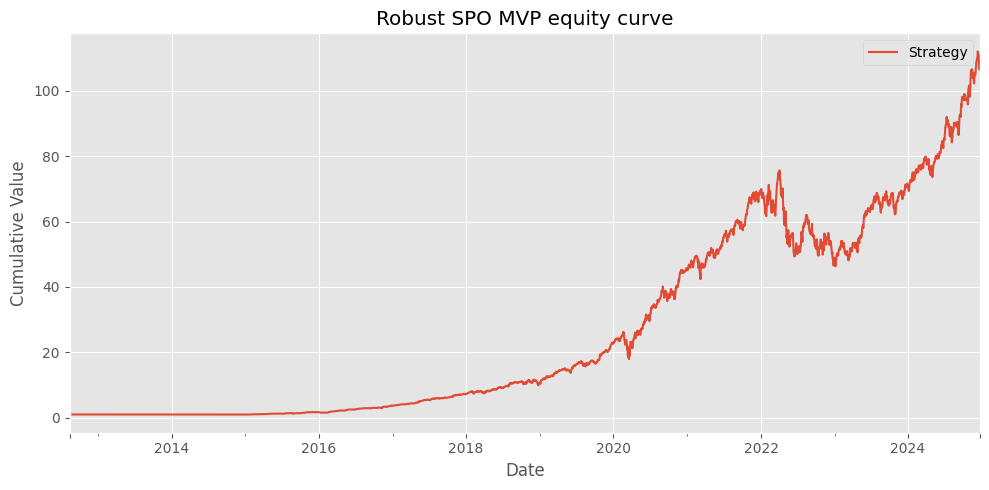


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.898
  Max drawdown:   -38.757%
  Avg turnover:   17.582%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 104.99375125515428, 'annualized_sharpe': 1.8988608087161387, 'max_drawdown': -0.3875720925648456}
    fitness=1.4230, Sharpe=1.898, max_dd=-38.757%, avg_turn=17.582%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.98393895444067, 'annualized_sharpe': 1.758026389477173, 'max_drawdown': -0.39391429329080496}


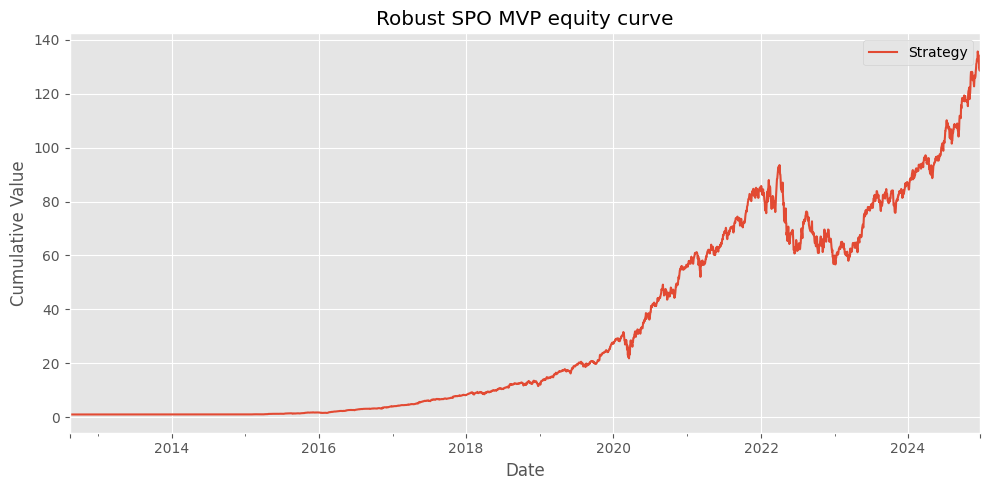


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.950
  Max drawdown:   -39.391%
  Avg turnover:   18.941%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.95545106258896, 'annualized_sharpe': 1.9504840159011756, 'max_drawdown': -0.3939142932908053}
    fitness=1.4615, Sharpe=1.950, max_dd=-39.391%, avg_turn=18.941%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 139.7605874116616, 'annualized_sharpe': 1.7703416414750954, 'max_drawdown': -0.4282003166598136}


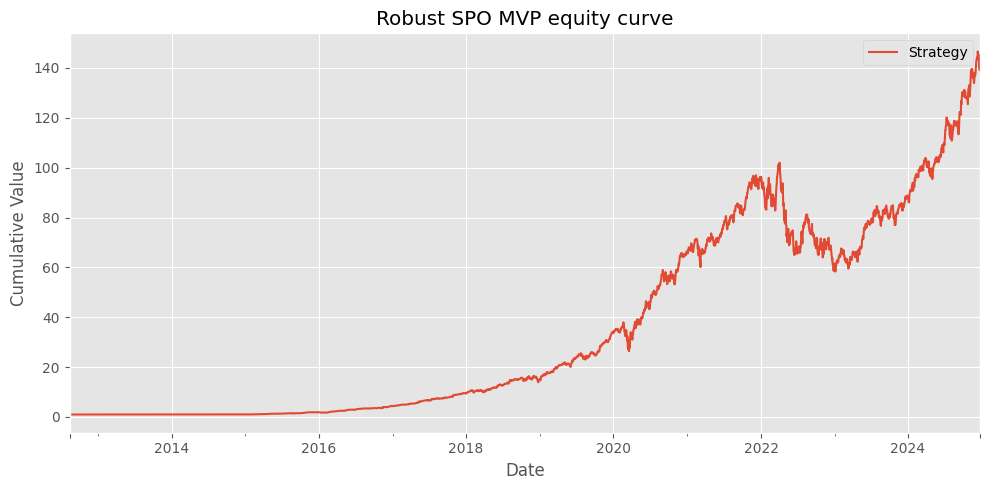


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.963
  Max drawdown:   -42.820%
  Avg turnover:   25.550%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 137.51216710819017, 'annualized_sharpe': 1.9637900349292554, 'max_drawdown': -0.4282003166598135}
    fitness=1.4075, Sharpe=1.963, max_dd=-42.820%, avg_turn=25.550%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 121.25917773410707, 'annualized_sharpe': 1.7306308970538993, 'max_drawdown': -0.3978329151000518}


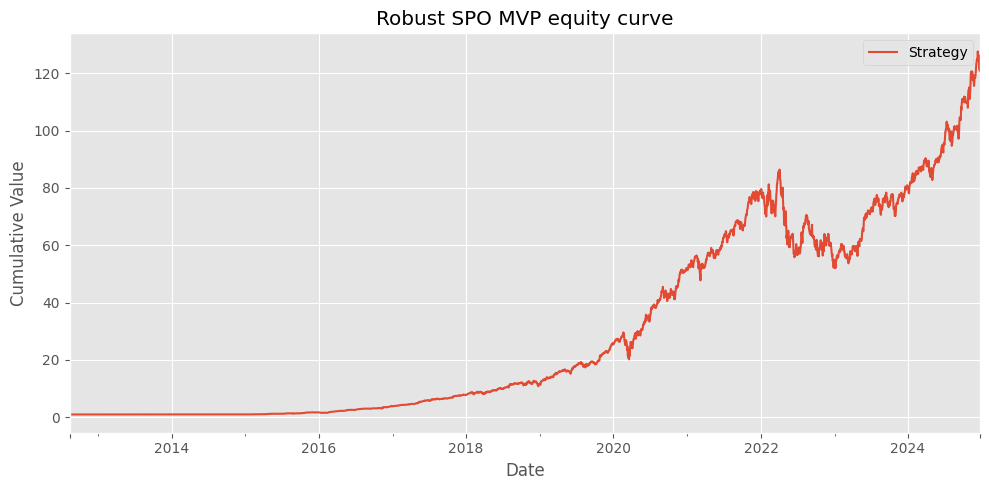


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.919
  Max drawdown:   -39.783%
  Avg turnover:   18.095%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 119.29151264112775, 'annualized_sharpe': 1.9196058745527702, 'max_drawdown': -0.3978329151000516}
    fitness=1.4309, Sharpe=1.919, max_dd=-39.783%, avg_turn=18.095%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 113.18244246456999, 'annualized_sharpe': 1.7207401147301293, 'max_drawdown': -0.38683008089541404}


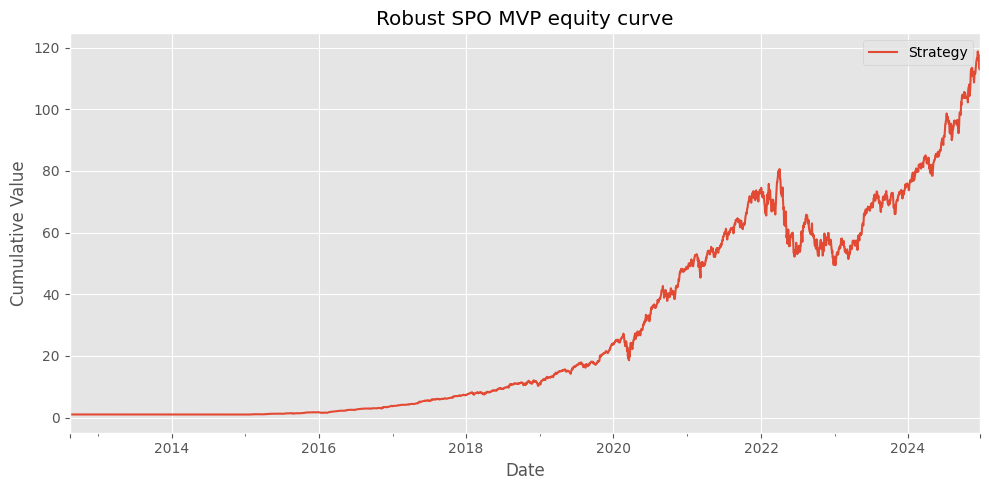


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.909
  Max drawdown:   -38.683%
  Avg turnover:   19.054%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 111.43501202415058, 'annualized_sharpe': 1.9089544378509722, 'max_drawdown': -0.38683008089541393}
    fitness=1.4265, Sharpe=1.909, max_dd=-38.683%, avg_turn=19.054%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 147.6522784695719, 'annualized_sharpe': 1.7786630027750012, 'max_drawdown': -0.420338523465976}


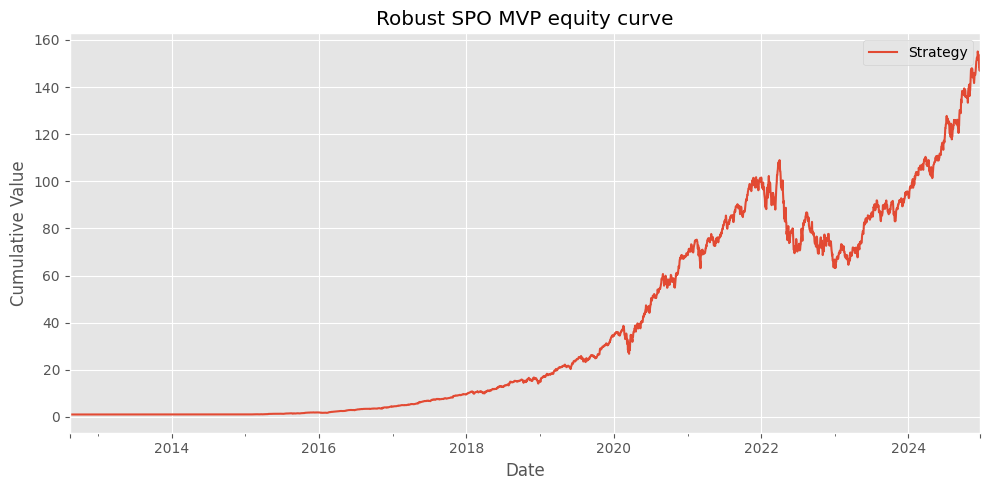


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.973
  Max drawdown:   -42.034%
  Avg turnover:   25.082%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 145.2907664351712, 'annualized_sharpe': 1.9732536294487286, 'max_drawdown': -0.4203385234659759}
    fitness=1.4271, Sharpe=1.973, max_dd=-42.034%, avg_turn=25.082%

Generation 4 best: fitness=1.4615, Sharpe=1.950, max_dd=-39.391%, avg_turn=18.941%

--- GA Generation 5/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.98393895444067, 'annualized_sharpe': 1.758026389477173, 'max_drawdown'

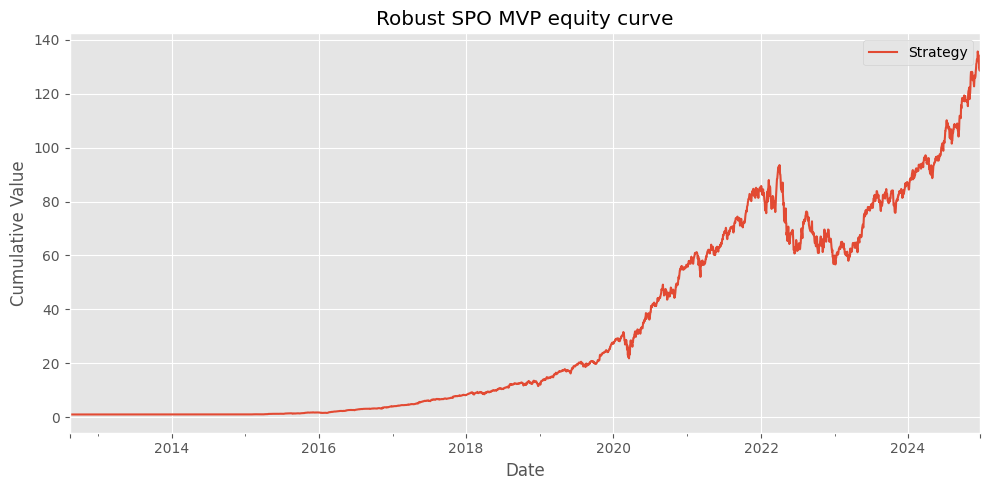


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.950
  Max drawdown:   -39.391%
  Avg turnover:   18.941%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.95545106258896, 'annualized_sharpe': 1.9504840159011756, 'max_drawdown': -0.3939142932908053}
    fitness=1.4615, Sharpe=1.950, max_dd=-39.391%, avg_turn=18.941%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 134.81253952845157, 'annualized_sharpe': 1.755338371527167, 'max_drawdown': -0.40018892295619923}


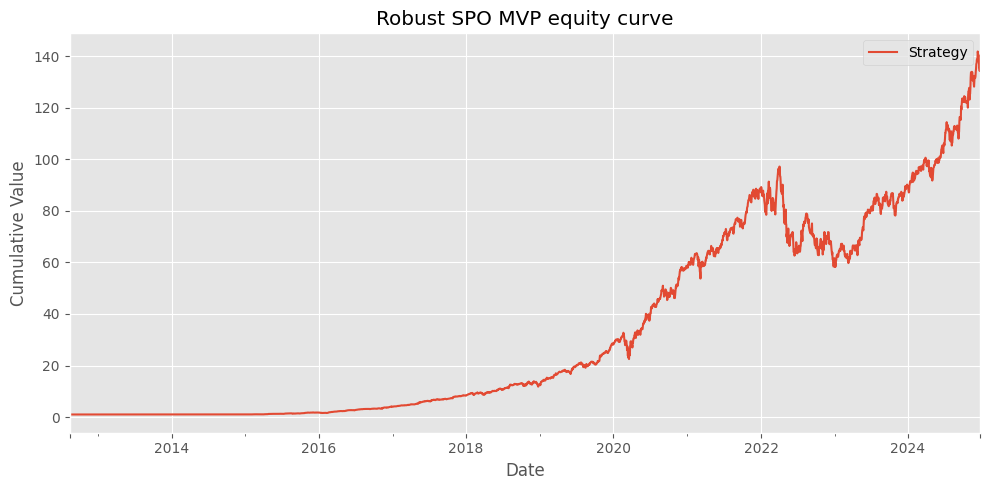


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.947
  Max drawdown:   -40.019%
  Avg turnover:   19.200%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 132.6384414012997, 'annualized_sharpe': 1.9473104008088233, 'max_drawdown': -0.4001889229561991}
    fitness=1.4507, Sharpe=1.947, max_dd=-40.019%, avg_turn=19.200%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 148.82926143653373, 'annualized_sharpe': 1.777953992980918, 'max_drawdown': -0.4152775662925561}


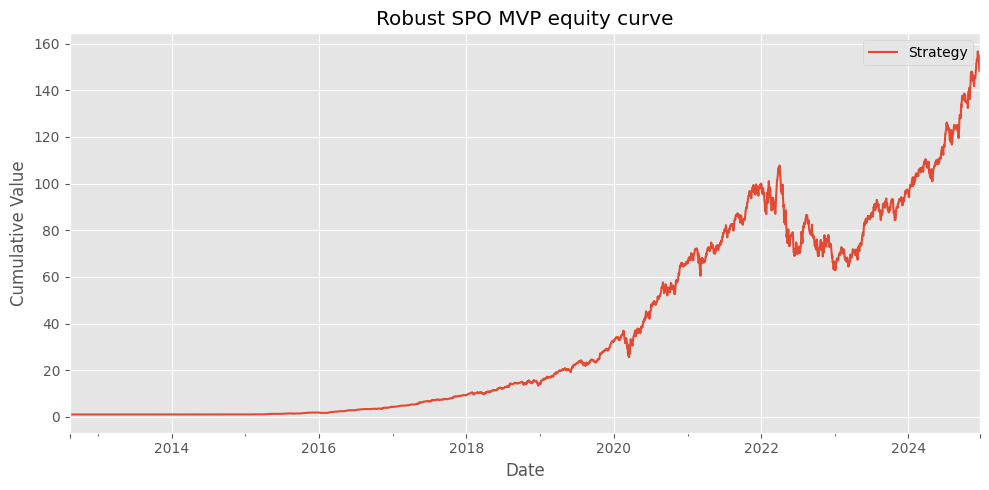


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.972
  Max drawdown:   -41.528%
  Avg turnover:   21.860%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 146.38189852269366, 'annualized_sharpe': 1.972228808019512, 'max_drawdown': -0.41527756629255586}
    fitness=1.4473, Sharpe=1.972, max_dd=-41.528%, avg_turn=21.860%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.50977506893076, 'annualized_sharpe': 1.7378641430167703, 'max_drawdown': -0.3950147961554715}


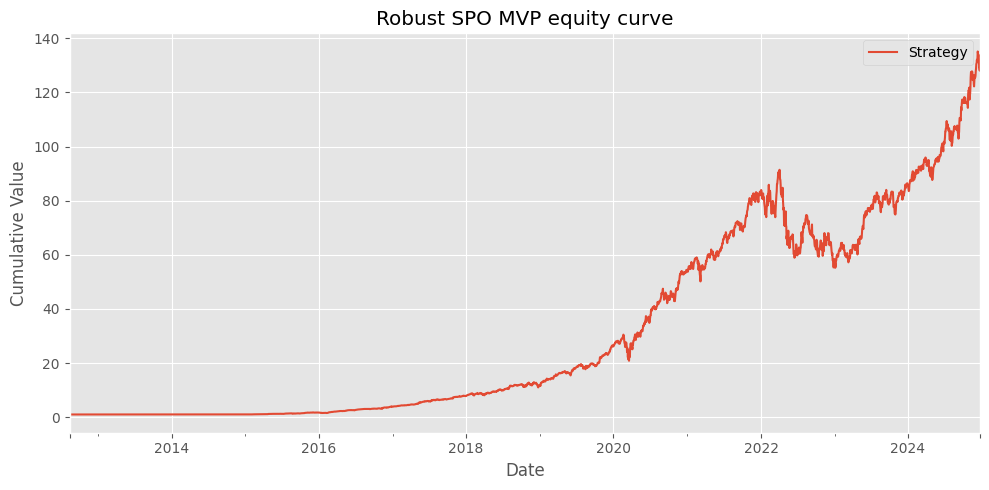


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.928
  Max drawdown:   -39.501%
  Avg turnover:   18.000%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.44849285727035, 'annualized_sharpe': 1.927888507195293, 'max_drawdown': -0.3950147961554702}
    fitness=1.4425, Sharpe=1.928, max_dd=-39.501%, avg_turn=18.000%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 117.70899321243027, 'annualized_sharpe': 1.7367363621635021, 'max_drawdown': -0.3873929696605868}


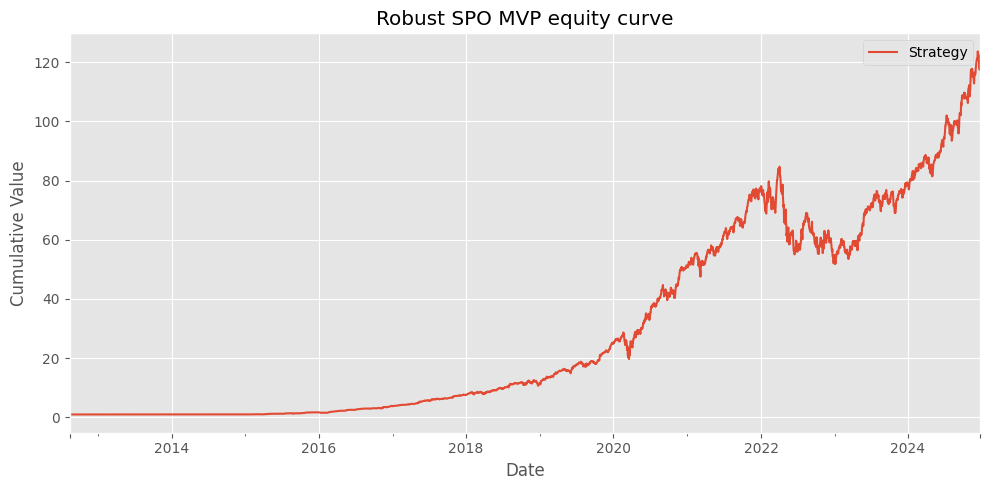


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.926
  Max drawdown:   -38.739%
  Avg turnover:   18.939%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 115.89489829045047, 'annualized_sharpe': 1.9268484011316427, 'max_drawdown': -0.3873929696605859}
    fitness=1.4444, Sharpe=1.926, max_dd=-38.739%, avg_turn=18.939%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 131.57848880928572, 'annualized_sharpe': 1.7563412027152285, 'max_drawdown': -0.3967139278495436}


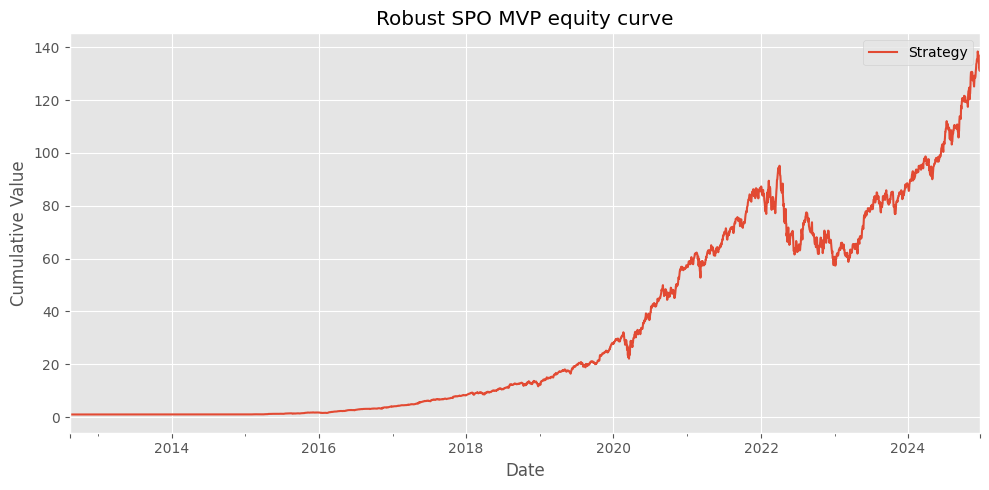


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.948
  Max drawdown:   -39.671%
  Avg turnover:   19.066%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 129.48109700894082, 'annualized_sharpe': 1.9485106458191688, 'max_drawdown': -0.39671392784954385}
    fitness=1.4561, Sharpe=1.948, max_dd=-39.671%, avg_turn=19.066%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 133.15186041146782, 'annualized_sharpe': 1.7629008393358834, 'max_drawdown': -0.4131287507372847}


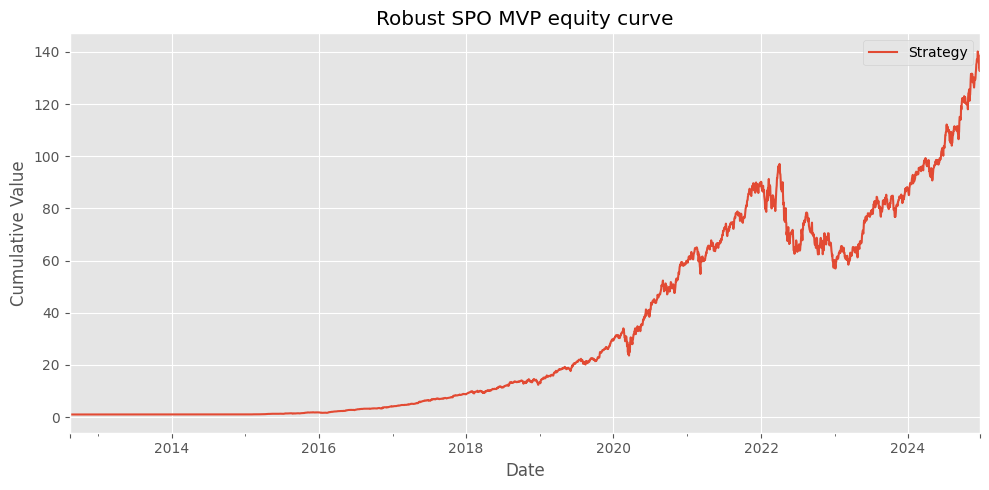


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.955
  Max drawdown:   -41.313%
  Avg turnover:   20.206%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 130.97876847637144, 'annualized_sharpe': 1.9554522797703453, 'max_drawdown': -0.41312875073728494}
    fitness=1.4409, Sharpe=1.955, max_dd=-41.313%, avg_turn=20.206%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 125.7993007170806, 'annualized_sharpe': 1.7441664775349581, 'max_drawdown': -0.39991667586923296}


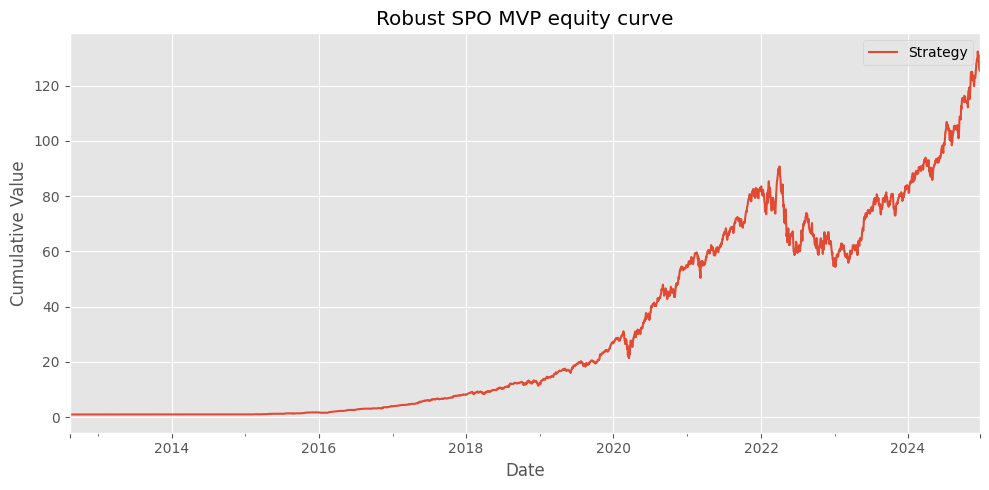


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.934
  Max drawdown:   -39.992%
  Avg turnover:   18.854%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 123.76142860020613, 'annualized_sharpe': 1.934723485032224, 'max_drawdown': -0.3999166758692332}
    fitness=1.4402, Sharpe=1.934, max_dd=-39.992%, avg_turn=18.854%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 120.3133532720863, 'annualized_sharpe': 1.7364662347362732, 'max_drawdown': -0.39121517965336483}


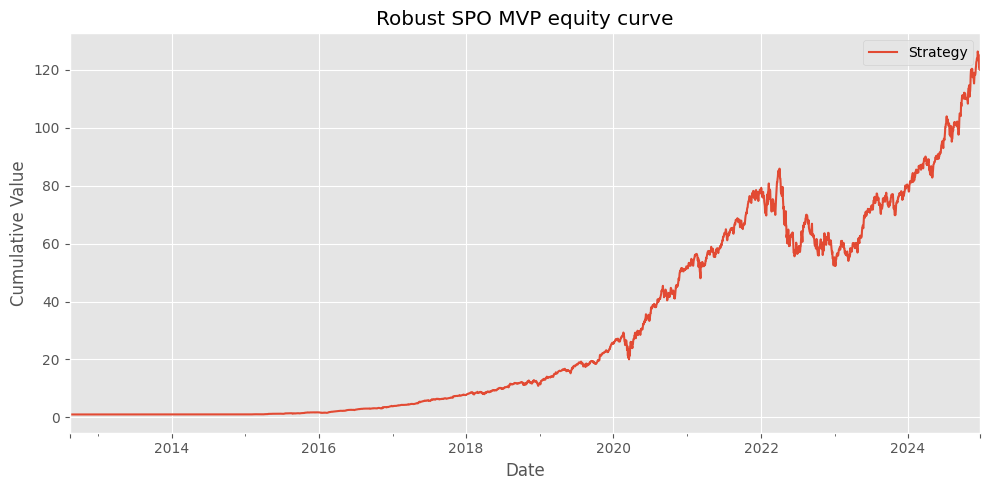


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.926
  Max drawdown:   -39.122%
  Avg turnover:   19.325%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 118.41644717739585, 'annualized_sharpe': 1.9263489608006994, 'max_drawdown': -0.3912151796533645}
    fitness=1.4381, Sharpe=1.926, max_dd=-39.122%, avg_turn=19.325%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 106.65779998932224, 'annualized_sharpe': 1.7118089099481955, 'max_drawdown': -0.38757209256484615}


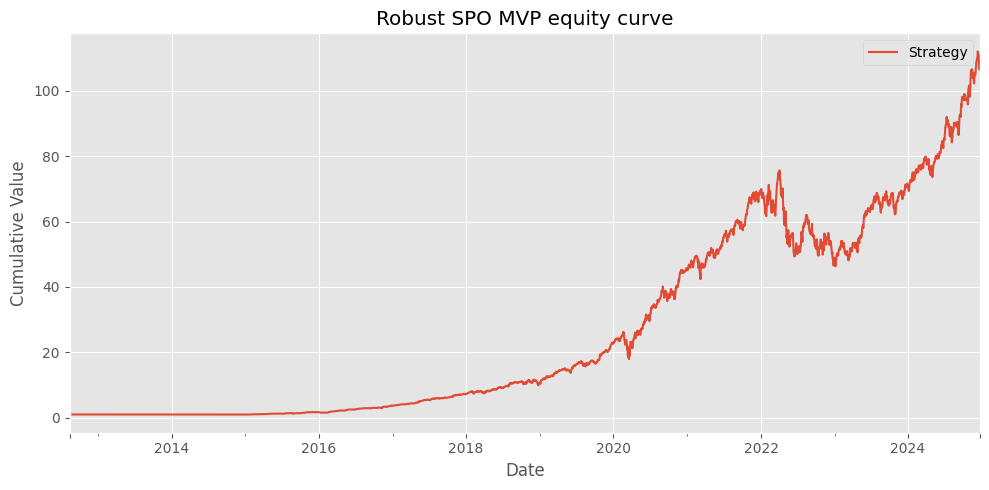


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.898
  Max drawdown:   -38.757%
  Avg turnover:   17.582%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 104.99375125515428, 'annualized_sharpe': 1.8988608087161387, 'max_drawdown': -0.3875720925648456}
    fitness=1.4230, Sharpe=1.898, max_dd=-38.757%, avg_turn=17.582%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 130.81034066230845, 'annualized_sharpe': 1.7453419313072187, 'max_drawdown': -0.3971679923695065}


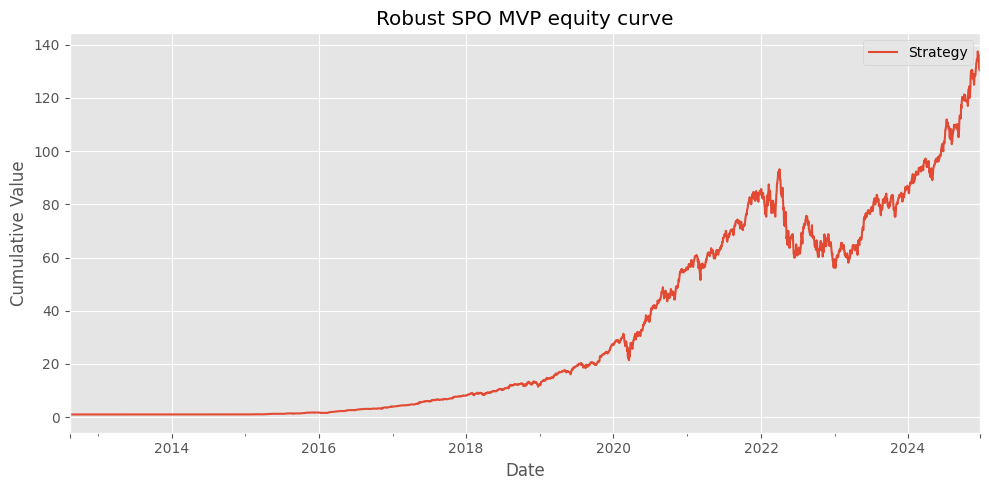


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.936
  Max drawdown:   -39.717%
  Avg turnover:   19.376%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 128.7047163239957, 'annualized_sharpe': 1.9361618035919252, 'max_drawdown': -0.3971679923695064}
    fitness=1.4417, Sharpe=1.936, max_dd=-39.717%, avg_turn=19.376%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 171.31795513374976, 'annualized_sharpe': 1.8082961398486017, 'max_drawdown': -0.4211259709230345}


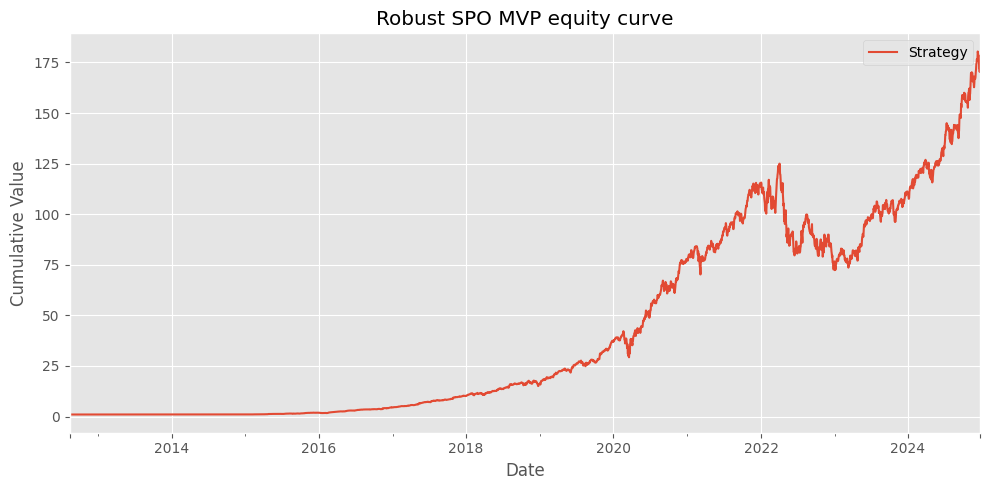


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.006
  Max drawdown:   -42.113%
  Avg turnover:   23.965%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.53513606785063, 'annualized_sharpe': 2.0062551389625836, 'max_drawdown': -0.4211259709230345}
    fitness=1.4649, Sharpe=2.006, max_dd=-42.113%, avg_turn=23.965%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 161.2603305122271, 'annualized_sharpe': 1.7834150478365332, 'max_drawdown': -0.426949132261934}


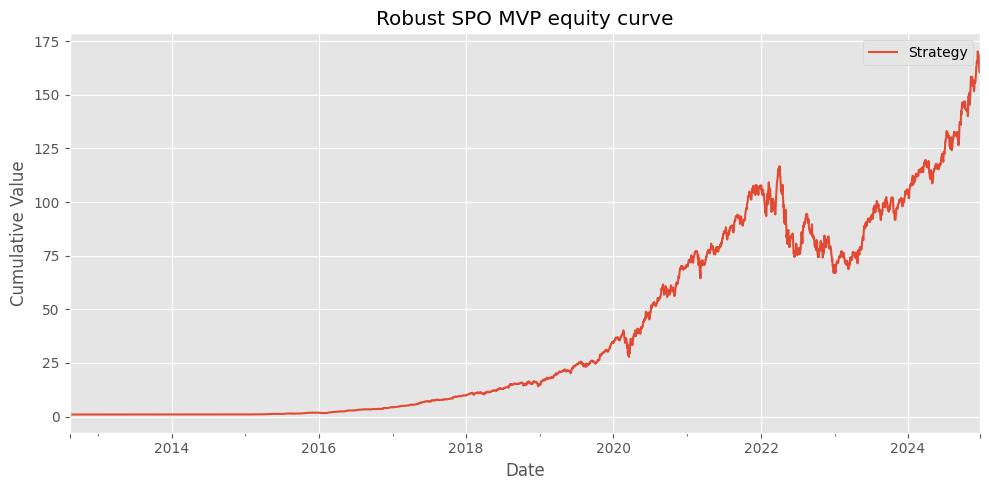


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.978
  Max drawdown:   -42.695%
  Avg turnover:   20.518%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 158.48756240634464, 'annualized_sharpe': 1.9779655455569203, 'max_drawdown': -0.42694913226193376}
    fitness=1.4480, Sharpe=1.978, max_dd=-42.695%, avg_turn=20.518%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 130.21908244661284, 'annualized_sharpe': 1.7464606440827053, 'max_drawdown': -0.403857195710963}


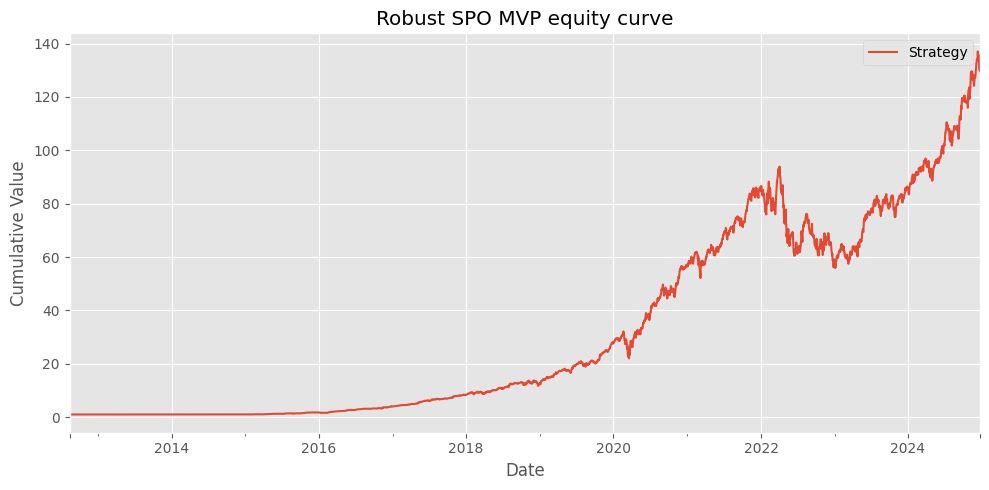


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.937
  Max drawdown:   -40.386%
  Avg turnover:   19.369%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 128.08936666188274, 'annualized_sharpe': 1.9371977773839133, 'max_drawdown': -0.403857195710963}
    fitness=1.4361, Sharpe=1.937, max_dd=-40.386%, avg_turn=19.369%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 142.44033556940138, 'annualized_sharpe': 1.7757776780814487, 'max_drawdown': -0.40983624973446153}


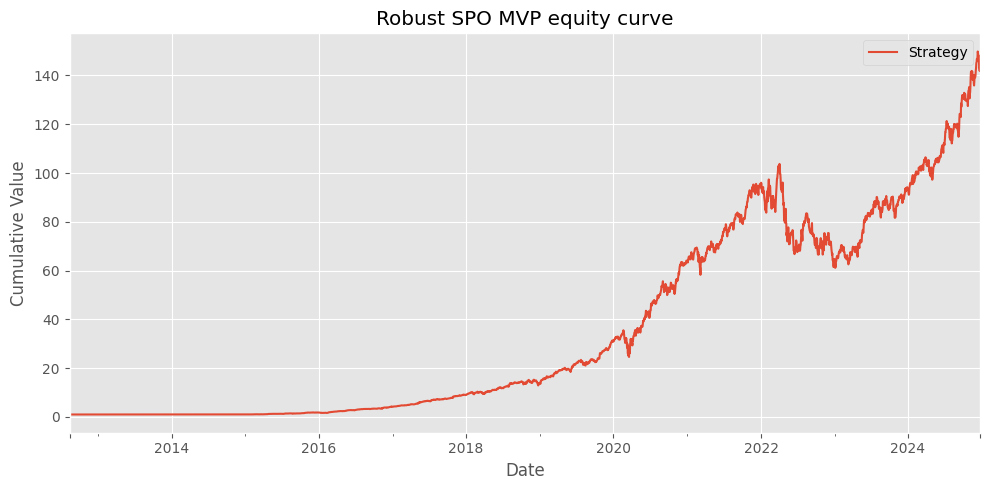


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.970
  Max drawdown:   -40.984%
  Avg turnover:   21.535%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 140.151513578556, 'annualized_sharpe': 1.9700224756484845, 'max_drawdown': -0.40983624973446287}
    fitness=1.4521, Sharpe=1.970, max_dd=-40.984%, avg_turn=21.535%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 163.78243493335543, 'annualized_sharpe': 1.7946663322274157, 'max_drawdown': -0.4323182942216963}


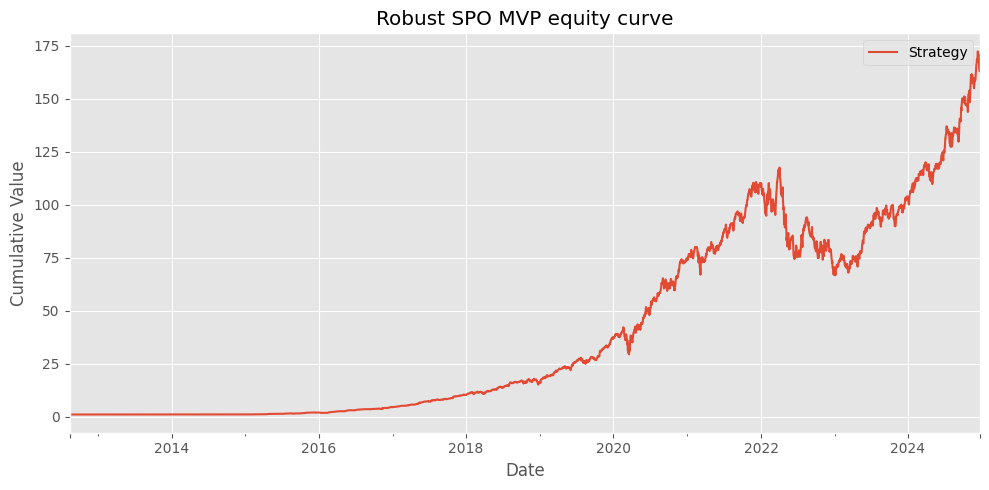


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.990
  Max drawdown:   -43.232%
  Avg turnover:   24.094%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 161.09221087394022, 'annualized_sharpe': 1.990818470826197, 'max_drawdown': -0.4323182942216959}
    fitness=1.4376, Sharpe=1.990, max_dd=-43.232%, avg_turn=24.094%

Generation 5 best: fitness=1.4649, Sharpe=2.006, max_dd=-42.113%, avg_turn=23.965%

--- GA Generation 6/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 171.31795513374976, 'annualized_sharpe': 1.8082961398486017, 'max_drawdown

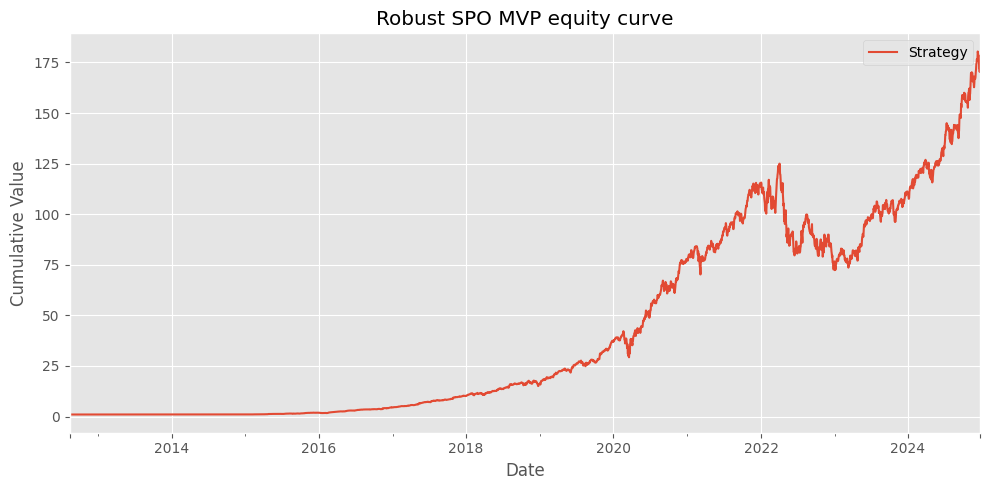


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.006
  Max drawdown:   -42.113%
  Avg turnover:   23.965%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.53513606785063, 'annualized_sharpe': 2.0062551389625836, 'max_drawdown': -0.4211259709230345}
    fitness=1.4649, Sharpe=2.006, max_dd=-42.113%, avg_turn=23.965%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.98393895444067, 'annualized_sharpe': 1.758026389477173, 'max_drawdown': -0.39391429329080496}


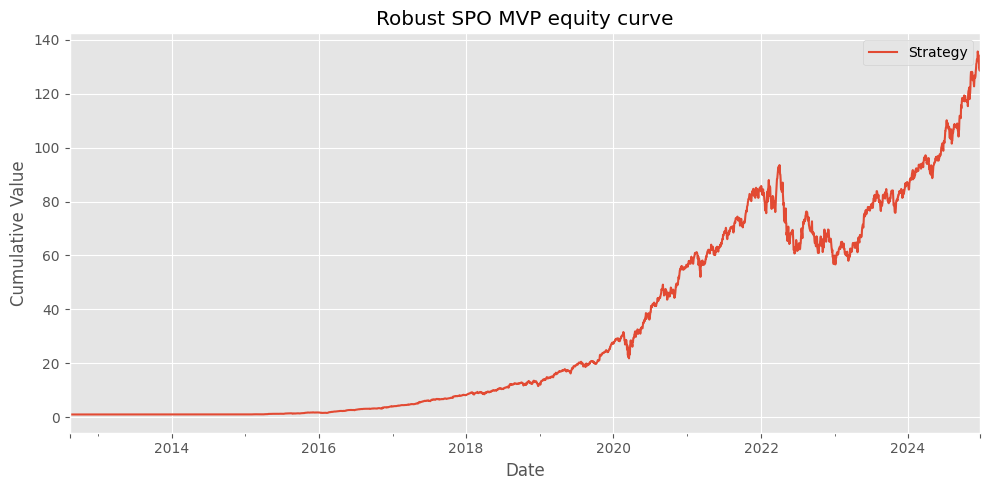


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.950
  Max drawdown:   -39.391%
  Avg turnover:   18.941%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.95545106258896, 'annualized_sharpe': 1.9504840159011756, 'max_drawdown': -0.3939142932908053}
    fitness=1.4615, Sharpe=1.950, max_dd=-39.391%, avg_turn=18.941%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 131.57848880928572, 'annualized_sharpe': 1.7563412027152285, 'max_drawdown': -0.3967139278495436}


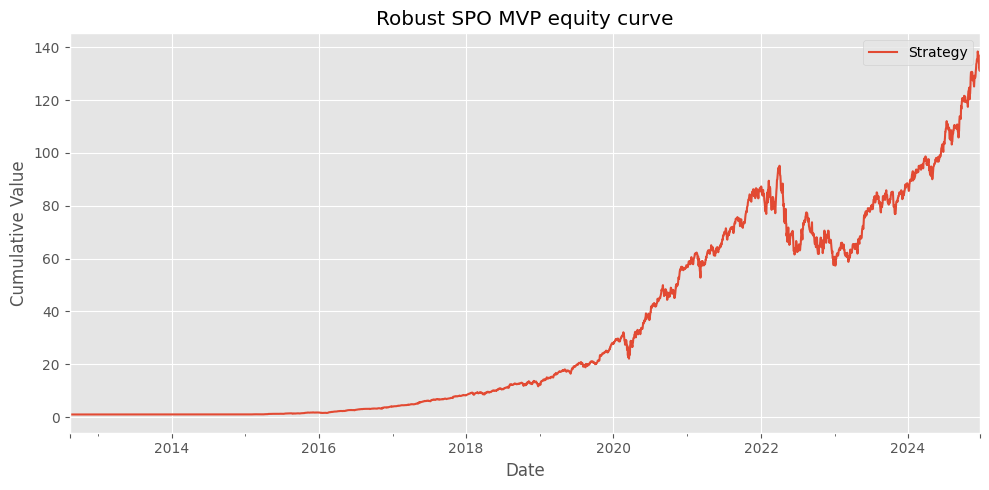


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.948
  Max drawdown:   -39.671%
  Avg turnover:   19.066%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 129.48109700894082, 'annualized_sharpe': 1.9485106458191688, 'max_drawdown': -0.39671392784954385}
    fitness=1.4561, Sharpe=1.948, max_dd=-39.671%, avg_turn=19.066%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 142.44033556940138, 'annualized_sharpe': 1.7757776780814487, 'max_drawdown': -0.40983624973446153}


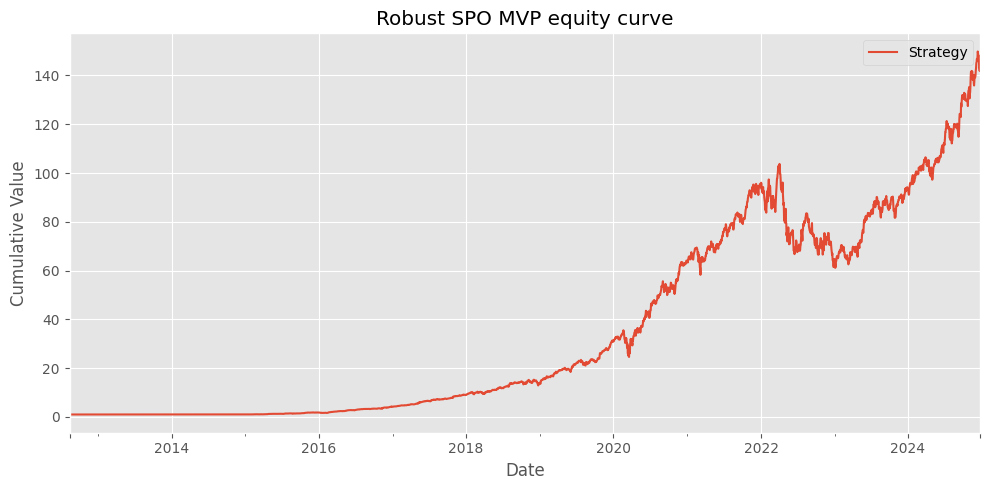


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.970
  Max drawdown:   -40.984%
  Avg turnover:   21.535%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 140.151513578556, 'annualized_sharpe': 1.9700224756484845, 'max_drawdown': -0.40983624973446287}
    fitness=1.4521, Sharpe=1.970, max_dd=-40.984%, avg_turn=21.535%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 103.9355543529061, 'annualized_sharpe': 1.7125615479540572, 'max_drawdown': -0.37939807774748613}


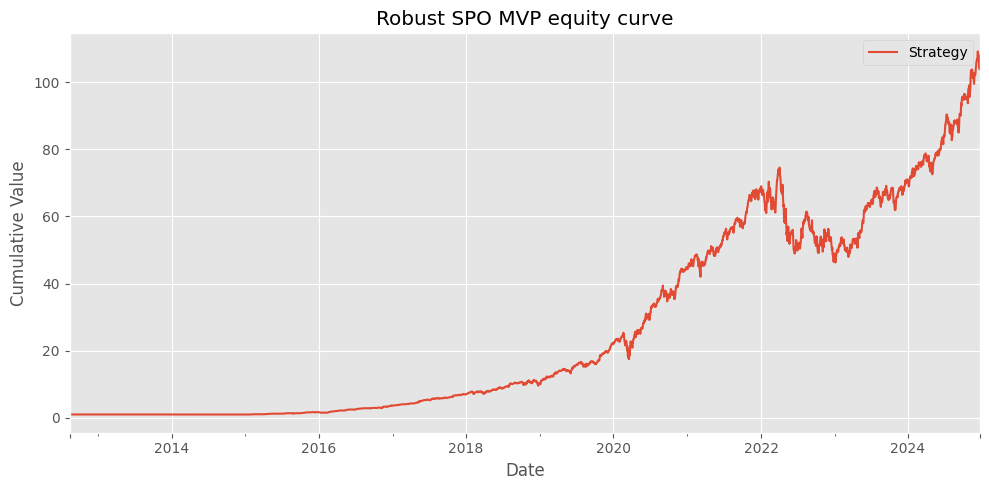


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.900
  Max drawdown:   -37.940%
  Avg turnover:   17.020%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 102.37735492013125, 'annualized_sharpe': 1.9000541398424904, 'max_drawdown': -0.37939807774748624}
    fitness=1.4352, Sharpe=1.900, max_dd=-37.940%, avg_turn=17.020%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 118.67947215153407, 'annualized_sharpe': 1.7423625627938837, 'max_drawdown': -0.39508076035731876}


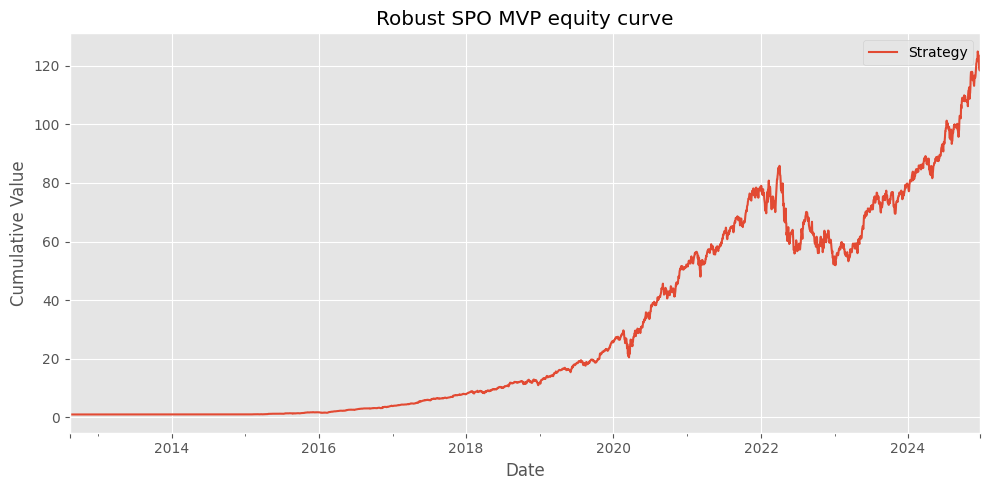


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.932
  Max drawdown:   -39.508%
  Avg turnover:   18.513%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 116.79700690226184, 'annualized_sharpe': 1.932830281003442, 'max_drawdown': -0.3950807603573193}
    fitness=1.4448, Sharpe=1.932, max_dd=-39.508%, avg_turn=18.513%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 102.01285717945252, 'annualized_sharpe': 1.6671959584549894, 'max_drawdown': -0.4045190200053119}


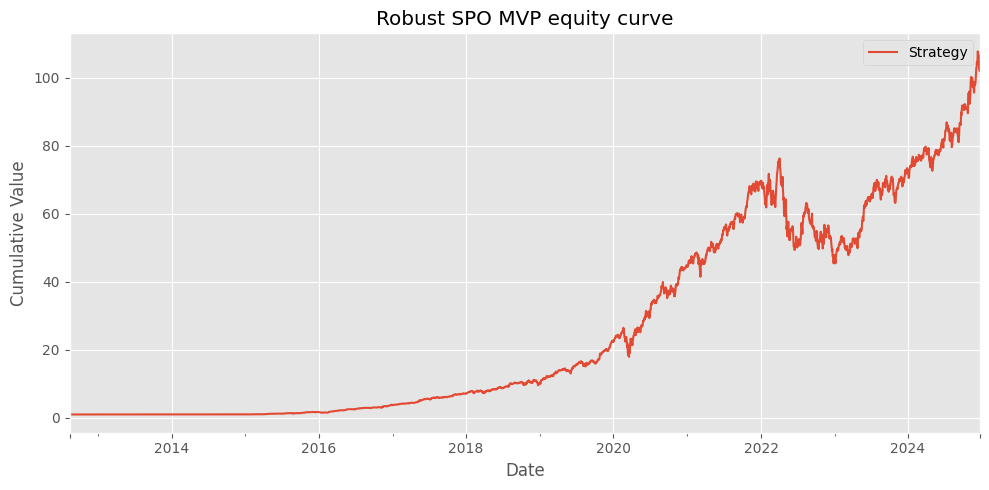


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.848
  Max drawdown:   -40.452%
  Avg turnover:   14.424%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 100.3407920619636, 'annualized_sharpe': 1.8488494247688367, 'max_drawdown': -0.4045190200053116}
    fitness=1.3719, Sharpe=1.848, max_dd=-40.452%, avg_turn=14.424%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 141.14066452228369, 'annualized_sharpe': 1.7743396538435097, 'max_drawdown': -0.4098766413467019}


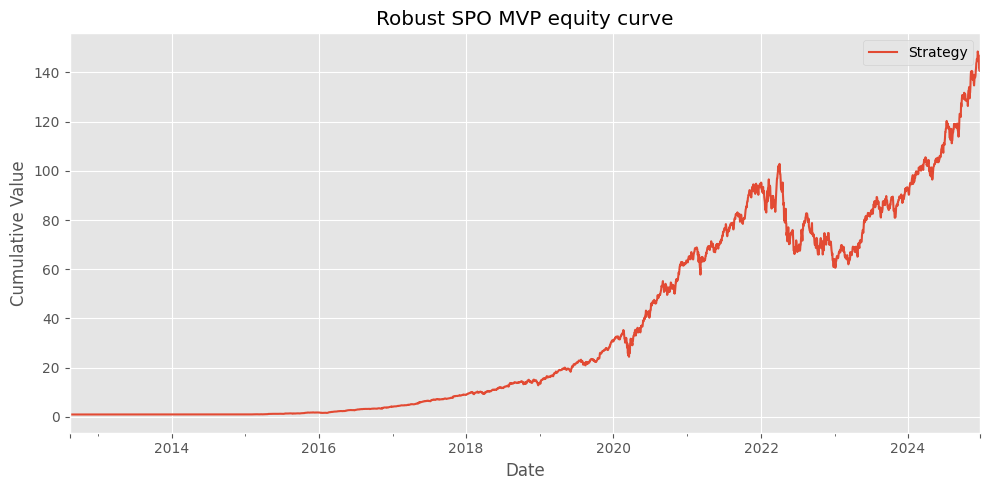


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.968
  Max drawdown:   -40.988%
  Avg turnover:   21.488%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 138.87305971930758, 'annualized_sharpe': 1.9684097733169335, 'max_drawdown': -0.4098766413467022}
    fitness=1.4507, Sharpe=1.968, max_dd=-40.988%, avg_turn=21.488%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 170.96720552384267, 'annualized_sharpe': 1.7999393057510964, 'max_drawdown': -0.41571218767606943}


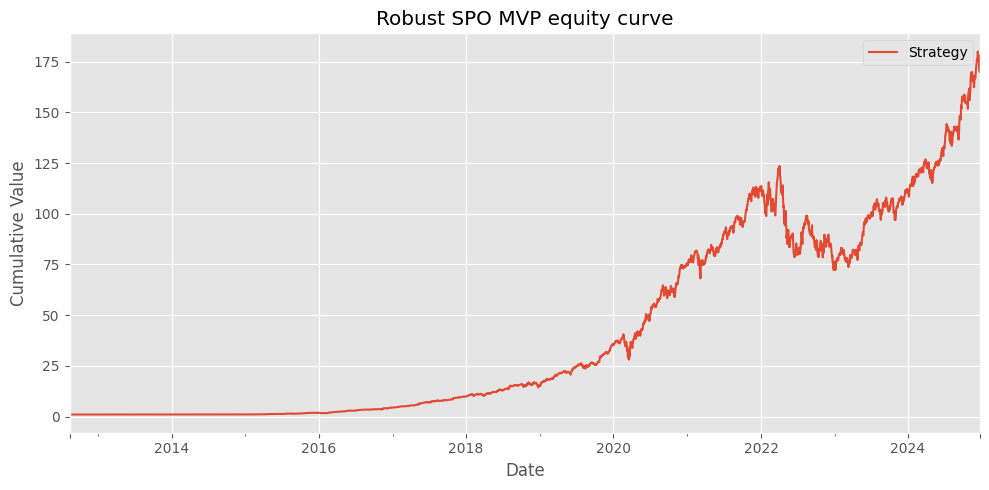


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.997
  Max drawdown:   -41.571%
  Avg turnover:   22.421%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.1582999188814, 'annualized_sharpe': 1.9969194742253797, 'max_drawdown': -0.41571218767606954}
    fitness=1.4687, Sharpe=1.997, max_dd=-41.571%, avg_turn=22.421%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 131.83382284639026, 'annualized_sharpe': 1.74206574602844, 'max_drawdown': -0.40016969810200254}


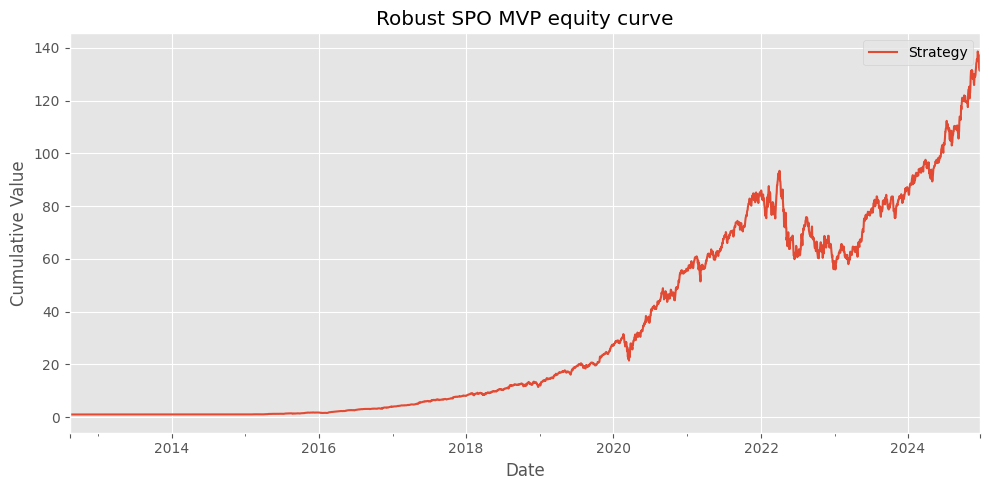


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.932
  Max drawdown:   -40.017%
  Avg turnover:   19.102%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 129.67560971799256, 'annualized_sharpe': 1.9323550013844664, 'max_drawdown': -0.40016969810200254}
    fitness=1.4363, Sharpe=1.932, max_dd=-40.017%, avg_turn=19.102%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 154.245524430834, 'annualized_sharpe': 1.7883988822565133, 'max_drawdown': -0.4104242417204751}


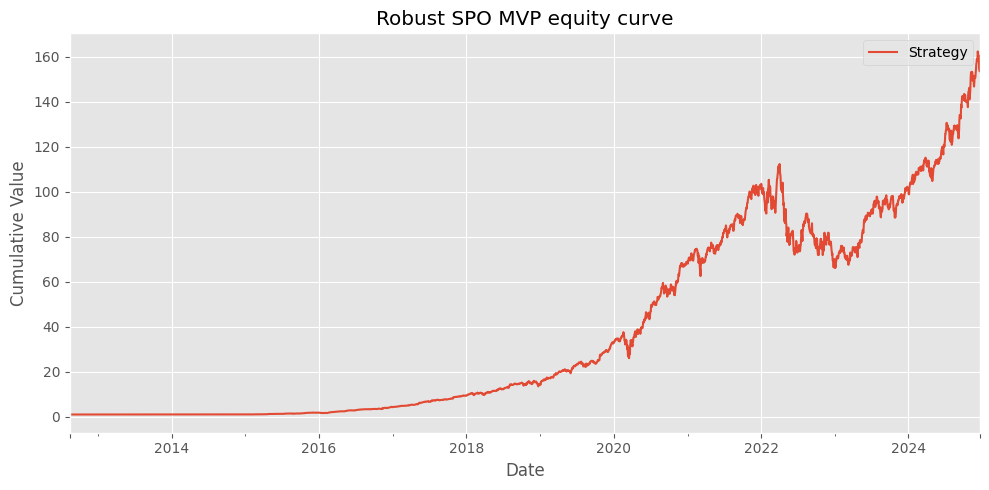


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.984
  Max drawdown:   -41.042%
  Avg turnover:   21.690%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 151.77038475745582, 'annualized_sharpe': 1.9842101960415717, 'max_drawdown': -0.4104242417204752}
    fitness=1.4649, Sharpe=1.984, max_dd=-41.042%, avg_turn=21.690%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 158.19784009436208, 'annualized_sharpe': 1.802814568421117, 'max_drawdown': -0.41956333375152743}


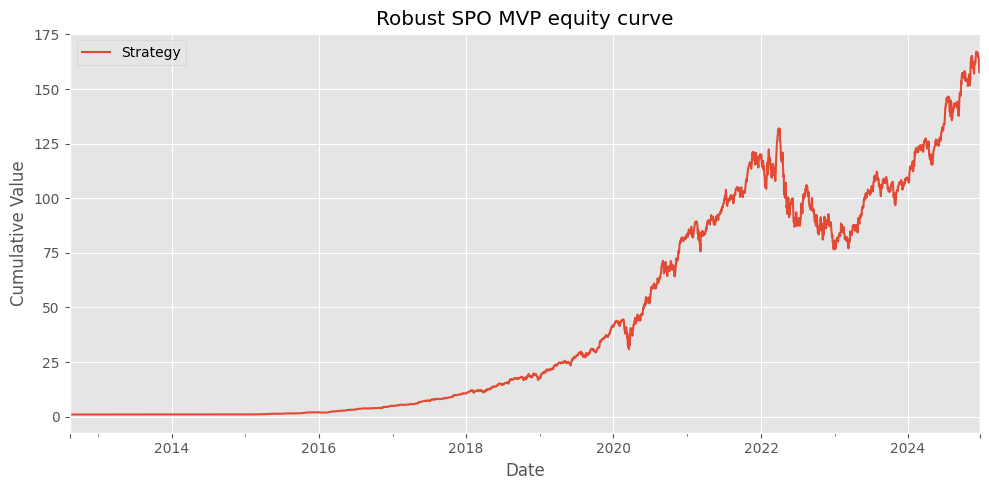


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.003
  Max drawdown:   -41.956%
  Avg turnover:   47.493%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 156.5124492150782, 'annualized_sharpe': 2.002976624730811, 'max_drawdown': -0.41956333375152755}
    fitness=1.3456, Sharpe=2.003, max_dd=-41.956%, avg_turn=47.493%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.44476601034097, 'annualized_sharpe': 1.7442816543472888, 'max_drawdown': -0.40469336295262837}


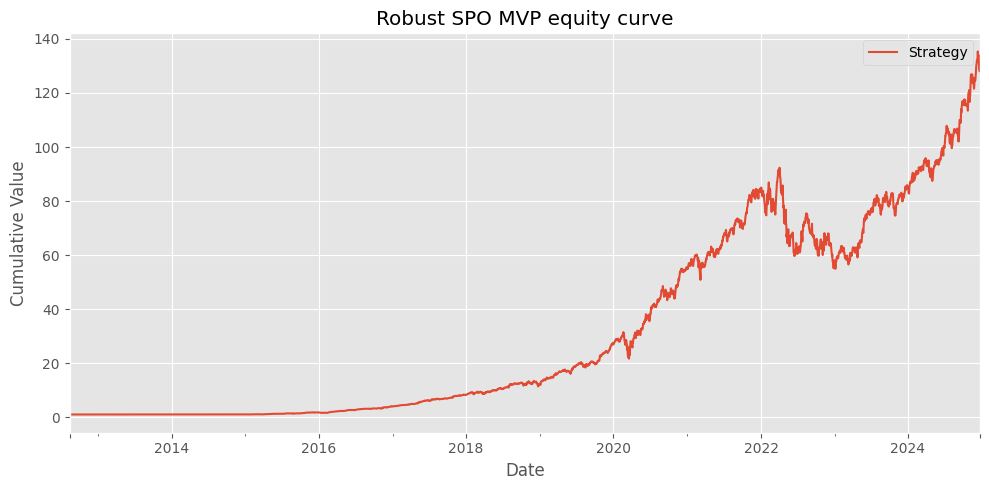


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.934
  Max drawdown:   -40.469%
  Avg turnover:   18.170%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.32029047757418, 'annualized_sharpe': 1.9346856091397768, 'max_drawdown': -0.40469336295262837}
    fitness=1.4388, Sharpe=1.934, max_dd=-40.469%, avg_turn=18.170%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 88.6232989332876, 'annualized_sharpe': 1.63778861578573, 'max_drawdown': -0.395598685246183}


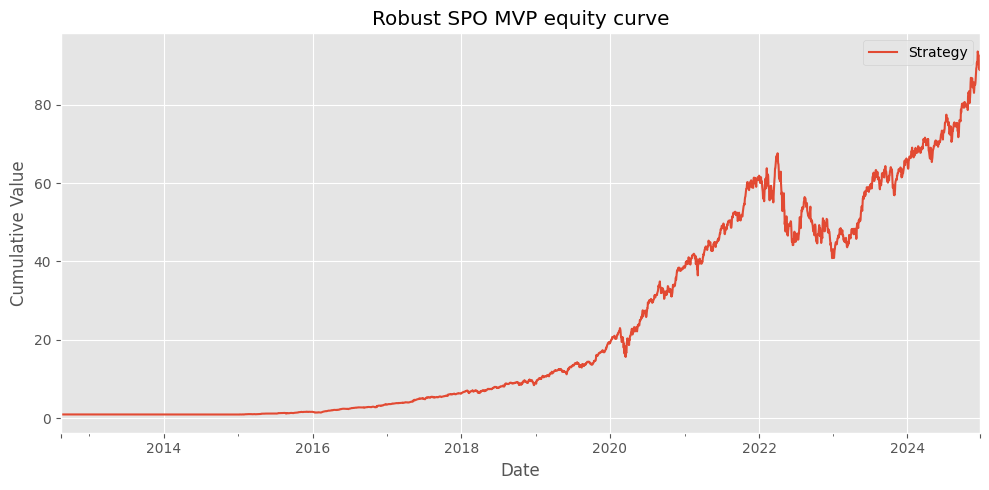


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.816
  Max drawdown:   -39.560%
  Avg turnover:   12.508%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 87.24279262609667, 'annualized_sharpe': 1.8164467328633254, 'max_drawdown': -0.395598685246183}
    fitness=1.3580, Sharpe=1.816, max_dd=-39.560%, avg_turn=12.508%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 145.52834041517406, 'annualized_sharpe': 1.7742957692395165, 'max_drawdown': -0.4110308153001423}


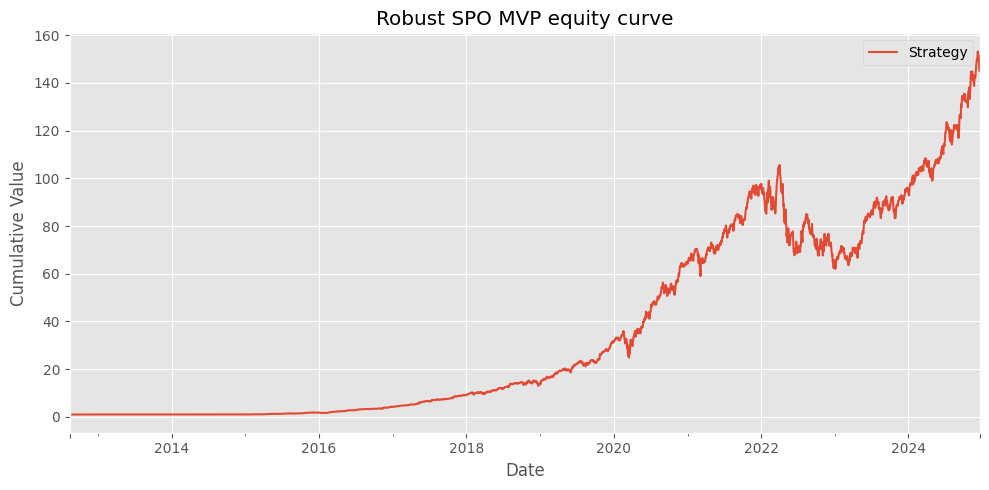


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.968
  Max drawdown:   -41.103%
  Avg turnover:   21.332%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 143.16256381109088, 'annualized_sharpe': 1.968293063213109, 'max_drawdown': -0.4110308153001423}
    fitness=1.4502, Sharpe=1.968, max_dd=-41.103%, avg_turn=21.332%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 135.46751563079067, 'annualized_sharpe': 1.7645002376214516, 'max_drawdown': -0.418111249600263}


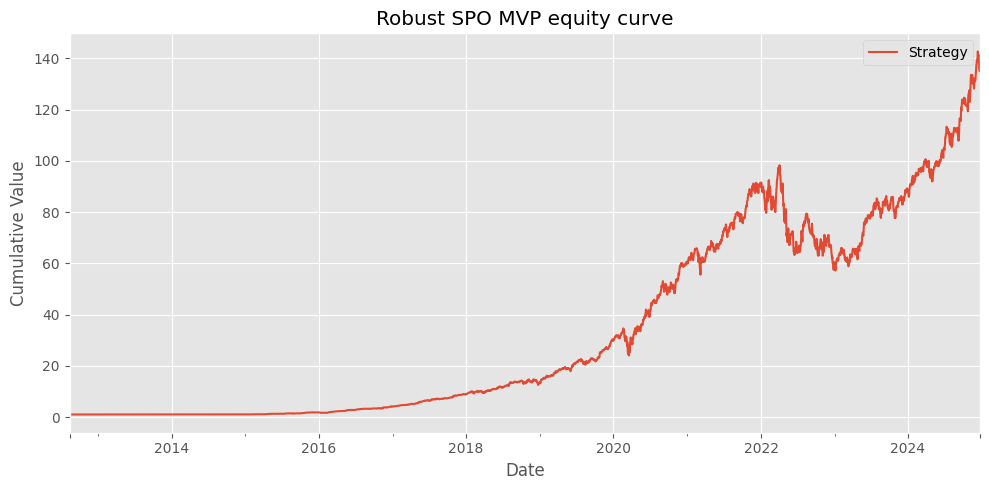


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.957
  Max drawdown:   -41.811%
  Avg turnover:   20.007%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 133.2224403694452, 'annualized_sharpe': 1.957075415002476, 'max_drawdown': -0.418111249600263}
    fitness=1.4385, Sharpe=1.957, max_dd=-41.811%, avg_turn=20.007%

Generation 6 best: fitness=1.4687, Sharpe=1.997, max_dd=-41.571%, avg_turn=22.421%

--- GA Generation 7/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 170.96720552384267, 'annualized_sharpe': 1.7999393057510964, 'max_drawdown':

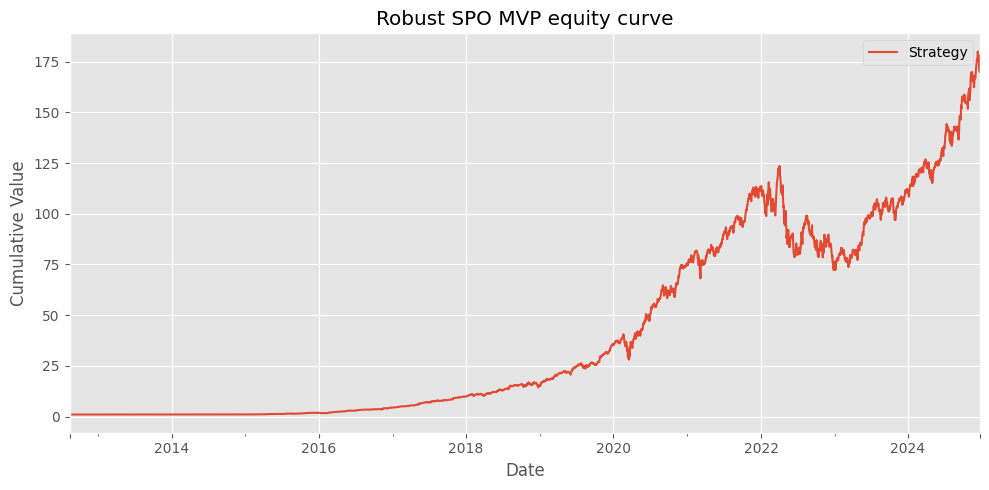


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.997
  Max drawdown:   -41.571%
  Avg turnover:   22.421%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.1582999188814, 'annualized_sharpe': 1.9969194742253797, 'max_drawdown': -0.41571218767606954}
    fitness=1.4687, Sharpe=1.997, max_dd=-41.571%, avg_turn=22.421%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 154.245524430834, 'annualized_sharpe': 1.7883988822565133, 'max_drawdown': -0.4104242417204751}


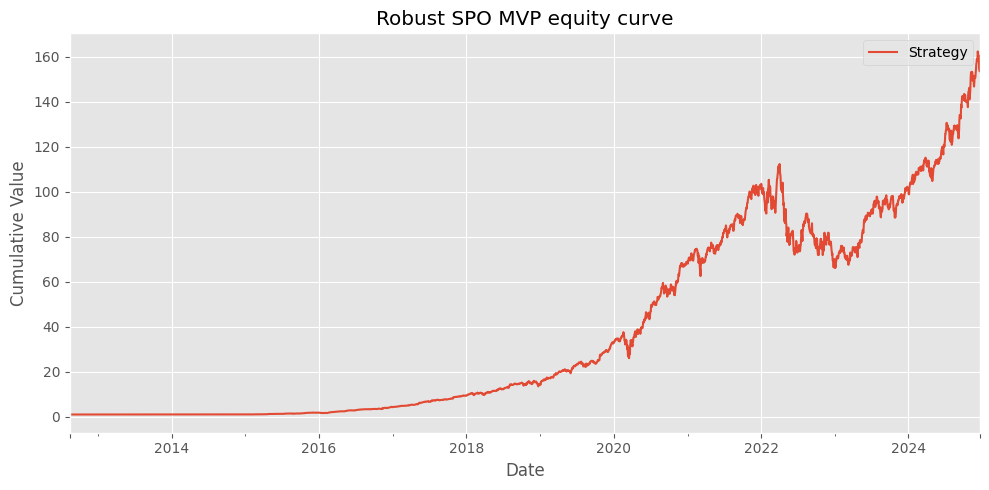


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.984
  Max drawdown:   -41.042%
  Avg turnover:   21.690%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 151.77038475745582, 'annualized_sharpe': 1.9842101960415717, 'max_drawdown': -0.4104242417204752}
    fitness=1.4649, Sharpe=1.984, max_dd=-41.042%, avg_turn=21.690%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 171.31795513374976, 'annualized_sharpe': 1.8082961398486017, 'max_drawdown': -0.4211259709230345}


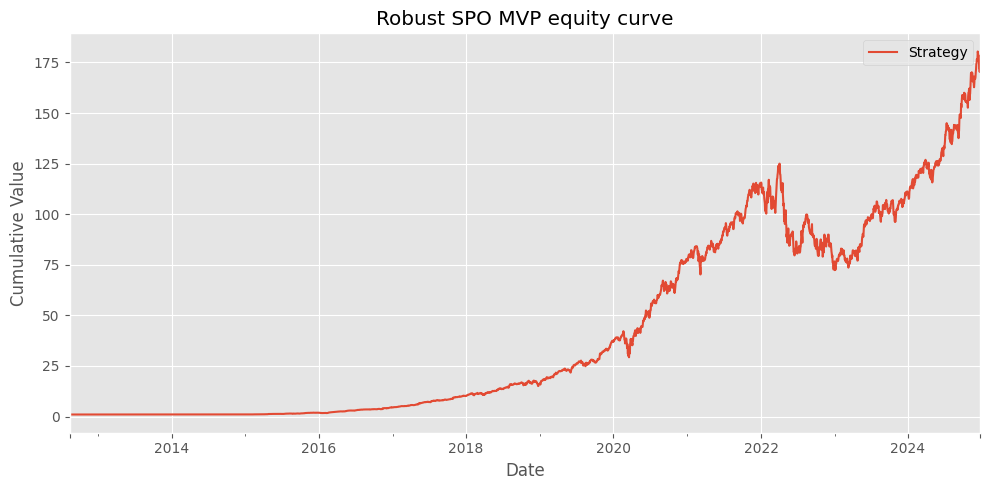


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.006
  Max drawdown:   -42.113%
  Avg turnover:   23.965%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.53513606785063, 'annualized_sharpe': 2.0062551389625836, 'max_drawdown': -0.4211259709230345}
    fitness=1.4649, Sharpe=2.006, max_dd=-42.113%, avg_turn=23.965%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 128.98393895444067, 'annualized_sharpe': 1.758026389477173, 'max_drawdown': -0.39391429329080496}


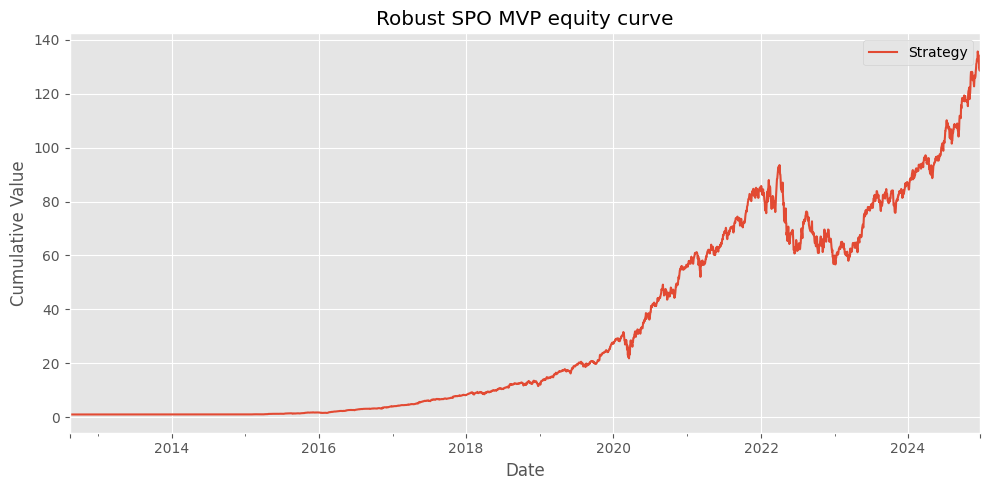


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.950
  Max drawdown:   -39.391%
  Avg turnover:   18.941%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 126.95545106258896, 'annualized_sharpe': 1.9504840159011756, 'max_drawdown': -0.3939142932908053}
    fitness=1.4615, Sharpe=1.950, max_dd=-39.391%, avg_turn=18.941%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 170.89885755975462, 'annualized_sharpe': 1.8104689136702234, 'max_drawdown': -0.42315790351967864}


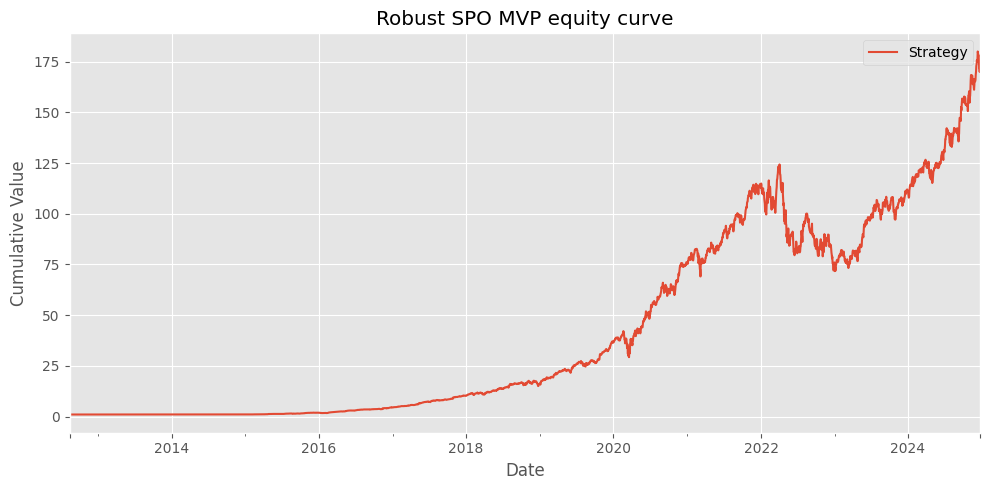


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.008
  Max drawdown:   -42.316%
  Avg turnover:   22.447%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.09171284092992, 'annualized_sharpe': 2.008576743885213, 'max_drawdown': -0.42315790351967886}
    fitness=1.4728, Sharpe=2.008, max_dd=-42.316%, avg_turn=22.447%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 98.11459709096385, 'annualized_sharpe': 1.6488730934541316, 'max_drawdown': -0.4096603640721813}


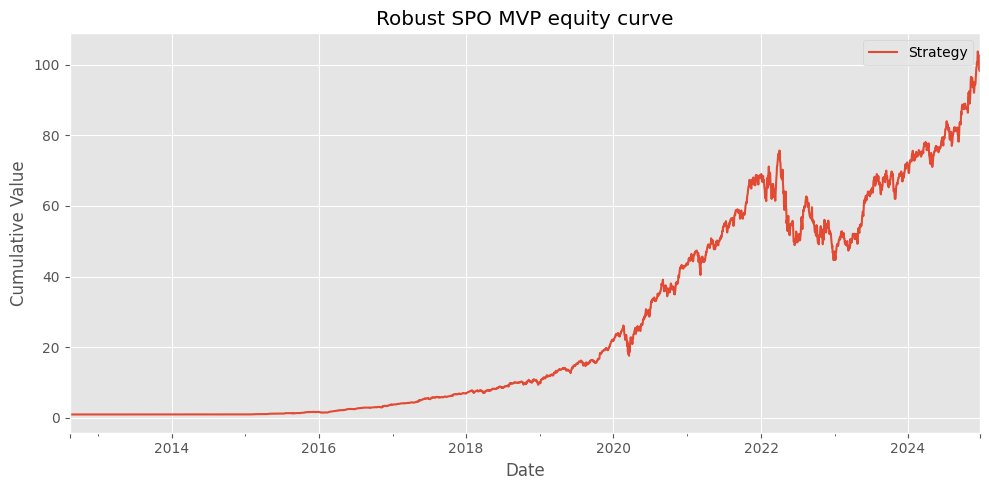


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.828
  Max drawdown:   -40.966%
  Avg turnover:   13.744%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 96.47674965544348, 'annualized_sharpe': 1.828250421708843, 'max_drawdown': -0.4096603640721813}
    fitness=1.3495, Sharpe=1.828, max_dd=-40.966%, avg_turn=13.744%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 96.00446902266931, 'annualized_sharpe': 1.6495928259833268, 'max_drawdown': -0.39917324513139085}


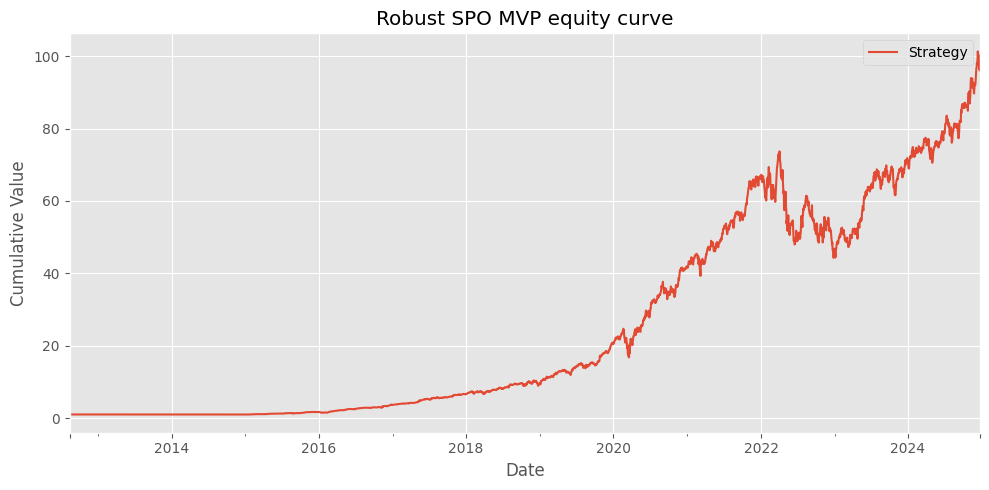


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.829
  Max drawdown:   -39.917%
  Avg turnover:   12.921%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 94.48909584870114, 'annualized_sharpe': 1.8295688589485437, 'max_drawdown': -0.3991732451313905}
    fitness=1.3654, Sharpe=1.829, max_dd=-39.917%, avg_turn=12.921%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 144.36767605998833, 'annualized_sharpe': 1.7769667052962528, 'max_drawdown': -0.404772117582718}


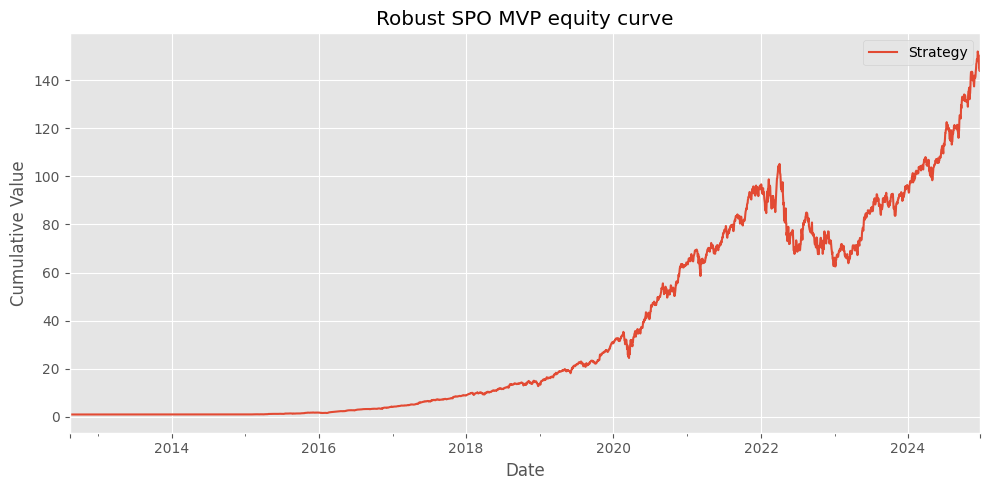


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.971
  Max drawdown:   -40.477%
  Avg turnover:   20.649%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 142.0691440501213, 'annualized_sharpe': 1.9715297459048693, 'max_drawdown': -0.4047721175827178}
    fitness=1.4631, Sharpe=1.971, max_dd=-40.477%, avg_turn=20.649%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 174.02355600248302, 'annualized_sharpe': 1.8079639208047908, 'max_drawdown': -0.43673746794325097}


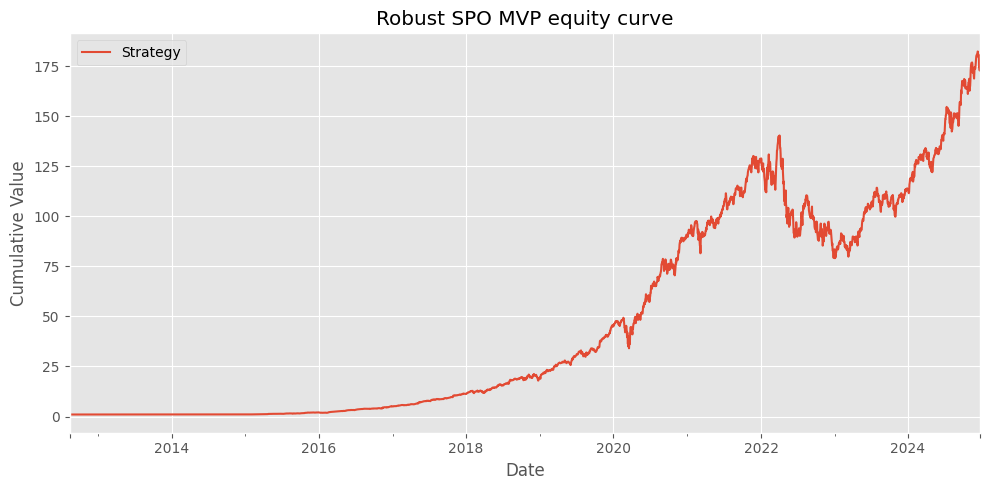


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.007
  Max drawdown:   -43.674%
  Avg turnover:   36.913%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 171.6019664800499, 'annualized_sharpe': 2.007136311297749, 'max_drawdown': -0.43673746794325163}
    fitness=1.3854, Sharpe=2.007, max_dd=-43.674%, avg_turn=36.913%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 171.3339841275474, 'annualized_sharpe': 1.799769223085677, 'max_drawdown': -0.41601043044355246}


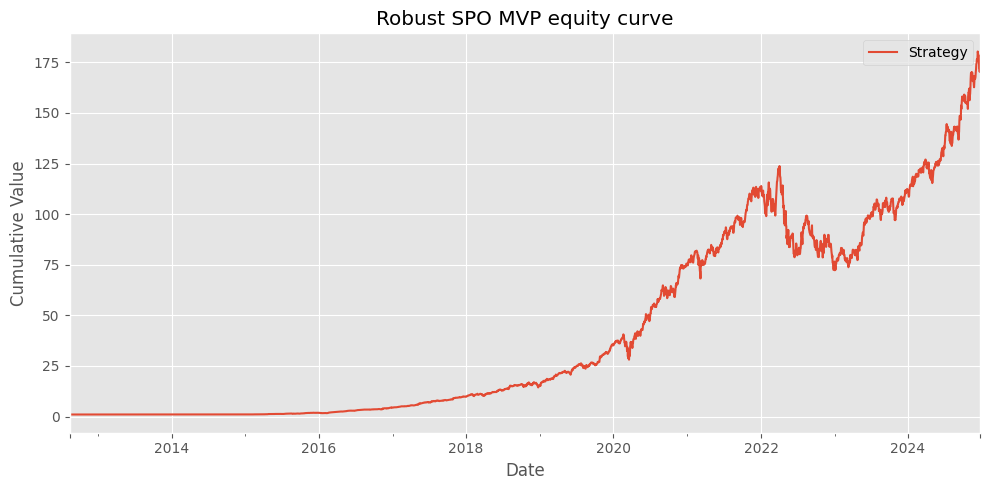


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.996
  Max drawdown:   -41.601%
  Avg turnover:   22.432%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.51311609707383, 'annualized_sharpe': 1.9967090266120036, 'max_drawdown': -0.4160104304435528}
    fitness=1.4682, Sharpe=1.996, max_dd=-41.601%, avg_turn=22.432%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 113.74907358049735, 'annualized_sharpe': 1.713370394257803, 'max_drawdown': -0.3933631813611118}


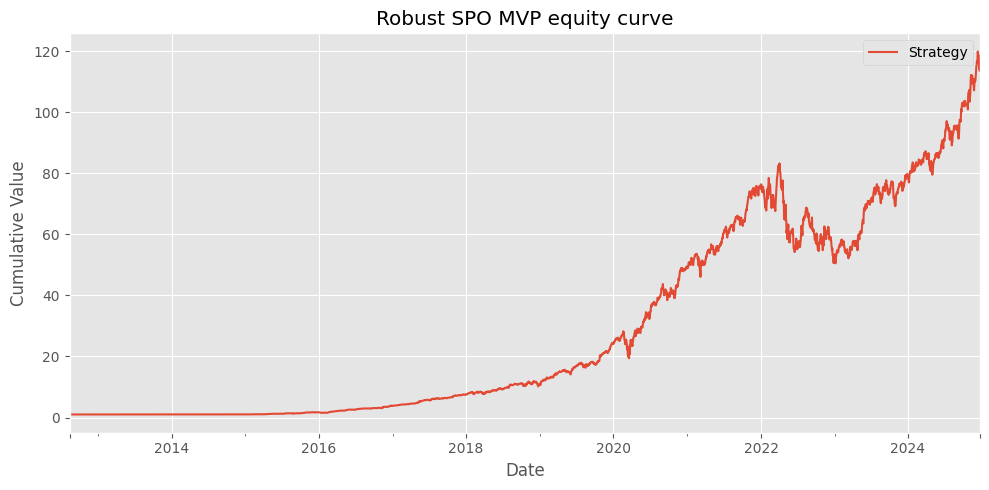


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.900
  Max drawdown:   -39.336%
  Avg turnover:   15.905%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 111.96925746974551, 'annualized_sharpe': 1.9007638511571665, 'max_drawdown': -0.39336318136111115}
    fitness=1.4275, Sharpe=1.900, max_dd=-39.336%, avg_turn=15.905%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 157.57167772931217, 'annualized_sharpe': 1.8008819687668745, 'max_drawdown': -0.4211750107718908}


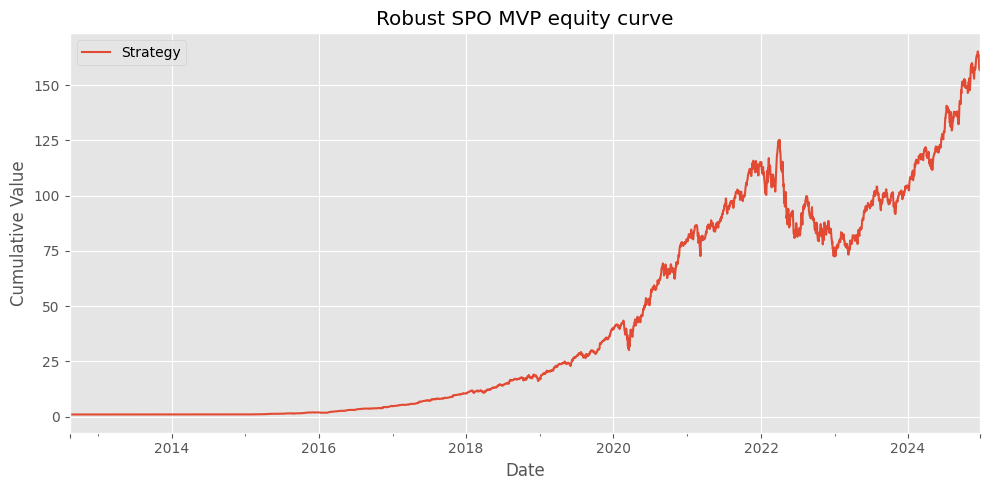


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.999
  Max drawdown:   -42.118%
  Avg turnover:   33.055%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 155.38348979087039, 'annualized_sharpe': 1.9992682142268552, 'max_drawdown': -0.421175010771891}
    fitness=1.4124, Sharpe=1.999, max_dd=-42.118%, avg_turn=33.055%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 160.8801585800439, 'annualized_sharpe': 1.7934184951250407, 'max_drawdown': -0.4125121537732108}


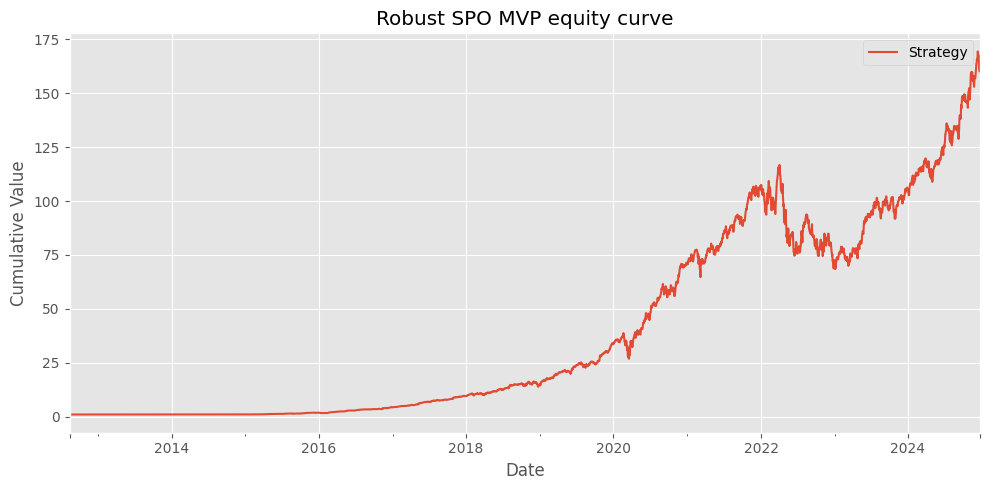


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.989
  Max drawdown:   -41.251%
  Avg turnover:   21.981%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 158.27529438180693, 'annualized_sharpe': 1.9897502344797464, 'max_drawdown': -0.4125121537732106}
    fitness=1.4669, Sharpe=1.989, max_dd=-41.251%, avg_turn=21.981%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 168.79584441265462, 'annualized_sharpe': 1.8063043771669787, 'max_drawdown': -0.42156120985212675}


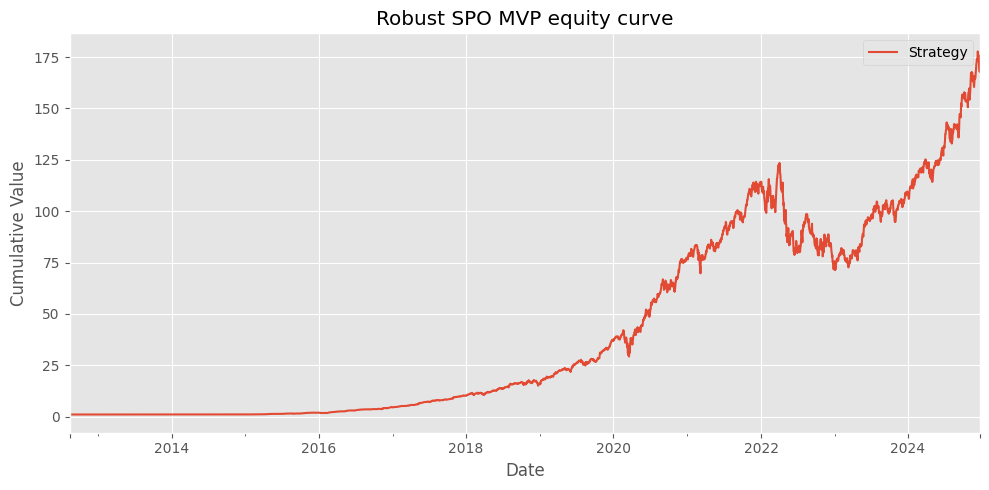


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.004
  Max drawdown:   -42.156%
  Avg turnover:   24.210%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 166.0642117488177, 'annualized_sharpe': 2.004050025951406, 'max_drawdown': -0.42156120985212675}
    fitness=1.4610, Sharpe=2.004, max_dd=-42.156%, avg_turn=24.210%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 123.61684186479503, 'annualized_sharpe': 1.7475414249724992, 'max_drawdown': -0.39620371546946986}


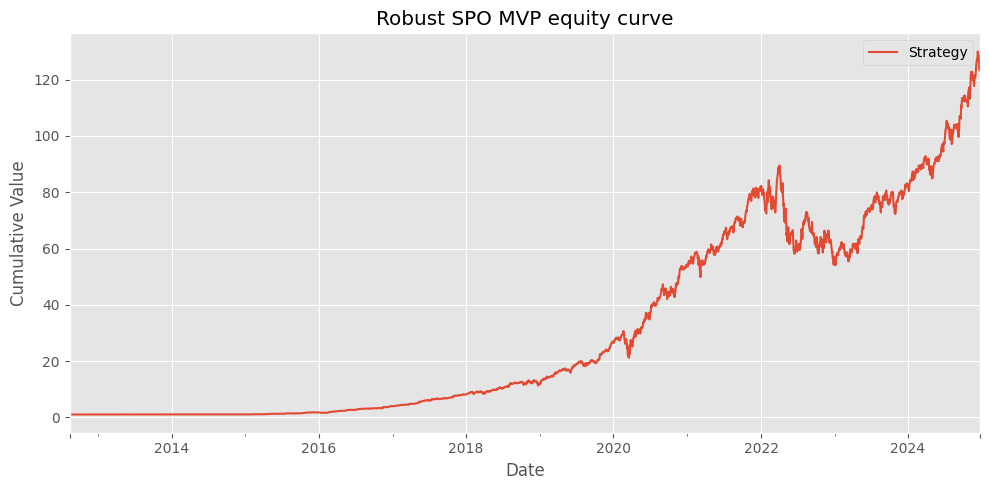


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.938
  Max drawdown:   -39.620%
  Avg turnover:   18.745%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 121.65217803084714, 'annualized_sharpe': 1.938641843555513, 'max_drawdown': -0.3962037154694702}
    fitness=1.4483, Sharpe=1.938, max_dd=-39.620%, avg_turn=18.745%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 94.05878650271198, 'annualized_sharpe': 1.6881782311867106, 'max_drawdown': -0.37884120960882894}


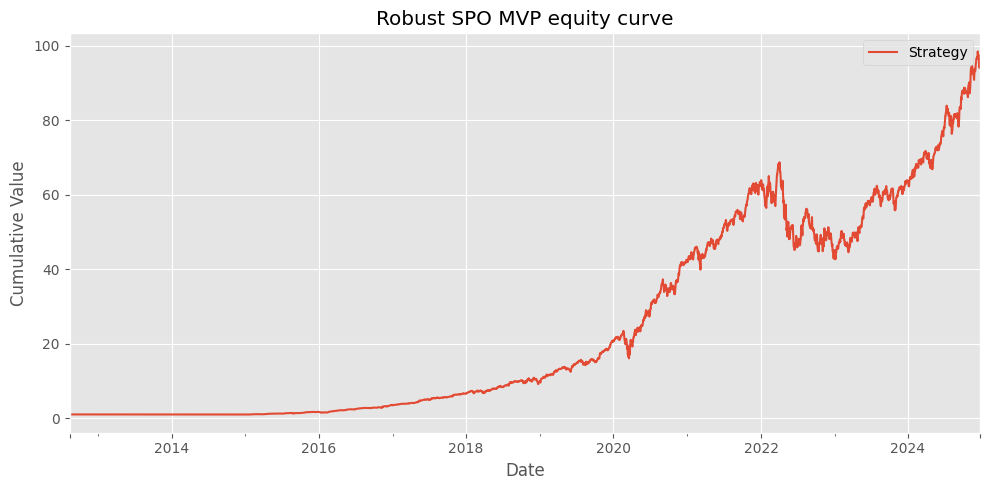


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.873
  Max drawdown:   -37.884%
  Avg turnover:   19.016%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 92.72031277182994, 'annualized_sharpe': 1.873197602940688, 'max_drawdown': -0.37884120960882894}
    fitness=1.3989, Sharpe=1.873, max_dd=-37.884%, avg_turn=19.016%

Generation 7 best: fitness=1.4728, Sharpe=2.008, max_dd=-42.316%, avg_turn=22.447%

--- GA Generation 8/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 170.89885755975462, 'annualized_sharpe': 1.8104689136702234, 'max_drawdown

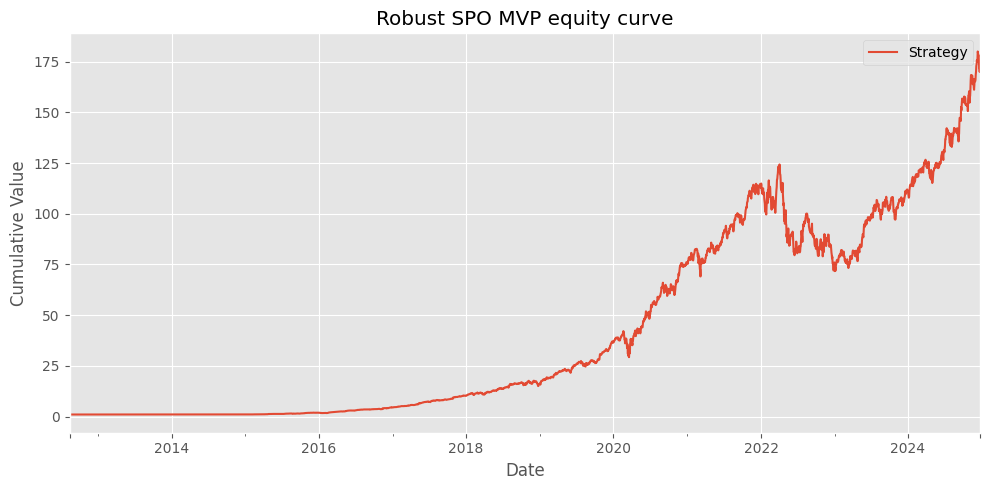


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.008
  Max drawdown:   -42.316%
  Avg turnover:   22.447%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.09171284092992, 'annualized_sharpe': 2.008576743885213, 'max_drawdown': -0.42315790351967886}
    fitness=1.4728, Sharpe=2.008, max_dd=-42.316%, avg_turn=22.447%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 170.96720552384267, 'annualized_sharpe': 1.7999393057510964, 'max_drawdown': -0.41571218767606943}


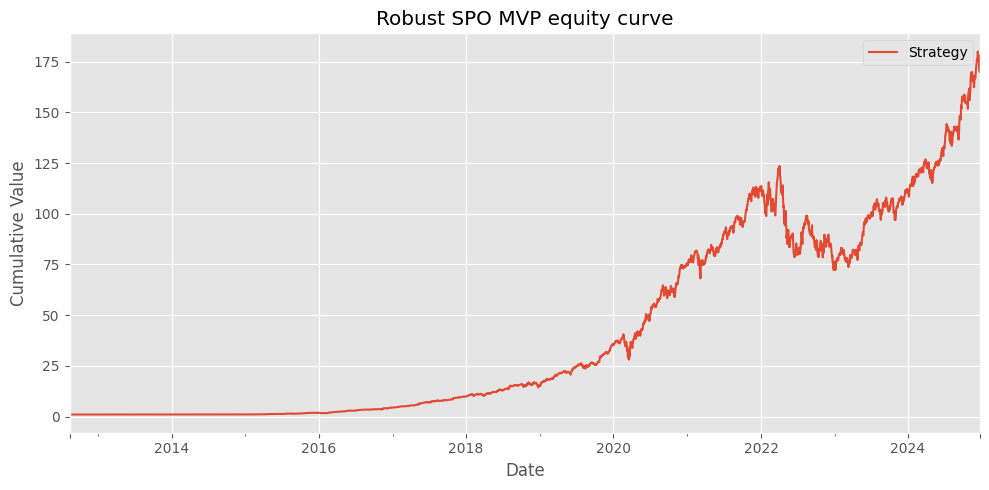


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.997
  Max drawdown:   -41.571%
  Avg turnover:   22.421%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.1582999188814, 'annualized_sharpe': 1.9969194742253797, 'max_drawdown': -0.41571218767606954}
    fitness=1.4687, Sharpe=1.997, max_dd=-41.571%, avg_turn=22.421%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 171.3339841275474, 'annualized_sharpe': 1.799769223085677, 'max_drawdown': -0.41601043044355246}


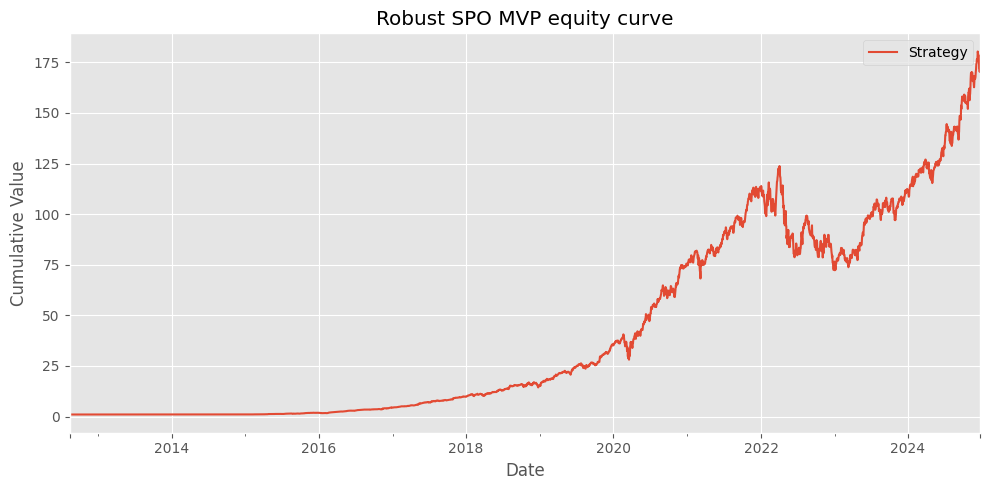


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.996
  Max drawdown:   -41.601%
  Avg turnover:   22.432%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.51311609707383, 'annualized_sharpe': 1.9967090266120036, 'max_drawdown': -0.4160104304435528}
    fitness=1.4682, Sharpe=1.996, max_dd=-41.601%, avg_turn=22.432%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 160.8801585800439, 'annualized_sharpe': 1.7934184951250407, 'max_drawdown': -0.4125121537732108}


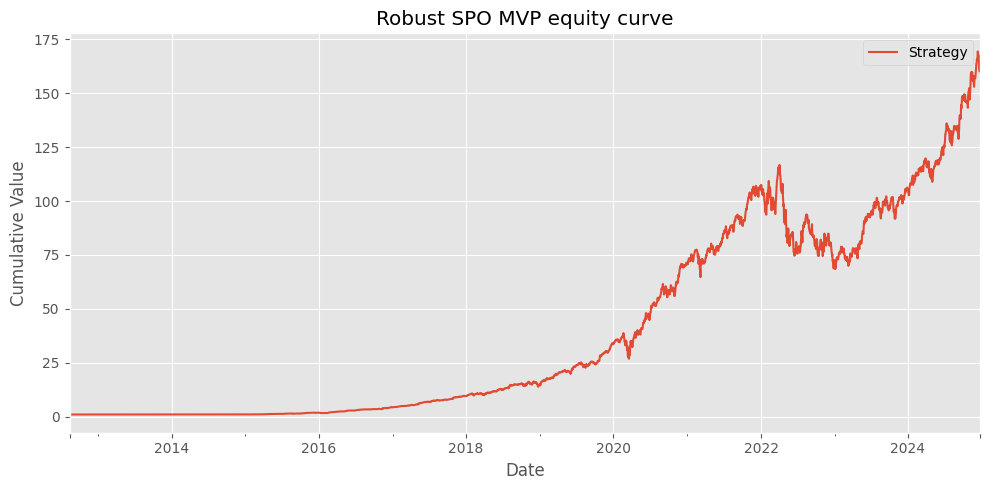


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.989
  Max drawdown:   -41.251%
  Avg turnover:   21.981%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 158.27529438180693, 'annualized_sharpe': 1.9897502344797464, 'max_drawdown': -0.4125121537732106}
    fitness=1.4669, Sharpe=1.989, max_dd=-41.251%, avg_turn=21.981%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 86.44081529869257, 'annualized_sharpe': 1.6304664745784572, 'max_drawdown': -0.39459345801307755}


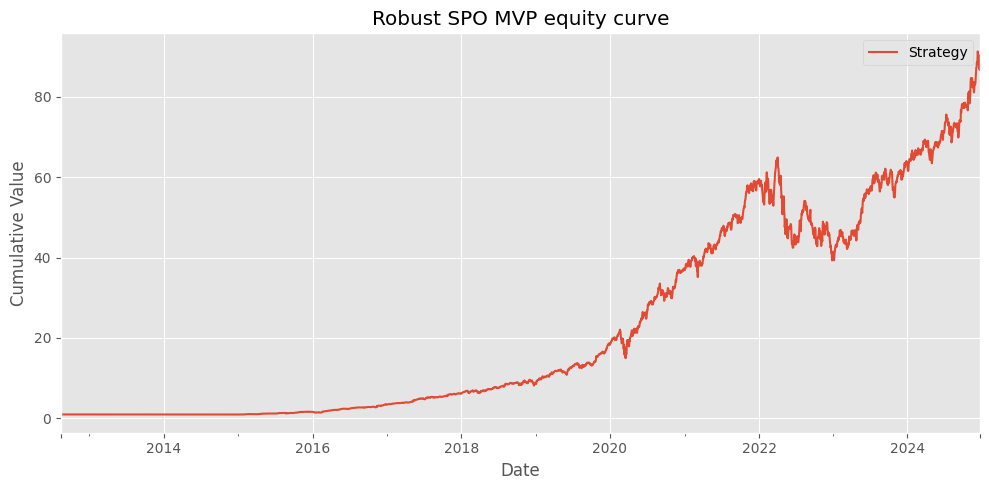


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.808
  Max drawdown:   -39.459%
  Avg turnover:   12.264%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 85.10484232702065, 'annualized_sharpe': 1.8083393155241696, 'max_drawdown': -0.39459345801307777}
    fitness=1.3521, Sharpe=1.808, max_dd=-39.459%, avg_turn=12.264%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 144.36767605998833, 'annualized_sharpe': 1.7769667052962528, 'max_drawdown': -0.404772117582718}


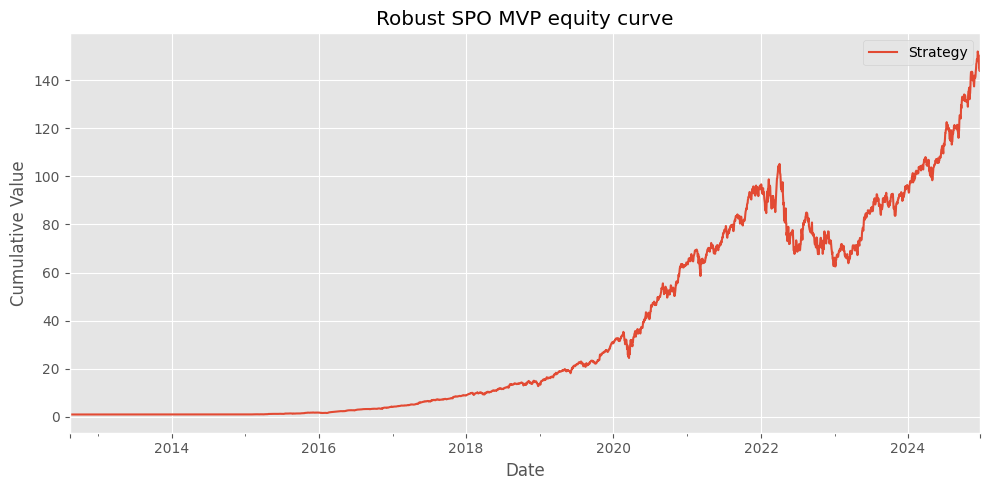


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.971
  Max drawdown:   -40.477%
  Avg turnover:   20.649%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 142.0691440501213, 'annualized_sharpe': 1.9715297459048693, 'max_drawdown': -0.4047721175827178}
    fitness=1.4631, Sharpe=1.971, max_dd=-40.477%, avg_turn=20.649%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 166.23257774571812, 'annualized_sharpe': 1.8096638882188132, 'max_drawdown': -0.4169625497923064}


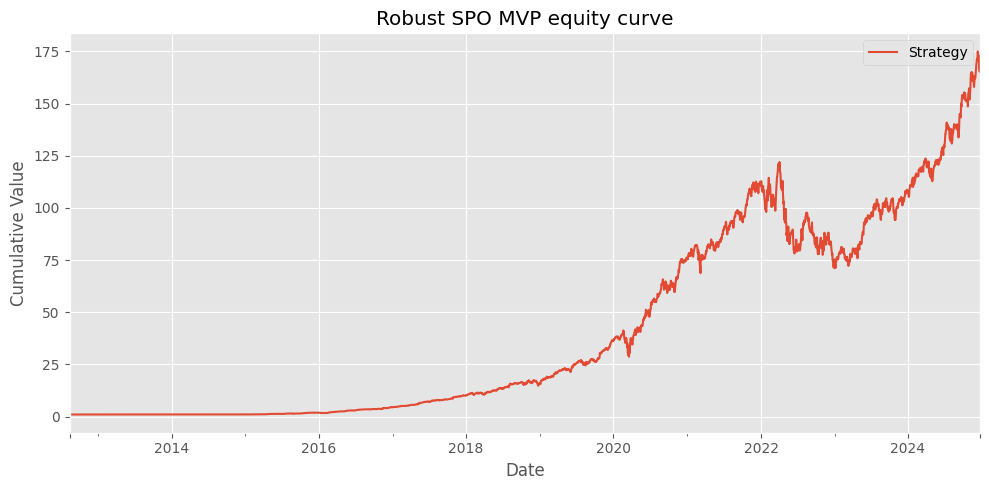


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.008
  Max drawdown:   -41.696%
  Avg turnover:   23.826%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 163.60005153305286, 'annualized_sharpe': 2.0080289977366688, 'max_drawdown': -0.4169625497923062}
    fitness=1.4715, Sharpe=2.008, max_dd=-41.696%, avg_turn=23.826%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


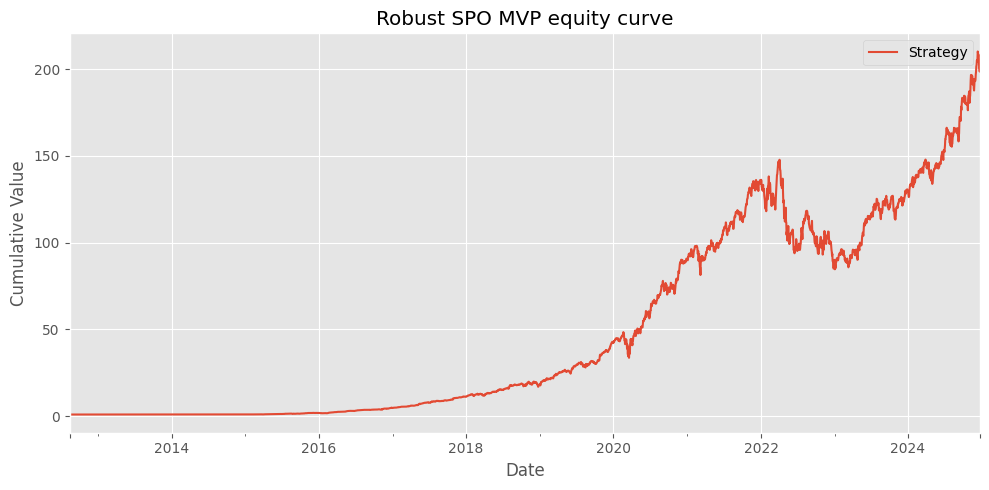


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 154.15215784766463, 'annualized_sharpe': 1.7907409365821925, 'max_drawdown': -0.41024411195561583}


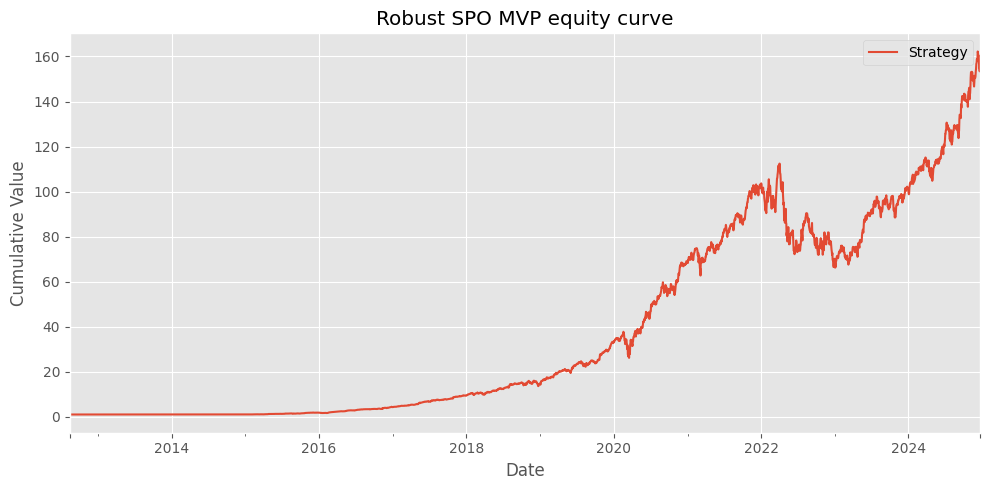


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.986
  Max drawdown:   -41.024%
  Avg turnover:   21.867%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 151.6894366031845, 'annualized_sharpe': 1.9868528884688736, 'max_drawdown': -0.41024411195561616}
    fitness=1.4669, Sharpe=1.986, max_dd=-41.024%, avg_turn=21.867%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 169.97180056576096, 'annualized_sharpe': 1.8047099228422139, 'max_drawdown': -0.4200288354480921}


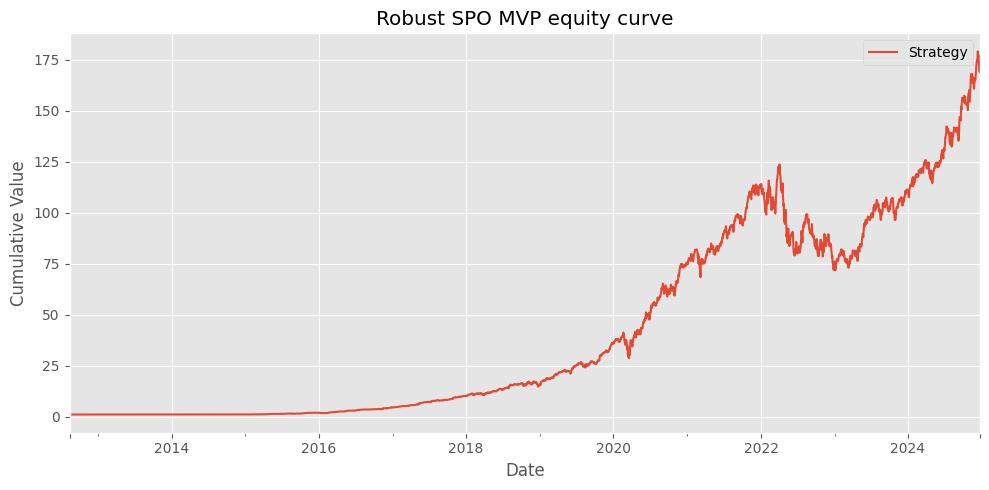


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.002
  Max drawdown:   -42.003%
  Avg turnover:   22.420%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 167.1836097549768, 'annualized_sharpe': 2.002204211029838, 'max_drawdown': -0.42002883544809166}
    fitness=1.4697, Sharpe=2.002, max_dd=-42.003%, avg_turn=22.420%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 168.87462718937465, 'annualized_sharpe': 1.805847772989059, 'max_drawdown': -0.4193611873762616}


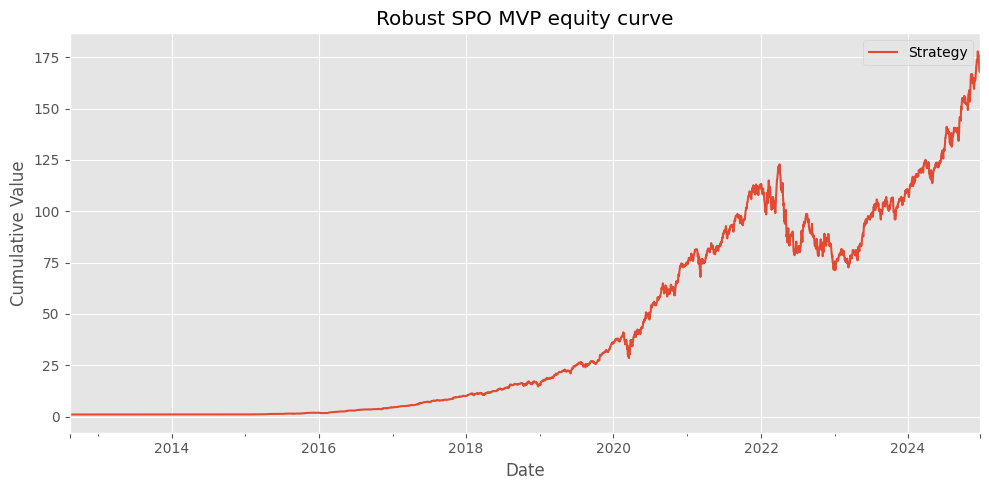


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.003
  Max drawdown:   -41.936%
  Avg turnover:   22.330%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 166.1131354096521, 'annualized_sharpe': 2.0034981566146977, 'max_drawdown': -0.4193611873762624}
    fitness=1.4721, Sharpe=2.003, max_dd=-41.936%, avg_turn=22.330%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 154.481960276935, 'annualized_sharpe': 1.786071099863316, 'max_drawdown': -0.4094486816590489}


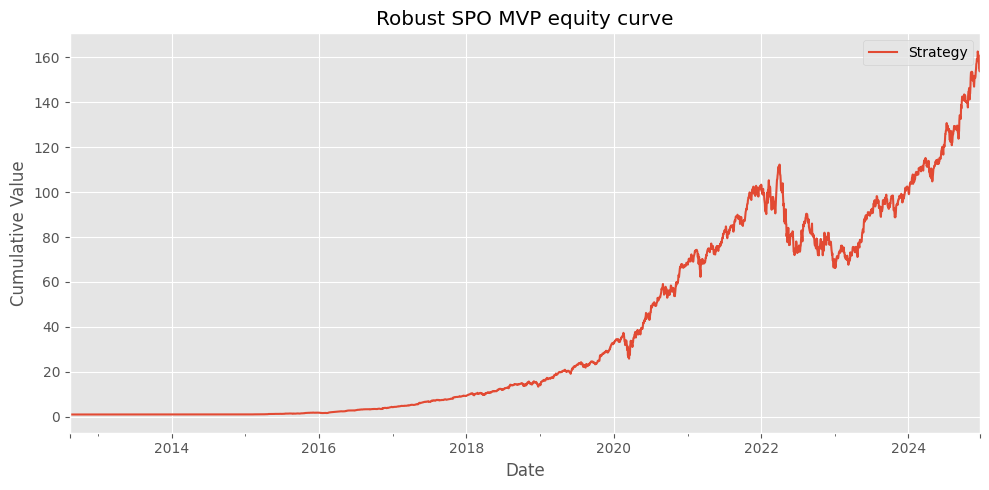


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.981
  Max drawdown:   -40.945%
  Avg turnover:   21.341%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 152.000222370546, 'annualized_sharpe': 1.9816345867077476, 'max_drawdown': -0.4094486816590487}
    fitness=1.4651, Sharpe=1.981, max_dd=-40.945%, avg_turn=21.341%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 132.46257201380405, 'annualized_sharpe': 1.7466788180973154, 'max_drawdown': -0.4016207327235485}


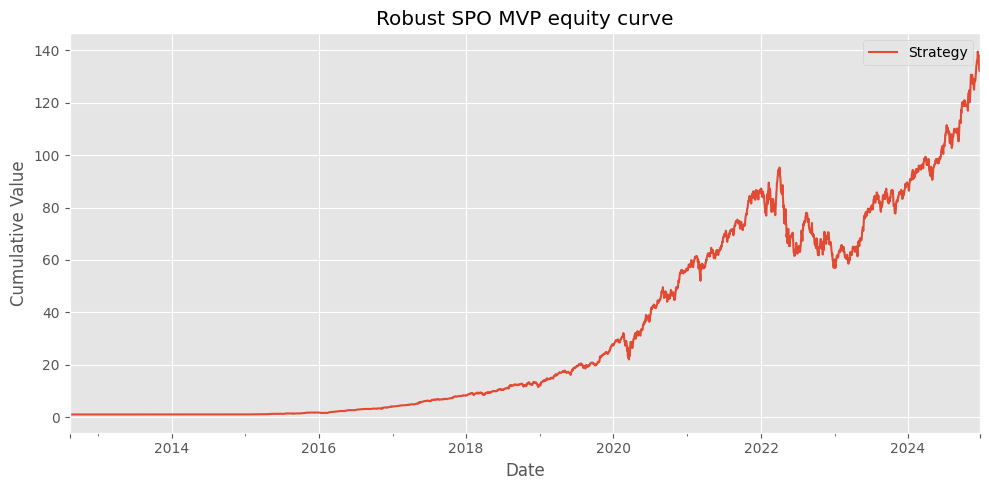


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.937
  Max drawdown:   -40.162%
  Avg turnover:   17.760%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 130.29812475060447, 'annualized_sharpe': 1.9375583249200912, 'max_drawdown': -0.4016207327235486}
    fitness=1.4468, Sharpe=1.937, max_dd=-40.162%, avg_turn=17.760%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 166.39491495703024, 'annualized_sharpe': 1.8028666582210306, 'max_drawdown': -0.4208065517065872}


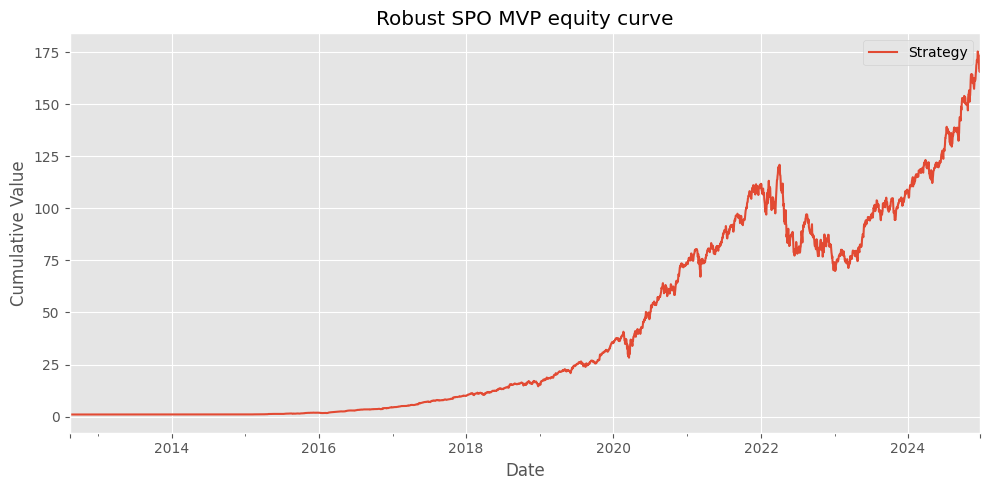


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.000
  Max drawdown:   -42.081%
  Avg turnover:   22.295%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 163.66059093747677, 'annualized_sharpe': 2.0000915289182855, 'max_drawdown': -0.4208065517065873}
    fitness=1.4674, Sharpe=2.000, max_dd=-42.081%, avg_turn=22.295%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 207.88030763441893, 'annualized_sharpe': 1.8300889173550061, 'max_drawdown': -0.4507931122184846}


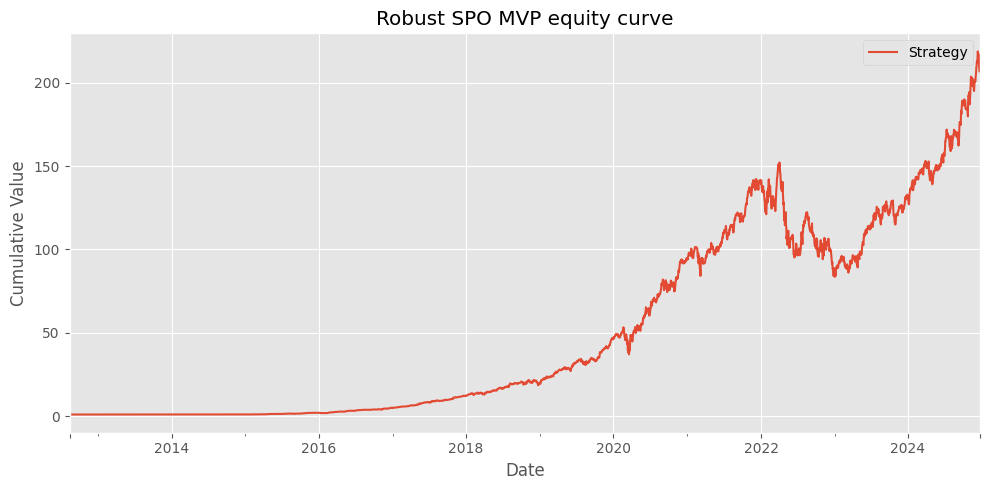


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.030
  Max drawdown:   -45.079%
  Avg turnover:   25.193%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 204.46775159608083, 'annualized_sharpe': 2.0304384920911565, 'max_drawdown': -0.4507931122184843}
    fitness=1.4533, Sharpe=2.030, max_dd=-45.079%, avg_turn=25.193%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 161.95050849336062, 'annualized_sharpe': 1.7926354801289288, 'max_drawdown': -0.4121391160640231}


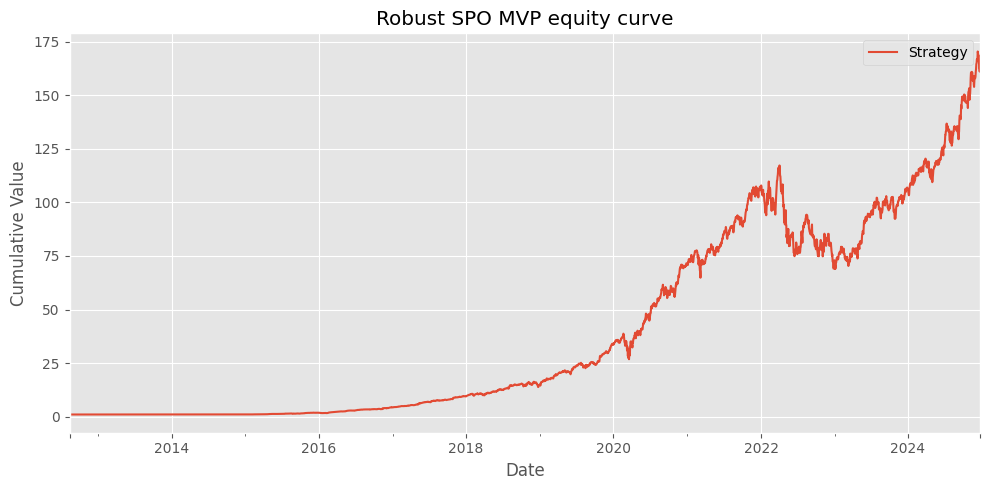


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.988
  Max drawdown:   -41.214%
  Avg turnover:   21.821%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 159.3222854604119, 'annualized_sharpe': 1.9888762736281544, 'max_drawdown': -0.41213911606402287}
    fitness=1.4672, Sharpe=1.988, max_dd=-41.214%, avg_turn=21.821%

Generation 8 best: fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%

--- GA Generation 9/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdow

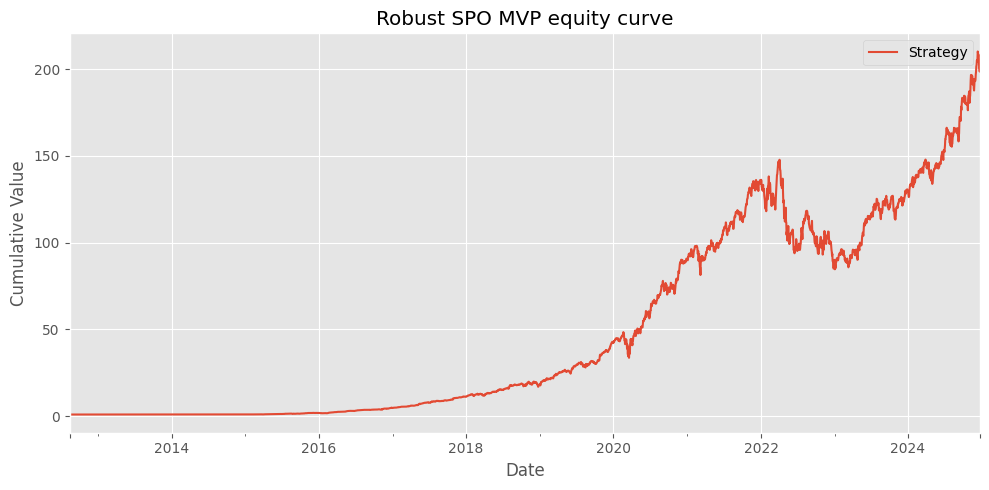


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 170.89885755975462, 'annualized_sharpe': 1.8104689136702234, 'max_drawdown': -0.42315790351967864}


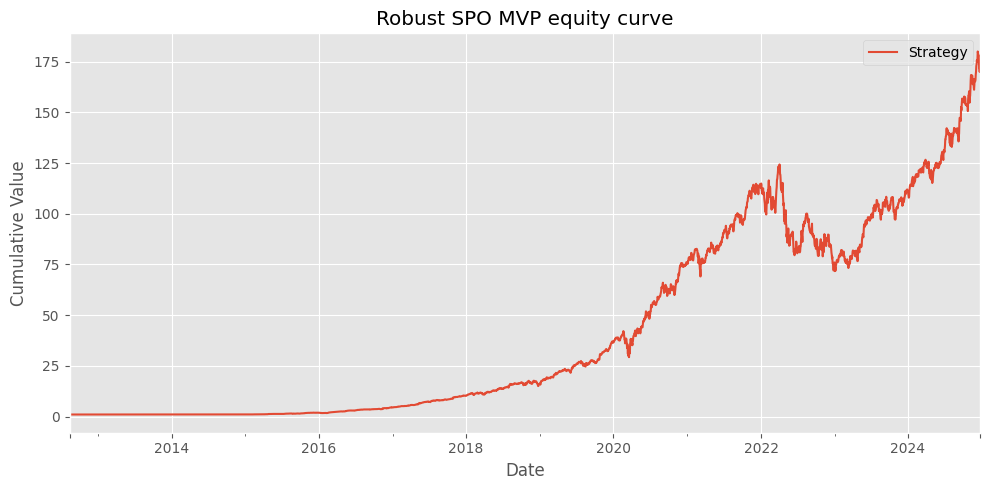


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.008
  Max drawdown:   -42.316%
  Avg turnover:   22.447%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.09171284092992, 'annualized_sharpe': 2.008576743885213, 'max_drawdown': -0.42315790351967886}
    fitness=1.4728, Sharpe=2.008, max_dd=-42.316%, avg_turn=22.447%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 168.87462718937465, 'annualized_sharpe': 1.805847772989059, 'max_drawdown': -0.4193611873762616}


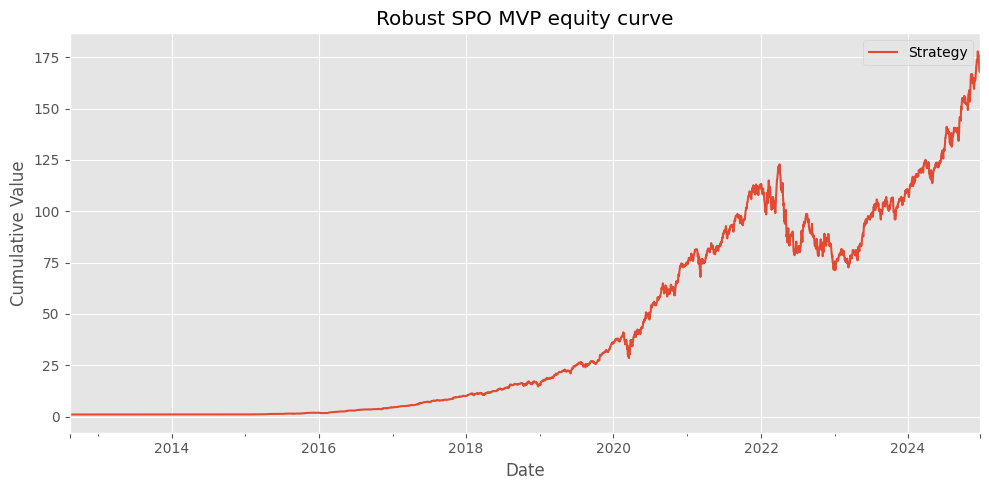


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.003
  Max drawdown:   -41.936%
  Avg turnover:   22.330%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 166.1131354096521, 'annualized_sharpe': 2.0034981566146977, 'max_drawdown': -0.4193611873762624}
    fitness=1.4721, Sharpe=2.003, max_dd=-41.936%, avg_turn=22.330%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 166.23257774571812, 'annualized_sharpe': 1.8096638882188132, 'max_drawdown': -0.4169625497923064}


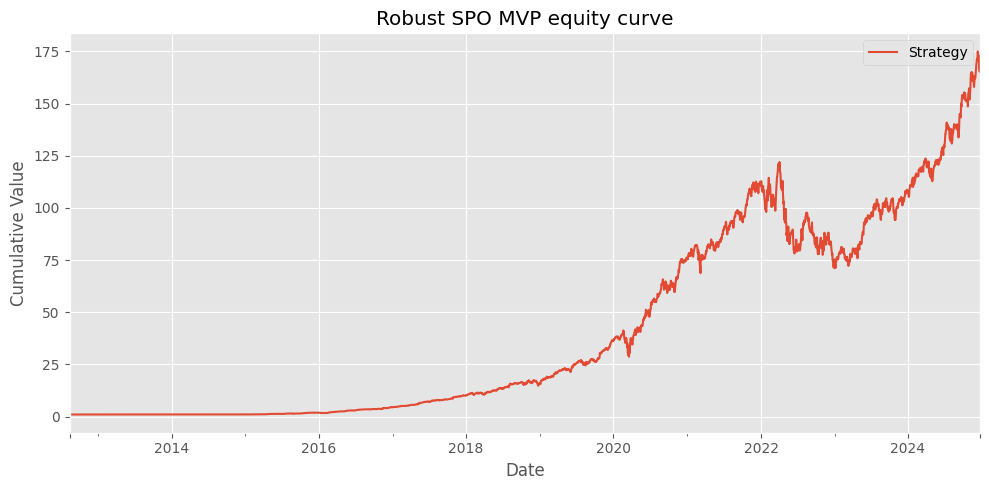


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.008
  Max drawdown:   -41.696%
  Avg turnover:   23.826%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 163.60005153305286, 'annualized_sharpe': 2.0080289977366688, 'max_drawdown': -0.4169625497923062}
    fitness=1.4715, Sharpe=2.008, max_dd=-41.696%, avg_turn=23.826%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 193.07564920911796, 'annualized_sharpe': 1.8301660606070385, 'max_drawdown': -0.4399778273633451}


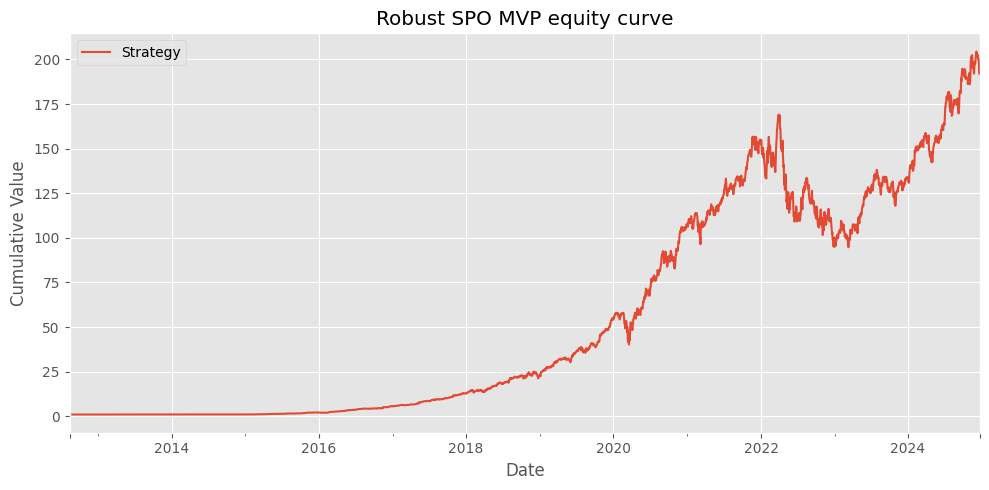


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.033
  Max drawdown:   -43.998%
  Avg turnover:   54.748%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 190.886378425451, 'annualized_sharpe': 2.0330970609871404, 'max_drawdown': -0.439977827363345}
    fitness=1.3190, Sharpe=2.033, max_dd=-43.998%, avg_turn=54.748%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 194.6154360170354, 'annualized_sharpe': 1.828559972965733, 'max_drawdown': -0.44114804925835116}


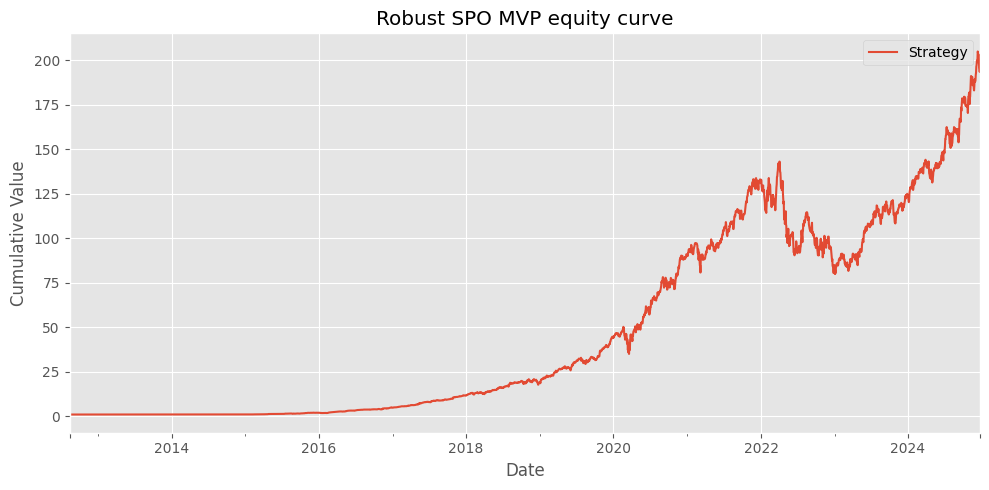


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.028
  Max drawdown:   -44.115%
  Avg turnover:   25.649%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 191.46650222356317, 'annualized_sharpe': 2.028779595952038, 'max_drawdown': -0.4411480492583515}
    fitness=1.4590, Sharpe=2.028, max_dd=-44.115%, avg_turn=25.649%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 169.76415053892822, 'annualized_sharpe': 1.8003419722727558, 'max_drawdown': -0.41485465762056084}


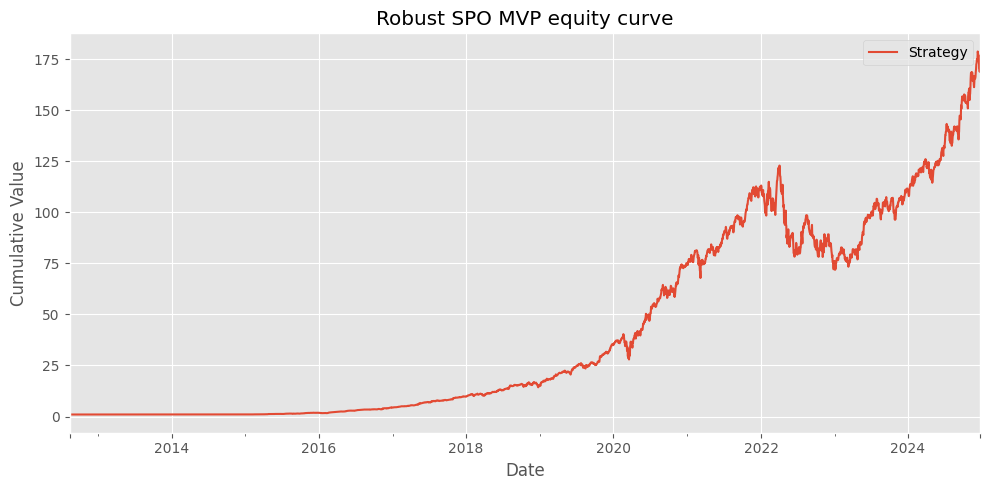


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.997
  Max drawdown:   -41.485%
  Avg turnover:   22.388%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 166.99157620829553, 'annualized_sharpe': 1.9974258516806245, 'max_drawdown': -0.4148546576205606}
    fitness=1.4702, Sharpe=1.997, max_dd=-41.485%, avg_turn=22.388%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 182.67923360065996, 'annualized_sharpe': 1.8207914107677876, 'max_drawdown': -0.4234746124807166}


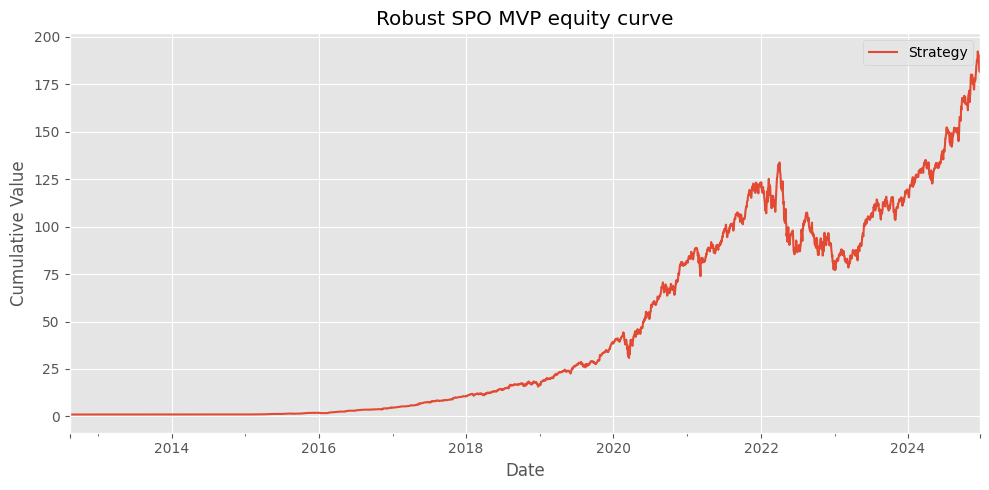


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.020
  Max drawdown:   -42.347%
  Avg turnover:   23.245%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 179.7119263978183, 'annualized_sharpe': 2.0202787067351795, 'max_drawdown': -0.4234746124807166}
    fitness=1.4802, Sharpe=2.020, max_dd=-42.347%, avg_turn=23.245%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 160.8801585800439, 'annualized_sharpe': 1.7934184951250407, 'max_drawdown': -0.4125121537732108}


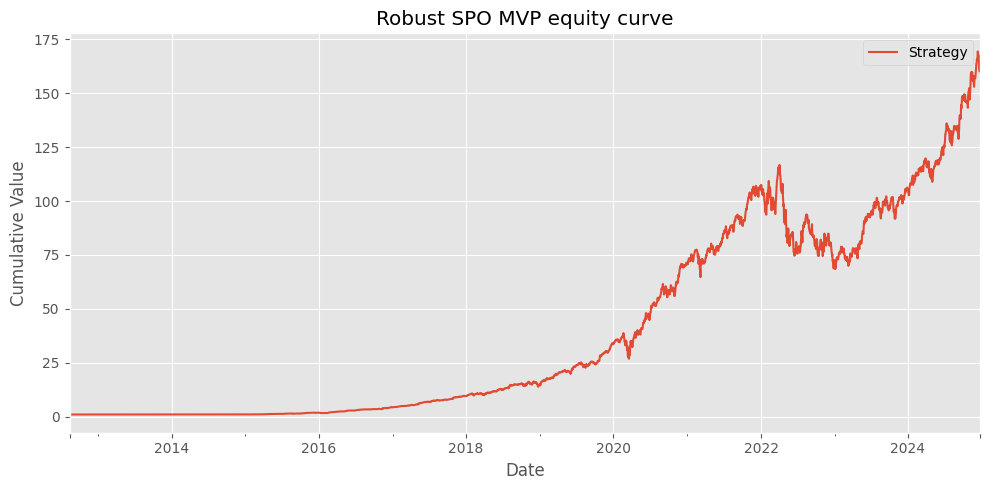


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.989
  Max drawdown:   -41.251%
  Avg turnover:   21.981%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 158.27529438180693, 'annualized_sharpe': 1.9897502344797464, 'max_drawdown': -0.4125121537732106}
    fitness=1.4669, Sharpe=1.989, max_dd=-41.251%, avg_turn=21.981%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 227.35311886379176, 'annualized_sharpe': 1.8547733756561813, 'max_drawdown': -0.43487207494550406}


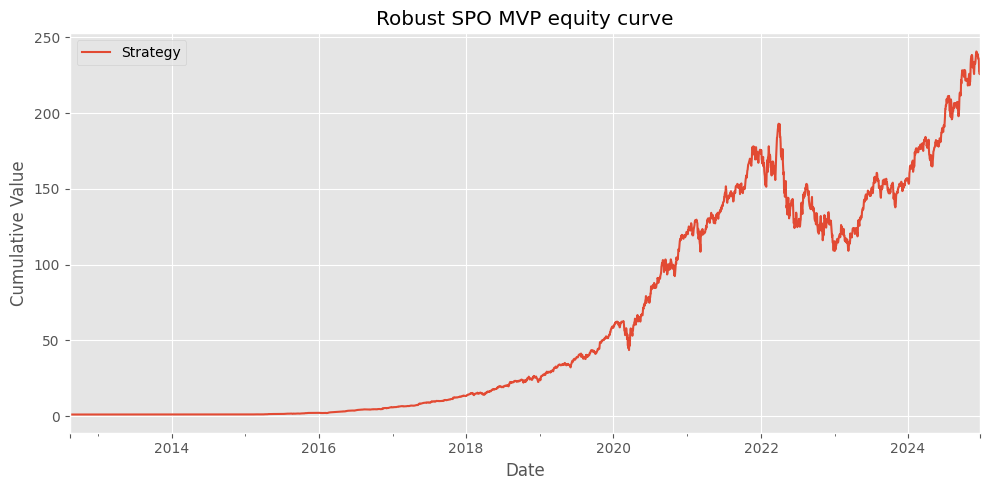


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.061
  Max drawdown:   -43.487%
  Avg turnover:   53.652%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 224.95085237304093, 'annualized_sharpe': 2.061105402767711, 'max_drawdown': -0.4348720749455042}
    fitness=1.3576, Sharpe=2.061, max_dd=-43.487%, avg_turn=53.652%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


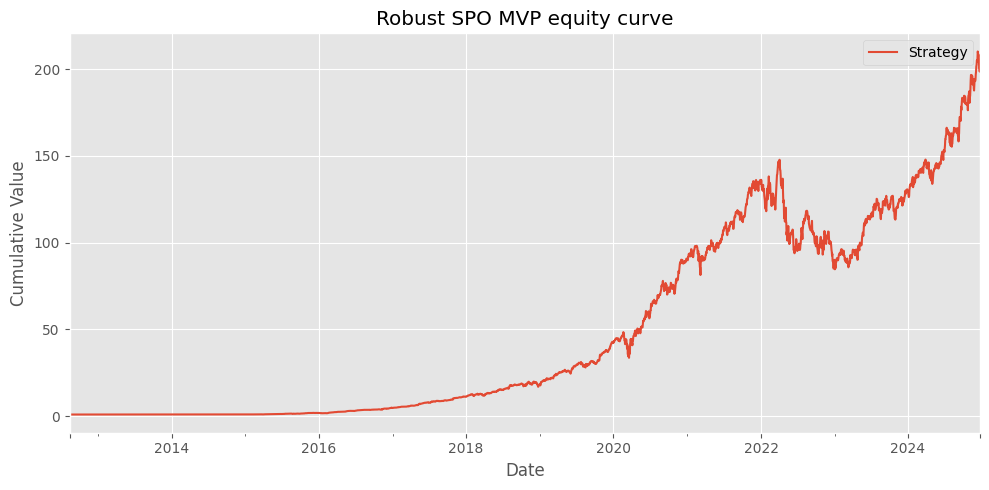


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 152.19493293648833, 'annualized_sharpe': 1.7836559016614748, 'max_drawdown': -0.4179182733793053}


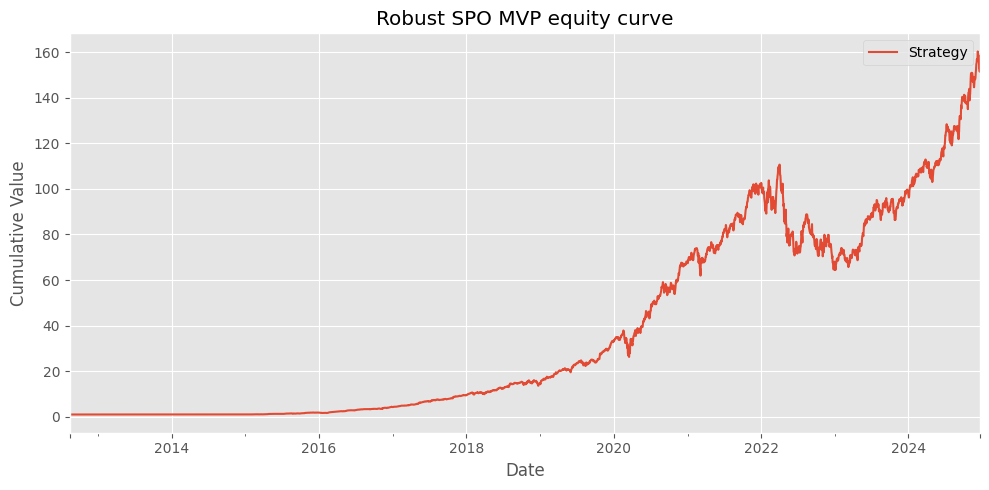


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.978
  Max drawdown:   -41.792%
  Avg turnover:   21.855%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 149.69927892782098, 'annualized_sharpe': 1.9786294789635857, 'max_drawdown': -0.4179182733793052}
    fitness=1.4511, Sharpe=1.978, max_dd=-41.792%, avg_turn=21.855%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 183.21535953459707, 'annualized_sharpe': 1.821508077255675, 'max_drawdown': -0.42305081561349156}


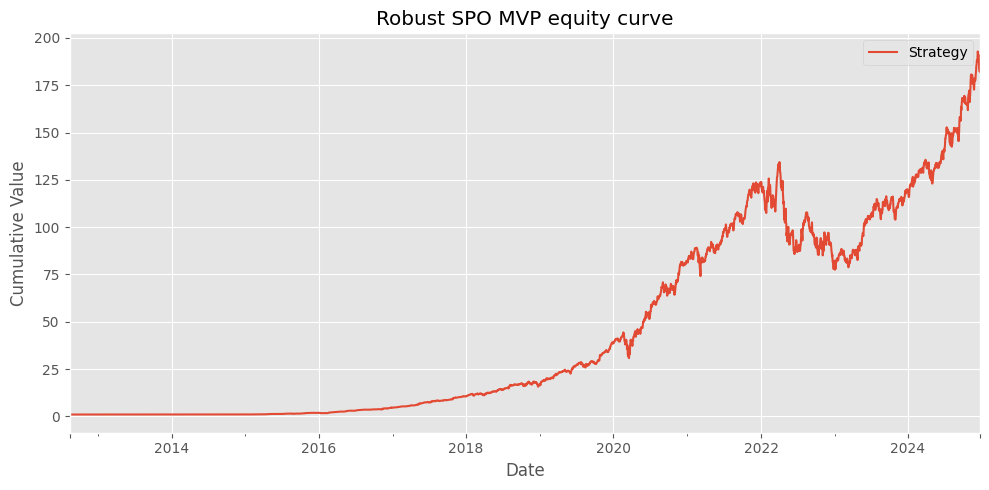


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.021
  Max drawdown:   -42.305%
  Avg turnover:   23.236%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 180.25041829122236, 'annualized_sharpe': 2.021128677741834, 'max_drawdown': -0.42305081561349156}
    fitness=1.4815, Sharpe=2.021, max_dd=-42.305%, avg_turn=23.236%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 111.04892944986777, 'annualized_sharpe': 1.6711075127526083, 'max_drawdown': -0.4204611009671775}


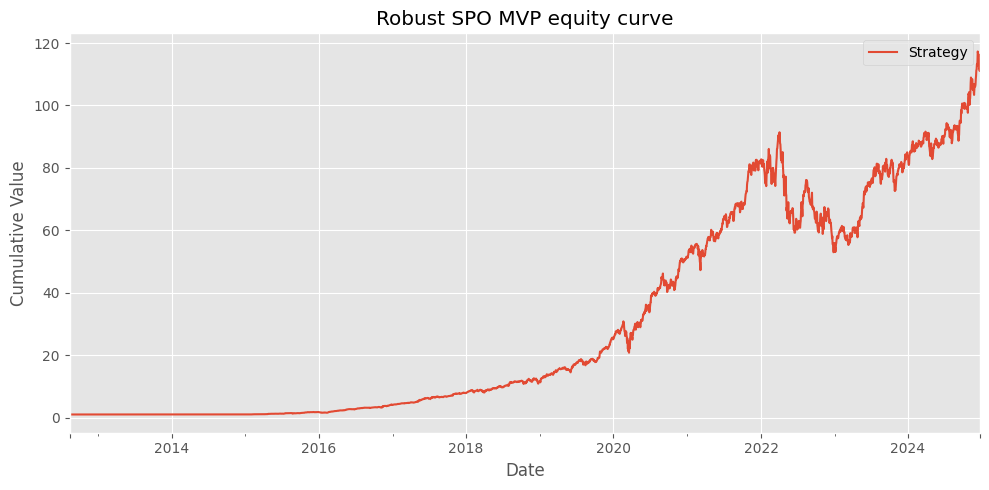


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.852
  Max drawdown:   -42.046%
  Avg turnover:   14.167%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 109.10074261990613, 'annualized_sharpe': 1.852658695889119, 'max_drawdown': -0.42046110096717715}
    fitness=1.3610, Sharpe=1.852, max_dd=-42.046%, avg_turn=14.167%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 169.2652716081121, 'annualized_sharpe': 1.8004781441330702, 'max_drawdown': -0.41743261764043826}


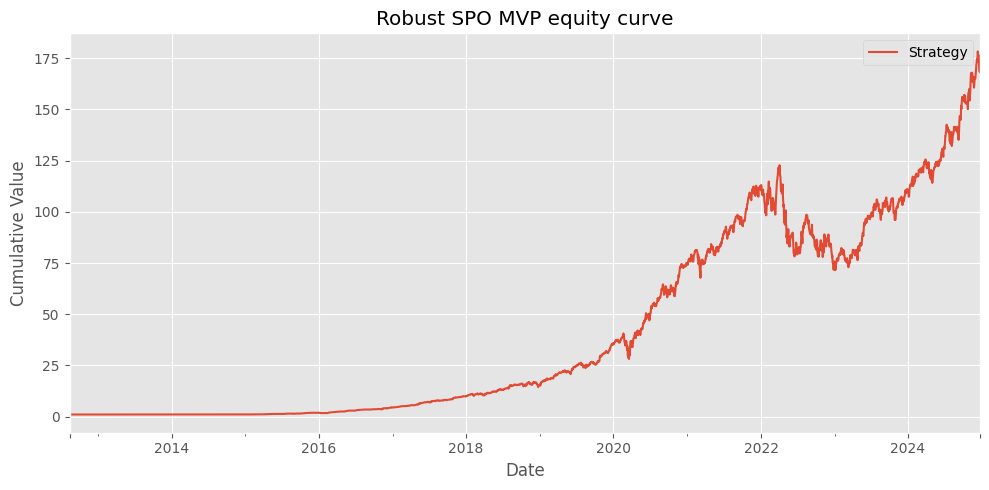


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.997
  Max drawdown:   -41.743%
  Avg turnover:   22.389%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 166.48997268103955, 'annualized_sharpe': 1.997514613283994, 'max_drawdown': -0.41743261764043815}
    fitness=1.4677, Sharpe=1.997, max_dd=-41.743%, avg_turn=22.389%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 181.391490471117, 'annualized_sharpe': 1.8209731911772455, 'max_drawdown': -0.42444395202828167}


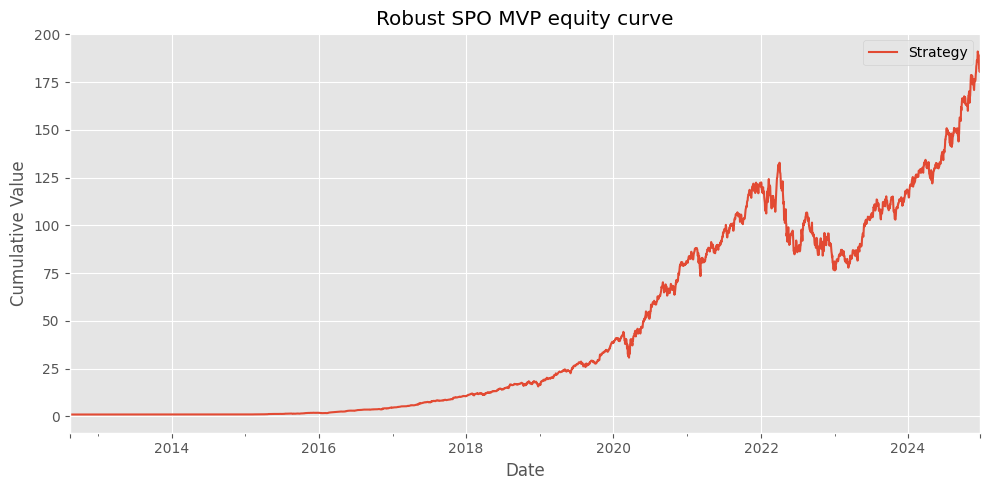


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.020
  Max drawdown:   -42.444%
  Avg turnover:   23.091%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 178.43722626605492, 'annualized_sharpe': 2.020435878979638, 'max_drawdown': -0.4244439520282818}
    fitness=1.4801, Sharpe=2.020, max_dd=-42.444%, avg_turn=23.091%

Generation 9 best: fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%

--- GA Generation 10/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdow

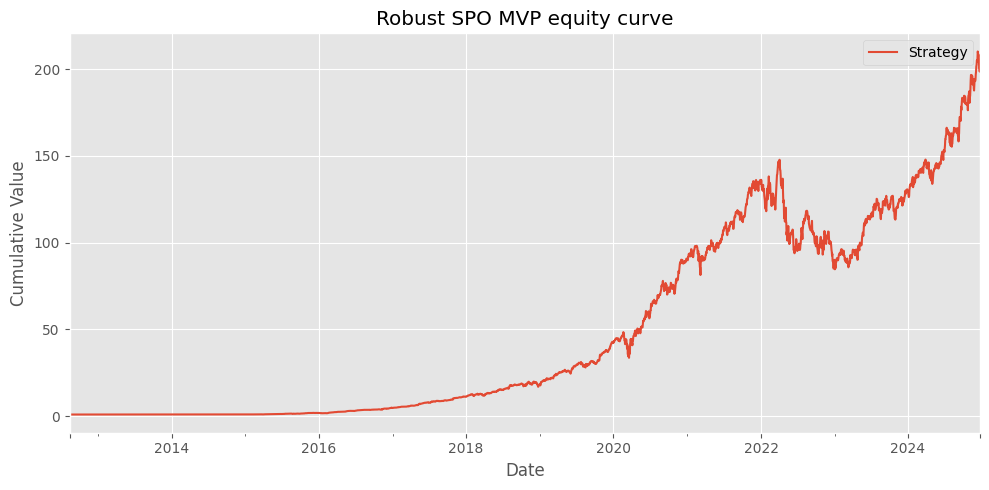


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


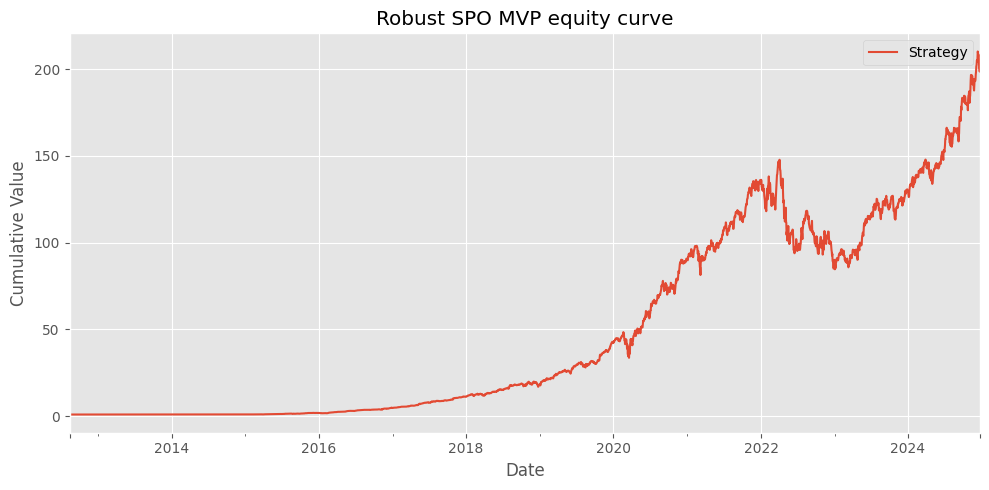


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 183.21535953459707, 'annualized_sharpe': 1.821508077255675, 'max_drawdown': -0.42305081561349156}


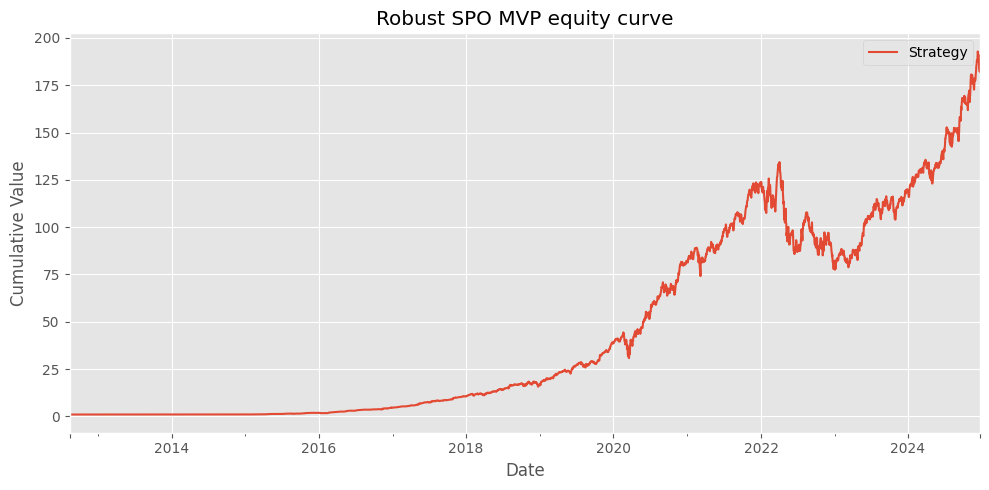


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.021
  Max drawdown:   -42.305%
  Avg turnover:   23.236%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 180.25041829122236, 'annualized_sharpe': 2.021128677741834, 'max_drawdown': -0.42305081561349156}
    fitness=1.4815, Sharpe=2.021, max_dd=-42.305%, avg_turn=23.236%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 182.67923360065996, 'annualized_sharpe': 1.8207914107677876, 'max_drawdown': -0.4234746124807166}


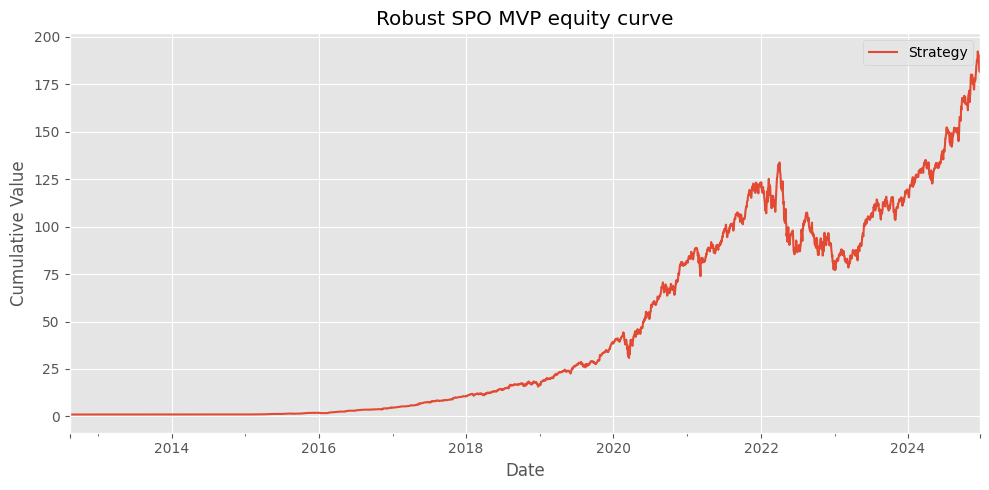


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.020
  Max drawdown:   -42.347%
  Avg turnover:   23.245%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 179.7119263978183, 'annualized_sharpe': 2.0202787067351795, 'max_drawdown': -0.4234746124807166}
    fitness=1.4802, Sharpe=2.020, max_dd=-42.347%, avg_turn=23.245%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


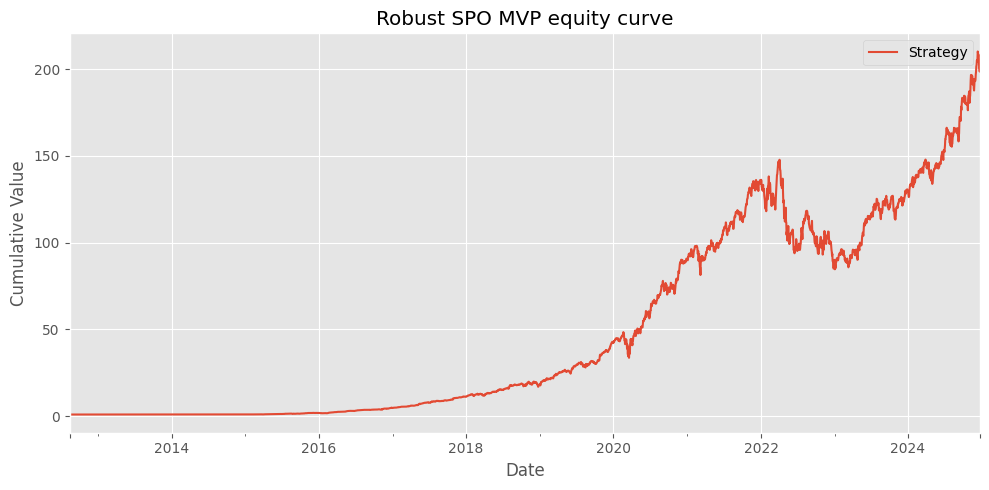


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 175.2827842050891, 'annualized_sharpe': 1.8124001852452167, 'max_drawdown': -0.42161506711060703}


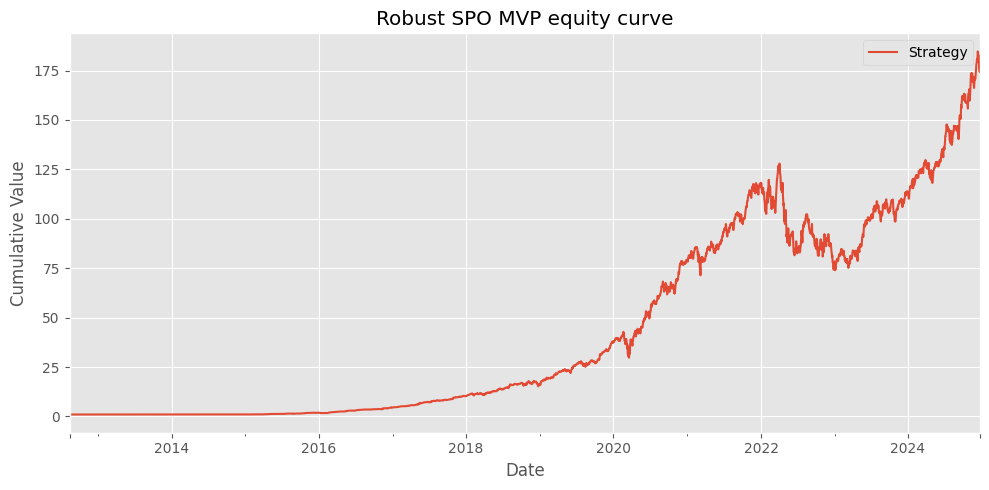


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.010
  Max drawdown:   -42.162%
  Avg turnover:   23.748%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 172.42691380963137, 'annualized_sharpe': 2.010822010719835, 'max_drawdown': -0.42161506711060714}
    fitness=1.4701, Sharpe=2.010, max_dd=-42.162%, avg_turn=23.748%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 174.64330012515063, 'annualized_sharpe': 1.8082983482716826, 'max_drawdown': -0.4184852735048268}


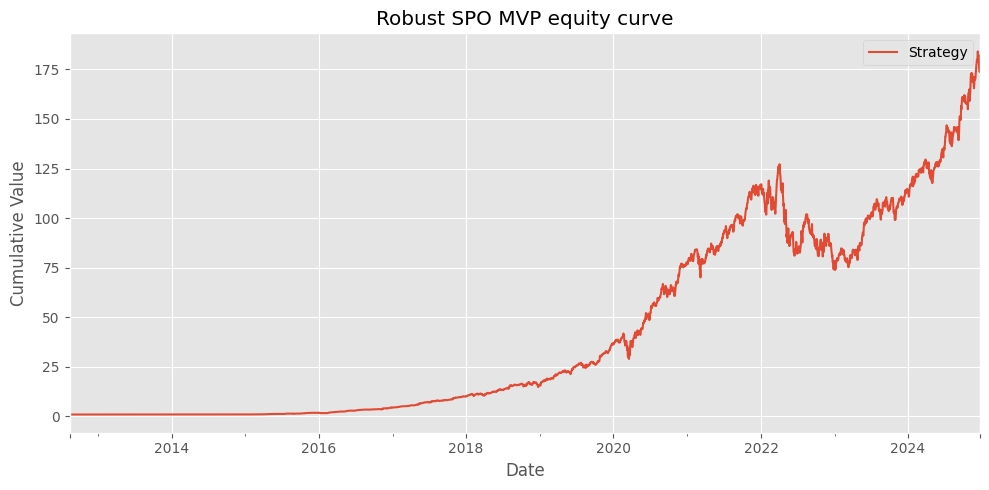


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.006
  Max drawdown:   -41.849%
  Avg turnover:   22.725%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 171.80376122746412, 'annualized_sharpe': 2.0063439170621042, 'max_drawdown': -0.4184852735048269}
    fitness=1.4738, Sharpe=2.006, max_dd=-41.849%, avg_turn=22.725%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 232.88653183723167, 'annualized_sharpe': 1.8354783179216339, 'max_drawdown': -0.46232826826822015}


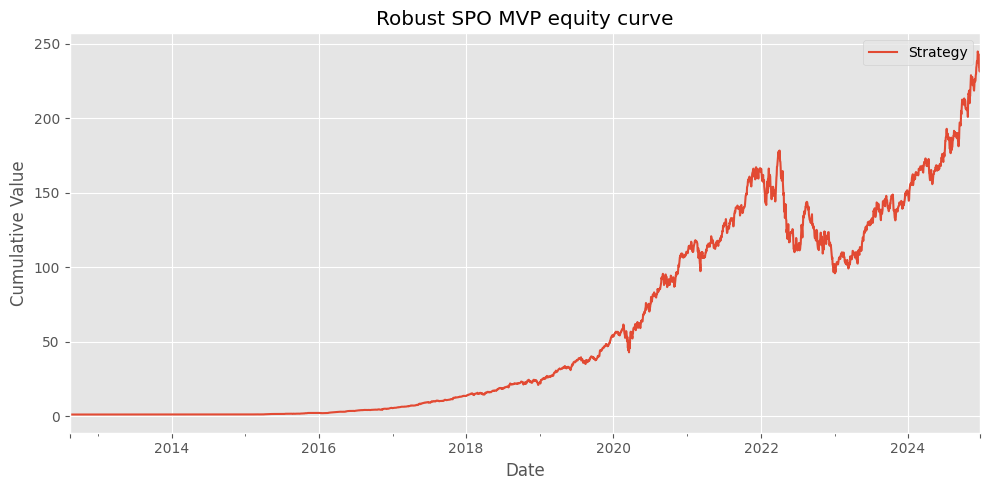


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.036
  Max drawdown:   -46.233%
  Avg turnover:   26.589%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 229.1110854492285, 'annualized_sharpe': 2.0366228760665335, 'max_drawdown': -0.46232826826821993}
    fitness=1.4410, Sharpe=2.036, max_dd=-46.233%, avg_turn=26.589%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 140.1217230952522, 'annualized_sharpe': 1.7815307918133954, 'max_drawdown': -0.4176102616864933}


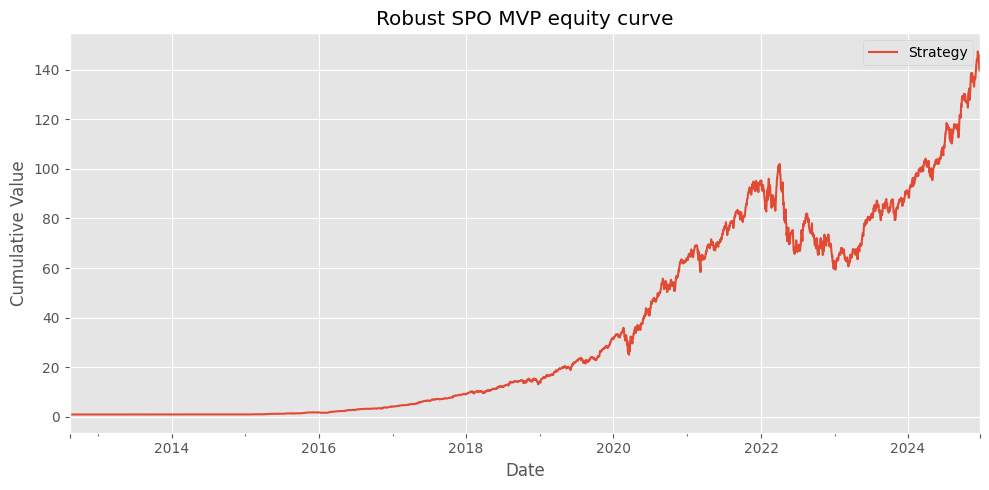


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.976
  Max drawdown:   -41.761%
  Avg turnover:   22.099%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 137.88016981360974, 'annualized_sharpe': 1.9763589360113676, 'max_drawdown': -0.4176102616864935}
    fitness=1.4479, Sharpe=1.976, max_dd=-41.761%, avg_turn=22.099%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 181.79233857566854, 'annualized_sharpe': 1.8252531954809033, 'max_drawdown': -0.43475393337049306}


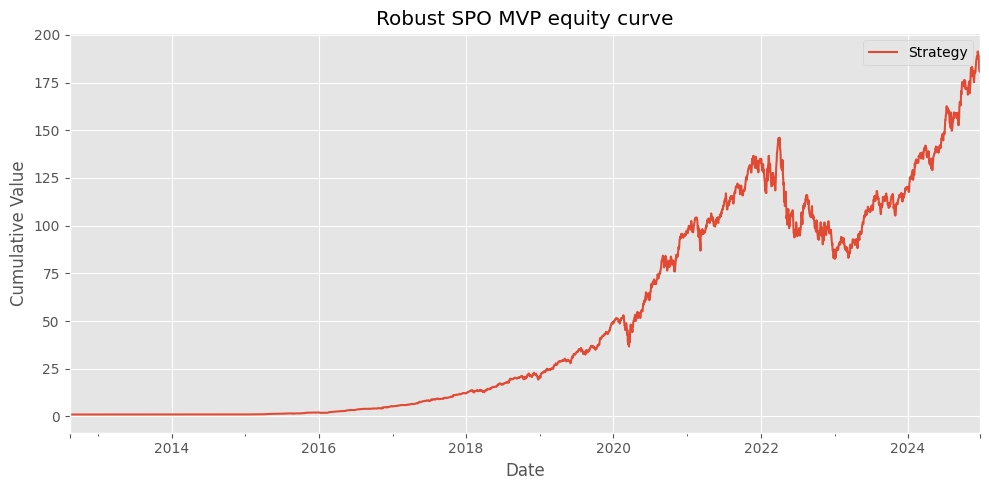


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.026
  Max drawdown:   -43.475%
  Avg turnover:   35.434%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 179.21638724750952, 'annualized_sharpe': 2.026326475238819, 'max_drawdown': -0.4347539333704926}
    fitness=1.4140, Sharpe=2.026, max_dd=-43.475%, avg_turn=35.434%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 182.9033559897128, 'annualized_sharpe': 1.8211705182925357, 'max_drawdown': -0.42297880704392676}


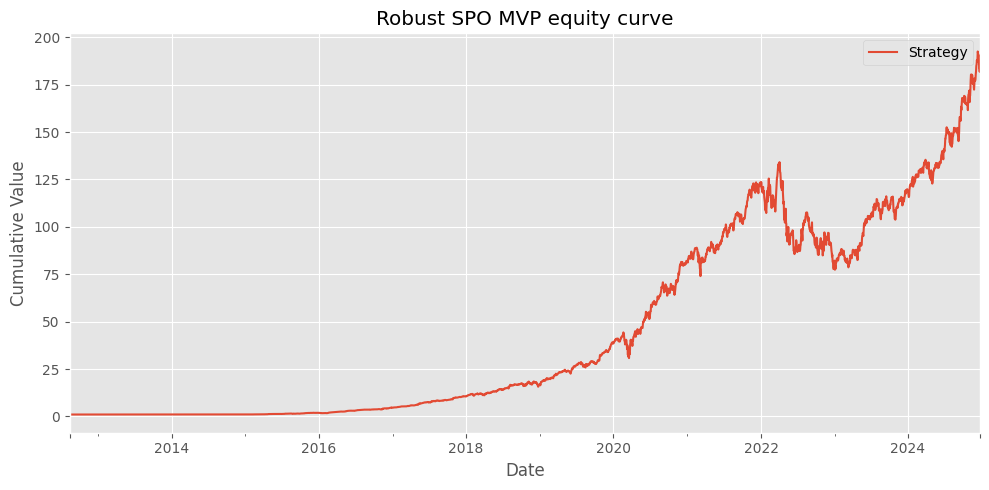


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.020
  Max drawdown:   -42.298%
  Avg turnover:   23.216%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 179.94256488944401, 'annualized_sharpe': 2.020747982181024, 'max_drawdown': -0.42297880704392654}
    fitness=1.4813, Sharpe=2.020, max_dd=-42.298%, avg_turn=23.216%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 171.35564094710602, 'annualized_sharpe': 1.8077171608752762, 'max_drawdown': -0.4197660370063162}


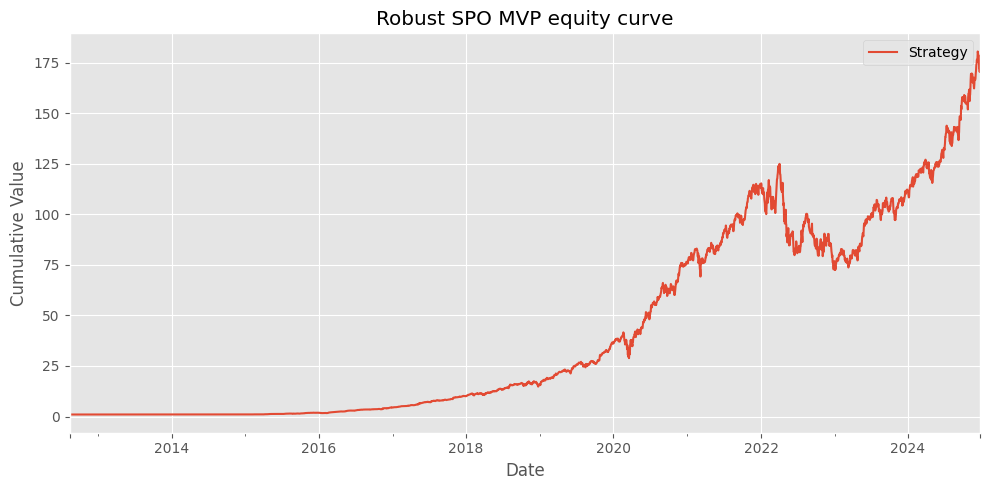


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.005
  Max drawdown:   -41.977%
  Avg turnover:   22.783%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 168.55864874343555, 'annualized_sharpe': 2.00560126237736, 'max_drawdown': -0.4197660370063162}
    fitness=1.4715, Sharpe=2.005, max_dd=-41.977%, avg_turn=22.783%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 110.59876847581384, 'annualized_sharpe': 1.6645747183387822, 'max_drawdown': -0.41833667580941314}


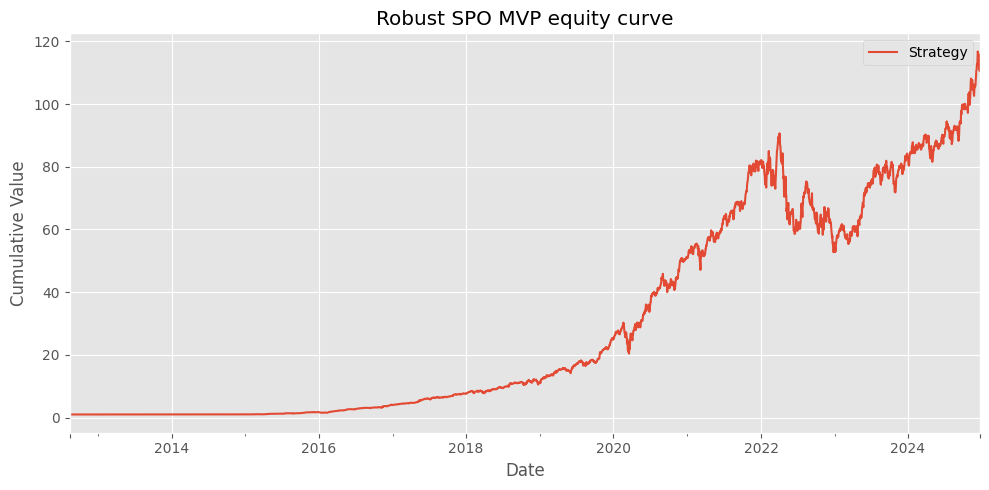


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.845
  Max drawdown:   -41.834%
  Avg turnover:   14.151%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 108.72396817410792, 'annualized_sharpe': 1.8457973028593617, 'max_drawdown': -0.41833667580941336}
    fitness=1.3563, Sharpe=1.845, max_dd=-41.834%, avg_turn=14.151%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 246.66468990716592, 'annualized_sharpe': 1.86033883299776, 'max_drawdown': -0.44341652028153833}


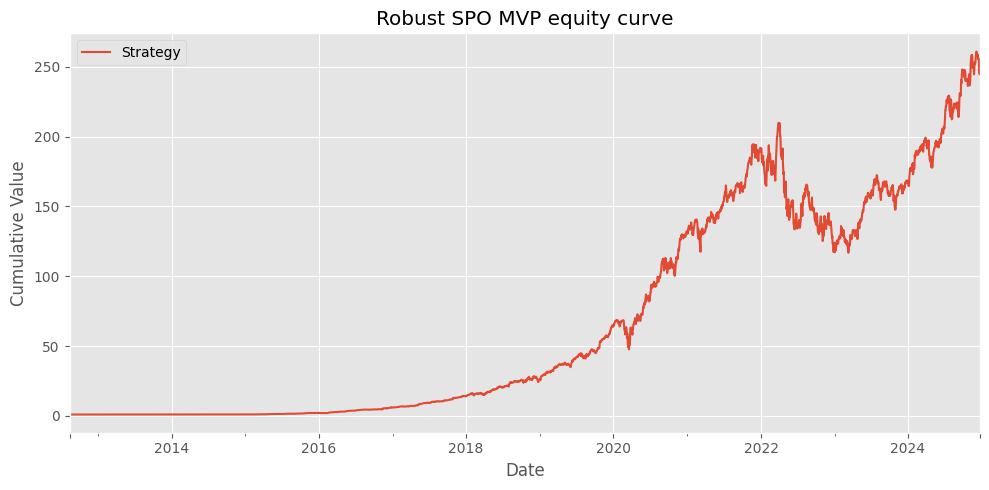


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.067
  Max drawdown:   -44.342%
  Avg turnover:   55.545%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 243.9588420220503, 'annualized_sharpe': 2.0670927255762095, 'max_drawdown': -0.443416520281538}
    fitness=1.3455, Sharpe=2.067, max_dd=-44.342%, avg_turn=55.545%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 115.03721381228591, 'annualized_sharpe': 1.6737819714702304, 'max_drawdown': -0.42004303678412813}


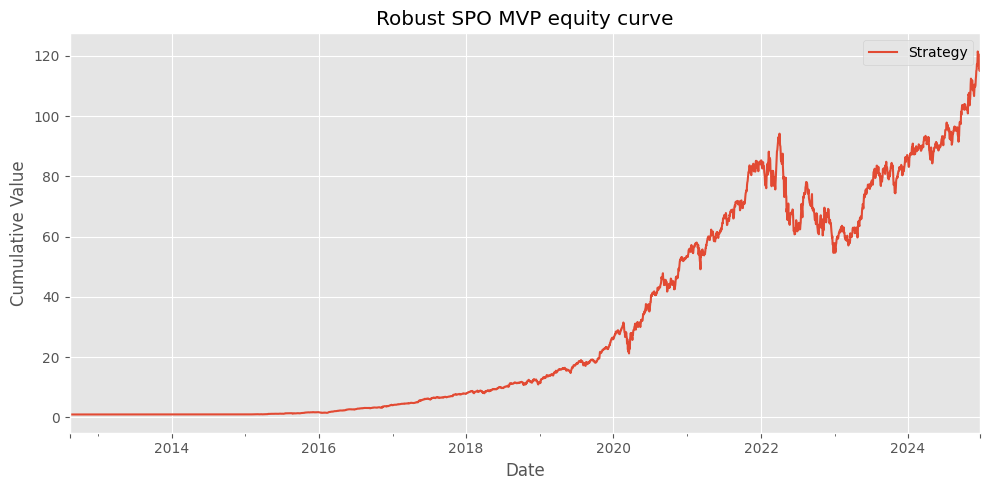


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.856
  Max drawdown:   -42.004%
  Avg turnover:   14.615%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 113.07597585558847, 'annualized_sharpe': 1.8560418146872764, 'max_drawdown': -0.420043036784128}
    fitness=1.3626, Sharpe=1.856, max_dd=-42.004%, avg_turn=14.615%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 213.75811986933414, 'annualized_sharpe': 1.8263337025237978, 'max_drawdown': -0.4587374867923205}


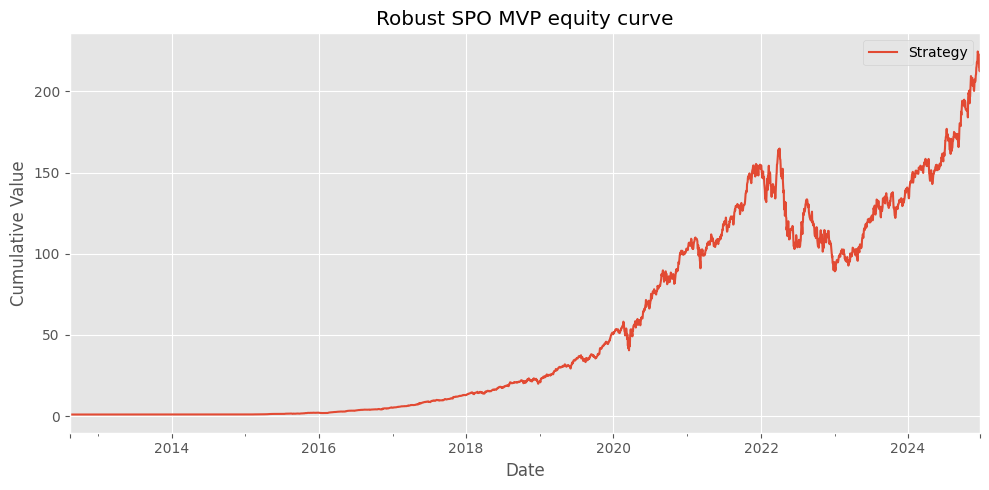


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.026
  Max drawdown:   -45.874%
  Avg turnover:   26.095%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 210.3875602498815, 'annualized_sharpe': 2.026572749147276, 'max_drawdown': -0.45873748679232074}
    fitness=1.4370, Sharpe=2.026, max_dd=-45.874%, avg_turn=26.095%

Generation 10 best: fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%

--- GA Generation 11/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdo

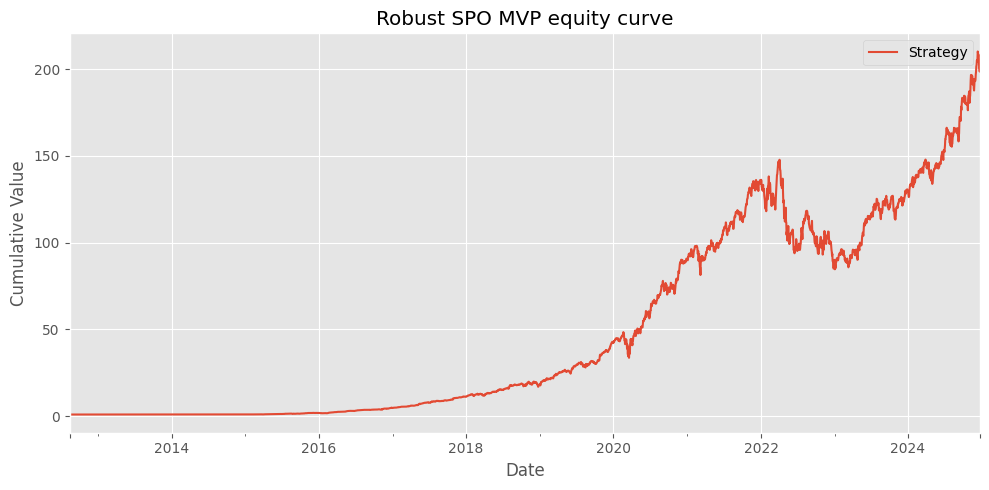


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


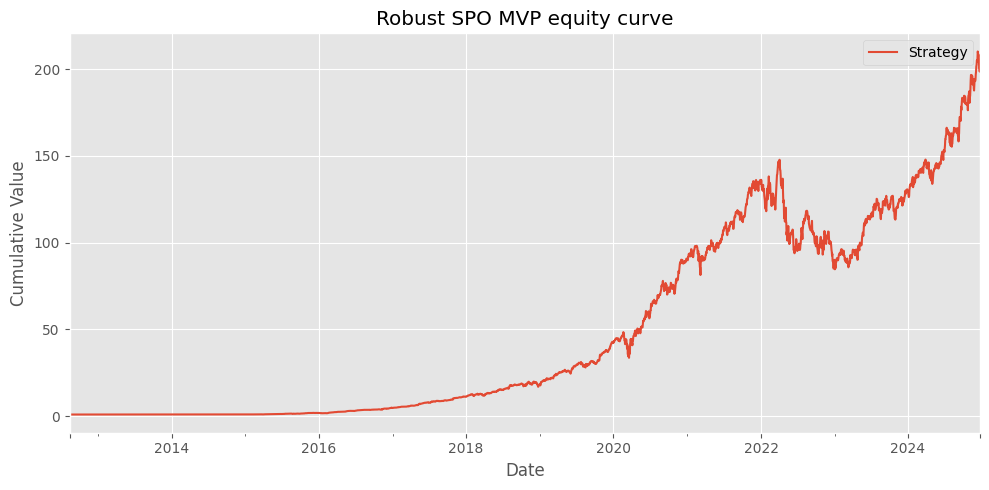


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


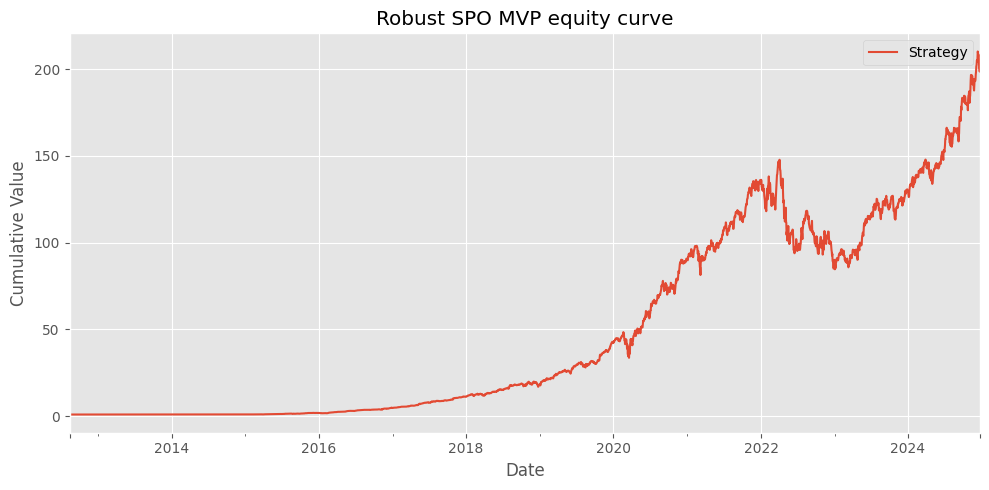


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 183.21535953459707, 'annualized_sharpe': 1.821508077255675, 'max_drawdown': -0.42305081561349156}


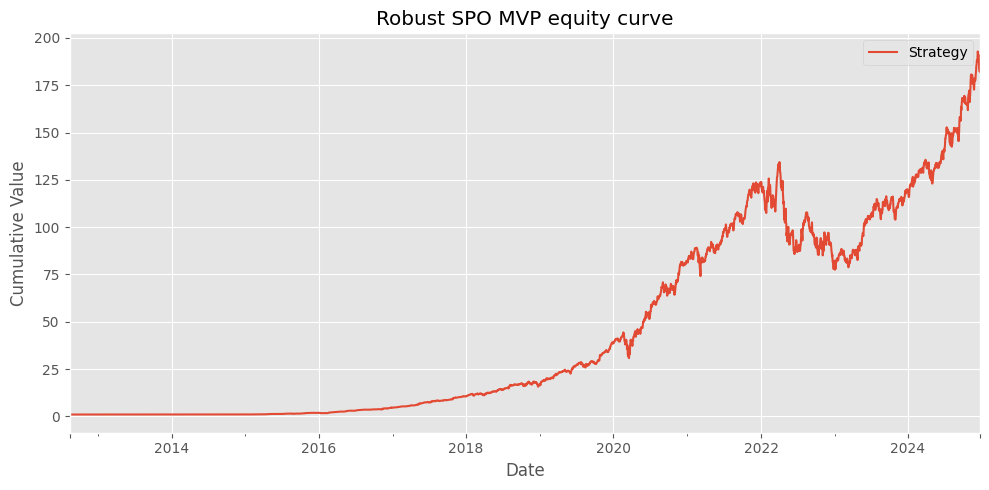


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.021
  Max drawdown:   -42.305%
  Avg turnover:   23.236%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 180.25041829122236, 'annualized_sharpe': 2.021128677741834, 'max_drawdown': -0.42305081561349156}
    fitness=1.4815, Sharpe=2.021, max_dd=-42.305%, avg_turn=23.236%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 190.35138486734, 'annualized_sharpe': 1.8290308339377437, 'max_drawdown': -0.4251049183538448}


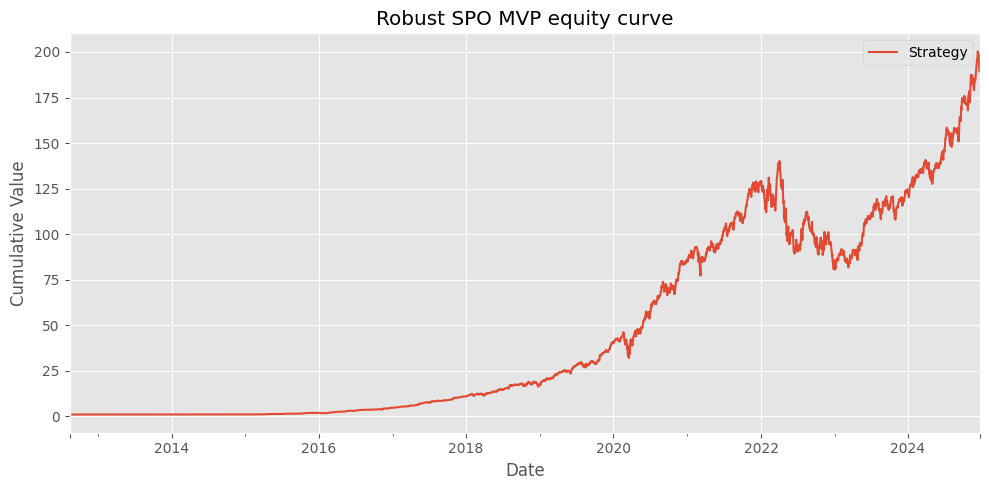


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.029
  Max drawdown:   -42.510%
  Avg turnover:   23.680%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 187.29203041835473, 'annualized_sharpe': 2.0296133544930046, 'max_drawdown': -0.4251049183538449}
    fitness=1.4857, Sharpe=2.029, max_dd=-42.510%, avg_turn=23.680%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 153.2080129324659, 'annualized_sharpe': 1.7859837168644894, 'max_drawdown': -0.40303495261280764}


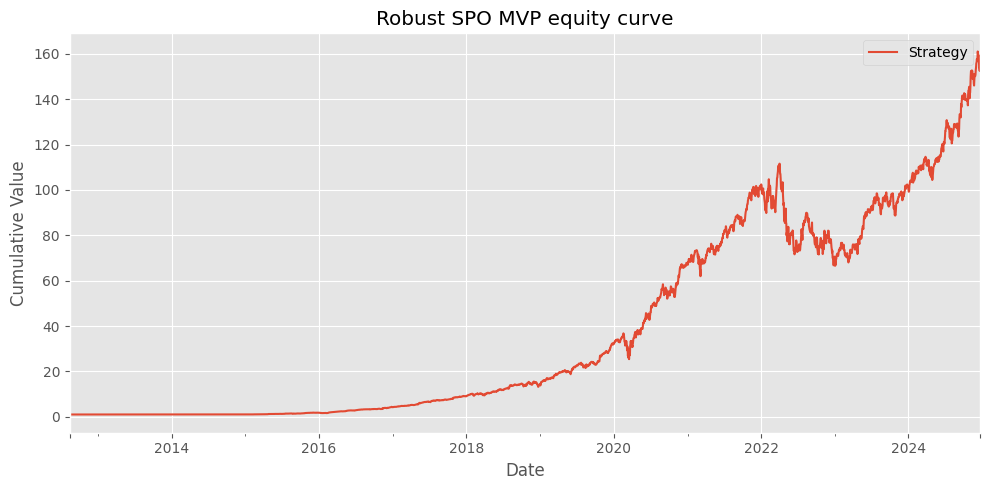


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.981
  Max drawdown:   -40.303%
  Avg turnover:   21.344%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 150.78488700065364, 'annualized_sharpe': 1.9817195255958386, 'max_drawdown': -0.4030349526128073}
    fitness=1.4716, Sharpe=1.981, max_dd=-40.303%, avg_turn=21.344%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 141.70977606462077, 'annualized_sharpe': 1.7804628402831617, 'max_drawdown': -0.41932560634129956}


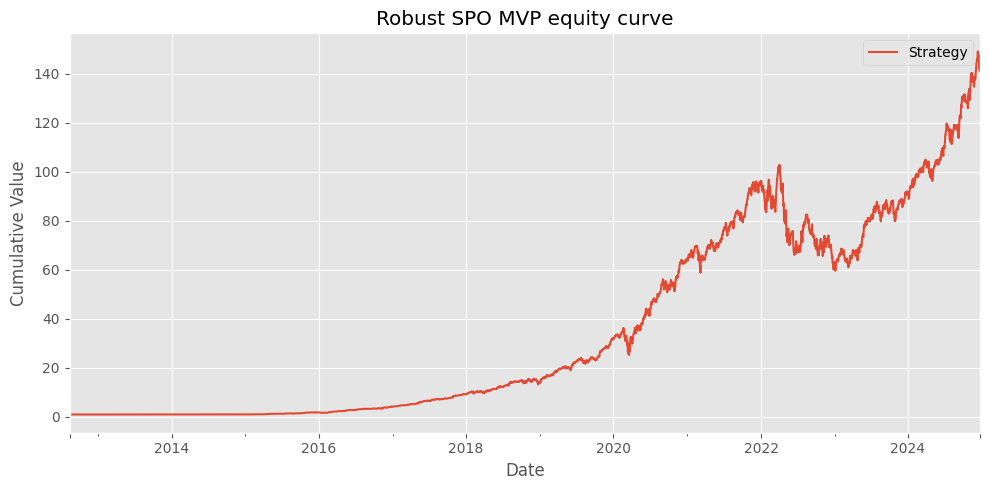


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.975
  Max drawdown:   -41.933%
  Avg turnover:   22.144%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 139.4275551640583, 'annualized_sharpe': 1.9751088731590185, 'max_drawdown': -0.41932560634129956}
    fitness=1.4447, Sharpe=1.975, max_dd=-41.933%, avg_turn=22.144%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.38139715537858, 'annualized_sharpe': 1.8392092536553775, 'max_drawdown': -0.4234892169397545}


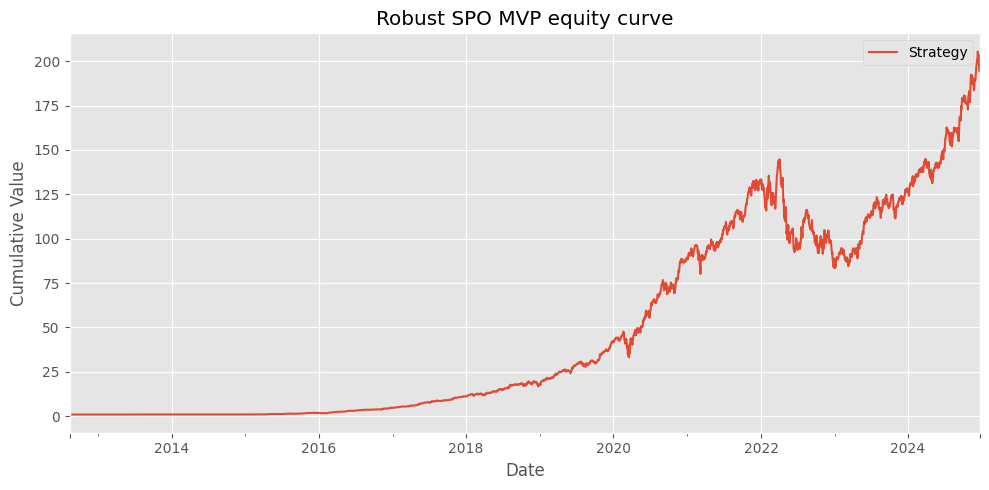


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.041
  Max drawdown:   -42.349%
  Avg turnover:   24.148%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.2901780674653, 'annualized_sharpe': 2.0411380399954613, 'max_drawdown': -0.4234892169397546}
    fitness=1.4965, Sharpe=2.041, max_dd=-42.349%, avg_turn=24.148%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 185.70455490483508, 'annualized_sharpe': 1.822459103626084, 'max_drawdown': -0.4250941810711534}


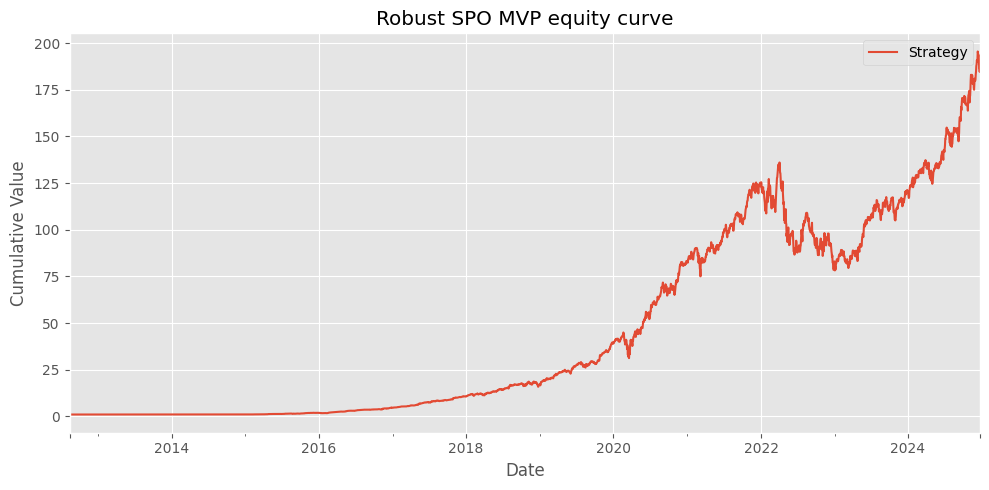


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.022
  Max drawdown:   -42.509%
  Avg turnover:   23.404%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 182.67990863770692, 'annualized_sharpe': 2.022117571039579, 'max_drawdown': -0.42509418107115216}
    fitness=1.4796, Sharpe=2.022, max_dd=-42.509%, avg_turn=23.404%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 186.98719909447627, 'annualized_sharpe': 1.8403658093981758, 'max_drawdown': -0.41455355930452076}


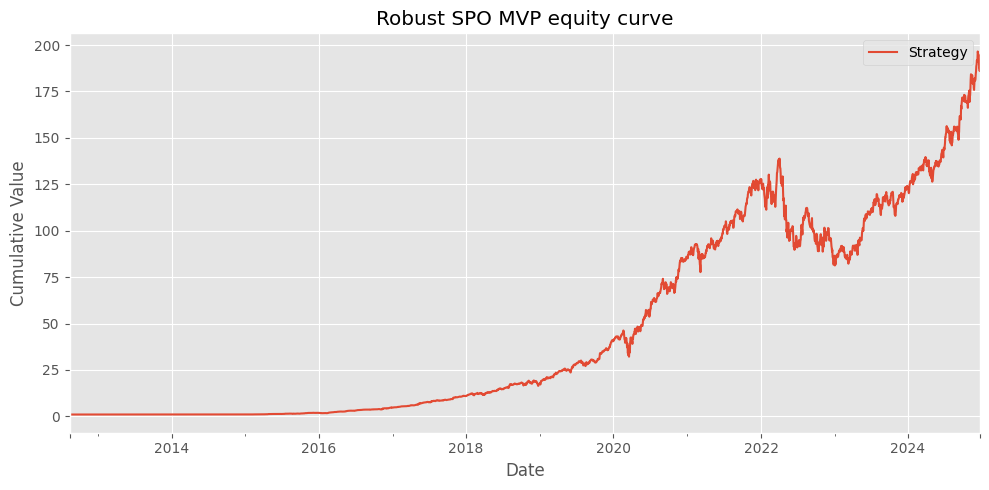


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.042
  Max drawdown:   -41.455%
  Avg turnover:   23.899%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 184.1111214792803, 'annualized_sharpe': 2.042691288100632, 'max_drawdown': -0.4145535593045214}
    fitness=1.5082, Sharpe=2.042, max_dd=-41.455%, avg_turn=23.899%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.52174175384397, 'annualized_sharpe': 1.8318508918514065, 'max_drawdown': -0.42567043222722367}


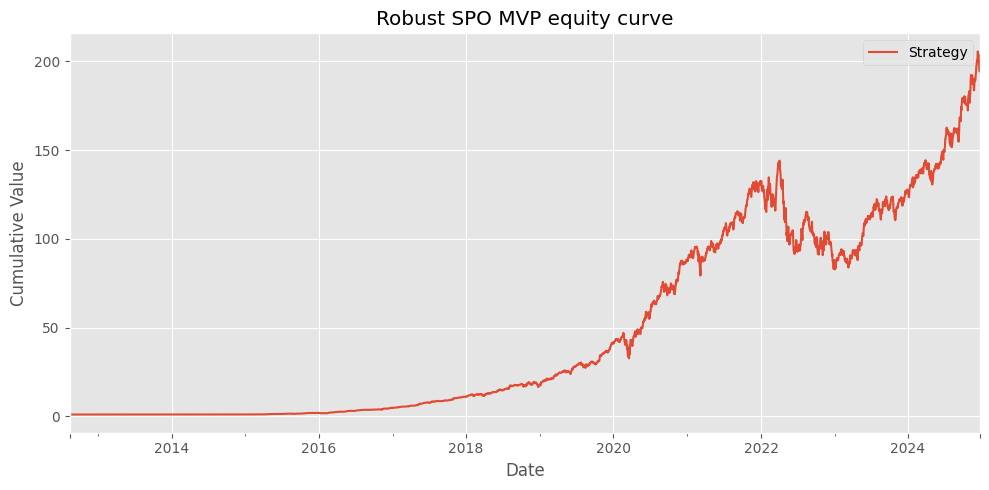


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.032
  Max drawdown:   -42.567%
  Avg turnover:   23.893%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.39107207349602, 'annualized_sharpe': 2.0328356908194576, 'max_drawdown': -0.42567043222722456}
    fitness=1.4873, Sharpe=2.032, max_dd=-42.567%, avg_turn=23.893%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 217.10099562504877, 'annualized_sharpe': 1.8507829771580409, 'max_drawdown': -0.43614019850147423}


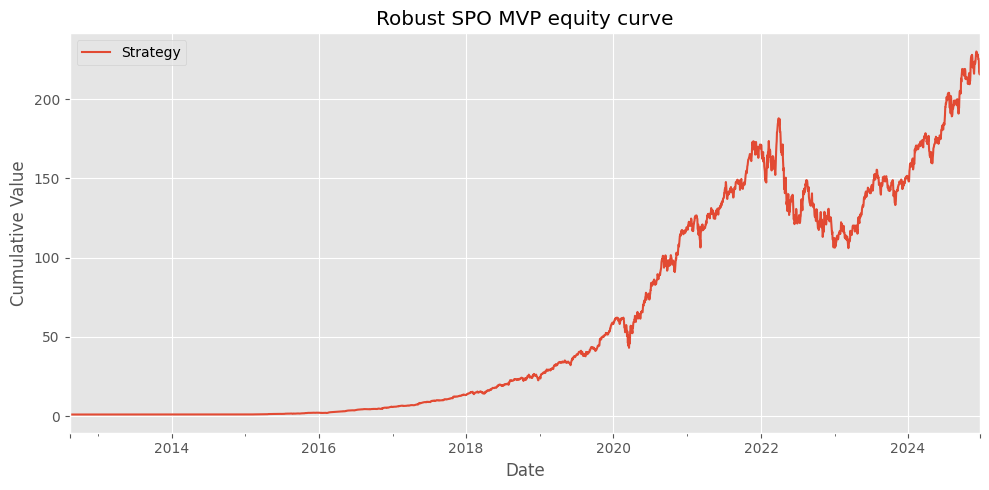


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.056
  Max drawdown:   -43.614%
  Avg turnover:   54.796%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 214.77753571996723, 'annualized_sharpe': 2.0565594210992493, 'max_drawdown': -0.4361401985014747}
    fitness=1.3460, Sharpe=2.056, max_dd=-43.614%, avg_turn=54.796%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 181.01657046264225, 'annualized_sharpe': 1.8186784541866918, 'max_drawdown': -0.4219805615977197}


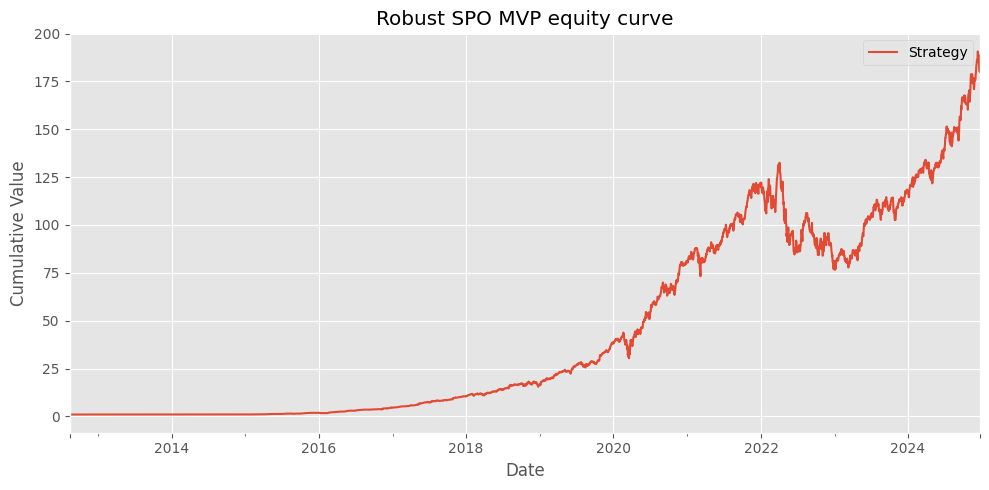


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.018
  Max drawdown:   -42.198%
  Avg turnover:   23.277%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 178.07603206051238, 'annualized_sharpe': 2.0179168977355935, 'max_drawdown': -0.4219805615977198}
    fitness=1.4792, Sharpe=2.018, max_dd=-42.198%, avg_turn=23.277%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 137.02367173866924, 'annualized_sharpe': 1.7644677378049516, 'max_drawdown': -0.3934629224208851}


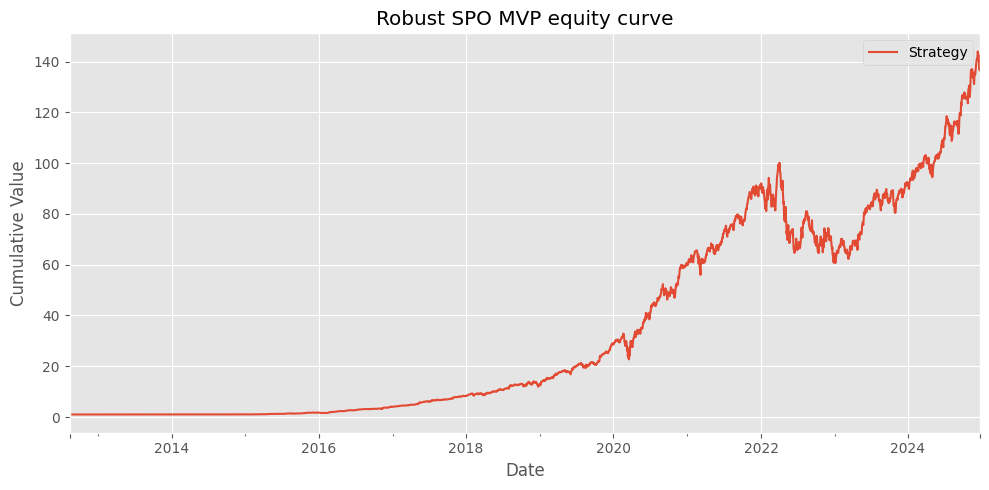


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.957
  Max drawdown:   -39.346%
  Avg turnover:   20.291%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 134.89874192488267, 'annualized_sharpe': 1.9578564597369292, 'max_drawdown': -0.39346292242088543}
    fitness=1.4626, Sharpe=1.957, max_dd=-39.346%, avg_turn=20.291%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.36695176928103, 'annualized_sharpe': 1.8345459536395567, 'max_drawdown': -0.4249110574943171}


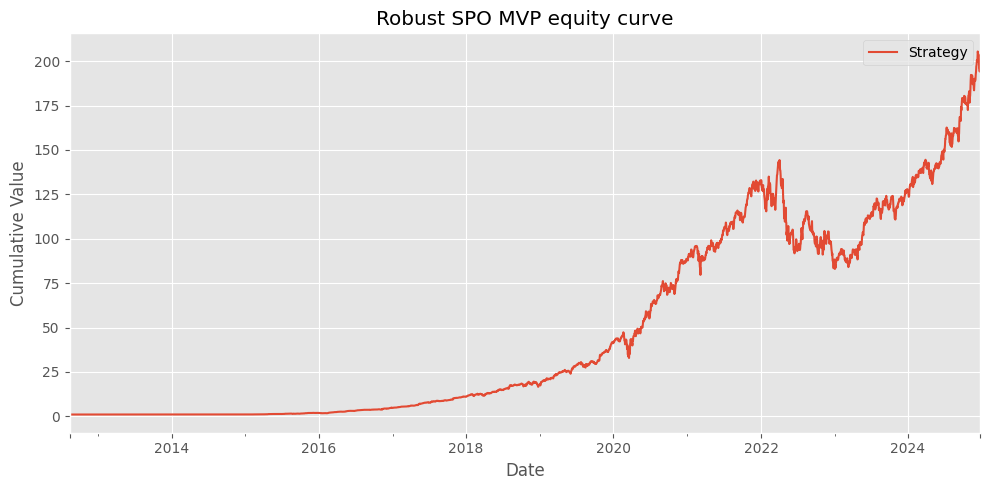


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.035
  Max drawdown:   -42.491%
  Avg turnover:   24.010%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.25160410699496, 'annualized_sharpe': 2.03587120633876, 'max_drawdown': -0.4249110574943171}
    fitness=1.4905, Sharpe=2.035, max_dd=-42.491%, avg_turn=24.010%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 209.01602441667487, 'annualized_sharpe': 1.7884105014326246, 'max_drawdown': -0.42288282582025705}


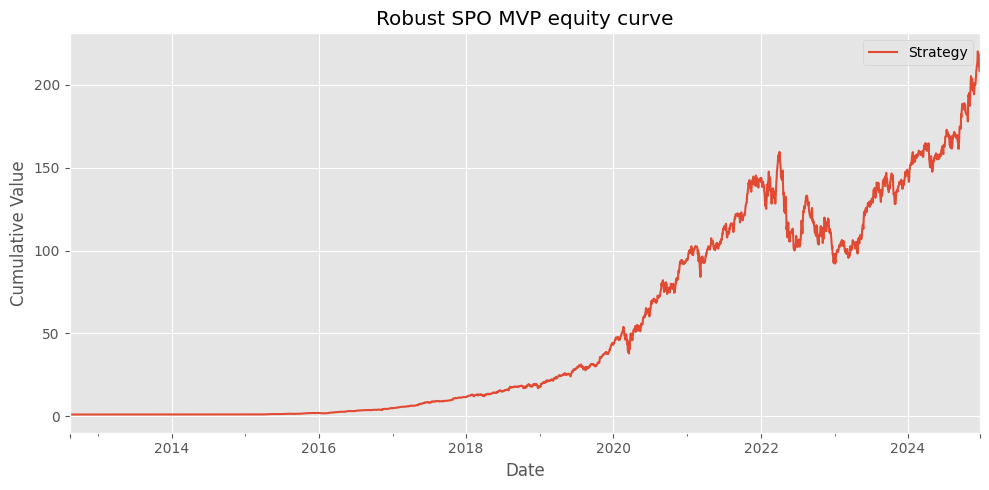


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.982
  Max drawdown:   -42.288%
  Avg turnover:   20.049%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 204.92643244289746, 'annualized_sharpe': 1.9827712489658817, 'max_drawdown': -0.4228828258202568}
    fitness=1.4593, Sharpe=1.982, max_dd=-42.288%, avg_turn=20.049%

Generation 11 best: fitness=1.5082, Sharpe=2.042, max_dd=-41.455%, avg_turn=23.899%

--- GA Generation 12/12 ---
  Evaluating chromosome 1/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 186.98719909447627, 'annualized_sharpe': 1.8403658093981758, 'max_drawd

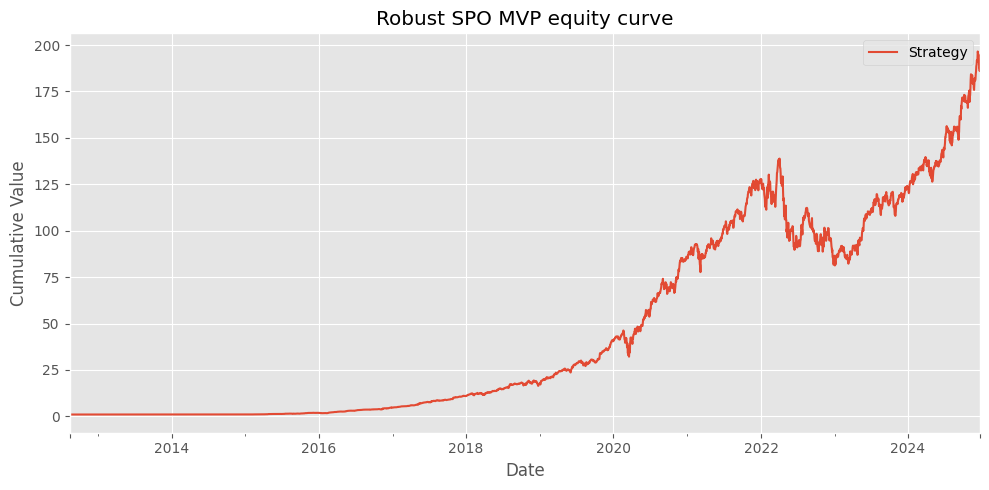


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.042
  Max drawdown:   -41.455%
  Avg turnover:   23.899%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 184.1111214792803, 'annualized_sharpe': 2.042691288100632, 'max_drawdown': -0.4145535593045214}
    fitness=1.5082, Sharpe=2.042, max_dd=-41.455%, avg_turn=23.899%
  Evaluating chromosome 2/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.38139715537858, 'annualized_sharpe': 1.8392092536553775, 'max_drawdown': -0.4234892169397545}


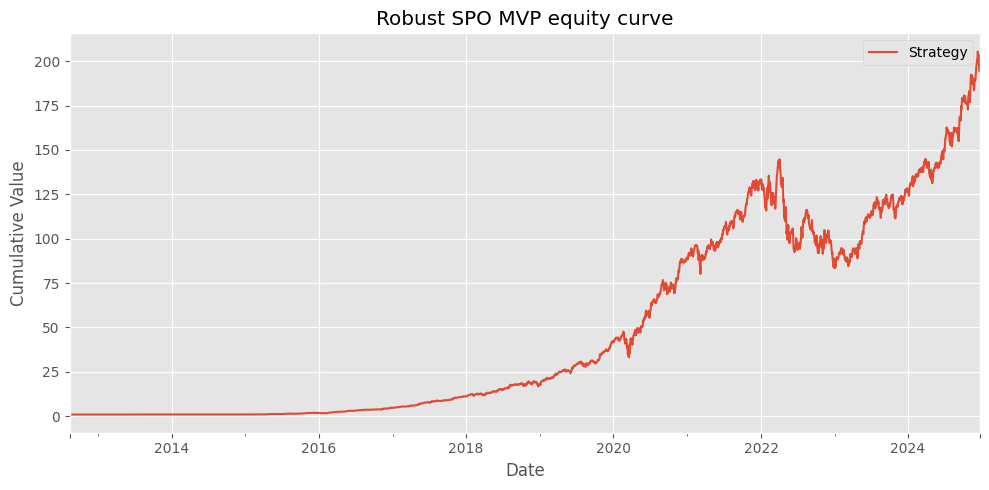


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.041
  Max drawdown:   -42.349%
  Avg turnover:   24.148%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.2901780674653, 'annualized_sharpe': 2.0411380399954613, 'max_drawdown': -0.4234892169397546}
    fitness=1.4965, Sharpe=2.041, max_dd=-42.349%, avg_turn=24.148%
  Evaluating chromosome 3/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


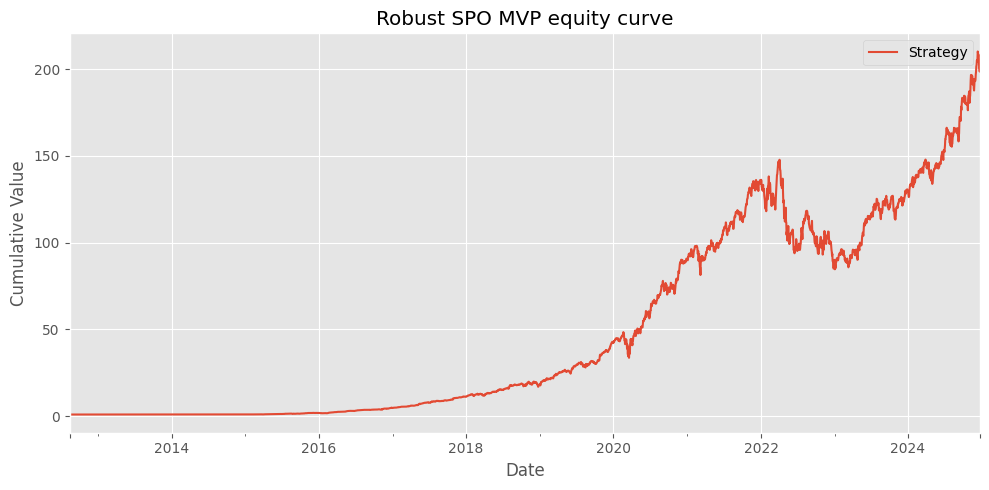


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 4/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


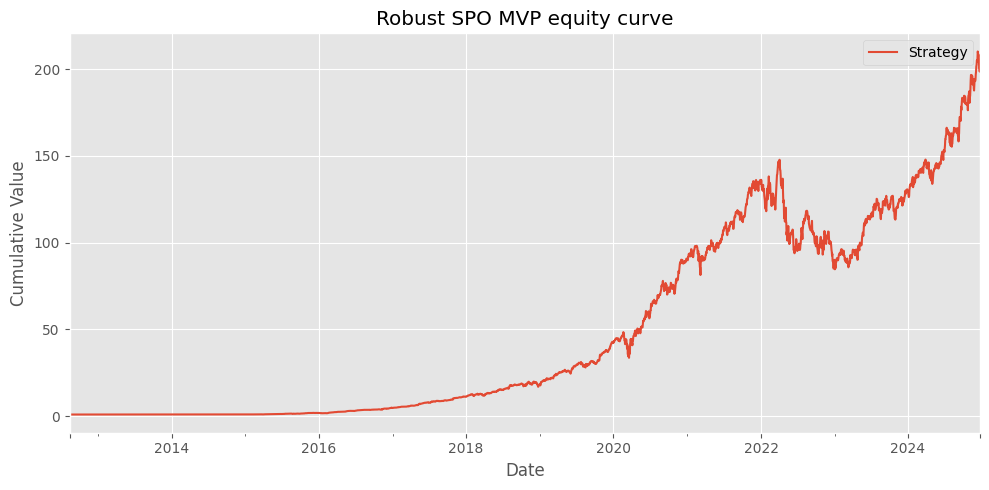


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%
  Evaluating chromosome 5/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 111.26829516246939, 'annualized_sharpe': 1.679943566335861, 'max_drawdown': -0.4044381758358233}


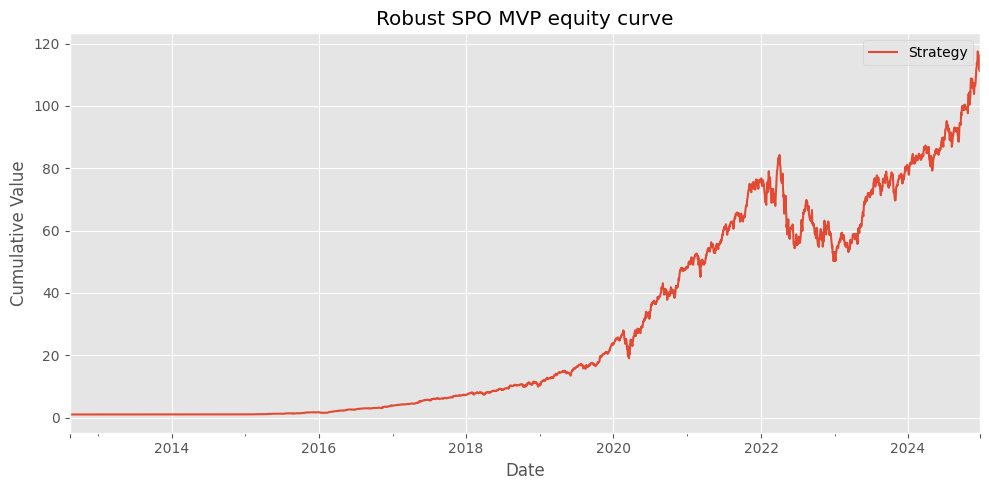


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.863
  Max drawdown:   -40.444%
  Avg turnover:   14.371%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 109.48032863985307, 'annualized_sharpe': 1.8633606574472346, 'max_drawdown': -0.4044381758358234}
    fitness=1.3867, Sharpe=1.863, max_dd=-40.444%, avg_turn=14.371%
  Evaluating chromosome 6/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 198.01446536375676, 'annualized_sharpe': 1.8386688539111993, 'max_drawdown': -0.4260056836378877}


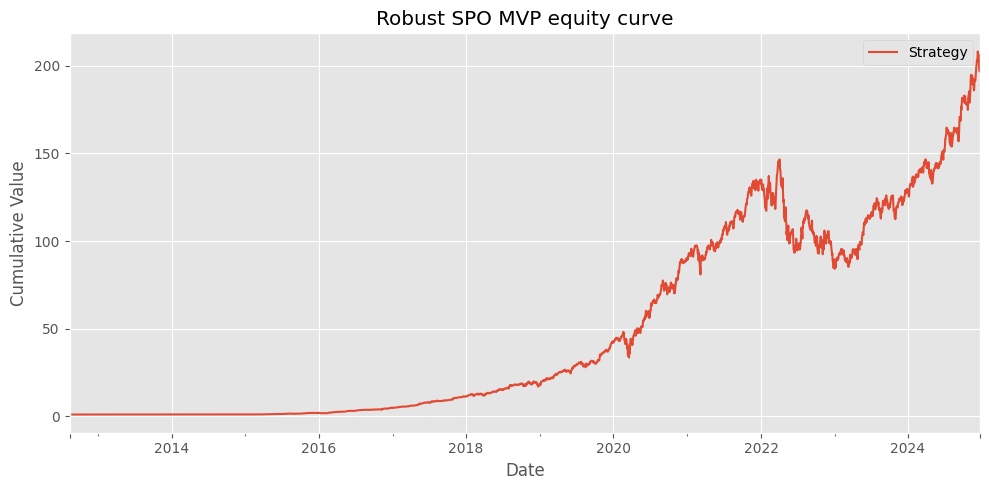


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.601%
  Avg turnover:   24.221%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 194.85588524724022, 'annualized_sharpe': 2.0404591968245813, 'max_drawdown': -0.4260056836378875}
    fitness=1.4929, Sharpe=2.040, max_dd=-42.601%, avg_turn=24.221%
  Evaluating chromosome 7/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 203.3463038904568, 'annualized_sharpe': 1.8416091183153573, 'max_drawdown': -0.4285140930167479}


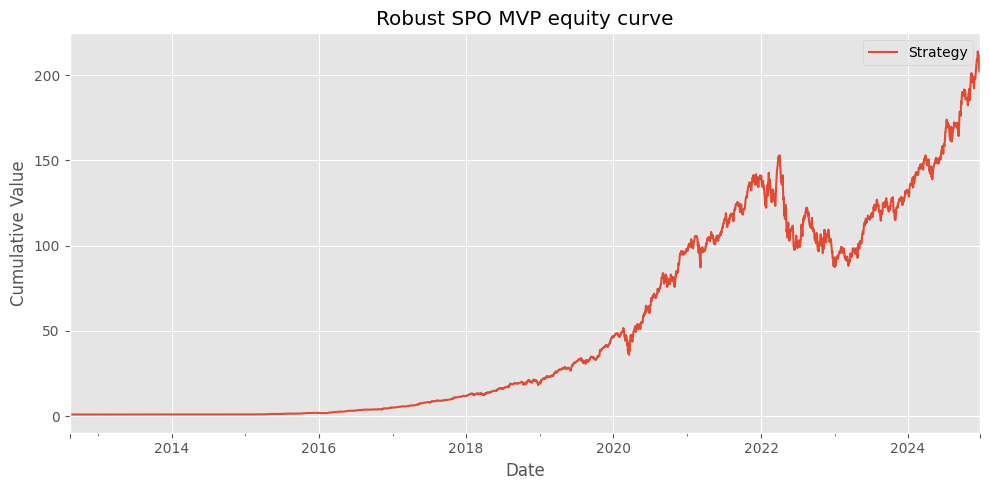


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.044
  Max drawdown:   -42.851%
  Avg turnover:   28.054%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 200.22091357651811, 'annualized_sharpe': 2.0440507862516424, 'max_drawdown': -0.4285140930167479}
    fitness=1.4749, Sharpe=2.044, max_dd=-42.851%, avg_turn=28.054%
  Evaluating chromosome 8/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 197.7486886809288, 'annualized_sharpe': 1.8366114429289564, 'max_drawdown': -0.4261347886161686}


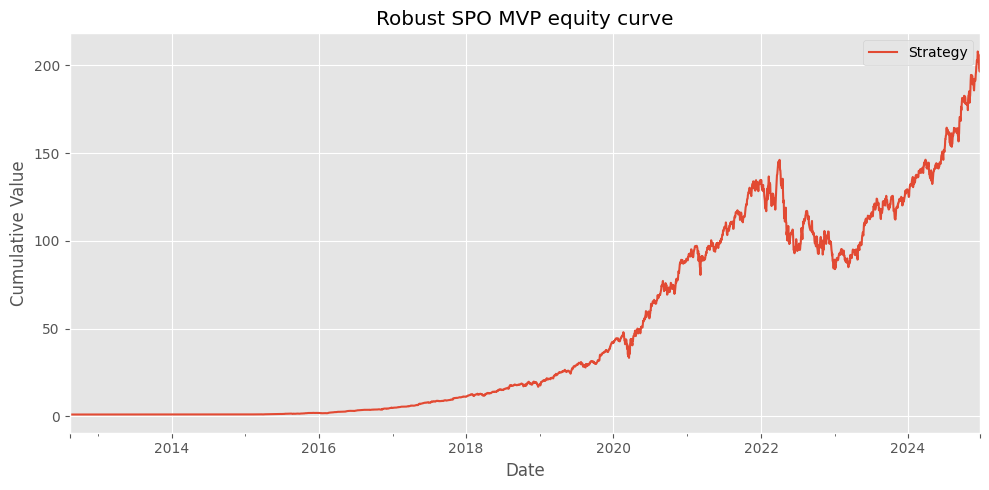


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.038
  Max drawdown:   -42.613%
  Avg turnover:   24.147%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 194.58792573218378, 'annualized_sharpe': 2.0381511207114773, 'max_drawdown': -0.4261347886161677}
    fitness=1.4909, Sharpe=2.038, max_dd=-42.613%, avg_turn=24.147%
  Evaluating chromosome 9/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.30105220776838, 'annualized_sharpe': 1.8367403845896726, 'max_drawdown': -0.4245467999223126}


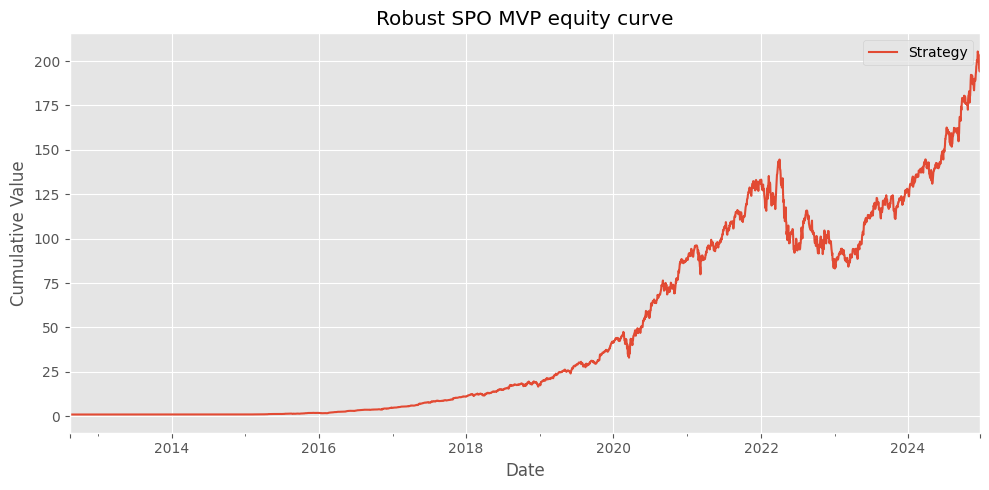


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.038
  Max drawdown:   -42.455%
  Avg turnover:   24.076%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.19579973305449, 'annualized_sharpe': 2.038339282829589, 'max_drawdown': -0.42454679992231237}
    fitness=1.4930, Sharpe=2.038, max_dd=-42.455%, avg_turn=24.076%
  Evaluating chromosome 10/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 198.34894034517058, 'annualized_sharpe': 1.8386160278757966, 'max_drawdown': -0.4262284737911646}


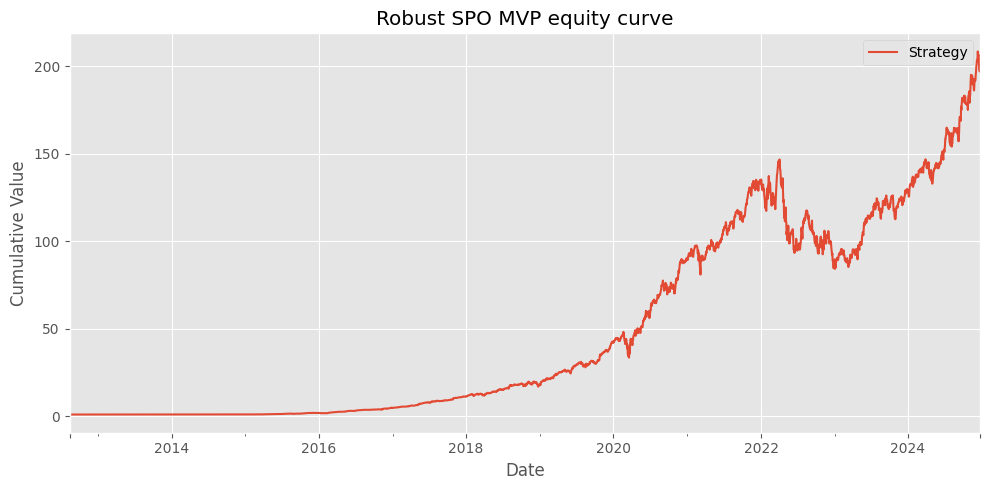


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.623%
  Avg turnover:   24.230%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 195.18260868588018, 'annualized_sharpe': 2.040393837929281, 'max_drawdown': -0.4262284737911647}
    fitness=1.4926, Sharpe=2.040, max_dd=-42.623%, avg_turn=24.230%
  Evaluating chromosome 11/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 206.89537891427338, 'annualized_sharpe': 1.8429930258078346, 'max_drawdown': -0.43281446552475034}


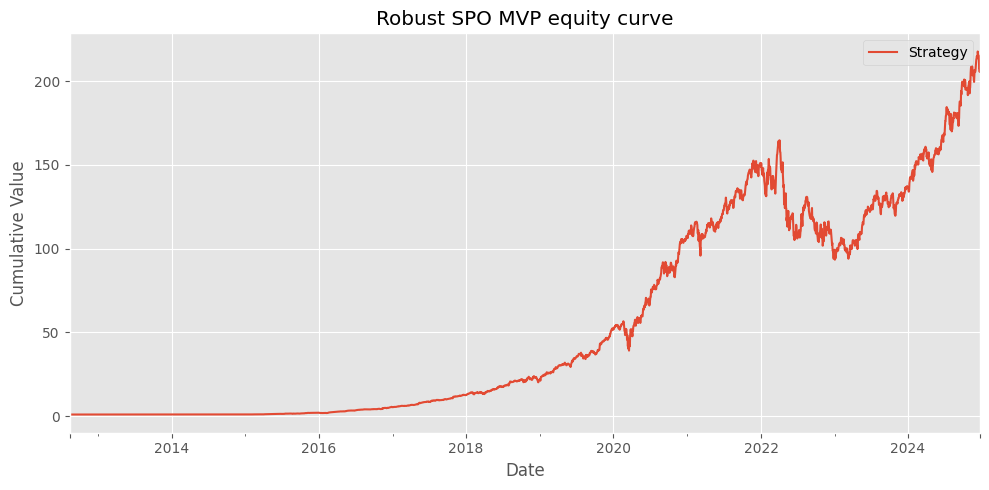


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.046
  Max drawdown:   -43.281%
  Avg turnover:   34.418%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 203.89268264595734, 'annualized_sharpe': 2.046091562557242, 'max_drawdown': -0.43281446552475}
    fitness=1.4408, Sharpe=2.046, max_dd=-43.281%, avg_turn=34.418%
  Evaluating chromosome 12/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.39844303991921, 'annualized_sharpe': 1.8339427639588588, 'max_drawdown': -0.4250907265379621}


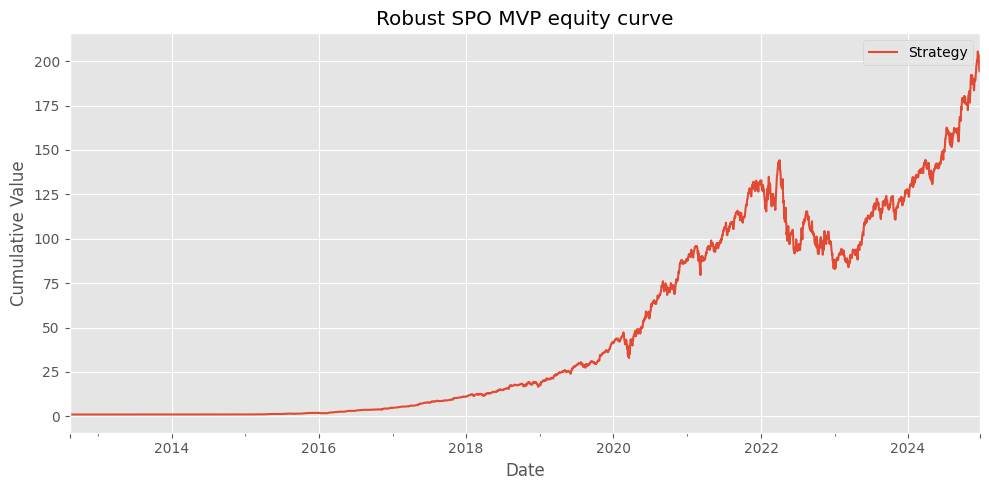


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.035
  Max drawdown:   -42.509%
  Avg turnover:   23.972%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.27932820653214, 'annualized_sharpe': 2.0351908433695742, 'max_drawdown': -0.42509072653796265}
    fitness=1.4898, Sharpe=2.035, max_dd=-42.509%, avg_turn=23.972%
  Evaluating chromosome 13/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 206.36639092624876, 'annualized_sharpe': 1.8454432850301665, 'max_drawdown': -0.4291565160509312}


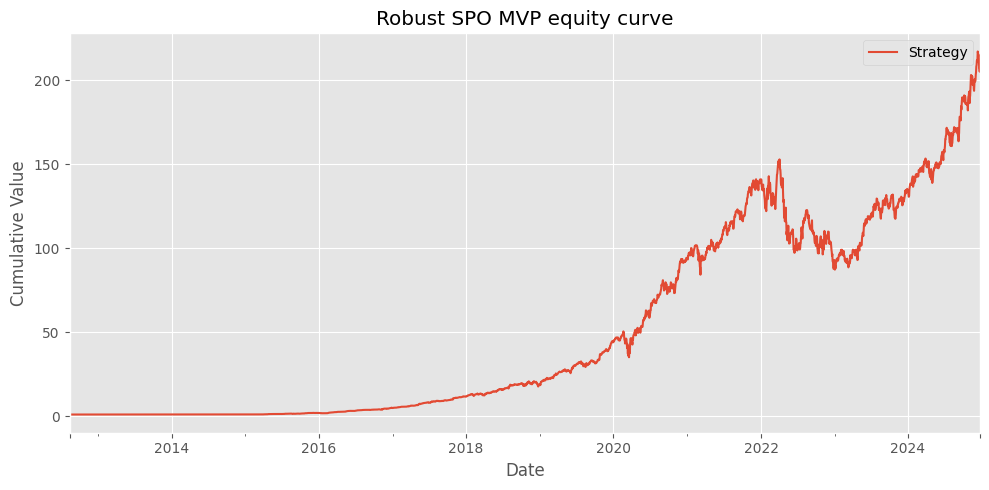


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.048
  Max drawdown:   -42.916%
  Avg turnover:   24.777%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 203.06037992037432, 'annualized_sharpe': 2.0479722874159547, 'max_drawdown': -0.4291565160509304}
    fitness=1.4945, Sharpe=2.048, max_dd=-42.916%, avg_turn=24.777%
  Evaluating chromosome 14/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 196.19173915838104, 'annualized_sharpe': 1.8228633519266724, 'max_drawdown': -0.4312078585172575}


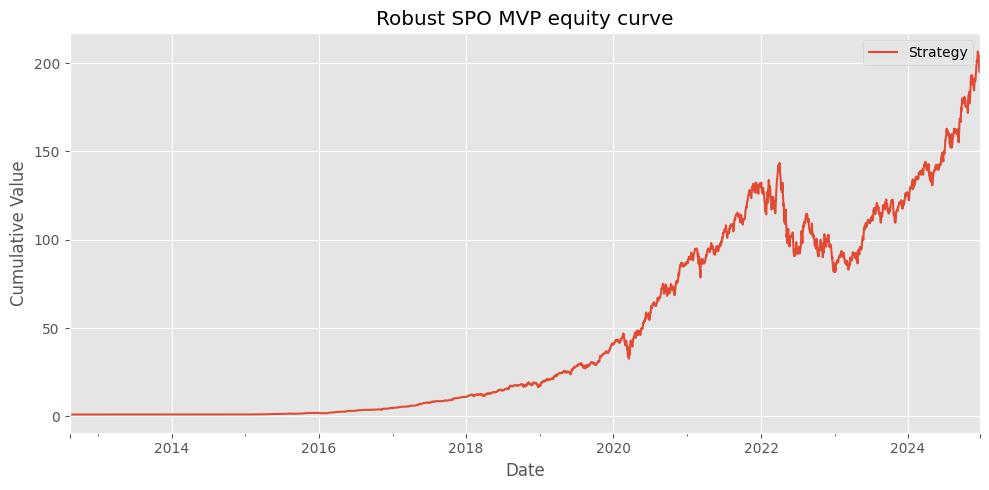


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.022
  Max drawdown:   -43.121%
  Avg turnover:   23.708%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.92784259234452, 'annualized_sharpe': 2.0223895822518516, 'max_drawdown': -0.43120785851725774}
    fitness=1.4722, Sharpe=2.022, max_dd=-43.121%, avg_turn=23.708%
  Evaluating chromosome 15/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 189.169294469909, 'annualized_sharpe': 1.8296729294545435, 'max_drawdown': -0.42394898643436274}


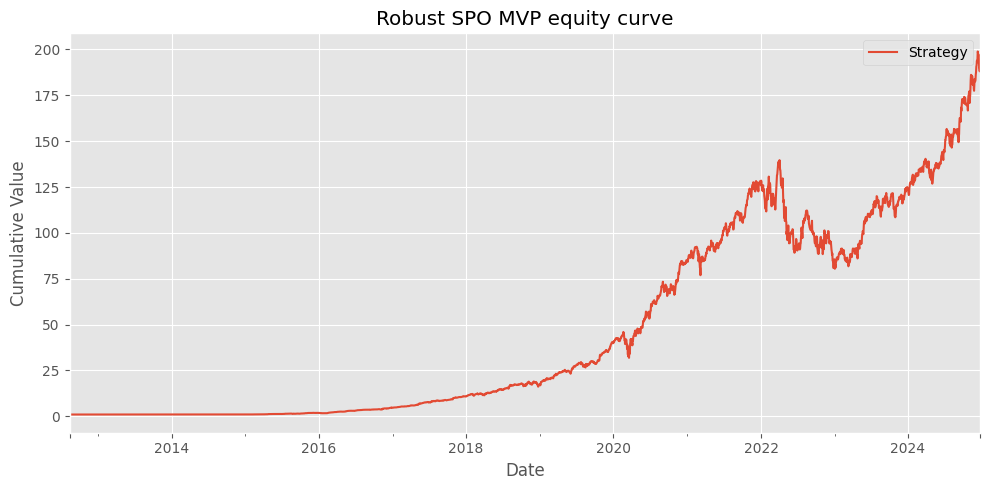


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.030
  Max drawdown:   -42.395%
  Avg turnover:   22.904%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 186.14149153222857, 'annualized_sharpe': 2.030415416006331, 'max_drawdown': -0.42394898643436274}
    fitness=1.4916, Sharpe=2.030, max_dd=-42.395%, avg_turn=22.904%
  Evaluating chromosome 16/16 ...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 199.83223185728468, 'annualized_sharpe': 1.8383867283534634, 'max_drawdown': -0.42700617762313653}


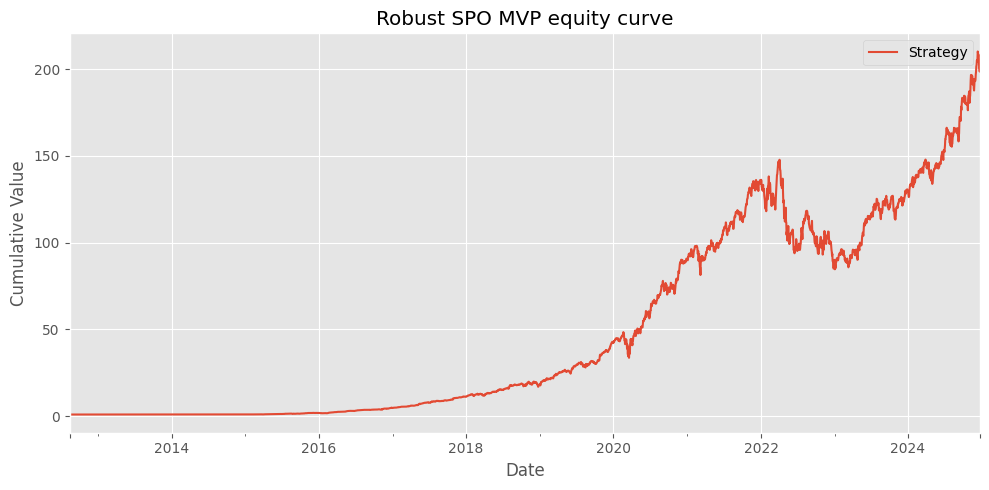


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.040
  Max drawdown:   -42.701%
  Avg turnover:   24.269%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 196.63148366558448, 'annualized_sharpe': 2.0401097271921613, 'max_drawdown': -0.42700617762313664}
    fitness=1.4914, Sharpe=2.040, max_dd=-42.701%, avg_turn=24.269%

Generation 12 best: fitness=1.5082, Sharpe=2.042, max_dd=-41.455%, avg_turn=23.899%

=== Final GA evaluation on last population ===
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 186.98719909447627, 'annualized_sharpe': 1.8403658093981758, 'max_drawdown': -0.4145

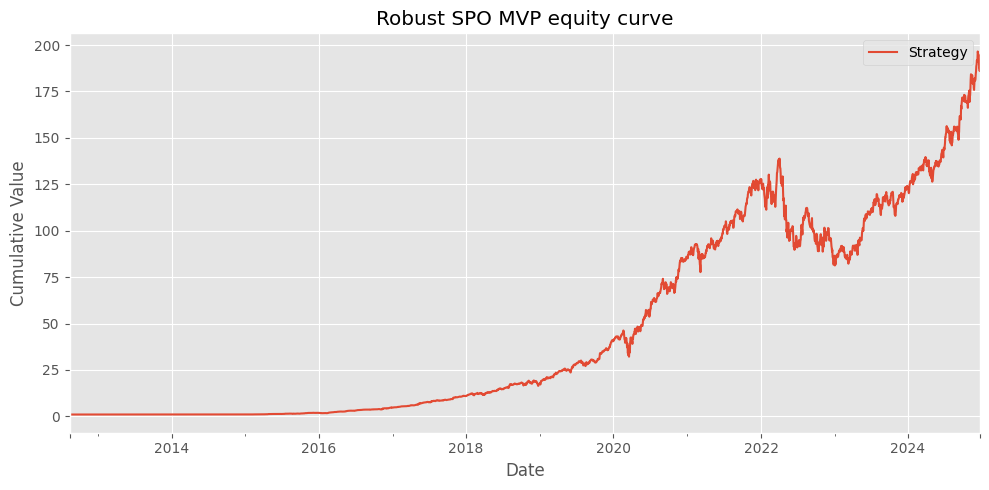


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.042
  Max drawdown:   -41.455%
  Avg turnover:   23.899%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 184.1111214792803, 'annualized_sharpe': 2.042691288100632, 'max_drawdown': -0.4145535593045214}
  [Final] chrom 1/16: fitness=1.5082, Sharpe=2.042, max_dd=-41.455%, avg_turn=23.899%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.38139715537858, 'annualized_sharpe': 1.8392092536553775, 'max_drawdown': -0.4234892169397545}


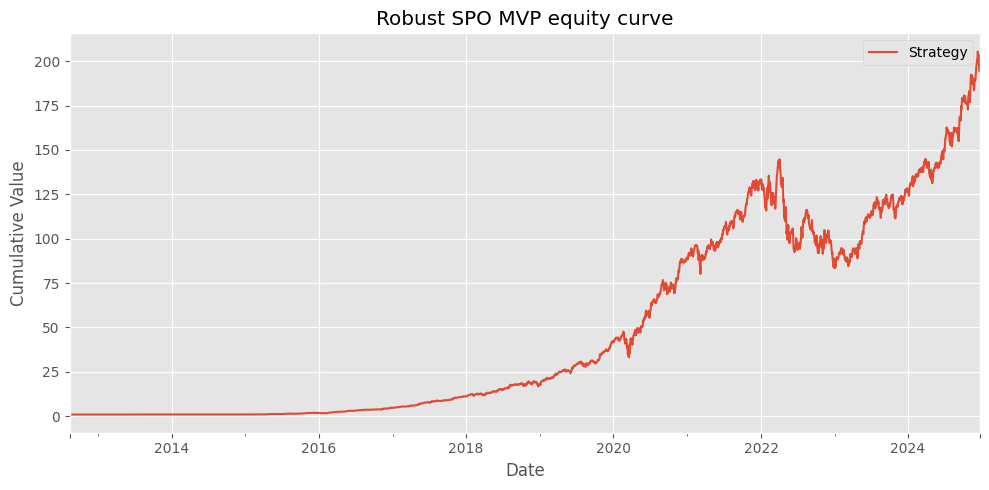


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.041
  Max drawdown:   -42.349%
  Avg turnover:   24.148%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.2901780674653, 'annualized_sharpe': 2.0411380399954613, 'max_drawdown': -0.4234892169397546}
  [Final] chrom 2/16: fitness=1.4965, Sharpe=2.041, max_dd=-42.349%, avg_turn=24.148%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 206.36639092624876, 'annualized_sharpe': 1.8454432850301665, 'max_drawdown': -0.4291565160509312}


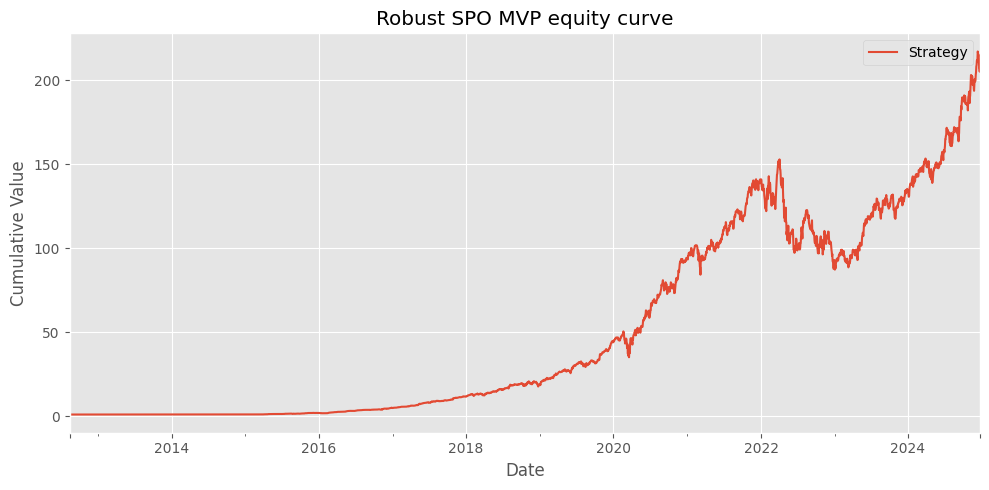


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.048
  Max drawdown:   -42.916%
  Avg turnover:   24.777%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 203.06037992037432, 'annualized_sharpe': 2.0479722874159547, 'max_drawdown': -0.4291565160509304}
  [Final] chrom 3/16: fitness=1.4945, Sharpe=2.048, max_dd=-42.916%, avg_turn=24.777%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.30105220776838, 'annualized_sharpe': 1.8367403845896726, 'max_drawdown': -0.4245467999223126}


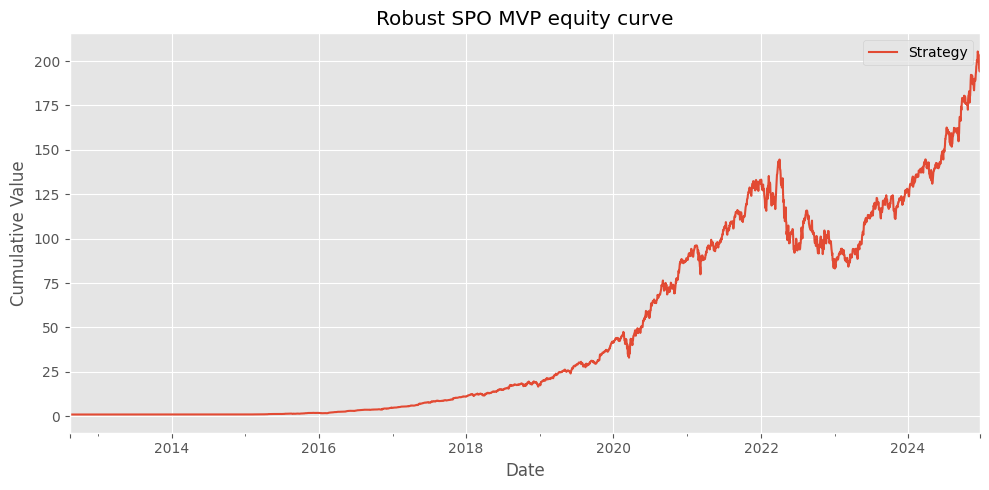


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.038
  Max drawdown:   -42.455%
  Avg turnover:   24.076%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 192.19579973305449, 'annualized_sharpe': 2.038339282829589, 'max_drawdown': -0.42454679992231237}
  [Final] chrom 4/16: fitness=1.4930, Sharpe=2.038, max_dd=-42.455%, avg_turn=24.076%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 202.08394015313664, 'annualized_sharpe': 1.8419096074514072, 'max_drawdown': -0.4275402250719931}


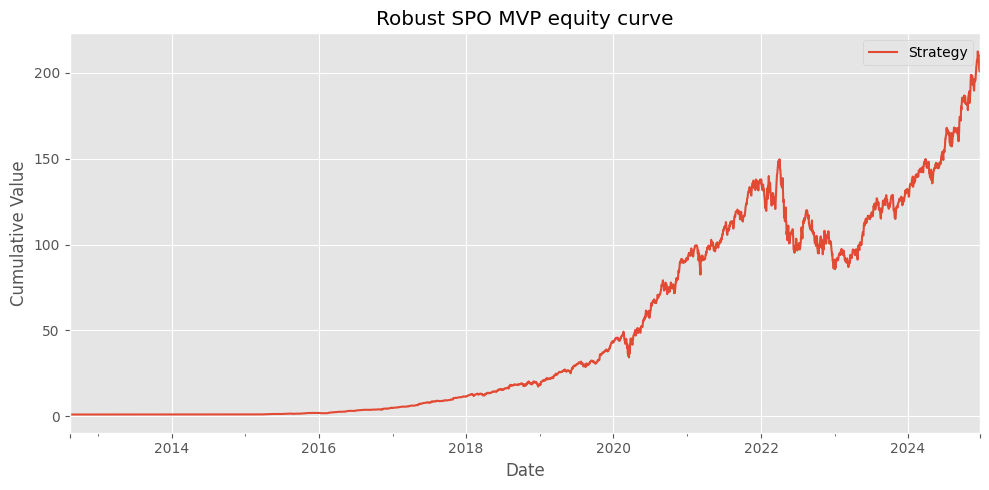


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.044
  Max drawdown:   -42.754%
  Avg turnover:   24.494%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 198.85165002504945, 'annualized_sharpe': 2.0440455527352146, 'max_drawdown': -0.4275402250719933}
  [Final] chrom 5/16: fitness=1.4936, Sharpe=2.044, max_dd=-42.754%, avg_turn=24.494%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 204.44025114523993, 'annualized_sharpe': 1.845364699229061, 'max_drawdown': -0.4278263499948113}


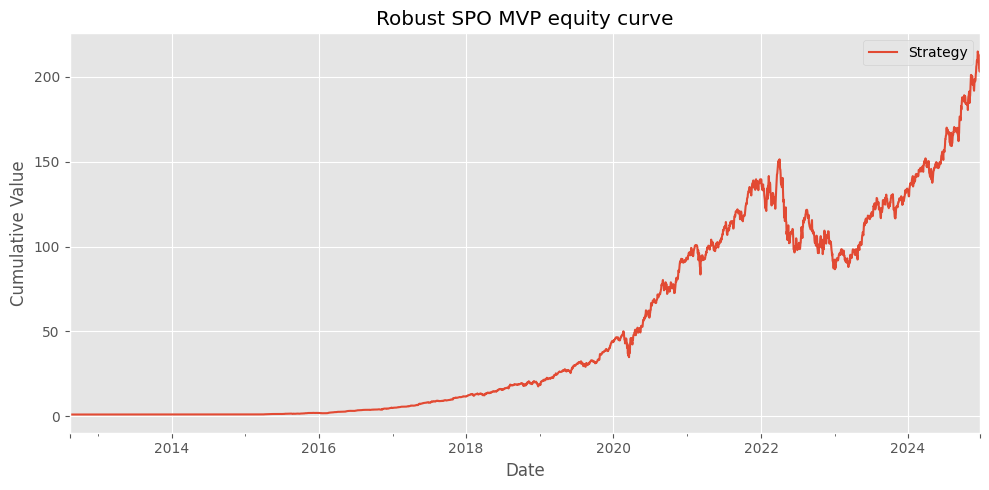


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.048
  Max drawdown:   -42.783%
  Avg turnover:   24.702%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 201.1842229387062, 'annualized_sharpe': 2.0479445520130346, 'max_drawdown': -0.4278263499948113}
  [Final] chrom 6/16: fitness=1.4962, Sharpe=2.048, max_dd=-42.783%, avg_turn=24.702%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 184.77021774148017, 'annualized_sharpe': 1.82469270047829, 'max_drawdown': -0.42000721607055025}


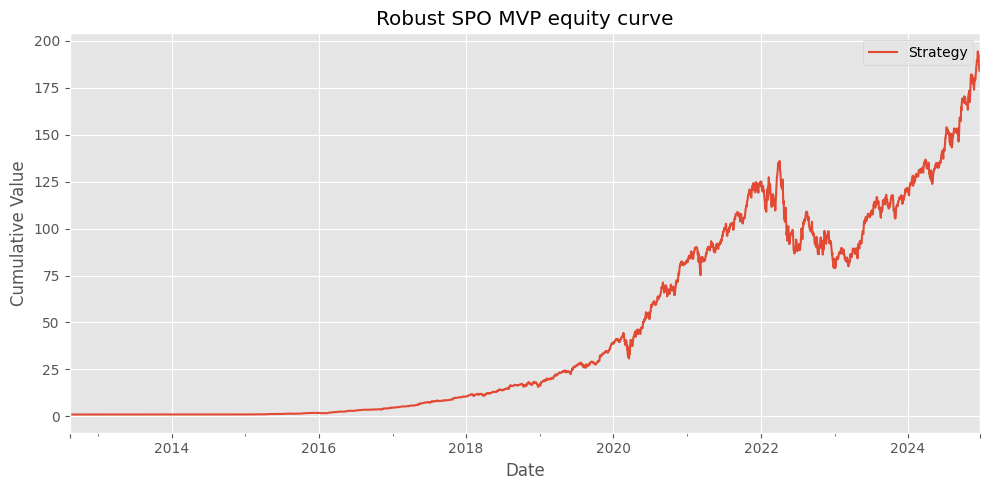


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.025
  Max drawdown:   -42.001%
  Avg turnover:   23.027%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 181.84903527327086, 'annualized_sharpe': 2.024973806032458, 'max_drawdown': -0.4200072160705496}
  [Final] chrom 7/16: fitness=1.4894, Sharpe=2.025, max_dd=-42.001%, avg_turn=23.027%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 195.0907439566491, 'annualized_sharpe': 1.8375394030059042, 'max_drawdown': -0.42400394043658074}


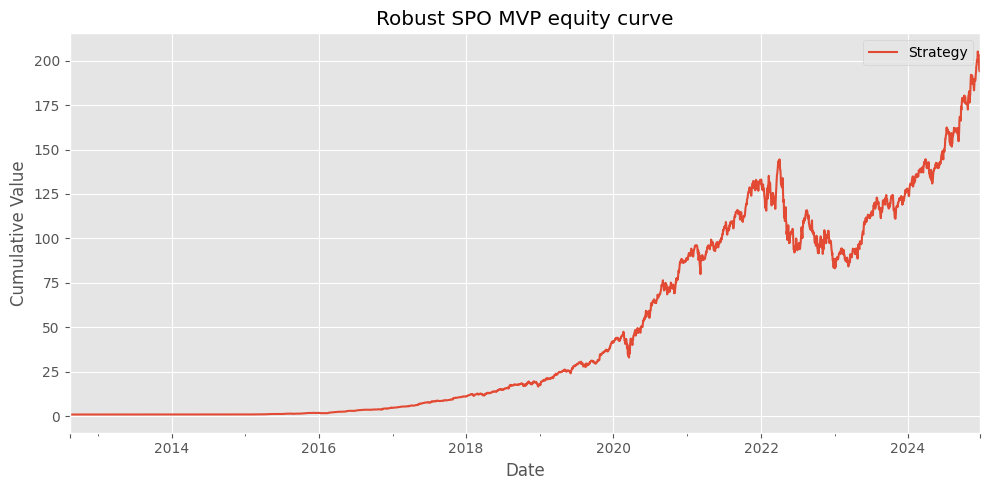


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.039
  Max drawdown:   -42.400%
  Avg turnover:   24.093%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 191.99344326844803, 'annualized_sharpe': 2.039241785155763, 'max_drawdown': -0.4240039404365805}
  [Final] chrom 8/16: fitness=1.4944, Sharpe=2.039, max_dd=-42.400%, avg_turn=24.093%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 188.55599979546434, 'annualized_sharpe': 1.8297827662649464, 'max_drawdown': -0.4234460206441789}


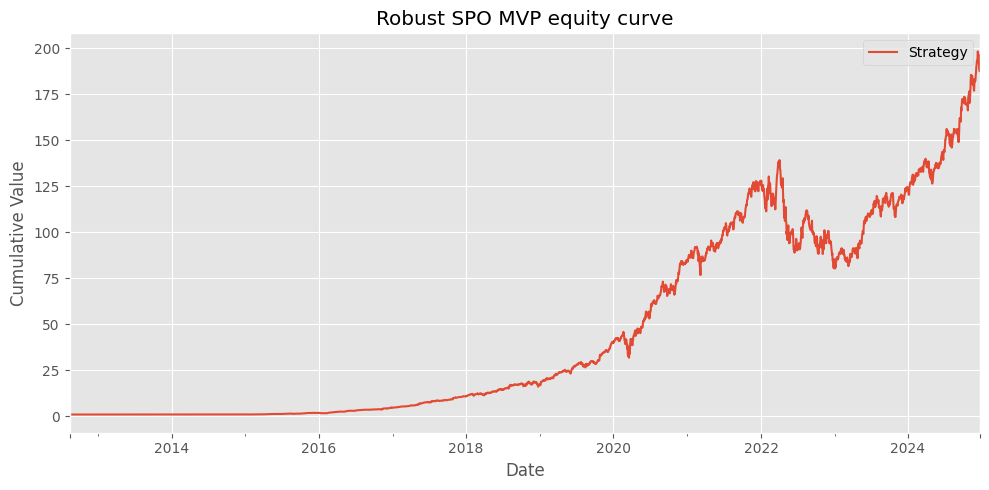


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.030
  Max drawdown:   -42.345%
  Avg turnover:   22.887%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 185.5424123310239, 'annualized_sharpe': 2.0305499163258793, 'max_drawdown': -0.42344602064417847}
  [Final] chrom 9/16: fitness=1.4923, Sharpe=2.030, max_dd=-42.345%, avg_turn=22.887%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 236.25087840356142, 'annualized_sharpe': 1.8668322520206222, 'max_drawdown': -0.438401471856261}


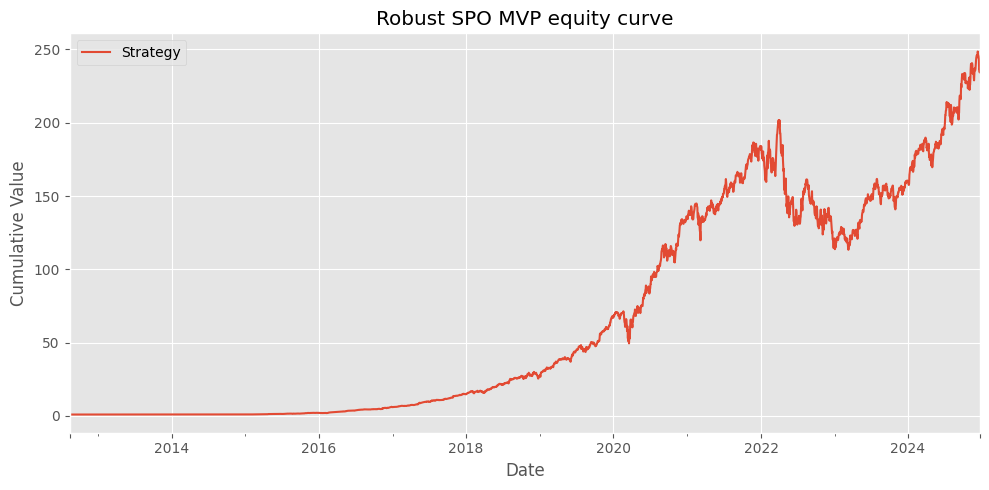


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.073
  Max drawdown:   -43.840%
  Avg turnover:   43.696%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 233.28696554344242, 'annualized_sharpe': 2.0736855976039634, 'max_drawdown': -0.4384014718562609}
  [Final] chrom 10/16: fitness=1.4164, Sharpe=2.073, max_dd=-43.840%, avg_turn=43.696%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 187.79945039278854, 'annualized_sharpe': 1.8306282828250398, 'max_drawdown': -0.42431197181371305}


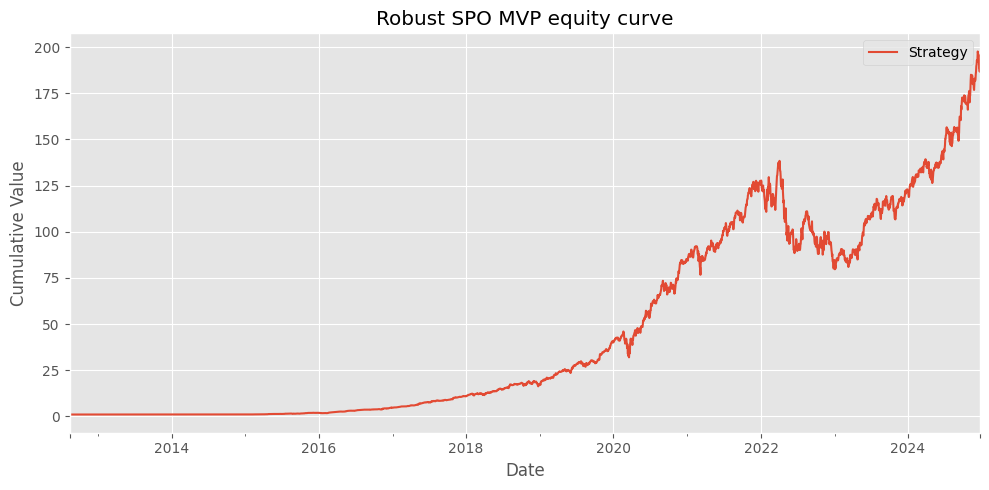


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.031
  Max drawdown:   -42.431%
  Avg turnover:   23.885%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 184.79369601644734, 'annualized_sharpe': 2.0313985573369457, 'max_drawdown': -0.42431197181371316}
  [Final] chrom 11/16: fitness=1.4873, Sharpe=2.031, max_dd=-42.431%, avg_turn=23.885%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 188.76941396267145, 'annualized_sharpe': 1.840128384056218, 'max_drawdown': -0.41655366057089693}


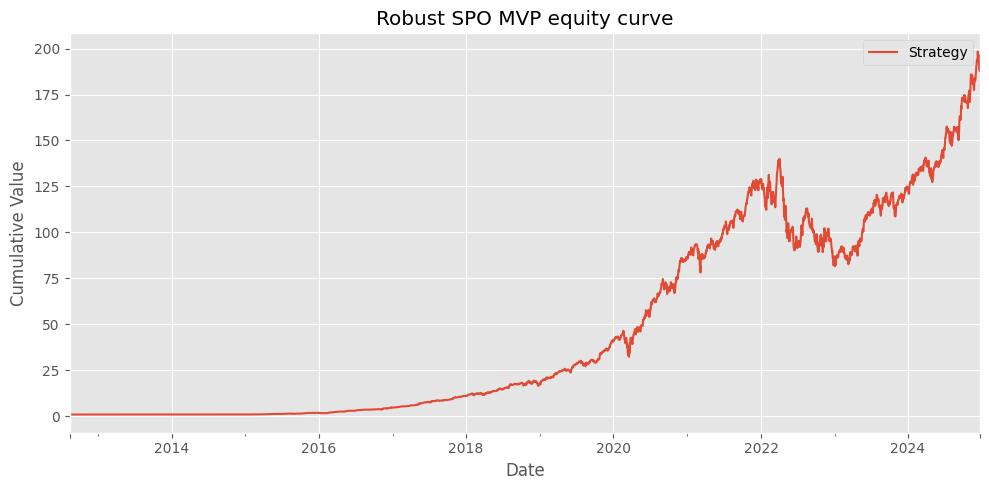


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.042
  Max drawdown:   -41.655%
  Avg turnover:   23.959%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 185.8492437341998, 'annualized_sharpe': 2.0423747475184166, 'max_drawdown': -0.41655366057089693}
  [Final] chrom 12/16: fitness=1.5056, Sharpe=2.042, max_dd=-41.655%, avg_turn=23.959%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 219.15185744567756, 'annualized_sharpe': 1.8538525404654693, 'max_drawdown': -0.4292553057370203}


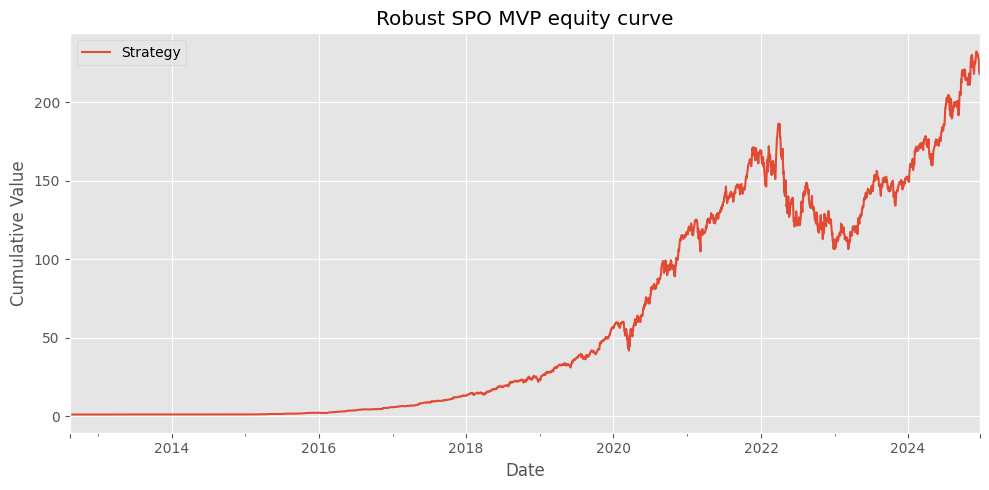


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.060
  Max drawdown:   -42.926%
  Avg turnover:   52.965%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 216.88523161812026, 'annualized_sharpe': 2.0602027917413133, 'max_drawdown': -0.4292553057370202}
  [Final] chrom 13/16: fitness=1.3657, Sharpe=2.060, max_dd=-42.926%, avg_turn=52.965%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 191.25144729636355, 'annualized_sharpe': 1.8353752479918153, 'max_drawdown': -0.42261195956854725}


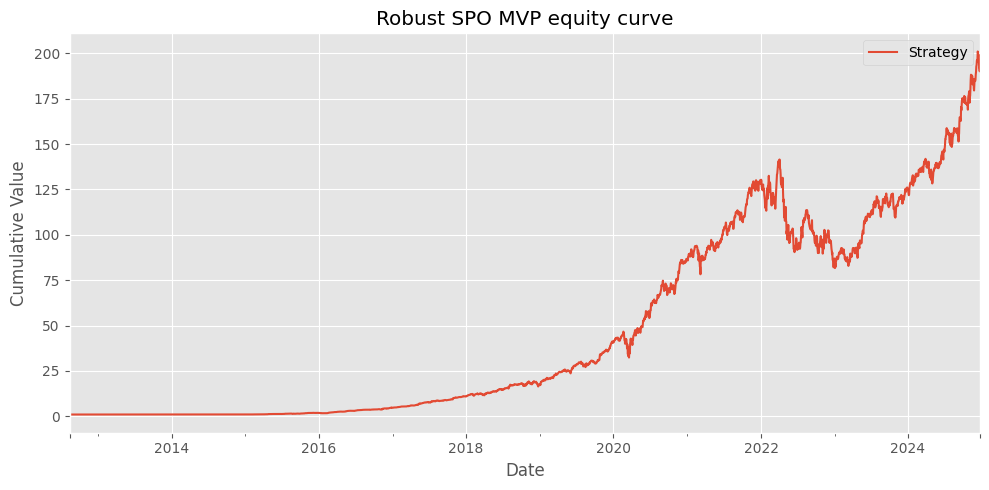


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.036
  Max drawdown:   -42.261%
  Avg turnover:   23.508%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 188.21736539499122, 'annualized_sharpe': 2.0368420121986097, 'max_drawdown': -0.42261195956854725}
  [Final] chrom 14/16: fitness=1.4963, Sharpe=2.036, max_dd=-42.261%, avg_turn=23.508%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 153.7081037335882, 'annualized_sharpe': 1.7924067069472691, 'max_drawdown': -0.40126244473538986}


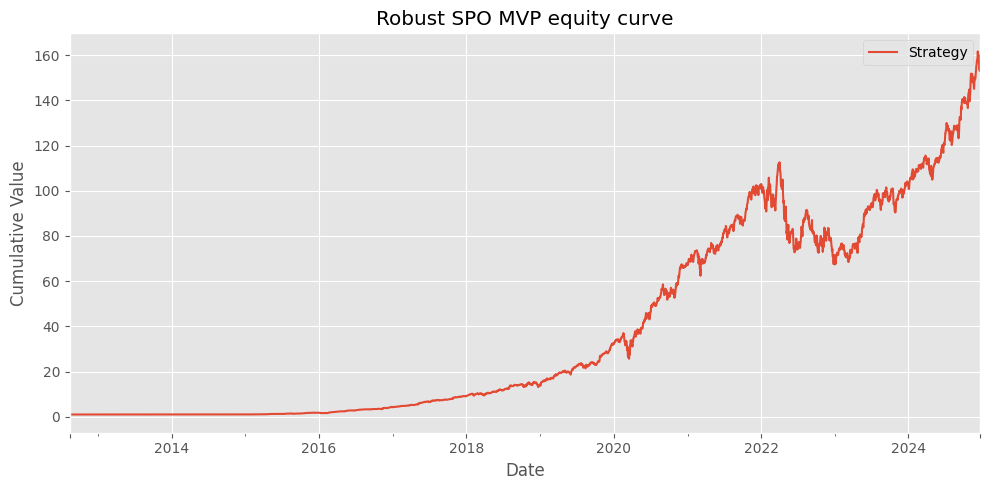


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.989
  Max drawdown:   -40.126%
  Avg turnover:   20.057%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 151.29693725392025, 'annualized_sharpe': 1.989018606308529, 'max_drawdown': -0.40126244473538963}
  [Final] chrom 15/16: fitness=1.4871, Sharpe=1.989, max_dd=-40.126%, avg_turn=20.057%
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 194.1712792461534, 'annualized_sharpe': 1.8395429565917496, 'max_drawdown': -0.42220006510398833}


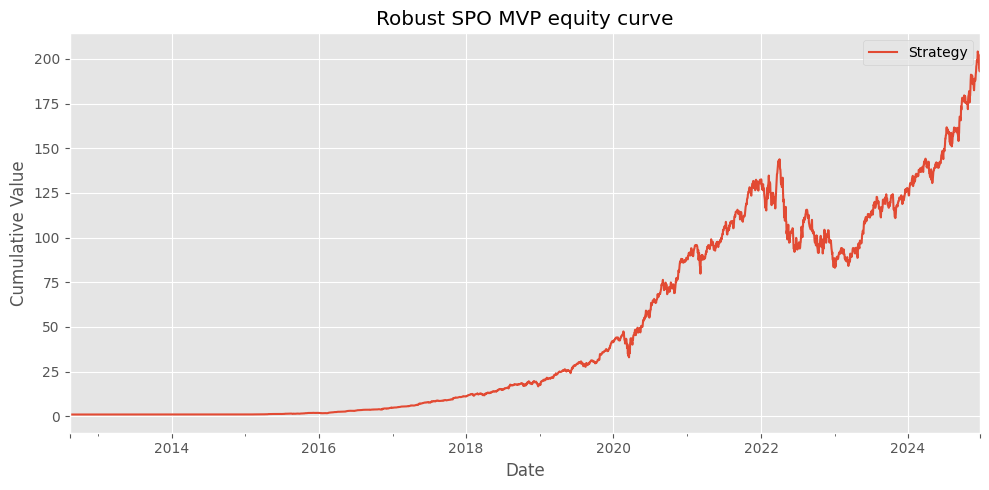


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.041
  Max drawdown:   -42.220%
  Avg turnover:   24.113%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 191.11300672547145, 'annualized_sharpe': 2.0415535432294876, 'max_drawdown': -0.42220006510398855}
  [Final] chrom 16/16: fitness=1.4984, Sharpe=2.041, max_dd=-42.220%, avg_turn=24.113%

Top GA templates:
  - conservative: fitness=1.5082, lambda=6.676, delta=0.0171, max_w=0.350, τ_turn=0.00610, Sharpe=2.042, max_dd=-41.455%, avg_turn=23.899%
  - balanced: fitness=1.5056, lambda=6.371, delta=0.0171, max_w=0.350, τ_turn=0.00610, Sharpe=2.042, max_dd=-41.655%, avg_turn=23.959%
  - aggressive: fitness=1.4984, lambda=5.485, delta=0.0171, max_w=0.350, τ_turn=0.00610, Sharpe=2.041, max_dd=-42.220%, avg_turn=24.113%
  - template_4: fitness=1.4965, 

In [36]:
print("\n=== 7. Genetic Algorithm for SPO templates ===")
import numpy as np
import random
from dataclasses import dataclass, asdict
@dataclass
class Chromosome:
    """
    Chromosome encoding robust SPO hyperparameters.
    These are *configuration* knobs, not model weights.
    """
    lambda_risk: float         
    delta_uncertainty: float   
    max_weight: float          
    turnover_penalty: float    
@dataclass
class GAConfig:
    """
    Configuration for the genetic algorithm over SPO templates.
    """
    population_size: int = 16
    n_generations: int = 12
    elite_frac: float = 0.25        
    tournament_size: int = 3
    crossover_prob: float = 0.8
    mutation_prob: float = 0.3
    lambda_range: tuple = (0.5, 15.0)
    delta_range: tuple = (0.0, 0.20)
    max_weight_range: tuple = (0.10, 0.35)
    turnover_penalty_range: tuple = (0.0, 0.01)
    drawdown_penalty: float = 1.0     
    turnover_penalty_weight: float = 0.5  
GA_CFG = GAConfig()
def random_chromosome(cfg: GAConfig = GA_CFG) -> Chromosome:
    """
    Sample a random chromosome from the GAConfig ranges.
    """
    return Chromosome(
        lambda_risk=np.exp(
            np.random.uniform(
                np.log(cfg.lambda_range[0]),
                np.log(cfg.lambda_range[1]),
            )
        ),
        delta_uncertainty=np.random.uniform(*cfg.delta_range),
        max_weight=np.random.uniform(*cfg.max_weight_range),
        turnover_penalty=np.random.uniform(*cfg.turnover_penalty_range),
    )
def clip_chromosome(ch: Chromosome, cfg: GAConfig = GA_CFG) -> Chromosome:
    """
    Ensure chromosome parameters stay within configured ranges.
    """
    return Chromosome(
        lambda_risk=float(np.clip(ch.lambda_risk, *cfg.lambda_range)),
        delta_uncertainty=float(np.clip(ch.delta_uncertainty, *cfg.delta_range)),
        max_weight=float(np.clip(ch.max_weight, *cfg.max_weight_range)),
        turnover_penalty=float(np.clip(ch.turnover_penalty, *cfg.turnover_penalty_range)),
    )
def crossover(parent1: Chromosome, parent2: Chromosome, cfg: GAConfig = GA_CFG) -> Chromosome:
    """
    Simple blend crossover with small randomness.
    """
    alpha = np.random.uniform(0.3, 0.7)
    child = Chromosome(
        lambda_risk=alpha * parent1.lambda_risk + (1 - alpha) * parent2.lambda_risk,
        delta_uncertainty=alpha * parent1.delta_uncertainty + (1 - alpha) * parent2.delta_uncertainty,
        max_weight=alpha * parent1.max_weight + (1 - alpha) * parent2.max_weight,
        turnover_penalty=alpha * parent1.turnover_penalty + (1 - alpha) * parent2.turnover_penalty,
    )
    return clip_chromosome(child, cfg)
def mutate(ch: Chromosome, cfg: GAConfig = GA_CFG) -> Chromosome:
    """
    Gaussian mutation on each gene with some probability.
    """
    def _mut(val, scale, low, high):
        if np.random.rand() < cfg.mutation_prob:
            val = val + np.random.normal(scale=scale)
        return float(np.clip(val, low, high))
    lambda_risk = _mut(
        ch.lambda_risk,
        scale=0.3 * (np.log(cfg.lambda_range[1]) - np.log(cfg.lambda_range[0])),
        low=cfg.lambda_range[0],
        high=cfg.lambda_range[1],
    )
    delta_uncertainty = _mut(
        ch.delta_uncertainty,
        scale=0.05 * (cfg.delta_range[1] - cfg.delta_range[0] + 1e-8),
        low=cfg.delta_range[0],
        high=cfg.delta_range[1],
    )
    max_weight = _mut(
        ch.max_weight,
        scale=0.05 * (cfg.max_weight_range[1] - cfg.max_weight_range[0] + 1e-8),
        low=cfg.max_weight_range[0],
        high=cfg.max_weight_range[1],
    )
    turnover_penalty = _mut(
        ch.turnover_penalty,
        scale=0.5 * (cfg.turnover_penalty_range[1] - cfg.turnover_penalty_range[0] + 1e-8),
        low=cfg.turnover_penalty_range[0],
        high=cfg.turnover_penalty_range[1],
    )
    return Chromosome(
        lambda_risk=lambda_risk,
        delta_uncertainty=delta_uncertainty,
        max_weight=max_weight,
        turnover_penalty=turnover_penalty,
    )
def tournament_select(pop, fitnesses, cfg: GAConfig = GA_CFG) -> Chromosome:
    """
    Tournament selection: pick best out of k random individuals.
    """
    idxs = np.random.choice(len(pop), size=cfg.tournament_size, replace=False)
    best_idx = idxs[0]
    best_f = fitnesses[best_idx]
    for i in idxs[1:]:
        if fitnesses[i] > best_f:
            best_idx = i
            best_f = fitnesses[i]
    return pop[best_idx]
def evaluate_chromosome(
    ch: Chromosome,
    alpha_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    universe: list[str] | None = None,
    ga_cfg: GAConfig = GA_CFG,
) -> dict:
    """
    Evaluate a chromosome by:
      - Building a RobustSPOConfig with its hyperparams
      - Running the SPO backtest to get weights
      - Running the generic backtest engine for consistent metrics
      - Computing fitness:
            fitness = Sharpe
                      - drawdown_penalty * |max_dd|
                      - turnover_penalty_weight * avg_turnover
    Returns:
        {
            "chromosome": ch,
            "fitness": fitness,
            "sharpe": sharpe,
            "max_dd": max_dd,
            "avg_turnover": avg_turnover,
        }
    """
    if universe is None:
        universe = list(UNIVERSE_CFG.tickers)
    cfg = RobustSPOConfig(
        lambda_risk=ch.lambda_risk,
        delta_uncertainty=ch.delta_uncertainty,
        max_weight=ch.max_weight,
        turnover_penalty=ch.turnover_penalty,
        cov_lookback=ROBUST_SPO_CFG.cov_lookback,
        min_cov_obs=ROBUST_SPO_CFG.min_cov_obs,
        cov_shrinkage=ROBUST_SPO_CFG.cov_shrinkage,
        rebalance_every=ROBUST_SPO_CFG.rebalance_every,
        start_date=ROBUST_SPO_CFG.start_date,
        end_date=ROBUST_SPO_CFG.end_date,
    )
    spo_res = run_robust_spo_backtest(
        alpha_df=alpha_df,
        returns_df=returns_df,
        cfg=cfg,
        universe=universe,
    )
    weights_df = spo_res["weights_df"]
    bt_res = run_backtest(
        weights_by_date=weights_df,
        returns_df=returns_df,
        universe=universe,
    )
    sharpe = bt_res["sharpe"]
    max_dd = bt_res["max_dd"]      
    avg_turnover = bt_res["avg_turnover"]
    fitness = (
        sharpe
        - ga_cfg.drawdown_penalty * abs(max_dd)
        - ga_cfg.turnover_penalty_weight * avg_turnover
    )
    return {
        "chromosome": ch,
        "fitness": float(fitness),
        "sharpe": float(sharpe),
        "max_dd": float(max_dd),
        "avg_turnover": float(avg_turnover),
    }
def run_ga_for_spo_templates(
    alpha_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    universe: list[str] | None = None,
    ga_cfg: GAConfig = GA_CFG,
    random_seed: int = RANDOM_SEED,
) -> dict:
    """
    Main GA loop:
      - Initialize population
      - For each generation:
          * Evaluate all chromosomes
          * Keep elites
          * Generate offspring via selection + crossover + mutation
      - Return top K chromosomes as templates.
    """
    if universe is None:
        universe = list(UNIVERSE_CFG.tickers)
    random.seed(random_seed)
    np.random.seed(random_seed)
    pop_size = ga_cfg.population_size
    n_generations = ga_cfg.n_generations
    n_elite = max(1, int(pop_size * ga_cfg.elite_frac))
    population = [random_chromosome(ga_cfg) for _ in range(pop_size)]
    history = []
    print(
        f"\nStarting GA for SPO templates with pop={pop_size}, "
        f"gens={n_generations}, elite={n_elite}"
    )
    for gen in range(1, n_generations + 1):
        print(f"\n--- GA Generation {gen}/{n_generations} ---")
        evals = []
        for i, ch in enumerate(population):
            print(f"  Evaluating chromosome {i+1}/{len(population)} ...")
            res = evaluate_chromosome(
                ch,
                alpha_df=alpha_df,
                returns_df=returns_df,
                universe=universe,
                ga_cfg=ga_cfg,
            )
            evals.append(res)
            print(
                f"    fitness={res['fitness']:.4f}, "
                f"Sharpe={res['sharpe']:.3f}, "
                f"max_dd={res['max_dd']:.3%}, "
                f"avg_turn={res['avg_turnover']:.3%}"
            )
        evals_sorted = sorted(evals, key=lambda r: r["fitness"], reverse=True)
        best = evals_sorted[0]
        print(
            f"\nGeneration {gen} best: "
            f"fitness={best['fitness']:.4f}, "
            f"Sharpe={best['sharpe']:.3f}, "
            f"max_dd={best['max_dd']:.3%}, "
            f"avg_turn={best['avg_turnover']:.3%}"
        )
        history.append(evals_sorted)
        elites = [e["chromosome"] for e in evals_sorted[:n_elite]]
        new_population = elites.copy()
        while len(new_population) < pop_size:
            p1 = tournament_select(population, [e["fitness"] for e in evals], ga_cfg)
            p2 = tournament_select(population, [e["fitness"] for e in evals], ga_cfg)
            if np.random.rand() < ga_cfg.crossover_prob:
                child = crossover(p1, p2, ga_cfg)
            else:
                child = p1
            child = mutate(child, ga_cfg)
            child = clip_chromosome(child, ga_cfg)
            new_population.append(child)
        population = new_population
    final_evals = []
    print("\n=== Final GA evaluation on last population ===")
    for i, ch in enumerate(population):
        res = evaluate_chromosome(
            ch,
            alpha_df=alpha_df,
            returns_df=returns_df,
            universe=universe,
            ga_cfg=ga_cfg,
        )
        final_evals.append(res)
        print(
            f"  [Final] chrom {i+1}/{len(population)}: "
            f"fitness={res['fitness']:.4f}, "
            f"Sharpe={res['sharpe']:.3f}, "
            f"max_dd={res['max_dd']:.3%}, "
            f"avg_turn={res['avg_turnover']:.3%}"
        )
    final_sorted = sorted(final_evals, key=lambda r: r["fitness"], reverse=True)
    K = min(5, len(final_sorted))
    top_templates = []
    for rank in range(K):
        res = final_sorted[rank]
        ch = res["chromosome"]
        if rank == 0:
            name = "conservative"
        elif rank == 1:
            name = "balanced"
        elif rank == 2:
            name = "aggressive"
        else:
            name = f"template_{rank+1}"
        template = {
            "name": name,
            "lambda_risk": ch.lambda_risk,
            "delta_uncertainty": ch.delta_uncertainty,
            "max_weight": ch.max_weight,
            "turnover_penalty": ch.turnover_penalty,
            "fitness": res["fitness"],
            "sharpe": res["sharpe"],
            "max_dd": res["max_dd"],
            "avg_turnover": res["avg_turnover"],
        }
        top_templates.append(template)
    print("\nTop GA templates:")
    for t in top_templates:
        print(
            f"  - {t['name']}: "
            f"fitness={t['fitness']:.4f}, "
            f"lambda={t['lambda_risk']:.3f}, "
            f"delta={t['delta_uncertainty']:.4f}, "
            f"max_w={t['max_weight']:.3f}, "
            f"τ_turn={t['turnover_penalty']:.5f}, "
            f"Sharpe={t['sharpe']:.3f}, "
            f"max_dd={t['max_dd']:.3%}, "
            f"avg_turn={t['avg_turnover']:.3%}"
        )
    return {
        "templates": top_templates,
        "history": history,
        "final_evals": final_sorted,
    }
ga_results = run_ga_for_spo_templates(
    alpha_df=alpha_pred_df,
    returns_df=returns_df,
    universe=list(UNIVERSE_CFG.tickers),
    ga_cfg=GA_CFG,
    random_seed=RANDOM_SEED,
)
spo_templates = ga_results["templates"]
print("\nSegment 7 complete:")
print("  - GA over SPO hyperparameters wired to SPO + backtest engine")
print("  - spo_templates ready as top K risk templates for RL / policy layer")
print("Templates:")
for t in spo_templates:
    print(" ", t)

In [41]:
print("\n=== 8. RL environment for template selection ===")
import numpy as np
import pandas as pd
try:
    import gymnasium as gym
    from gymnasium import spaces
    print("Using gymnasium")
except ImportError:
    import gym
    from gym import spaces
    print("Using classic gym")
from dataclasses import dataclass
assert "spo_templates" in globals(), "spo_templates not found. Run Segment 7 first."
K_TEMPLATES = len(spo_templates)
print(f"Found {K_TEMPLATES} SPO templates for RL.")
@dataclass
class RLTemplateEnvConfig:
    """
    Config for the RL environment that learns to pick SPO templates.
    """
    rolling_window: int = 63               
    reward_return_scale: float = 1.0       
    drawdown_penalty: float = 5.0          
    turnover_penalty_weight: float = 0.5   
    max_steps: int | None = None           
    start_date: str = ROBUST_SPO_CFG.start_date
    end_date: str = ROBUST_SPO_CFG.end_date
RL_CFG = RLTemplateEnvConfig()
class PortfolioTemplateEnv(gym.Env):
    """
    Gym-style environment:
      - Action: pick template index 0..K-1
      - State: rolling portfolio stats + RAG/text regime features + last template one-hot
      - Reward: portfolio return - drawdown_penalty*|dd| - turnover_penalty_weight*turnover

    IMPORTANT: For RL training we DO NOT run CVXPY inside the loop.
    We use a fast surrogate for the SPO weights.
    """
    metadata = {"render.modes": ["human"]}
    def __init__(
        self,
        spo_templates: list[dict],
        alpha_df: pd.DataFrame,
        returns_df: pd.DataFrame,
        text_features_df: pd.DataFrame,
        universe: list[str] | None = None,
        spo_base_cfg: RobustSPOConfig = ROBUST_SPO_CFG,
        rl_cfg: RLTemplateEnvConfig = RL_CFG,
        use_qp: bool = False,  
    ):
        super().__init__()
        if universe is None:
            universe = list(UNIVERSE_CFG.tickers)
        self.universe = universe
        self.n_assets = len(universe)
        self.alpha_df = alpha_df[universe].sort_index()
        self.returns_df = returns_df[universe].sort_index()
        self.text_features_df = text_features_df.sort_index()
        self.spo_templates = spo_templates
        self.K = len(spo_templates)
        self.rl_cfg = rl_cfg
        self.spo_base_cfg = spo_base_cfg
        self.use_qp = use_qp
        common_index = self.returns_df.index.intersection(self.alpha_df.index)
        common_index = common_index[
            (common_index >= pd.to_datetime(rl_cfg.start_date))
            & (common_index <= pd.to_datetime(rl_cfg.end_date))
        ]
        if len(common_index) == 0:
            raise ValueError("No overlapping dates for alpha/returns in RL env horizon.")
        self.calendar = common_index
        self.alpha_df = self.alpha_df.loc[self.calendar]
        self.returns_df = self.returns_df.loc[self.calendar]
        base_cfg_for_schedule = RobustSPOConfig(
            lambda_risk=spo_base_cfg.lambda_risk,
            delta_uncertainty=spo_base_cfg.delta_uncertainty,
            max_weight=spo_base_cfg.max_weight,
            turnover_penalty=spo_base_cfg.turnover_penalty,
            cov_lookback=spo_base_cfg.cov_lookback,
            min_cov_obs=spo_base_cfg.min_cov_obs,
            cov_shrinkage=spo_base_cfg.cov_shrinkage,
            rebalance_every=spo_base_cfg.rebalance_every,
            start_date=rl_cfg.start_date,
            end_date=rl_cfg.end_date,
        )
        self.rebalance_dates = build_rebalance_schedule(self.calendar, base_cfg_for_schedule)
        if self.rl_cfg.max_steps is not None:
            self.rebalance_dates = self.rebalance_dates[: self.rl_cfg.max_steps]
        self.n_steps = len(self.rebalance_dates)
        if self.n_steps < 2:
            raise ValueError("Not enough rebalance steps for RL episode.")
        self.action_space = spaces.Discrete(self.K)
        obs_dim = 3 + 3 + self.K
        self.observation_space = spaces.Box(
            low=-np.inf,
            high=np.inf,
            shape=(obs_dim,),
            dtype=np.float32,
        )
        self.current_step = None          
        self.equity = None
        self.last_weights = None          
        self.last_template_idx = None
        self.portfolio_ret_history = pd.Series(dtype=float)
    def reset(self, *, seed=None, options=None):
        """
        Start a new episode.
        """
        if seed is not None:
            super().reset(seed=seed)
        self.current_step = 0
        self.equity = 1.0
        self.last_weights = np.ones(self.n_assets) / self.n_assets
        self.last_template_idx = 0
        self.portfolio_ret_history = pd.Series(dtype=float)
        obs = self._build_obs(self.rebalance_dates[self.current_step])
        return obs.astype(np.float32), {}
    def _fast_template_weights(self, mu_t: np.ndarray, tmpl: dict) -> np.ndarray:
        """
        Cheap surrogate for SPO weights.

        Idea:
          - Scale mu with a 'risk temperature' ~ 1 / lambda_risk
          - ReLU negatives
          - Softmax to get weights
          - Cap per-asset weight by max_weight, renormalize
        """
        lambda_risk = float(tmpl["lambda_risk"])
        max_weight = float(tmpl["max_weight"])
        if lambda_risk <= 0:
            temp = 1.0
        else:
            temp = 1.0 / np.log1p(lambda_risk)
        logits = mu_t * temp
        logits = np.clip(logits, -20, 20)  
        exp_logits = np.exp(logits - np.max(logits))
        w = exp_logits / (exp_logits.sum() + 1e-12)
        w = np.minimum(w, max_weight)
        s = w.sum()
        if s <= 0:
            w = np.ones_like(w) / len(w)
        else:
            w = w / s
        return w
    def step(self, action: int):
        """
        Action: template index 0..K-1.
        We:
          - Use template hyperparams to choose weights (fast surrogate or QP).
          - Hold weights until next rebalance date.
          - Compute realized returns, drawdown, turnover, and reward.
        """
        assert self.action_space.contains(action), "Invalid action."
        d_start = self.rebalance_dates[self.current_step]
        if self.current_step < self.n_steps - 1:
            d_end = self.rebalance_dates[self.current_step + 1]
            period_mask = (self.calendar >= d_start) & (self.calendar < d_end)
        else:
            d_end = self.calendar[-1]
            period_mask = (self.calendar >= d_start) & (self.calendar <= d_end)
        if period_mask.sum() == 0:
            step_return = 0.0
            step_dd = 0.0
            turnover = 0.0
        else:
            tmpl = self.spo_templates[action]
            cfg = RobustSPOConfig(
                lambda_risk=tmpl["lambda_risk"],
                delta_uncertainty=tmpl["delta_uncertainty"],
                max_weight=tmpl["max_weight"],
                turnover_penalty=tmpl["turnover_penalty"],
                cov_lookback=self.spo_base_cfg.cov_lookback,
                min_cov_obs=self.spo_base_cfg.min_cov_obs,
                cov_shrinkage=self.spo_base_cfg.cov_shrinkage,
                rebalance_every=self.spo_base_cfg.rebalance_every,
                start_date=self.rl_cfg.start_date,
                end_date=self.rl_cfg.end_date,
            )
            history_len = self.returns_df.loc[:d_start].shape[0]
            mu_t = self.alpha_df.loc[d_start, self.universe].to_numpy(dtype=float)
            if (not self.use_qp) or (history_len < cfg.min_cov_obs):
                if history_len < cfg.min_cov_obs and self.use_qp:
                    print(f"[RL Env] Not enough history for cov at {d_start.date()}, using fast surrogate.")
                w_t = self._fast_template_weights(mu_t, tmpl)
            else:
                try:
                    Sigma_t = estimate_covariance(
                        returns_df=self.returns_df,
                        end_date=d_start,
                        lookback=cfg.cov_lookback,
                        shrinkage=cfg.cov_shrinkage,
                    )
                except Exception as e:
                    print(f"[RL Env] Covariance estimation failed at {d_start.date()}: {e}")
                    Sigma_t = np.eye(self.n_assets) * 1e-4
                w_t = solve_robust_markowitz(
                    mu=mu_t,
                    Sigma=Sigma_t,
                    lambda_risk=cfg.lambda_risk,
                    delta_uncertainty=cfg.delta_uncertainty,
                    max_weight=cfg.max_weight,
                    turnover_penalty=cfg.turnover_penalty,
                    w_prev=self.last_weights,
                )
            turnover = 0.5 * np.abs(w_t - self.last_weights).sum()
            r_period = self.returns_df.loc[period_mask]
            port_ret_series = r_period.to_numpy() @ w_t
            step_return = float(port_ret_series.sum())
            eq_path = (1.0 + pd.Series(port_ret_series, index=self.calendar[period_mask])).cumprod()
            step_dd = float(compute_drawdown(eq_path).min()) if len(eq_path) > 0 else 0.0
            if self.portfolio_ret_history.empty:
                self.portfolio_ret_history = pd.Series(port_ret_series, index=self.calendar[period_mask])
            else:
                self.portfolio_ret_history = pd.concat(
                    [self.portfolio_ret_history,
                     pd.Series(port_ret_series, index=self.calendar[period_mask])]
                ).sort_index()
            self.equity *= float((1.0 + port_ret_series).prod())
            self.last_weights = w_t
        reward = (
            self.rl_cfg.reward_return_scale * step_return
            - self.rl_cfg.drawdown_penalty * abs(step_dd)
            - self.rl_cfg.turnover_penalty_weight * turnover
        )
        self.last_template_idx = int(action)
        self.current_step += 1
        done = self.current_step >= self.n_steps - 1
        if not done:
            next_date = self.rebalance_dates[self.current_step]
            obs = self._build_obs(next_date)
        else:
            obs = self._build_obs(self.rebalance_dates[-1])
        info = {
            "step_return": step_return,
            "step_drawdown": step_dd,
            "turnover": turnover,
            "equity": self.equity,
            "current_step": self.current_step,
        }
        terminated = done
        truncated = False
        return obs.astype(np.float32), float(reward), terminated, truncated, info
    def _build_obs(self, current_date: pd.Timestamp) -> np.ndarray:
        """
        Construct observation vector from:
          - rolling stats of realized portfolio returns
          - global text features (sentiment, macro_tone, liquidity_risk)
          - last chosen template index (one-hot)
        """
        if len(self.portfolio_ret_history) == 0:
            roll_mean = 0.0
            roll_std = 0.0
            roll_dd = 0.0
        else:
            hist = self.portfolio_ret_history.sort_index()
            hist = hist.iloc[-self.rl_cfg.rolling_window :]
            if len(hist) < 2:
                roll_mean = float(hist.mean())
                roll_std = float(hist.std(ddof=0))
                eq_path = (1.0 + hist).cumprod()
                roll_dd = float(compute_drawdown(eq_path).min())
            else:
                roll_mean = float(hist.mean())
                roll_std = float(hist.std(ddof=0))
                eq_path = (1.0 + hist).cumprod()
                roll_dd = float(compute_drawdown(eq_path).min())
        try:
            text_feats = get_text_features_for_date(current_date, self.text_features_df)
        except Exception:
            text_feats = {
                "global_sentiment": 0.0,
                "macro_tone": 0.0,
                "liquidity_risk": 0.0,
            }
        gs = float(text_feats["global_sentiment"])
        mt = float(text_feats["macro_tone"])
        lr = float(text_feats["liquidity_risk"])
        one_hot = np.zeros(self.K, dtype=float)
        if self.last_template_idx is not None and 0 <= self.last_template_idx < self.K:
            one_hot[self.last_template_idx] = 1.0
        obs = np.concatenate(
            [
                np.array([roll_mean, roll_std, roll_dd], dtype=float),
                np.array([gs, mt, lr], dtype=float),
                one_hot,
            ]
        )
        return obs
    def render(self, mode="human"):
        print(
            f"[Step {self.current_step}/{self.n_steps}] "
            f"Equity={self.equity:.3f}, last_template={self.last_template_idx}"
        )
    def close(self):
        pass
print("\nBuilding RL environment with current SPO templates...")
rl_env = PortfolioTemplateEnv(
    spo_templates=spo_templates,
    alpha_df=alpha_pred_df,
    returns_df=returns_df,
    text_features_df=text_features_df,
    universe=list(UNIVERSE_CFG.tickers),
    spo_base_cfg=ROBUST_SPO_CFG,
    rl_cfg=RL_CFG,
    use_qp=False,   
)
print("RL environment constructed.")
print("\n=== 8.1 Quick smoke test of env.step/reset ===")
obs, info = rl_env.reset()
print("Initial obs shape:", obs.shape)
step_out = rl_env.step(0)
if len(step_out) == 5:
    obs, reward, terminated, truncated, info = step_out
    done = terminated or truncated
else:
    obs, reward, done, info = step_out  
print("Step result: reward=", reward, "done=", done, "info=", info)
print("\n=== 8.2 PPO training stub (MVP short run) ===")
if not HAS_SB3:
    print(
        "stable-baselines3 not available; skipping RL training. "
        "Install it and re-run this cell to train PPO."
    )
else:
    from stable_baselines3 import PPO
    short_rl_cfg = RLTemplateEnvConfig(
        rolling_window=RL_CFG.rolling_window,
        reward_return_scale=RL_CFG.reward_return_scale,
        drawdown_penalty=RL_CFG.drawdown_penalty,
        turnover_penalty_weight=RL_CFG.turnover_penalty_weight,
        max_steps=min(30, rl_env.n_steps),  
        start_date=RL_CFG.start_date,
        end_date=RL_CFG.end_date,
    )
    short_env = PortfolioTemplateEnv(
        spo_templates=spo_templates,
        alpha_df=alpha_pred_df,
        returns_df=returns_df,
        text_features_df=text_features_df,
        universe=list(UNIVERSE_CFG.tickers),
        spo_base_cfg=ROBUST_SPO_CFG,
        rl_cfg=short_rl_cfg,
        use_qp=False,   
    )
    print(
        f"Training PPO on short env: max_steps={short_env.n_steps}, "
        "total_timesteps=5_000 (MVP)."
    )
    ppo_model = PPO(
        "MlpPolicy",
        short_env,
        verbose=1,
        n_steps=128,
        batch_size=64,
        learning_rate=3e-4,
        device="cpu",      
        tensorboard_log=None,
    )
    ppo_model.learn(total_timesteps=5_000)
    RL_MODELS_DIR = MODELS_DIR / "rl"
    RL_MODELS_DIR.mkdir(parents=True, exist_ok=True)
    ppo_model.save(str(RL_MODELS_DIR / "ppo_template_selector_fast"))
    print(f"PPO template selector saved to {RL_MODELS_DIR / 'ppo_template_selector_fast'}")
print("\nSegment 8 complete:")
print("  - PortfolioTemplateEnv implemented with fast SPO surrogate for RL")
print("  - No CVXPY inside PPO loop; QP kept for Segment 5 backtests only")
print("  - State: rolling stats + text features + last template one-hot")
print("  - Action: pick template index 0..K-1")
print("  - Reward: return - dd_penalty*|dd| - turnover_penalty_weight*turnover")
print("  - PPO training stub now much lighter and won't lock your machine")


=== 8. RL environment for template selection ===
Using gymnasium
Found 5 SPO templates for RL.

Building RL environment with current SPO templates...
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.
RL environment constructed.

=== 8.1 Quick smoke test of env.step/reset ===
Initial obs shape: (11,)
Step result: reward= -0.2159466670685845 done= False info= {'step_return': -0.0317223714856719, 'step_drawdown': -0.03671572006717361, 'turnover': np.float64(0.001291390494089155), 'equity': 0.968419546733645, 'current_step': 1}

=== 8.2 PPO training stub (MVP short run) ===
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.
Training PPO on short env: max_steps=30, total_timesteps=5_000 (MVP).
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 29       |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    fps  

In [43]:
print("\n=== 9. LLM Copilot Layer (Dense SLM + LoRA + RAG) ===")
from dataclasses import dataclass, asdict
from pathlib import Path
import json
@dataclass
class CopilotModelConfig:
    base_model_name: str = "local-small-llm-1b"
    model_dir: Path = PROJECT_ROOT / "llm"
    device: str = "cpu"
    max_new_tokens: int = 512
    temperature: float = 0.3
    top_p: float = 0.9
    prune_fraction: float = 0.10
COPILOT_MODEL_CFG = CopilotModelConfig()
COPILOT_DIR = COPILOT_MODEL_CFG.model_dir
COPILOT_DIR.mkdir(parents=True, exist_ok=True)
print("Copilot model config:")
print(asdict(COPILOT_MODEL_CFG))
class CopilotRole:
    REGIME = "regime_classifier"
    CONFIG = "config_advisor"
    REPORT = "reporting"
@dataclass
class CopilotAdapterConfig:
    name: str
    adapter_path: Path
COPILOT_ADAPTERS = {
    CopilotRole.REGIME: CopilotAdapterConfig(
        name="Regime Adapter",
        adapter_path=COPILOT_DIR / "adapters" / "regime"
    ),
    CopilotRole.CONFIG: CopilotAdapterConfig(
        name="Config Advisor Adapter",
        adapter_path=COPILOT_DIR / "adapters" / "config_advisor"
    ),
    CopilotRole.REPORT: CopilotAdapterConfig(
        name="Reporting Adapter",
        adapter_path=COPILOT_DIR / "adapters" / "reporting"
    ),
}
for cfg in COPILOT_ADAPTERS.values():
    cfg.adapter_path.mkdir(parents=True, exist_ok=True)
print("\nCopilot adapters:")
for role, cfg in COPILOT_ADAPTERS.items():
    print(f"  - {role}: {cfg.adapter_path}")
def prune_model_stub(model_cfg: CopilotModelConfig):
    print(f"\n[Pruning Stub] Would prune {model_cfg.prune_fraction*100:.1f}% of weights from {model_cfg.base_model_name}")
    return True
prune_model_stub(COPILOT_MODEL_CFG)
def route_to_adapter(task: str) -> CopilotAdapterConfig:
    if task == "regime":
        return COPILOT_ADAPTERS[CopilotRole.REGIME]
    elif task == "config":
        return COPILOT_ADAPTERS[CopilotRole.CONFIG]
    elif task == "report":
        return COPILOT_ADAPTERS[CopilotRole.REPORT]
    else:
        raise ValueError(f"Unknown task '{task}'")
def build_prompt(task: str, rag_chunks: list[str], extra: dict = None):
    extra = extra or {}
    header = f"[TASK: {task.upper()}]\n\n"
    rag_text = "\n".join([f"[RAG] {c}" for c in rag_chunks])
    body = ""
    if task == "regime":
        body = (
            "Classify the current market regime using the provided macro/context.\n"
            "Output JSON with keys: regime, confidence, drivers.\n"
        )
    elif task == "config":
        body = (
            "Read the metrics and suggest which SPO template fits best.\n"
            "Output JSON with keys: suggestion, reasoning.\n"
        )
    elif task == "report":
        body = (
            "Generate a Markdown performance report.\n"
            "Sections: Summary, Regime Context, Risk Commentary, Template Actions.\n"
        )
    prompt = header + rag_text + "\n\n" + body
    return prompt
def rag_retrieve_stub(query: str, top_k: int = 5):
    return [f"Retrieved snippet {i+1} for '{query}'" for i in range(top_k)]
def copilot_run_stub(task: str, query: str):
    adapter = route_to_adapter(task)
    rag_snippets = rag_retrieve_stub(query)
    prompt = build_prompt(task, rag_snippets)
    print(f"\n[Copilot Stub] Task={task}")
    print("Adapter:", adapter.adapter_path)
    print("Prompt:\n", prompt[:300], "...")
    return {
        "task": task,
        "adapter": str(adapter.adapter_path),
        "prompt_preview": prompt[:200]
    }
model_dict = asdict(COPILOT_MODEL_CFG)
for k, v in model_dict.items():
    if isinstance(v, Path):
        model_dict[k] = str(v)
copilot_meta = {
    "model": model_dict,
    "adapters": {
        role: {
            "name": cfg.name,
            "adapter_path": str(cfg.adapter_path),
        }
        for role, cfg in COPILOT_ADAPTERS.items()
    },
    "rag_config": {
        "enabled": RAG_CFG.enabled,
        "vector_store_dir": str(RAG_CFG.vector_store_dir),
        "embedding_model_name": RAG_CFG.embedding_model_name,
        "top_k": RAG_CFG.top_k,
    },
}
with open(COPILOT_DIR / "copilot_meta.json", "w") as f:
    json.dump(copilot_meta, f, indent=2)
print("\nCopilot metadata saved to:", COPILOT_DIR / "copilot_meta.json")
print("\n=== 9.6 Copilot smoke tests ===")
smoke_regime = copilot_run_stub("regime", "macro conditions")
smoke_config = copilot_run_stub("config", "portfolio metrics")
smoke_report = copilot_run_stub("report", "monthly performance")
print("\nSmoke test outputs:")
print(" - Regime:", smoke_regime)
print(" - Config:", smoke_config)
print(" - Report:", smoke_report)
print("\nSegment 9 complete: Copilot backbone + adapters + routing + RAG stubs ready.")


=== 9. LLM Copilot Layer (Dense SLM + LoRA + RAG) ===
Copilot model config:
{'base_model_name': 'local-small-llm-1b', 'model_dir': WindowsPath('C:/Users/aniru/OneDrive/Desktop/ML tutorial/Targeted SPO Optimization Engine/llm'), 'device': 'cpu', 'max_new_tokens': 512, 'temperature': 0.3, 'top_p': 0.9, 'prune_fraction': 0.1}

Copilot adapters:
  - regime_classifier: C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\llm\adapters\regime
  - config_advisor: C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\llm\adapters\config_advisor
  - reporting: C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\llm\adapters\reporting

[Pruning Stub] Would prune 10.0% of weights from local-small-llm-1b

Copilot metadata saved to: C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\llm\copilot_meta.json

=== 9.6 Copilot smoke tests ===

[Copilot Stub] Task=regime
Adapter: C:\Users\aniru\OneDrive\Deskt


=== 10. End to end orchestration and experiment runner ===

=== 10.6 Running all strategies for comparison ===

Backtest summary (generic engine):
  Period:         2012-05-18 -> 2024-12-30
  n_days:         3292
  Sharpe:         1.367
  Max drawdown:   -34.715%
  Avg turnover:   0.000%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2012-05-18 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 3291, 'cumulative_return': 34.20230543451551, 'annualized_sharpe': 1.3667460961894307, 'max_drawdown': -0.34714931825983264}
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 66.30092453088938, 'annualized_sharpe': 1.6426053373116838, 'max_drawdown': -0.37852293359905753}


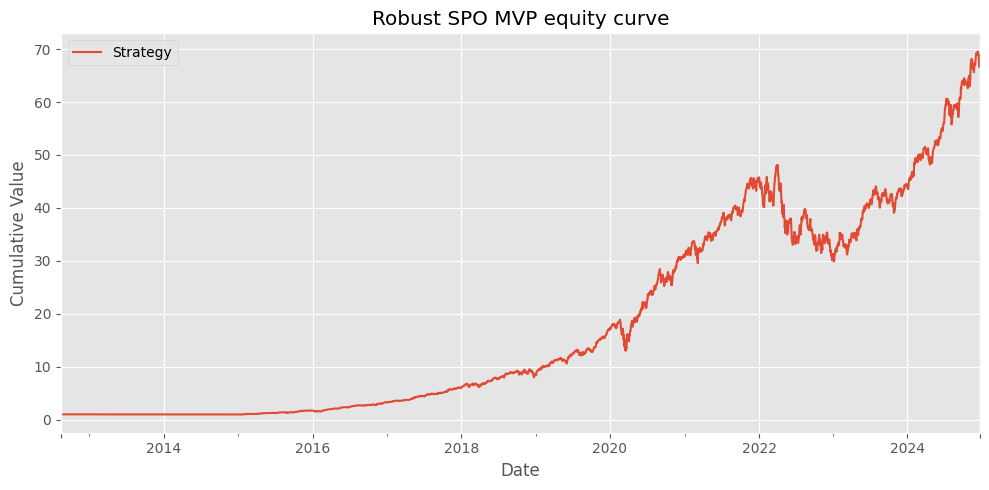


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         1.823
  Max drawdown:   -37.852%
  Avg turnover:   27.444%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 65.48669034899795, 'annualized_sharpe': 1.8229514746512403, 'max_drawdown': -0.3785229335990584}

[GA best template] Using template: {'name': 'conservative', 'lambda_risk': 6.67561451316381, 'delta_uncertainty': 0.01711484418166856, 'max_weight': 0.35, 'turnover_penalty': 0.006101626419136558, 'fitness': 1.5082456056234443}
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

Robust SPO backtest complete.
[Robust_SPO_MVP] {'label': 'Robust_SPO_MVP', 'start': Timestamp('2012-08-14 00:00:00'), 'end': Timestamp('2024-12-23 00:00:00'), 'n_periods': 3224, 'cumulative_return': 186.98719909447627, 'annualized_sharpe': 1.840365809398175

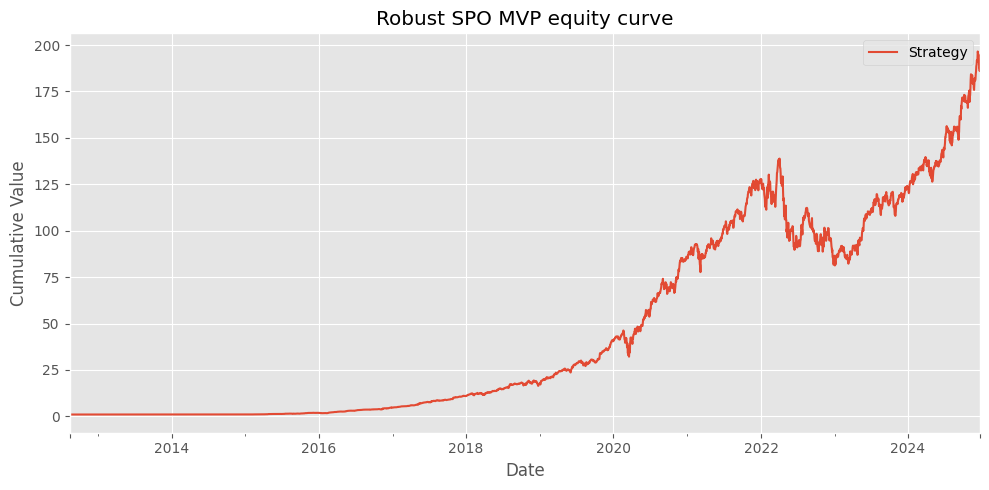


Backtest summary (generic engine):
  Period:         2015-01-01 -> 2024-12-30
  n_days:         2608
  Sharpe:         2.042
  Max drawdown:   -41.455%
  Avg turnover:   23.899%
[Generic_Backtest] {'label': 'Generic_Backtest', 'start': Timestamp('2015-01-01 00:00:00'), 'end': Timestamp('2024-12-30 00:00:00'), 'n_periods': 2607, 'cumulative_return': 184.1111214792803, 'annualized_sharpe': 2.042691288100632, 'max_drawdown': -0.4145535593045214}
Rebalance schedule has 522 dates from 2015-01-01 to 2024-12-23.

[GA+RL] Loading PPO model from C:\Users\aniru\OneDrive\Desktop\ML tutorial\Targeted SPO Optimization Engine\models\rl\ppo_template_selector_fast.zip


C:\Anaconda3\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(



[GA+RL+RAG] Backtest summary:
  Period:       2015-01-01 -> 2024-12-20
  n_days:       2602
  Sharpe:       1.300
  Max drawdown: -34.607%
  Avg turnover: 0.264%

=== Strategy comparison summary ===
                        sharpe  max_drawdown  avg_turnover  final_equity
strategy                                                                
spo_ga_best_template  2.042293     -0.414554      0.238988    185.111121
spo_fixed             1.822597     -0.378523      0.274436     66.486690
equal_weight          1.366537     -0.347149      0.000000     35.202305
spo_ga_rl_rag         1.299592     -0.346073      0.002641     16.627950


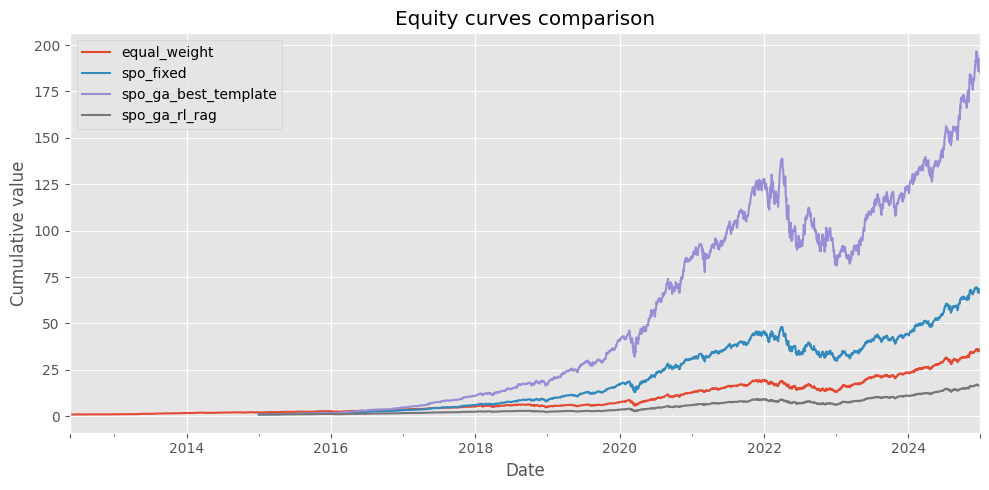


Segment 10 complete:
  - End to end orchestration wired
  - Baselines vs SPO vs GA vs GA+RL+RAG compared
  - Summary table and equity plot generated


In [44]:
print("\n=== 10. End to end orchestration and experiment runner ===")
from dataclasses import dataclass
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
@dataclass
class StrategyResult:
    name: str
    equity_curve: pd.Series
    sharpe: float
    max_dd: float
    avg_turnover: float
def _ensure_universe(universe):
    if universe is None:
        return list(UNIVERSE_CFG.tickers)
    return list(universe)
def run_equal_weight_backtest(
    returns_df: pd.DataFrame,
    universe: list[str] | None = None,
) -> StrategyResult:
    """
    Baseline: fully invested equal weight portfolio over the whole period.
    Single rebalance at the first date, then hold.
    """
    universe = _ensure_universe(universe)
    returns_use = returns_df[universe].sort_index()
    first_date = returns_use.index[0]
    w0 = np.ones(len(universe)) / len(universe)
    weights_by_date = {
        first_date: pd.Series(w0, index=universe, name=first_date)
    }
    bt_res = run_backtest(
        weights_by_date=weights_by_date,
        returns_df=returns_use,
        universe=universe,
    )
    return StrategyResult(
        name="equal_weight",
        equity_curve=bt_res["equity_curve"],
        sharpe=bt_res["sharpe"],
        max_dd=bt_res["max_dd"],
        avg_turnover=bt_res["avg_turnover"],
    )
def run_fixed_spo_backtest(
    alpha_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    cfg: RobustSPOConfig = ROBUST_SPO_CFG,
    universe: list[str] | None = None,
) -> StrategyResult:
    """
    SPO with a fixed configuration (no GA, no RL).
    Uses the RobustSPOConfig passed in.
    """
    universe = _ensure_universe(universe)
    spo_res = run_robust_spo_backtest(
        alpha_df=alpha_df,
        returns_df=returns_df,
        cfg=cfg,
        universe=universe,
    )
    bt_res = run_backtest(
        weights_by_date=spo_res["weights_df"],
        returns_df=returns_df,
        universe=universe,
    )
    return StrategyResult(
        name="spo_fixed",
        equity_curve=bt_res["equity_curve"],
        sharpe=bt_res["sharpe"],
        max_dd=bt_res["max_dd"],
        avg_turnover=bt_res["avg_turnover"],
    )
def run_ga_best_template_backtest(
    alpha_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    spo_templates: list[dict],
    universe: list[str] | None = None,
) -> StrategyResult:
    """
    Use the single best GA template across the whole backtest.
    No RL, no switching. Static template chosen by GA fitness.
    """
    if not spo_templates:
        raise ValueError("spo_templates is empty. Run GA first.")
    universe = _ensure_universe(universe)
    best_t = sorted(spo_templates, key=lambda t: t["fitness"], reverse=True)[0]
    cfg = RobustSPOConfig(
        lambda_risk=best_t["lambda_risk"],
        delta_uncertainty=best_t["delta_uncertainty"],
        max_weight=best_t["max_weight"],
        turnover_penalty=best_t["turnover_penalty"],
        cov_lookback=ROBUST_SPO_CFG.cov_lookback,
        min_cov_obs=ROBUST_SPO_CFG.min_cov_obs,
        cov_shrinkage=ROBUST_SPO_CFG.cov_shrinkage,
        rebalance_every=ROBUST_SPO_CFG.rebalance_every,
        start_date=ROBUST_SPO_CFG.start_date,
        end_date=ROBUST_SPO_CFG.end_date,
    )
    print(
        "\n[GA best template] Using template:",
        {k: best_t[k] for k in ["name", "lambda_risk", "delta_uncertainty", "max_weight", "turnover_penalty", "fitness"]},
    )
    spo_res = run_robust_spo_backtest(
        alpha_df=alpha_df,
        returns_df=returns_df,
        cfg=cfg,
        universe=universe,
    )
    bt_res = run_backtest(
        weights_by_date=spo_res["weights_df"],
        returns_df=returns_df,
        universe=universe,
    )
    return StrategyResult(
        name="spo_ga_best_template",
        equity_curve=bt_res["equity_curve"],
        sharpe=bt_res["sharpe"],
        max_dd=bt_res["max_dd"],
        avg_turnover=bt_res["avg_turnover"],
    )
def run_ga_rl_rag_backtest(
    spo_templates: list[dict],
    alpha_df: pd.DataFrame,
    returns_df: pd.DataFrame,
    text_features_df: pd.DataFrame,
    universe: list[str] | None = None,
    rl_cfg: RLTemplateEnvConfig = RL_CFG,
    spo_base_cfg: RobustSPOConfig = ROBUST_SPO_CFG,
) -> StrategyResult:
    """
    Full stack:
      - GA templates
      - RL chooses templates over time
      - RAG text features in state (via text_features_df)
    Uses PPO if a trained model exists; otherwise falls back
    to a simple heuristic or trivial policy.
    """
    universe = _ensure_universe(universe)
    env = PortfolioTemplateEnv(
        spo_templates=spo_templates,
        alpha_df=alpha_df,
        returns_df=returns_df,
        text_features_df=text_features_df,
        universe=universe,
        spo_base_cfg=spo_base_cfg,
        rl_cfg=rl_cfg,
        use_qp=False,  
    )
    rl_model = None
    RL_MODELS_DIR = MODELS_DIR / "rl"
    model_path = RL_MODELS_DIR / "ppo_template_selector_fast.zip"
    if HAS_SB3 and model_path.exists():
        try:
            from stable_baselines3 import PPO
            print(f"\n[GA+RL] Loading PPO model from {model_path}")
            rl_model = PPO.load(str(model_path))
        except Exception as e:
            print(f"[GA+RL] Failed to load PPO model: {e}. Falling back to heuristic policy.")
    else:
        if not HAS_SB3:
            print("\n[GA+RL] stable-baselines3 not available. Using heuristic policy.")
        else:
            print(f"\n[GA+RL] PPO model not found at {model_path}. Using heuristic policy.")
    if rl_model is None:
        best_idx = int(
            np.argmax([t["fitness"] for t in spo_templates])
        )
        def policy(obs):
            return best_idx
    else:
        def policy(obs):
            action, _ = rl_model.predict(obs, deterministic=True)
            return int(action)
    obs, info = env.reset()
    done = False
    turnovers = []
    while not done:
        a = policy(obs)
        step_out = env.step(a)
        if len(step_out) == 5:
            obs, reward, terminated, truncated, info = step_out
            done = terminated or truncated
        else:
            obs, reward, done, info = step_out
        turnovers.append(info.get("turnover", 0.0))
    port_rets = env.portfolio_ret_history.sort_index()
    if len(port_rets) == 0:
        raise RuntimeError("RL env produced no portfolio returns.")
    equity_curve = (1.0 + port_rets.fillna(0.0)).cumprod()
    equity_curve.name = "Equity_GA_RL_RAG"
    sharpe = annualized_sharpe(port_rets)
    max_dd = max_drawdown(equity_curve)
    avg_turn = float(np.mean(turnovers)) if len(turnovers) > 0 else 0.0
    print("\n[GA+RL+RAG] Backtest summary:")
    print(f"  Period:       {equity_curve.index[0].date()} -> {equity_curve.index[-1].date()}")
    print(f"  n_days:       {len(equity_curve)}")
    print(f"  Sharpe:       {sharpe:.3f}")
    print(f"  Max drawdown: {max_dd:.3%}")
    print(f"  Avg turnover: {avg_turn:.3%}")
    return StrategyResult(
        name="spo_ga_rl_rag",
        equity_curve=equity_curve,
        sharpe=sharpe,
        max_dd=max_dd,
        avg_turnover=avg_turn,
    )
def run_all_strategies_and_compare():
    universe = list(UNIVERSE_CFG.tickers)
    print("\n=== 10.6 Running all strategies for comparison ===")
    eq_res = run_equal_weight_backtest(
        returns_df=returns_df,
        universe=universe,
    )
    fixed_spo_res = run_fixed_spo_backtest(
        alpha_df=alpha_pred_df,
        returns_df=returns_df,
        cfg=ROBUST_SPO_CFG,
        universe=universe,
    )
    ga_best_res = run_ga_best_template_backtest(
        alpha_df=alpha_pred_df,
        returns_df=returns_df,
        spo_templates=spo_templates,
        universe=universe,
    )
    ga_rl_rag_res = run_ga_rl_rag_backtest(
        spo_templates=spo_templates,
        alpha_df=alpha_pred_df,
        returns_df=returns_df,
        text_features_df=text_features_df,
        universe=universe,
        rl_cfg=RL_CFG,
        spo_base_cfg=ROBUST_SPO_CFG,
    )
    results = [
        eq_res,
        fixed_spo_res,
        ga_best_res,
        ga_rl_rag_res,
    ]
    rows = []
    for r in results:
        rows.append(
            {
                "strategy": r.name,
                "sharpe": r.sharpe,
                "max_drawdown": r.max_dd,
                "avg_turnover": r.avg_turnover,
                "final_equity": float(r.equity_curve.iloc[-1]),
            }
        )
    summary_df = pd.DataFrame(rows).set_index("strategy").sort_values(
        by="sharpe", ascending=False
    )
    print("\n=== Strategy comparison summary ===")
    print(summary_df)
    plt.figure(figsize=(10, 5))
    for r in results:
        r.equity_curve.plot(label=r.name)
    plt.title("Equity curves comparison")
    plt.xlabel("Date")
    plt.ylabel("Cumulative value")
    plt.legend()
    plt.tight_layout()
    plt.show()
    return {
        "summary_df": summary_df,
        "results": {r.name: r for r in results},
    }
experiment_results = run_all_strategies_and_compare()
print("\nSegment 10 complete:")
print("  - End to end orchestration wired")
print("  - Baselines vs SPO vs GA vs GA+RL+RAG compared")
print("  - Summary table and equity plot generated")